In [1]:
import pandas as pd
import numpy as np

#Lendo Arquivo
a = np.fromfile("dataAll.txt")
X = np.array_split(a, 1000)

#Inserindo viéis
Y = []
for i in range(len(X)):
    X[i] = np.insert(X[i],0, -1)
    
#Pegando as saídas esperadas    
for i in range(len(X)):
    Y.append(X[i][3])
    X[i] = np.delete(X[i],[3])

# Treinamento

In [2]:
#cálculo para a soma ponderada das entradas com seus respectivos pesos
def calculo_pesos(x,w):
    u = 0
    for i in range(len(w)):
        u = u + x[i] * w[i]
    #print(u)    
    return u

In [3]:
#função de ativação 
def funcao_ativacao(x,w):
    if(calculo_pesos(x,w) >= 0):
        return 1
    else:
        return 0

In [4]:
#cálculo do ajuste de pesos sinápticos
def ajuste_pesos(e,wi,xi, peso):
    n = peso
    aux = n * e * xi
    w_ajus = wi + aux
    return w_ajus

In [5]:
def train_perceptron(X, Y, menor, maior, peso):
    #w = [-0.5441,0.5562,-0.4024] #falta os pesos aleatórios
    w = np.random.uniform(menor, maior, 3)
    conv_max = False
    cont = 0
    qnt_ajuste_peso = 0
    while(conv_max == False):
        cont = cont + 1
        lista_pred = []
        conv = 0
        print("Epoch:",cont,"#################################")
        print("Vetor de pesos na época ",cont, ":",w)
        for i in range(len(X)): 
            yi = funcao_ativacao(X[i],w)
            e = Y[i] - yi
            if(e != 0):
                w = ajuste_pesos(e,w,X[i], peso)
                qnt_ajuste_peso = qnt_ajuste_peso + 1
            else:
                lista_pred.append(yi)
                conv = conv + 1 
              
        print("quantidade de exemplos corretos: ",conv)
        print("quantidade de exemplos errados: ",len(X) - conv)
        print()
        if(conv == len(X)):
            conv_max = True
            
    print("pesos final: ",w)
    print("quantidade de vezes que o peso foi ajustado: ",qnt_ajuste_peso)
    print("\n")
    return lista_pred,w,cont,qnt_ajuste_peso

# 2.1. Parte I – Resolvendo um Problema Linearmente Separável

In [6]:
(pred,W, epoca, qtdeAj) = train_perceptron(X,Y, -0.5, 0.5, 0.1)

Epoch: 1 #################################
Vetor de pesos na época  1 : [-0.4115091   0.46368805  0.10955383]
quantidade de exemplos corretos:  952
quantidade de exemplos errados:  48

Epoch: 2 #################################
Vetor de pesos na época  2 : [  -0.6115091   317.99868805 -242.36031617]
quantidade de exemplos corretos:  973
quantidade de exemplos errados:  27

Epoch: 3 #################################
Vetor de pesos na época  3 : [  -0.7115091   333.20246805 -410.74898617]
quantidade de exemplos corretos:  975
quantidade de exemplos errados:  25

Epoch: 4 #################################
Vetor de pesos na época  4 : [-4.11509103e-01  3.77018638e+02 -4.58037876e+02]
quantidade de exemplos corretos:  976
quantidade de exemplos errados:  24

Epoch: 5 #################################
Vetor de pesos na época  5 : [-4.11509103e-01  4.26191248e+02 -4.88317226e+02]
quantidade de exemplos corretos:  982
quantidade de exemplos errados:  18

Epoch: 6 ##############################

In [7]:
print(W) #vetor de pesos após a convergência

[  -3.6115091   584.67652805 -582.37717617]


# Visualização da Fronteira de decisão

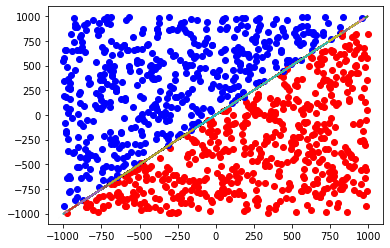

In [8]:
import matplotlib.pyplot as plt
cont = 0
for i in X:
    plt.plot(i[1],i[2],'ro' if (Y[cont] == 1.0) else 'bo')
    cont = cont + 1
for i in range(len(X)):#np.linspace(np.amin(X),np.amax(X)):
    x = X[i]
    yi = (W[0]/W[2]) - (W[1]/W[2]) * x
    plt.plot(x,yi)

# 2.2. Parte II – Experimentação

In [9]:
#Lendo Arquivo
a = np.fromfile("data3.txt")
X = np.array_split(a, 600)

#Inserindo viéis
Y = []
for i in range(len(X)):
    X[i] = np.insert(X[i],0, -1)
    
#Pegando as saídas esperadas    
for i in range(len(X)):
    Y.append(X[i][3])
    X[i] = np.delete(X[i],[3])



In [10]:
def impressao(vEpocas, vAjustes):
    print("Média da qtde das Épocas ", np.mean(vEpocas))
    print("Média da qtde dos Ajustes ", np.mean(vAjustes))
    print("Desvio padrão das Épocas ", np.std(vEpocas))
    print("Desvio padrão dos Ajustes ", np.std(vAjustes))
    

# Primeira configuração

In [11]:
vEpoca = []
vAjuste = []    
for i in range (100):    
    print("Rodada ", i + 1)
    (pred,W, epoca, qtdeAj) = train_perceptron(X, Y, -100, 100, 0.4)
    vEpoca.append(epoca)
    vAjuste.append(qtdeAj)
impressao(vEpoca, vAjuste)

Rodada  1
Epoch: 1 #################################
Vetor de pesos na época  1 : [ 46.77374835 -13.5247181  -51.57969082]
quantidade de exemplos corretos:  469
quantidade de exemplos errados:  131

Epoch: 2 #################################
Vetor de pesos na época  2 : [ -5.62625165  38.26452025 -31.80969059]
quantidade de exemplos corretos:  554
quantidade de exemplos errados:  46

Epoch: 3 #################################
Vetor de pesos na época  3 : [  3.17374835  41.24647461 -25.22871662]
quantidade de exemplos corretos:  577
quantidade de exemplos errados:  23

Epoch: 4 #################################
Vetor de pesos na época  4 : [  7.57374835  42.20406713 -21.79342724]
quantidade de exemplos corretos:  591
quantidade de exemplos errados:  9

Epoch: 5 #################################
Vetor de pesos na época  5 : [  9.57374835  42.21683278 -20.5581188 ]
quantidade de exemplos corretos:  594
quantidade de exemplos errados:  6

Epoch: 6 #################################
Vetor de

quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 11 #################################
Vetor de pesos na época  11 : [44.38937296 68.12283403  2.1318265 ]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 12 #################################
Vetor de pesos na época  12 : [43.98937296 68.36752957  2.52226148]
quantidade de exemplos corretos:  600
quantidade de exemplos errados:  0

pesos final:  [43.98937296 68.36752957  2.52226148]
quantidade de vezes que o peso foi ajustado:  117


Rodada  7
Epoch: 1 #################################
Vetor de pesos na época  1 : [-85.21953403  49.22998923 -58.39874445]
quantidade de exemplos corretos:  449
quantidade de exemplos errados:  151

Epoch: 2 #################################
Vetor de pesos na época  2 : [-25.61953403  50.23008592 -57.67349314]
quantidade de exemplos corretos:  489
quantidade de exemplos errados:  111

Epoch: 3 #################################
Vetor de pesos na é

Vetor de pesos na época  1 : [38.5125076  15.14432881  2.50844303]
quantidade de exemplos corretos:  562
quantidade de exemplos errados:  38

Epoch: 2 #################################
Vetor de pesos na época  2 : [23.3125076 29.7707341  2.8194406]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 3 #################################
Vetor de pesos na época  3 : [22.5125076  30.31805167  3.22895007]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 4 #################################
Vetor de pesos na época  4 : [22.1125076  30.56274721  3.61938504]
quantidade de exemplos corretos:  600
quantidade de exemplos errados:  0

pesos final:  [22.1125076  30.56274721  3.61938504]
quantidade de vezes que o peso foi ajustado:  41


Rodada  13
Epoch: 1 #################################
Vetor de pesos na época  1 : [ 10.70143285 -54.35595185  11.44304527]
quantidade de exemplos corretos:  491
quantidade de exemplos errados:  109

Epoch:

quantidade de exemplos corretos:  600
quantidade de exemplos errados:  0

pesos final:  [ 13.01310217  47.98114663 -15.80537692]
quantidade de vezes que o peso foi ajustado:  507


Rodada  17
Epoch: 1 #################################
Vetor de pesos na época  1 : [-43.96882481  75.47197048  96.63405133]
quantidade de exemplos corretos:  355
quantidade de exemplos errados:  245

Epoch: 2 #################################
Vetor de pesos na época  2 : [53.23117519 74.27519497 44.29247131]
quantidade de exemplos corretos:  590
quantidade de exemplos errados:  10

Epoch: 3 #################################
Vetor de pesos na época  3 : [56.43117519 73.93143273 40.20853439]
quantidade de exemplos corretos:  592
quantidade de exemplos errados:  8

Epoch: 4 #################################
Vetor de pesos na época  4 : [57.23117519 74.44930354 37.84624834]
quantidade de exemplos corretos:  595
quantidade de exemplos errados:  5

Epoch: 5 #################################
Vetor de pesos na época

quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 19 #################################
Vetor de pesos na época  19 : [ 19.47419045  78.58407039 -29.22311496]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 20 #################################
Vetor de pesos na época  20 : [ 19.47419045  78.74165762 -28.76859185]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 21 #################################
Vetor de pesos na época  21 : [ 19.87419045  78.65454932 -28.70450371]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 22 #################################
Vetor de pesos na época  22 : [ 19.87419045  78.81213655 -28.2499806 ]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 23 #################################
Vetor de pesos na época  23 : [ 20.27419045  78.72502825 -28.18589246]
quantidade de exemplos corretos:  598
quantidade de exe

quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 24 #################################
Vetor de pesos na época  24 : [ 20.36812051  77.18128907 -26.81307587]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 25 #################################
Vetor de pesos na época  25 : [ 20.76812051  77.09418077 -26.74898773]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 26 #################################
Vetor de pesos na época  26 : [ 20.76812051  77.251768   -26.29446462]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 27 #################################
Vetor de pesos na época  27 : [ 21.16812051  77.1646597  -26.23037648]
quantidade de exemplos corretos:  600
quantidade de exemplos errados:  0

pesos final:  [ 21.16812051  77.1646597  -26.23037648]
quantidade de vezes que o peso foi ajustado:  207


Rodada  23
Epoch: 1 #################################
Vetor de 

quantidade de exemplos errados:  2

Epoch: 10 #################################
Vetor de pesos na época  10 : [41.1392323  54.31146545 22.0171713 ]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 11 #################################
Vetor de pesos na época  11 : [41.1392323  54.51834263 21.48713843]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 12 #################################
Vetor de pesos na época  12 : [41.1392323  54.72521981 20.95710555]
quantidade de exemplos corretos:  600
quantidade de exemplos errados:  0

pesos final:  [41.1392323  54.72521981 20.95710555]
quantidade de vezes que o peso foi ajustado:  107


Rodada  28
Epoch: 1 #################################
Vetor de pesos na época  1 : [-17.54738339 -12.49015603 -63.00575776]
quantidade de exemplos corretos:  446
quantidade de exemplos errados:  154

Epoch: 2 #################################
Vetor de pesos na época  2 : [-27.14738339  22.97756714 -40

quantidade de exemplos errados:  66

Epoch: 2 #################################
Vetor de pesos na época  2 : [ 36.98191257  74.13500344 -20.004845  ]
quantidade de exemplos corretos:  597
quantidade de exemplos errados:  3

Epoch: 3 #################################
Vetor de pesos na época  3 : [ 35.78191257  74.98456617 -18.74036207]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 4 #################################
Vetor de pesos na época  4 : [ 34.98191257  75.52750295 -17.87779503]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 5 #################################
Vetor de pesos na época  5 : [ 34.58191257  75.77219849 -17.48736005]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 6 #################################
Vetor de pesos na época  6 : [ 34.18191257  76.01689403 -17.09692508]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 7 ###################

Vetor de pesos na época  13 : [51.16030532 68.13190067 25.93692278]
quantidade de exemplos corretos:  600
quantidade de exemplos errados:  0

pesos final:  [51.16030532 68.13190067 25.93692278]
quantidade de vezes que o peso foi ajustado:  48


Rodada  37
Epoch: 1 #################################
Vetor de pesos na época  1 : [18.16292624 87.29902703 85.89739329]
quantidade de exemplos corretos:  497
quantidade de exemplos errados:  103

Epoch: 2 #################################
Vetor de pesos na época  2 : [59.36292624 85.55350125 46.299577  ]
quantidade de exemplos corretos:  592
quantidade de exemplos errados:  8

Epoch: 3 #################################
Vetor de pesos na época  3 : [61.76292624 85.31614275 43.09963508]
quantidade de exemplos corretos:  594
quantidade de exemplos errados:  6

Epoch: 4 #################################
Vetor de pesos na época  4 : [63.36292624 85.21519893 40.73505588]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch:

Epoch: 7 #################################
Vetor de pesos na época  7 : [ 14.37062435  59.23394741 -28.24096218]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 8 #################################
Vetor de pesos na época  8 : [ 14.37062435  59.61956411 -27.23668691]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 9 #################################
Vetor de pesos na época  9 : [ 14.37062435  60.00518082 -26.23241164]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 10 #################################
Vetor de pesos na época  10 : [ 14.37062435  60.39079752 -25.22813637]
quantidade de exemplos corretos:  597
quantidade de exemplos errados:  3

Epoch: 11 #################################
Vetor de pesos na época  11 : [ 14.77062435  60.47817299 -24.69599317]
quantidade de exemplos corretos:  597
quantidade de exemplos errados:  3

Epoch: 12 #################################
Vetor de pesos na

Vetor de pesos na época  19 : [68.20613841 90.61097444 35.58640918]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 20 #################################
Vetor de pesos na época  20 : [68.20613841 90.81785162 35.05637631]
quantidade de exemplos corretos:  600
quantidade de exemplos errados:  0

pesos final:  [68.20613841 90.81785162 35.05637631]
quantidade de vezes que o peso foi ajustado:  140


Rodada  43
Epoch: 1 #################################
Vetor de pesos na época  1 : [-94.54259715 -18.54361391 -97.13883128]
quantidade de exemplos corretos:  372
quantidade de exemplos errados:  228

Epoch: 2 #################################
Vetor de pesos na época  2 : [-65.74259715  12.73478156 -66.42558127]
quantidade de exemplos corretos:  403
quantidade de exemplos errados:  197

Epoch: 3 #################################
Vetor de pesos na época  3 : [-26.14259715  32.43189658 -45.89248206]
quantidade de exemplos corretos:  489
quantidade de exemplos errad

Epoch: 13 #################################
Vetor de pesos na época  13 : [ 16.29072756  64.93390091 -26.03173903]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 14 #################################
Vetor de pesos na época  14 : [ 16.29072756  65.09148815 -25.57721592]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 15 #################################
Vetor de pesos na época  15 : [ 16.29072756  65.24907538 -25.12269281]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 16 #################################
Vetor de pesos na época  16 : [ 16.29072756  65.40666262 -24.6681697 ]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 17 #################################
Vetor de pesos na época  17 : [ 16.29072756  65.56424985 -24.21364659]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 18 #################################
Vetor de pe

quantidade de exemplos corretos:  561
quantidade de exemplos errados:  39

Epoch: 4 #################################
Vetor de pesos na época  4 : [  7.16713502  66.24872504 -39.77098024]
quantidade de exemplos corretos:  576
quantidade de exemplos errados:  24

Epoch: 5 #################################
Vetor de pesos na época  5 : [ 11.96713502  67.04622761 -36.39646657]
quantidade de exemplos corretos:  589
quantidade de exemplos errados:  11

Epoch: 6 #################################
Vetor de pesos na época  6 : [ 13.96713502  67.28722501 -34.74214964]
quantidade de exemplos corretos:  590
quantidade de exemplos errados:  10

Epoch: 7 #################################
Vetor de pesos na época  7 : [ 15.56713502  67.60661662 -33.10492531]
quantidade de exemplos corretos:  593
quantidade de exemplos errados:  7

Epoch: 8 #################################
Vetor de pesos na época  8 : [ 16.76713502  67.76815627 -31.94745783]
quantidade de exemplos corretos:  596
quantidade de exemplos 

quantidade de exemplos corretos:  589
quantidade de exemplos errados:  11

Epoch: 6 #################################
Vetor de pesos na época  6 : [  5.15185288  23.88685505 -10.08085902]
quantidade de exemplos corretos:  595
quantidade de exemplos errados:  5

Epoch: 7 #################################
Vetor de pesos na época  7 : [ 5.55185288 24.19335539 -9.04854081]
quantidade de exemplos corretos:  597
quantidade de exemplos errados:  3

Epoch: 8 #################################
Vetor de pesos na época  8 : [ 5.95185288 24.28073085 -8.51639761]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 9 #################################
Vetor de pesos na época  9 : [ 6.35185288 24.19362255 -8.45230947]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 10 #################################
Vetor de pesos na época  10 : [ 6.35185288 24.35120978 -7.99778636]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1



quantidade de exemplos corretos:  600
quantidade de exemplos errados:  0

pesos final:  [0.74068613 1.43973676 0.19971408]
quantidade de vezes que o peso foi ajustado:  335


Rodada  57
Epoch: 1 #################################
Vetor de pesos na época  1 : [ 31.51153248  75.14709956 -57.47704508]
quantidade de exemplos corretos:  572
quantidade de exemplos errados:  28

Epoch: 2 #################################
Vetor de pesos na época  2 : [ 20.31153248  84.84897165 -45.62772349]
quantidade de exemplos corretos:  589
quantidade de exemplos errados:  11

Epoch: 3 #################################
Vetor de pesos na época  3 : [ 19.91153248  86.31313438 -42.69195822]
quantidade de exemplos corretos:  592
quantidade de exemplos errados:  8

Epoch: 4 #################################
Vetor de pesos na época  4 : [ 21.51153248  86.40483763 -41.47291805]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 5 #################################
Vetor de pesos na épo

pesos final:  [ 22.81099468  82.8897325  -28.54763213]
quantidade de vezes que o peso foi ajustado:  218


Rodada  59
Epoch: 1 #################################
Vetor de pesos na época  1 : [-39.26518746  64.71187149  55.13149252]
quantidade de exemplos corretos:  410
quantidade de exemplos errados:  190

Epoch: 2 #################################
Vetor de pesos na época  2 : [36.73481254 62.92408147 23.00443388]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 3 #################################
Vetor de pesos na época  3 : [38.33481254 62.53117236 21.23222097]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 4 #################################
Vetor de pesos na época  4 : [39.13481254 62.30535572 20.33813442]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 5 #################################
Vetor de pesos na época  5 : [39.53481254 62.16744284 19.91841164]
quantidade de exemplos corretos

Vetor de pesos na época  5 : [ 16.15974749  85.31810303 -45.63768425]
quantidade de exemplos corretos:  589
quantidade de exemplos errados:  11

Epoch: 6 #################################
Vetor de pesos na época  6 : [ 18.15974749  85.55185261 -43.97557531]
quantidade de exemplos corretos:  591
quantidade de exemplos errados:  9

Epoch: 7 #################################
Vetor de pesos na época  7 : [ 20.15974749  85.56461826 -42.74026686]
quantidade de exemplos corretos:  593
quantidade de exemplos errados:  7

Epoch: 8 #################################
Vetor de pesos na época  8 : [ 21.35974749  85.73543788 -41.54926963]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 9 #################################
Vetor de pesos na época  9 : [ 21.35974749  86.12105458 -40.54499436]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 10 #################################
Vetor de pesos na época  10 : [ 21.35974749  86.50667129 -39.54

Vetor de pesos na época  3 : [  5.76244675  36.66384483 -20.11419624]
quantidade de exemplos corretos:  589
quantidade de exemplos errados:  11

Epoch: 4 #################################
Vetor de pesos na época  4 : [  7.76244675  36.99867561 -18.33724085]
quantidade de exemplos corretos:  593
quantidade de exemplos errados:  7

Epoch: 5 #################################
Vetor de pesos na época  5 : [  8.96244675  37.16021525 -17.17977337]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 6 #################################
Vetor de pesos na época  6 : [  8.96244675  37.54583196 -16.1754981 ]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 7 #################################
Vetor de pesos na época  7 : [  8.96244675  37.93144866 -15.17122283]
quantidade de exemplos corretos:  597
quantidade de exemplos errados:  3

Epoch: 8 #################################
Vetor de pesos na época  8 : [  9.36244675  38.01882412 -14.6390

Vetor de pesos na época  2 : [-54.78966005  -8.09956217 -38.44116524]
quantidade de exemplos corretos:  408
quantidade de exemplos errados:  192

Epoch: 3 #################################
Vetor de pesos na época  3 : [-18.78966005  12.83218124 -25.23859154]
quantidade de exemplos corretos:  517
quantidade de exemplos errados:  83

Epoch: 4 #################################
Vetor de pesos na época  4 : [ -2.38966005  20.1906398  -15.47401188]
quantidade de exemplos corretos:  571
quantidade de exemplos errados:  29

Epoch: 5 #################################
Vetor de pesos na época  5 : [  2.81033995  22.04086635 -11.10410279]
quantidade de exemplos corretos:  591
quantidade de exemplos errados:  9

Epoch: 6 #################################
Vetor de pesos na época  6 : [ 4.81033995 22.11063732 -9.84338569]
quantidade de exemplos corretos:  595
quantidade de exemplos errados:  5

Epoch: 7 #################################
Vetor de pesos na época  7 : [ 5.21033995 22.41713765 -8.8110674

quantidade de exemplos corretos:  532
quantidade de exemplos errados:  68

Epoch: 3 #################################
Vetor de pesos na época  3 : [  5.26745992  91.68439352 -61.29419986]
quantidade de exemplos corretos:  565
quantidade de exemplos errados:  35

Epoch: 4 #################################
Vetor de pesos na época  4 : [ 12.06745992  93.26042394 -56.30823263]
quantidade de exemplos corretos:  578
quantidade de exemplos errados:  22

Epoch: 5 #################################
Vetor de pesos na época  5 : [ 16.06745992  94.14306746 -52.98240888]
quantidade de exemplos corretos:  585
quantidade de exemplos errados:  15

Epoch: 6 #################################
Vetor de pesos na época  6 : [ 18.06745992  94.90187093 -50.39788619]
quantidade de exemplos corretos:  589
quantidade de exemplos errados:  11

Epoch: 7 #################################
Vetor de pesos na época  7 : [ 20.06745992  95.13562051 -48.73577725]
quantidade de exemplos corretos:  591
quantidade de exemplos

quantidade de exemplos corretos:  590
quantidade de exemplos errados:  10

Epoch: 5 #################################
Vetor de pesos na época  5 : [13.7955251  18.22677175  8.29096957]
quantidade de exemplos corretos:  597
quantidade de exemplos errados:  3

Epoch: 6 #################################
Vetor de pesos na época  6 : [14.1955251  18.34574517  7.28657292]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 7 #################################
Vetor de pesos na época  7 : [13.7955251  18.69053523  7.17626282]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 8 #################################
Vetor de pesos na época  8 : [13.7955251  18.89741241  6.64622994]
quantidade de exemplos corretos:  600
quantidade de exemplos errados:  0

pesos final:  [13.7955251  18.89741241  6.64622994]
quantidade de vezes que o peso foi ajustado:  390


Rodada  81
Epoch: 1 #################################
Vetor de pesos na época  1 : [-

quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 21 #################################
Vetor de pesos na época  21 : [ 22.5525515   90.90286388 -33.19836898]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 22 #################################
Vetor de pesos na época  22 : [ 22.9525515   90.81575558 -33.13428084]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 23 #################################
Vetor de pesos na época  23 : [ 22.9525515   90.97334281 -32.67975773]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 24 #################################
Vetor de pesos na época  24 : [ 23.3525515   90.88623451 -32.61566959]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 25 #################################
Vetor de pesos na época  25 : [ 23.7525515   90.7991262  -32.55158145]
quantidade de exemplos corretos:  598
quantidade de exe

quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 18 #################################
Vetor de pesos na época  18 : [65.20285723 86.53650392 33.57851248]
quantidade de exemplos corretos:  600
quantidade de exemplos errados:  0

pesos final:  [65.20285723 86.53650392 33.57851248]
quantidade de vezes que o peso foi ajustado:  138


Rodada  87
Epoch: 1 #################################
Vetor de pesos na época  1 : [-63.00018042  26.96268929 -83.79606153]
quantidade de exemplos corretos:  402
quantidade de exemplos errados:  198

Epoch: 2 #################################
Vetor de pesos na época  2 : [-27.80018042  48.58975085 -60.53878958]
quantidade de exemplos corretos:  481
quantidade de exemplos errados:  119

Epoch: 3 #################################
Vetor de pesos na época  3 : [ -4.20018042  58.47229018 -46.13863171]
quantidade de exemplos corretos:  550
quantidade de exemplos errados:  50

Epoch: 4 #################################
Vetor de pesos n

quantidade de exemplos corretos:  481
quantidade de exemplos errados:  119

Epoch: 3 #################################
Vetor de pesos na época  3 : [-10.09541161  -6.53886482  -1.12927248]
quantidade de exemplos corretos:  559
quantidade de exemplos errados:  41

Epoch: 4 #################################
Vetor de pesos na época  4 : [-2.49541161 -1.27684176 -0.7181178 ]
quantidade de exemplos corretos:  588
quantidade de exemplos errados:  12

Epoch: 5 #################################
Vetor de pesos na época  5 : [-0.89541161  0.62635049 -0.16650979]
quantidade de exemplos corretos:  597
quantidade de exemplos errados:  3

Epoch: 6 #################################
Vetor de pesos na época  6 : [0.30458839 0.63750523 0.01517886]
quantidade de exemplos corretos:  600
quantidade de exemplos errados:  0

pesos final:  [0.30458839 0.63750523 0.01517886]
quantidade de vezes que o peso foi ajustado:  399


Rodada  90
Epoch: 1 #################################
Vetor de pesos na época  1 : [ 

quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 23 #################################
Vetor de pesos na época  23 : [ 21.70723906  84.11760536 -29.86012221]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 24 #################################
Vetor de pesos na época  24 : [ 22.10723906  84.03049705 -29.79603407]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 25 #################################
Vetor de pesos na época  25 : [ 22.10723906  84.18808429 -29.34151096]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 26 #################################
Vetor de pesos na época  26 : [ 22.50723906  84.10097598 -29.27742282]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 27 #################################
Vetor de pesos na época  27 : [ 22.50723906  84.25856322 -28.82289971]
quantidade de exemplos corretos:  599
quantidade de exe

quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 6 #################################
Vetor de pesos na época  6 : [ 60.42874208 120.72537172 -24.80135995]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 7 #################################
Vetor de pesos na época  7 : [ 60.02874208 120.97006726 -24.41092498]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 8 #################################
Vetor de pesos na época  8 : [ 59.62874208 121.21476279 -24.02049001]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 9 #################################
Vetor de pesos na época  9 : [ 59.22874208 121.45945833 -23.63005504]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 10 #################################
Vetor de pesos na época  10 : [ 58.82874208 121.70415387 -23.23962007]
quantidade de exemplos corretos:  599
quantidade de exemplos er

# Grafico 1

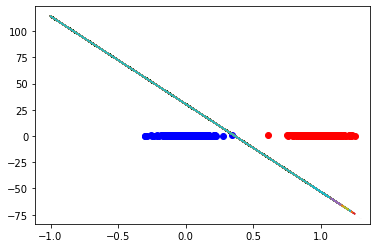

In [12]:
cont = 0
for i in X:
    plt.plot(i[1],i[2],'ro' if (Y[cont] == 1.0) else 'bo')
    cont = cont + 1
for i in range(len(X)):#np.linspace(np.amin(X),np.amax(X)):
    x = X[i]
    yi = (W[0]/W[2]) - (W[1]/W[2]) * x
    plt.plot(x,yi)

# Segunda configuração

In [13]:
vEpoca = []
vAjuste = []   
for i in range (100):
    print("Rodada ", i + 1)
    (pred,W, epoca, qtdeAj) = train_perceptron(X, Y, -1, 1, 0.4)
    vEpoca.append(epoca)
    vAjuste.append(qtdeAj)
impressao(vEpoca, vAjuste)

Rodada  1
Epoch: 1 #################################
Vetor de pesos na época  1 : [ 0.4249391   0.19580545 -0.70171811]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 2 #################################
Vetor de pesos na época  2 : [-0.3750609   0.98603678 -0.50746327]
quantidade de exemplos corretos:  597
quantidade de exemplos errados:  3

Epoch: 3 #################################
Vetor de pesos na época  3 : [0.0249391  1.29286444 0.03855406]
quantidade de exemplos corretos:  597
quantidade de exemplos errados:  3

Epoch: 4 #################################
Vetor de pesos na época  4 : [ 0.4249391   1.46773353 -0.03687937]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 5 #################################
Vetor de pesos na época  5 : [ 0.4249391   1.66725385 -0.16201543]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 6 #################################
Vetor de pesos na época  6 : [

quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 3 #################################
Vetor de pesos na época  3 : [0.21384757 0.97923476 0.39501295]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 4 #################################
Vetor de pesos na época  4 : [0.21384757 1.49973557 0.17343686]
quantidade de exemplos corretos:  597
quantidade de exemplos errados:  3

Epoch: 5 #################################
Vetor de pesos na época  5 : [ 0.61384757  1.58532837 -0.19916849]
quantidade de exemplos corretos:  600
quantidade de exemplos errados:  0

pesos final:  [ 0.61384757  1.58532837 -0.19916849]
quantidade de vezes que o peso foi ajustado:  12


Rodada  16
Epoch: 1 #################################
Vetor de pesos na época  1 : [ 0.05583019  0.38933848 -0.124068  ]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 2 #################################
Vetor de pesos na época  2 : [ 0.055830

quantidade de exemplos corretos:  597
quantidade de exemplos errados:  3

Epoch: 3 #################################
Vetor de pesos na época  3 : [-0.06374505  1.05021592 -0.08597842]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 4 #################################
Vetor de pesos na época  4 : [ 0.33625495  1.02556468 -0.03627578]
quantidade de exemplos corretos:  600
quantidade de exemplos errados:  0

pesos final:  [ 0.33625495  1.02556468 -0.03627578]
quantidade de vezes que o peso foi ajustado:  6


Rodada  29
Epoch: 1 #################################
Vetor de pesos na época  1 : [-0.34701723 -0.31377898 -0.66388229]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 2 #################################
Vetor de pesos na época  2 : [-0.34701723  0.51464604 -0.56973916]
quantidade de exemplos corretos:  597
quantidade de exemplos errados:  3

Epoch: 3 #################################
Vetor de pesos na época  3 : [ 0.0

Vetor de pesos na época  2 : [ 0.01321674  0.99905362 -0.30605218]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 3 #################################
Vetor de pesos na época  3 : [0.01321674 1.21909792 0.13408543]
quantidade de exemplos corretos:  597
quantidade de exemplos errados:  3

Epoch: 4 #################################
Vetor de pesos na época  4 : [0.41321674 1.44973585 0.05744487]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 5 #################################
Vetor de pesos na época  5 : [0.41321674 1.65780263 0.08359366]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 6 #################################
Vetor de pesos na época  6 : [0.81321674 1.5475278  0.04692685]
quantidade de exemplos corretos:  600
quantidade de exemplos errados:  0

pesos final:  [0.81321674 1.5475278  0.04692685]
quantidade de vezes que o peso foi ajustado:  11


Rodada  43
Epoch: 1 ###############

Epoch: 3 #################################
Vetor de pesos na época  3 : [ 0.31140083  1.1159388  -0.29766897]
quantidade de exemplos corretos:  600
quantidade de exemplos errados:  0

pesos final:  [ 0.31140083  1.1159388  -0.29766897]
quantidade de vezes que o peso foi ajustado:  4


Rodada  52
Epoch: 1 #################################
Vetor de pesos na época  1 : [-0.72966269  0.81539855  0.30660305]
quantidade de exemplos corretos:  595
quantidade de exemplos errados:  5

Epoch: 2 #################################
Vetor de pesos na época  2 : [ 0.47033731  1.14542754 -0.02941405]
quantidade de exemplos corretos:  600
quantidade de exemplos errados:  0

pesos final:  [ 0.47033731  1.14542754 -0.02941405]
quantidade de vezes que o peso foi ajustado:  5


Rodada  53
Epoch: 1 #################################
Vetor de pesos na época  1 : [ 0.1974021  0.1592039 -0.836203 ]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 2 ################################

quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 5 #################################
Vetor de pesos na época  5 : [0.61926844 0.96748954 0.08625926]
quantidade de exemplos corretos:  600
quantidade de exemplos errados:  0

pesos final:  [0.61926844 0.96748954 0.08625926]
quantidade de vezes que o peso foi ajustado:  9


Rodada  64
Epoch: 1 #################################
Vetor de pesos na época  1 : [-0.22972773  0.37627798  0.04418363]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 2 #################################
Vetor de pesos na época  2 : [-0.22972773  1.06826051  0.01849605]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 3 #################################
Vetor de pesos na época  3 : [0.57027227 0.9644929  0.09624162]
quantidade de exemplos corretos:  600
quantidade de exemplos errados:  0

pesos final:  [0.57027227 0.9644929  0.09624162]
quantidade de vezes que o peso foi aj

quantidade de exemplos errados:  1

Epoch: 4 #################################
Vetor de pesos na época  4 : [ 0.42550014  0.7478416  -0.02489414]
quantidade de exemplos corretos:  600
quantidade de exemplos errados:  0

pesos final:  [ 0.42550014  0.7478416  -0.02489414]
quantidade de vezes que o peso foi ajustado:  10


Rodada  77
Epoch: 1 #################################
Vetor de pesos na época  1 : [0.2074081  0.75564026 0.88758314]
quantidade de exemplos corretos:  597
quantidade de exemplos errados:  3

Epoch: 2 #################################
Vetor de pesos na época  2 : [0.6074081  1.09974074 0.30441526]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 3 #################################
Vetor de pesos na época  3 : [ 0.6074081   1.35712043 -0.09461162]
quantidade de exemplos corretos:  600
quantidade de exemplos errados:  0

pesos final:  [ 0.6074081   1.35712043 -0.09461162]
quantidade de vezes que o peso foi ajustado:  5


Rodada  78
Epoch: 

quantidade de exemplos corretos:  600
quantidade de exemplos errados:  0

pesos final:  [ 0.54902192  1.37158619 -0.18809839]
quantidade de vezes que o peso foi ajustado:  13


Rodada  87
Epoch: 1 #################################
Vetor de pesos na época  1 : [-0.72981065  0.58390961  0.08779979]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 2 #################################
Vetor de pesos na época  2 : [0.07018935 0.8706939  0.27322539]
quantidade de exemplos corretos:  597
quantidade de exemplos errados:  3

Epoch: 3 #################################
Vetor de pesos na época  3 : [ 0.47018935  1.16223165 -0.21999347]
quantidade de exemplos corretos:  600
quantidade de exemplos errados:  0

pesos final:  [ 0.47018935  1.16223165 -0.21999347]
quantidade de vezes que o peso foi ajustado:  7


Rodada  88
Epoch: 1 #################################
Vetor de pesos na época  1 : [0.52974681 0.59680469 0.14482732]
quantidade de exemplos corretos:  599
quant

Vetor de pesos na época  1 : [-0.31510532  0.61480388 -0.04952701]
quantidade de exemplos corretos:  597
quantidade de exemplos errados:  3

Epoch: 2 #################################
Vetor de pesos na época  2 : [0.08489468 0.85128144 0.0543557 ]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 3 #################################
Vetor de pesos na época  3 : [0.48489468 0.77216507 0.08239863]
quantidade de exemplos corretos:  600
quantidade de exemplos errados:  0

pesos final:  [0.48489468 0.77216507 0.08239863]
quantidade de vezes que o peso foi ajustado:  4


Média da qtde das Épocas  3.97
Média da qtde dos Ajustes  8.16
Desvio padrão das Épocas  1.3744453426746368
Desvio padrão dos Ajustes  3.979246159764435


# Gráfico 2

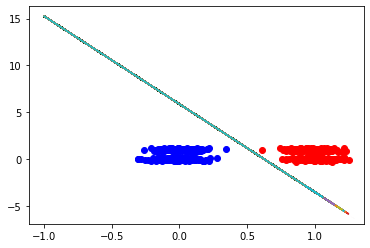

In [14]:
cont = 0
for i in X:
    plt.plot(i[1],i[2],'ro' if (Y[cont] == 1.0) else 'bo')
    cont = cont + 1
for i in range(len(X)):#np.linspace(np.amin(X),np.amax(X)):
    x = X[i]
    yi = (W[0]/W[2]) - (W[1]/W[2]) * x
    plt.plot(x,yi)

# Terceira configuração

In [15]:
vEpoca = []
vAjuste = [] 
for i in range (100):
    print("Rodada ", i + 1)
    (pred,W, epoca, qtdeAj) = train_perceptron(X, Y, -0.5, 0.5, 0.4)
    vEpoca.append(epoca)
    vAjuste.append(qtdeAj)
impressao(vEpoca, vAjuste)

Rodada  1
Epoch: 1 #################################
Vetor de pesos na época  1 : [ 0.16580486  0.29769636 -0.46569852]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 2 #################################
Vetor de pesos na época  2 : [-0.23419514  0.63512955 -0.17111181]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 3 #################################
Vetor de pesos na época  3 : [ 0.16580486  0.61047832 -0.12140917]
quantidade de exemplos corretos:  600
quantidade de exemplos errados:  0

pesos final:  [ 0.16580486  0.61047832 -0.12140917]
quantidade de vezes que o peso foi ajustado:  2


Rodada  2
Epoch: 1 #################################
Vetor de pesos na época  1 : [0.18945961 0.03009807 0.09485347]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 2 #################################
Vetor de pesos na época  2 : [-0.21054039  0.48289621 -0.00547841]
quantidade de exemplos corretos:  5

Epoch: 4 #################################
Vetor de pesos na época  4 : [-0.07164126  1.29309816  0.04632863]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 5 #################################
Vetor de pesos na época  5 : [0.72835874 1.1581721  0.05936446]
quantidade de exemplos corretos:  600
quantidade de exemplos errados:  0

pesos final:  [0.72835874 1.1581721  0.05936446]
quantidade de vezes que o peso foi ajustado:  11


Rodada  15
Epoch: 1 #################################
Vetor de pesos na época  1 : [-0.34670293  0.17047959 -0.49292887]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 2 #################################
Vetor de pesos na época  2 : [-0.34670293  0.99491288 -0.01614364]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 3 #################################
Vetor de pesos na época  3 : [0.45329707 0.89114527 0.06160193]
quantidade de exemplos corretos:  600
quantidade 

Vetor de pesos na época  3 : [-0.08361658  0.8880599   0.08219951]
quantidade de exemplos corretos:  597
quantidade de exemplos errados:  3

Epoch: 4 #################################
Vetor de pesos na época  4 : [ 0.31638342  1.11870538 -0.29915715]
quantidade de exemplos corretos:  600
quantidade de exemplos errados:  0

pesos final:  [ 0.31638342  1.11870538 -0.29915715]
quantidade de vezes que o peso foi ajustado:  6


Rodada  25
Epoch: 1 #################################
Vetor de pesos na época  1 : [-0.00573021 -0.17321653 -0.26411445]
quantidade de exemplos corretos:  597
quantidade de exemplos errados:  3

Epoch: 2 #################################
Vetor de pesos na época  2 : [-0.40573021  0.59236357 -0.02015697]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 3 #################################
Vetor de pesos na época  3 : [0.39426979 0.55321158 0.07998879]
quantidade de exemplos corretos:  600
quantidade de exemplos errados:  0

pesos final: 

quantidade de exemplos errados:  3

Epoch: 3 #################################
Vetor de pesos na época  3 : [0.19232108 0.9654727  0.05649933]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 4 #################################
Vetor de pesos na época  4 : [0.59232108 0.87836439 0.12058747]
quantidade de exemplos corretos:  600
quantidade de exemplos errados:  0

pesos final:  [0.59232108 0.87836439 0.12058747]
quantidade de vezes que o peso foi ajustado:  5


Rodada  38
Epoch: 1 #################################
Vetor de pesos na época  1 : [-0.2536758   0.16834785 -0.48670348]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 2 #################################
Vetor de pesos na época  2 : [-0.2536758   0.53898919 -0.41630495]
quantidade de exemplos corretos:  597
quantidade de exemplos errados:  3

Epoch: 3 #################################
Vetor de pesos na época  3 : [ 0.1463242   0.82252222 -0.28181827]
quantidade de 

pesos final:  [ 0.33713322  0.71548241 -0.06905749]
quantidade de vezes que o peso foi ajustado:  7


Rodada  51
Epoch: 1 #################################
Vetor de pesos na época  1 : [ 0.36820183  0.38938112 -0.36553541]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 2 #################################
Vetor de pesos na época  2 : [-0.03179817  0.78467369 -0.34483952]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 3 #################################
Vetor de pesos na época  3 : [-0.03179817  1.1060021   0.15073469]
quantidade de exemplos corretos:  597
quantidade de exemplos errados:  3

Epoch: 4 #################################
Vetor de pesos na época  4 : [ 0.36820183  1.31466462 -0.17546186]
quantidade de exemplos corretos:  600
quantidade de exemplos errados:  0

pesos final:  [ 0.36820183  1.31466462 -0.17546186]
quantidade de vezes que o peso foi ajustado:  6


Rodada  52
Epoch: 1 #############################

quantidade de exemplos corretos:  600
quantidade de exemplos errados:  0

pesos final:  [ 0.41700292  1.47661062 -0.14251545]
quantidade de vezes que o peso foi ajustado:  11


Rodada  64
Epoch: 1 #################################
Vetor de pesos na época  1 : [-0.00773219 -0.4854776  -0.17786951]
quantidade de exemplos corretos:  597
quantidade de exemplos errados:  3

Epoch: 2 #################################
Vetor de pesos na época  2 : [-0.40773219  0.50538169 -0.12069345]
quantidade de exemplos corretos:  597
quantidade de exemplos errados:  3

Epoch: 3 #################################
Vetor de pesos na época  3 : [-0.00773219  0.76885175 -0.0014732 ]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 4 #################################
Vetor de pesos na época  4 : [0.39226781 0.74420051 0.04822944]
quantidade de exemplos corretos:  600
quantidade de exemplos errados:  0

pesos final:  [0.39226781 0.74420051 0.04822944]
quantidade de vezes que o peso

quantidade de exemplos corretos:  597
quantidade de exemplos errados:  3

Epoch: 4 #################################
Vetor de pesos na época  4 : [ 0.37838613  1.15647689 -0.27128208]
quantidade de exemplos corretos:  600
quantidade de exemplos errados:  0

pesos final:  [ 0.37838613  1.15647689 -0.27128208]
quantidade de vezes que o peso foi ajustado:  9


Rodada  78
Epoch: 1 #################################
Vetor de pesos na época  1 : [-0.22722309  0.45277427  0.1639308 ]
quantidade de exemplos corretos:  597
quantidade de exemplos errados:  3

Epoch: 2 #################################
Vetor de pesos na época  2 : [ 0.17277691  0.81161289 -0.28167213]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 3 #################################
Vetor de pesos na época  3 : [ 0.17277691  1.03511856 -0.2345547 ]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 4 #################################
Vetor de pesos na época  4 : [0.17

quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 3 #################################
Vetor de pesos na época  3 : [0.30623665 0.7414567  0.01503045]
quantidade de exemplos corretos:  600
quantidade de exemplos errados:  0

pesos final:  [0.30623665 0.7414567  0.01503045]
quantidade de vezes que o peso foi ajustado:  3


Rodada  90
Epoch: 1 #################################
Vetor de pesos na época  1 : [-0.22940471 -0.1268382  -0.49089731]
quantidade de exemplos corretos:  597
quantidade de exemplos errados:  3

Epoch: 2 #################################
Vetor de pesos na época  2 : [-0.62940471  0.64728836 -0.09565498]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 3 #################################
Vetor de pesos na época  3 : [0.17059529 0.9579616  0.01961964]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 4 #################################
Vetor de pesos na época  4 : [0.57059529 0.

# Gráfico 3

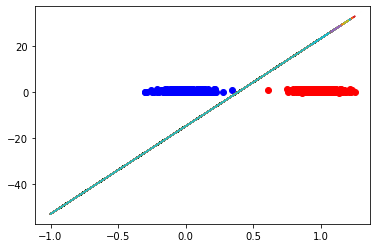

In [16]:
cont = 0
for i in X:
    plt.plot(i[1],i[2],'ro' if (Y[cont] == 1.0) else 'bo')
    cont = cont + 1
for i in range(len(X)):#np.linspace(np.amin(X),np.amax(X)):
    x = X[i]
    yi = (W[0]/W[2]) - (W[1]/W[2]) * x
    plt.plot(x,yi)

# Quarta configuração

In [17]:
vEpoca = []
vAjuste = [] 
for i in range (100):
    print("Rodada ", i + 1)
    (pred,W, epoca, qtdeAj) = train_perceptron(X, Y, -100, 100, 0.1)
    vEpoca.append(epoca)
    vAjuste.append(qtdeAj)
impressao(vEpoca, vAjuste)

Rodada  1
Epoch: 1 #################################
Vetor de pesos na época  1 : [ 18.53030333  58.95650935 -31.30677356]
quantidade de exemplos corretos:  587
quantidade de exemplos errados:  13

Epoch: 2 #################################
Vetor de pesos na época  2 : [ 17.23030333  59.99962833 -29.89007907]
quantidade de exemplos corretos:  591
quantidade de exemplos errados:  9

Epoch: 3 #################################
Vetor de pesos na época  3 : [ 16.53030333  60.59547954 -29.00868053]
quantidade de exemplos corretos:  597
quantidade de exemplos errados:  3

Epoch: 4 #################################
Vetor de pesos na época  4 : [ 16.43030333  60.70943666 -28.77701674]
quantidade de exemplos corretos:  597
quantidade de exemplos errados:  3

Epoch: 5 #################################
Vetor de pesos na época  5 : [ 16.33030333  60.82339378 -28.54535294]
quantidade de exemplos corretos:  597
quantidade de exemplos errados:  3

Epoch: 6 #################################
Vetor de pe


Epoch: 62 #################################
Vetor de pesos na época  62 : [ 17.13030333  63.04560449 -21.78508089]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 63 #################################
Vetor de pesos na época  63 : [ 17.23030333  63.02382742 -21.76905886]
quantidade de exemplos corretos:  600
quantidade de exemplos errados:  0

pesos final:  [ 17.23030333  63.02382742 -21.76905886]
quantidade de vezes que o peso foi ajustado:  149


Rodada  2
Epoch: 1 #################################
Vetor de pesos na época  1 : [  9.071049   -49.18236017  18.23466029]
quantidade de exemplos corretos:  285
quantidade de exemplos errados:  315

Epoch: 2 #################################
Vetor de pesos na época  2 : [ -7.828951   -24.34551766  20.63901731]
quantidade de exemplos corretos:  243
quantidade de exemplos errados:  357

Epoch: 3 #################################
Vetor de pesos na época  3 : [-2.528951   -8.56809254  9.80990871]
quantidade de ex

quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 13 #################################
Vetor de pesos na época  13 : [6.7819278  8.92702403 3.66379642]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 14 #################################
Vetor de pesos na época  14 : [6.7819278  8.97874332 3.5312882 ]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 15 #################################
Vetor de pesos na época  15 : [6.7819278  9.03046262 3.39877998]
quantidade de exemplos corretos:  600
quantidade de exemplos errados:  0

pesos final:  [6.7819278  9.03046262 3.39877998]
quantidade de vezes que o peso foi ajustado:  1854


Rodada  7
Epoch: 1 #################################
Vetor de pesos na época  1 : [-17.24517577  69.65943755  46.94529748]
quantidade de exemplos corretos:  324
quantidade de exemplos errados:  276

Epoch: 2 #################################
Vetor de pesos na época  2 : [10.

quantidade de exemplos corretos:  590
quantidade de exemplos errados:  10

Epoch: 17 #################################
Vetor de pesos na época  17 : [ 19.65334253  88.91136162 -44.5238289 ]
quantidade de exemplos corretos:  591
quantidade de exemplos errados:  9

Epoch: 18 #################################
Vetor de pesos na época  18 : [ 20.15334253  88.90671873 -44.22823556]
quantidade de exemplos corretos:  592
quantidade de exemplos errados:  8

Epoch: 19 #################################
Vetor de pesos na época  19 : [ 20.55334253  88.92964454 -43.92347552]
quantidade de exemplos corretos:  592
quantidade de exemplos errados:  8

Epoch: 20 #################################
Vetor de pesos na época  20 : [ 20.95334253  88.95257035 -43.61871547]
quantidade de exemplos corretos:  593
quantidade de exemplos errados:  7

Epoch: 21 #################################
Vetor de pesos na época  21 : [ 21.25334253  88.99527525 -43.32096617]
quantidade de exemplos corretos:  593
quantidade de ex

quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 76 #################################
Vetor de pesos na época  76 : [ 23.15334253  92.01993925 -33.86527492]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 77 #################################
Vetor de pesos na época  77 : [ 23.15334253  92.05933606 -33.75164414]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 78 #################################
Vetor de pesos na época  78 : [ 23.25334253  92.03755898 -33.7356221 ]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 79 #################################
Vetor de pesos na época  79 : [ 23.35334253  92.0157819  -33.71960007]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 80 #################################
Vetor de pesos na época  80 : [ 23.35334253  92.05517871 -33.60596929]
quantidade de exemplos corretos:  599
quantidade de exe

quantidade de exemplos corretos:  403
quantidade de exemplos errados:  197

Epoch: 5 #################################
Vetor de pesos na época  5 : [-29.8700485   14.09891888 -37.49511942]
quantidade de exemplos corretos:  401
quantidade de exemplos errados:  199

Epoch: 6 #################################
Vetor de pesos na época  6 : [-19.7700485   18.89084081 -32.19744932]
quantidade de exemplos corretos:  405
quantidade de exemplos errados:  195

Epoch: 7 #################################
Vetor de pesos na época  7 : [ -9.6700485   23.39175895 -27.10960883]
quantidade de exemplos corretos:  456
quantidade de exemplos errados:  144

Epoch: 8 #################################
Vetor de pesos na época  8 : [ -2.6700485   26.50259697 -22.72737184]
quantidade de exemplos corretos:  521
quantidade de exemplos errados:  79

Epoch: 9 #################################
Vetor de pesos na época  9 : [  1.0299515   27.88185508 -19.99975071]
quantidade de exemplos corretos:  555
quantidade de exem

quantidade de exemplos corretos:  586
quantidade de exemplos errados:  14

Epoch: 7 #################################
Vetor de pesos na época  7 : [6.468983   8.33083974 4.66768122]
quantidade de exemplos corretos:  591
quantidade de exemplos errados:  9

Epoch: 8 #################################
Vetor de pesos na época  8 : [6.568983   8.53933105 4.07554388]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 9 #################################
Vetor de pesos na época  9 : [6.568983   8.64472992 3.82921334]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 10 #################################
Vetor de pesos na época  10 : [6.568983   8.69644921 3.69670512]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 11 #################################
Vetor de pesos na época  11 : [6.568983   8.74816851 3.5641969 ]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 12 ######

quantidade de exemplos corretos:  597
quantidade de exemplos errados:  3

Epoch: 33 #################################
Vetor de pesos na época  33 : [ 11.37862417  44.83916929 -18.07437674]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 34 #################################
Vetor de pesos na época  34 : [ 11.37862417  44.8785661  -17.96074597]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 35 #################################
Vetor de pesos na época  35 : [ 11.37862417  44.91796291 -17.84711519]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 36 #################################
Vetor de pesos na época  36 : [ 11.37862417  44.95735972 -17.73348441]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 37 #################################
Vetor de pesos na época  37 : [ 11.37862417  44.99675652 -17.61985363]
quantidade de exemplos corretos:  598
quantidade de exe

quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 27 #################################
Vetor de pesos na época  27 : [30.41225391 39.81996061 17.58823573]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 28 #################################
Vetor de pesos na época  28 : [30.41225391 39.8716799  17.45572751]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 29 #################################
Vetor de pesos na época  29 : [30.41225391 39.9233992  17.32321929]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 30 #################################
Vetor de pesos na época  30 : [30.41225391 39.9751185  17.19071107]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 31 #################################
Vetor de pesos na época  31 : [30.41225391 40.02683779 17.05820285]
quantidade de exemplos corretos:  598
quantidade de exemplos errados: 

quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 33 #################################
Vetor de pesos na época  33 : [23.18164666 81.84248654 -3.94614519]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 34 #################################
Vetor de pesos na época  34 : [23.28164666 81.80800833 -4.05107588]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 35 #################################
Vetor de pesos na época  35 : [23.38164666 81.77353011 -4.15600658]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 36 #################################
Vetor de pesos na época  36 : [23.48164666 81.73905189 -4.26093727]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 37 #################################
Vetor de pesos na época  37 : [23.58164666 81.70457367 -4.36586797]
quantidade de exemplos corretos:  599
quantidade de exemplos errados: 

quantidade de exemplos corretos:  510
quantidade de exemplos errados:  90

Epoch: 6 #################################
Vetor de pesos na época  6 : [29.6197688  34.82493637 27.03009229]
quantidade de exemplos corretos:  565
quantidade de exemplos errados:  35

Epoch: 7 #################################
Vetor de pesos na época  7 : [29.9197688  35.9507072  24.84258735]
quantidade de exemplos corretos:  579
quantidade de exemplos errados:  21

Epoch: 8 #################################
Vetor de pesos na época  8 : [30.0197688  36.60856707 23.54475057]
quantidade de exemplos corretos:  586
quantidade de exemplos errados:  14

Epoch: 9 #################################
Vetor de pesos na época  9 : [30.0197688  37.05201355 22.69615158]
quantidade de exemplos corretos:  589
quantidade de exemplos errados:  11

Epoch: 10 #################################
Vetor de pesos na época  10 : [30.1197688  37.33095603 21.98475439]
quantidade de exemplos corretos:  591
quantidade de exemplos errados:  9


quantidade de exemplos corretos:  424
quantidade de exemplos errados:  176

Epoch: 4 #################################
Vetor de pesos na época  4 : [ -5.79506878  28.54482755 -27.85322877]
quantidade de exemplos corretos:  490
quantidade de exemplos errados:  110

Epoch: 5 #################################
Vetor de pesos na época  5 : [ -0.59506878  30.71511938 -24.20835239]
quantidade de exemplos corretos:  536
quantidade de exemplos errados:  64

Epoch: 6 #################################
Vetor de pesos na época  6 : [  2.20493122  31.81679798 -21.83223391]
quantidade de exemplos corretos:  562
quantidade de exemplos errados:  38

Epoch: 7 #################################
Vetor de pesos na época  7 : [  3.80493122  32.360382   -20.36661726]
quantidade de exemplos corretos:  571
quantidade de exemplos errados:  29

Epoch: 8 #################################
Vetor de pesos na época  8 : [  4.90493122  32.78378221 -19.17891861]
quantidade de exemplos corretos:  581
quantidade de exempl

Epoch: 9 #################################
Vetor de pesos na época  9 : [36.98936451 72.3254435  21.63601948]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 10 #################################
Vetor de pesos na época  10 : [37.38936451 72.22721623 21.19296626]
quantidade de exemplos corretos:  597
quantidade de exemplos errados:  3

Epoch: 11 #################################
Vetor de pesos na época  11 : [37.68936451 72.14952496 20.85514551]
quantidade de exemplos corretos:  597
quantidade de exemplos errados:  3

Epoch: 12 #################################
Vetor de pesos na época  12 : [37.98936451 72.07183368 20.51732476]
quantidade de exemplos corretos:  597
quantidade de exemplos errados:  3

Epoch: 13 #################################
Vetor de pesos na época  13 : [38.28936451 71.99414241 20.17950401]
quantidade de exemplos corretos:  597
quantidade de exemplos errados:  3

Epoch: 14 #################################
Vetor de pesos na época  14 

Vetor de pesos na época  13 : [ 9.66530756 12.63356804  5.56225122]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 14 #################################
Vetor de pesos na época  14 : [ 9.66530756 12.68528734  5.429743  ]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 15 #################################
Vetor de pesos na época  15 : [ 9.66530756 12.73700663  5.29723478]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 16 #################################
Vetor de pesos na época  16 : [ 9.66530756 12.78872593  5.16472656]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 17 #################################
Vetor de pesos na época  17 : [ 9.66530756 12.84044523  5.03221834]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 18 #################################
Vetor de pesos na época  18 : [ 9.66530756 12.89216452  4.89971012]
qu

quantidade de exemplos corretos:  584
quantidade de exemplos errados:  16

Epoch: 5 #################################
Vetor de pesos na época  5 : [29.50957337 96.06720812 14.90079177]
quantidade de exemplos corretos:  592
quantidade de exemplos errados:  8

Epoch: 6 #################################
Vetor de pesos na época  6 : [30.30957337 95.90489911 14.02893747]
quantidade de exemplos corretos:  594
quantidade de exemplos errados:  6

Epoch: 7 #################################
Vetor de pesos na época  7 : [30.90957337 95.77256816 13.37704357]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 8 #################################
Vetor de pesos na época  8 : [31.30957337 95.67434088 12.93399034]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 9 #################################
Vetor de pesos na época  9 : [31.70957337 95.57611361 12.49093711]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch

quantidade de exemplos errados:  1

Epoch: 52 #################################
Vetor de pesos na época  52 : [37.20957337 93.83567411  6.5997102 ]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 53 #################################
Vetor de pesos na época  53 : [37.30957337 93.80119589  6.49477951]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 54 #################################
Vetor de pesos na época  54 : [37.40957337 93.76671767  6.38984881]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 55 #################################
Vetor de pesos na época  55 : [37.50957337 93.73223945  6.28491812]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 56 #################################
Vetor de pesos na época  56 : [37.60957337 93.69776123  6.17998742]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 57 ########################

Epoch: 45 #################################
Vetor de pesos na época  45 : [ 22.00776684  87.48022225 -39.09246626]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 46 #################################
Vetor de pesos na época  46 : [ 22.00776684  87.57662643 -38.84139744]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 47 #################################
Vetor de pesos na época  47 : [ 22.00776684  87.67303061 -38.59032862]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 48 #################################
Vetor de pesos na época  48 : [ 22.00776684  87.76943478 -38.33925981]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 49 #################################
Vetor de pesos na época  49 : [ 22.00776684  87.86583896 -38.08819099]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 50 #################################
Vetor de pe


Epoch: 112 #################################
Vetor de pesos na época  112 : [ 23.90776684  89.68867564 -31.51175908]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 113 #################################
Vetor de pesos na época  113 : [ 24.00776684  89.66689856 -31.49573704]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 114 #################################
Vetor de pesos na época  114 : [ 24.10776684  89.64512148 -31.47971501]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 115 #################################
Vetor de pesos na época  115 : [ 24.10776684  89.68451829 -31.36608423]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 116 #################################
Vetor de pesos na época  116 : [ 24.20776684  89.66274122 -31.35006219]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 117 #################################

quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 43 #################################
Vetor de pesos na época  43 : [68.77595098 90.31888716 38.91278185]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 44 #################################
Vetor de pesos na época  44 : [68.77595098 90.37060645 38.78027363]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 45 #################################
Vetor de pesos na época  45 : [68.77595098 90.42232575 38.64776541]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 46 #################################
Vetor de pesos na época  46 : [68.77595098 90.47404504 38.51525719]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 47 #################################
Vetor de pesos na época  47 : [68.77595098 90.52576434 38.38274897]
quantidade de exemplos corretos:  598
quantidade de exemplos errados: 

Vetor de pesos na época  23 : [ 2.95630144 11.07182519 -3.7611115 ]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 24 #################################
Vetor de pesos na época  24 : [ 3.05630144 11.05004811 -3.74508946]
quantidade de exemplos corretos:  600
quantidade de exemplos errados:  0

pesos final:  [ 3.05630144 11.05004811 -3.74508946]
quantidade de vezes que o peso foi ajustado:  2776


Rodada  30
Epoch: 1 #################################
Vetor de pesos na época  1 : [-23.69927707 -98.41808393 -98.81070115]
quantidade de exemplos corretos:  163
quantidade de exemplos errados:  437

Epoch: 2 #################################
Vetor de pesos na época  2 : [-39.99927707 -68.30481683 -83.52472168]
quantidade de exemplos corretos:  151
quantidade de exemplos errados:  449

Epoch: 3 #################################
Vetor de pesos na época  3 : [-55.09927707 -38.28626756 -68.39721395]
quantidade de exemplos corretos:  269
quantidade de exemplos erra

quantidade de exemplos corretos:  590
quantidade de exemplos errados:  10

Epoch: 14 #################################
Vetor de pesos na época  14 : [ 17.06883963  84.06098771 -43.64294388]
quantidade de exemplos corretos:  590
quantidade de exemplos errados:  10

Epoch: 15 #################################
Vetor de pesos na época  15 : [ 17.66883963  84.03661042 -43.34328347]
quantidade de exemplos corretos:  590
quantidade de exemplos errados:  10

Epoch: 16 #################################
Vetor de pesos na época  16 : [ 18.26883963  84.01223312 -43.04362306]
quantidade de exemplos corretos:  591
quantidade de exemplos errados:  9

Epoch: 17 #################################
Vetor de pesos na época  17 : [ 18.76883963  84.00759023 -42.74802972]
quantidade de exemplos corretos:  592
quantidade de exemplos errados:  8

Epoch: 18 #################################
Vetor de pesos na época  18 : [ 19.16883963  84.03051604 -42.44326968]
quantidade de exemplos corretos:  592
quantidade de 


Epoch: 86 #################################
Vetor de pesos na época  86 : [ 22.46883963  87.28065308 -31.44717229]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 87 #################################
Vetor de pesos na época  87 : [ 22.56883963  87.258876   -31.43115025]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 88 #################################
Vetor de pesos na época  88 : [ 22.66883963  87.23709892 -31.41512822]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 89 #################################
Vetor de pesos na época  89 : [ 22.66883963  87.27649573 -31.30149744]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 90 #################################
Vetor de pesos na época  90 : [ 22.76883963  87.25471866 -31.2854754 ]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 91 #################################
Vetor de p

quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 37 #################################
Vetor de pesos na época  37 : [ 23.64521374  93.39657655 -42.72295896]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 38 #################################
Vetor de pesos na época  38 : [ 23.64521374  93.49298073 -42.47189014]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 39 #################################
Vetor de pesos na época  39 : [ 23.64521374  93.5893849  -42.22082133]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 40 #################################
Vetor de pesos na época  40 : [ 23.64521374  93.68578908 -41.96975251]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 41 #################################
Vetor de pesos na época  41 : [ 23.64521374  93.78219326 -41.71868369]
quantidade de exemplos corretos:  596
quantidade de exe

quantidade de exemplos errados:  1

Epoch: 87 #################################
Vetor de pesos na época  87 : [ 24.24521374  95.95857416 -35.25530919]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 88 #################################
Vetor de pesos na época  88 : [ 24.24521374  95.99797097 -35.14167841]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 89 #################################
Vetor de pesos na época  89 : [ 24.34521374  95.97619389 -35.12565637]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 90 #################################
Vetor de pesos na época  90 : [ 24.34521374  96.0155907  -35.0120256 ]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 91 #################################
Vetor de pesos na época  91 : [ 24.44521374  95.99381362 -34.99600356]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 92 #########

quantidade de exemplos corretos:  600
quantidade de exemplos errados:  0

pesos final:  [13.427463   47.72278178 -3.09094112]
quantidade de vezes que o peso foi ajustado:  466


Rodada  34
Epoch: 1 #################################
Vetor de pesos na época  1 : [-48.41484777  62.45252985 -55.24435673]
quantidade de exemplos corretos:  450
quantidade de exemplos errados:  150

Epoch: 2 #################################
Vetor de pesos na época  2 : [-33.41484777  62.62799371 -55.18107692]
quantidade de exemplos corretos:  450
quantidade de exemplos errados:  150

Epoch: 3 #################################
Vetor de pesos na época  3 : [-18.41484777  62.80345757 -55.11779711]
quantidade de exemplos corretos:  457
quantidade de exemplos errados:  143

Epoch: 4 #################################
Vetor de pesos na época  4 : [ -6.51484777  63.688811   -53.55579139]
quantidade de exemplos corretos:  501
quantidade de exemplos errados:  99

Epoch: 5 #################################
Vetor de peso

quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 49 #################################
Vetor de pesos na época  49 : [ 18.28515223  72.05030656 -29.16530711]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 50 #################################
Vetor de pesos na época  50 : [ 18.28515223  72.08970337 -29.05167633]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 51 #################################
Vetor de pesos na época  51 : [ 18.28515223  72.12910017 -28.93804556]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 52 #################################
Vetor de pesos na época  52 : [ 18.28515223  72.16849698 -28.82441478]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 53 #################################
Vetor de pesos na época  53 : [ 18.28515223  72.20789379 -28.710784  ]
quantidade de exemplos corretos:  598
quantidade de exe

quantidade de exemplos corretos:  600
quantidade de exemplos errados:  0

pesos final:  [ 19.98515223  72.98019095 -25.14311685]
quantidade de vezes que o peso foi ajustado:  1142


Rodada  35
Epoch: 1 #################################
Vetor de pesos na época  1 : [  0.82621636  -4.09736249 -75.88180164]
quantidade de exemplos corretos:  324
quantidade de exemplos errados:  276

Epoch: 2 #################################
Vetor de pesos na época  2 : [-15.97378364  17.91275171 -59.72451451]
quantidade de exemplos corretos:  338
quantidade de exemplos errados:  262

Epoch: 3 #################################
Vetor de pesos na época  3 : [-16.37378364  31.001108   -45.82301092]
quantidade de exemplos corretos:  402
quantidade de exemplos errados:  198

Epoch: 4 #################################
Vetor de pesos na época  4 : [ -9.57378364  37.12222911 -38.65852861]
quantidade de exemplos corretos:  468
quantidade de exemplos errados:  132

Epoch: 5 #################################
Vetor de

quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 58 #################################
Vetor de pesos na época  58 : [ 12.22621636  46.15308362 -16.32117351]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 59 #################################
Vetor de pesos na época  59 : [ 12.22621636  46.19248043 -16.20754274]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 60 #################################
Vetor de pesos na época  60 : [ 12.32621636  46.17070335 -16.1915207 ]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 61 #################################
Vetor de pesos na época  61 : [ 12.42621636  46.14892627 -16.17549867]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 62 #################################
Vetor de pesos na época  62 : [ 12.42621636  46.18832308 -16.06186789]
quantidade de exemplos corretos:  599
quantidade de exe

Vetor de pesos na época  23 : [34.71509882 45.47791955 19.5761413 ]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 24 #################################
Vetor de pesos na época  24 : [34.71509882 45.52963885 19.44363308]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 25 #################################
Vetor de pesos na época  25 : [34.71509882 45.58135814 19.31112487]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 26 #################################
Vetor de pesos na época  26 : [34.71509882 45.63307744 19.17861665]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 27 #################################
Vetor de pesos na época  27 : [34.71509882 45.68479673 19.04610843]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 28 #################################
Vetor de pesos na época  28 : [34.71509882 45.73651603 18.91360021]
qu

quantidade de exemplos corretos:  189
quantidade de exemplos errados:  411

Epoch: 5 #################################
Vetor de pesos na época  5 : [ -0.42506614 -29.91499085  37.29403697]
quantidade de exemplos corretos:  241
quantidade de exemplos errados:  359

Epoch: 6 #################################
Vetor de pesos na época  6 : [  3.67493386 -13.53663321  22.85314024]
quantidade de exemplos corretos:  340
quantidade de exemplos errados:  260

Epoch: 7 #################################
Vetor de pesos na época  7 : [ 0.27493386  1.31160821 12.20465782]
quantidade de exemplos corretos:  488
quantidade de exemplos errados:  112

Epoch: 8 #################################
Vetor de pesos na época  8 : [3.67493386 5.08136155 6.19473683]
quantidade de exemplos corretos:  565
quantidade de exemplos errados:  35

Epoch: 9 #################################
Vetor de pesos na época  9 : [4.57493386 6.12574852 3.82267629]
quantidade de exemplos corretos:  590
quantidade de exemplos errados:  

quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 27 #################################
Vetor de pesos na época  27 : [  6.68776672  26.64821484 -10.51958474]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 28 #################################
Vetor de pesos na época  28 : [  6.68776672  26.68761165 -10.40595396]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 29 #################################
Vetor de pesos na época  29 : [  6.68776672  26.72700846 -10.29232318]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 30 #################################
Vetor de pesos na época  30 : [  6.68776672  26.76640527 -10.1786924 ]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 31 #################################
Vetor de pesos na época  31 : [  6.68776672  26.80580208 -10.06506162]
quantidade de exemplos corretos:  598
quantidade de exe

quantidade de exemplos errados:  1

Epoch: 49 #################################
Vetor de pesos na época  49 : [29.46063103 93.65732612 -0.67734837]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 50 #################################
Vetor de pesos na época  50 : [29.56063103 93.6228479  -0.78227907]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 51 #################################
Vetor de pesos na época  51 : [29.66063103 93.58836969 -0.88720976]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 52 #################################
Vetor de pesos na época  52 : [29.76063103 93.55389147 -0.99214045]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 53 #################################
Vetor de pesos na época  53 : [29.86063103 93.51941325 -1.09707115]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 54 ########################

quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 54 #################################
Vetor de pesos na época  54 : [ 20.04308508  79.09968642 -31.8991483 ]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 55 #################################
Vetor de pesos na época  55 : [ 20.04308508  79.13908323 -31.78551752]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 56 #################################
Vetor de pesos na época  56 : [ 20.04308508  79.17848004 -31.67188675]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 57 #################################
Vetor de pesos na época  57 : [ 20.04308508  79.21787685 -31.55825597]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 58 #################################
Vetor de pesos na época  58 : [ 20.04308508  79.25727366 -31.44462519]
quantidade de exemplos corretos:  598
quantidade de exe

quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 11 #################################
Vetor de pesos na época  11 : [ 8.06983559 32.0707941  -6.52216453]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 12 #################################
Vetor de pesos na época  12 : [ 8.16983559 32.0432254  -6.53133124]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 13 #################################
Vetor de pesos na época  13 : [ 8.26983559 32.01565669 -6.54049794]
quantidade de exemplos corretos:  600
quantidade de exemplos errados:  0

pesos final:  [ 8.26983559 32.01565669 -6.54049794]
quantidade de vezes que o peso foi ajustado:  131


Rodada  46
Epoch: 1 #################################
Vetor de pesos na época  1 : [-50.9702602   -9.17808311 -33.98395362]
quantidade de exemplos corretos:  357
quantidade de exemplos errados:  243

Epoch: 2 #################################
Vetor de pesos na épo

Epoch: 36 #################################
Vetor de pesos na época  36 : [ 6.37927615 23.07229968 -7.82974523]
quantidade de exemplos corretos:  600
quantidade de exemplos errados:  0

pesos final:  [ 6.37927615 23.07229968 -7.82974523]
quantidade de vezes que o peso foi ajustado:  1140


Rodada  48
Epoch: 1 #################################
Vetor de pesos na época  1 : [  5.28242806 -46.7417639   82.31530971]
quantidade de exemplos corretos:  258
quantidade de exemplos errados:  342

Epoch: 2 #################################
Vetor de pesos na época  2 : [  9.48242806 -31.61085833  66.61337763]
quantidade de exemplos corretos:  283
quantidade de exemplos errados:  317

Epoch: 3 #################################
Vetor de pesos na época  3 : [ 11.18242806 -16.64888886  51.12512265]
quantidade de exemplos corretos:  297
quantidade de exemplos errados:  303

Epoch: 4 #################################
Vetor de pesos na época  4 : [11.48242806 -1.80835419 35.829443  ]
quantidade de exemplo

quantidade de exemplos corretos:  597
quantidade de exemplos errados:  3

Epoch: 29 #################################
Vetor de pesos na época  29 : [ 13.99174478  54.97081585 -22.33162944]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 30 #################################
Vetor de pesos na época  30 : [ 13.99174478  55.01021266 -22.21799866]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 31 #################################
Vetor de pesos na época  31 : [ 13.99174478  55.04960947 -22.10436788]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 32 #################################
Vetor de pesos na época  32 : [ 13.99174478  55.08900627 -21.99073711]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 33 #################################
Vetor de pesos na época  33 : [ 13.99174478  55.12840308 -21.87710633]
quantidade de exemplos corretos:  598
quantidade de exe

quantidade de exemplos corretos:  584
quantidade de exemplos errados:  16

Epoch: 7 #################################
Vetor de pesos na época  7 : [44.56092029 54.26895503 34.59409894]
quantidade de exemplos corretos:  585
quantidade de exemplos errados:  15

Epoch: 8 #################################
Vetor de pesos na época  8 : [44.46092029 54.79729369 33.73983085]
quantidade de exemplos corretos:  588
quantidade de exemplos errados:  12

Epoch: 9 #################################
Vetor de pesos na época  9 : [44.66092029 55.06191706 32.91517263]
quantidade de exemplos corretos:  591
quantidade de exemplos errados:  9

Epoch: 10 #################################
Vetor de pesos na época  10 : [44.76092029 55.27040837 32.32303529]
quantidade de exemplos corretos:  591
quantidade de exemplos errados:  9

Epoch: 11 #################################
Vetor de pesos na época  11 : [44.86092029 55.47889968 31.73089794]
quantidade de exemplos corretos:  592
quantidade de exemplos errados:  8


quantidade de exemplos corretos:  600
quantidade de exemplos errados:  0

pesos final:  [ 0.22358932  0.47687728 -0.03141098]
quantidade de vezes que o peso foi ajustado:  1473


Rodada  52
Epoch: 1 #################################
Vetor de pesos na época  1 : [-22.74847342  14.71554495  59.80824475]
quantidade de exemplos corretos:  297
quantidade de exemplos errados:  303

Epoch: 2 #################################
Vetor de pesos na época  2 : [ 6.55152658 15.18575616 44.53246615]
quantidade de exemplos corretos:  375
quantidade de exemplos errados:  225

Epoch: 3 #################################
Vetor de pesos na época  3 : [16.65152658 20.97815808 28.77840483]
quantidade de exemplos corretos:  477
quantidade de exemplos errados:  123

Epoch: 4 #################################
Vetor de pesos na época  4 : [20.55152658 24.64401218 20.21494504]
quantidade de exemplos corretos:  563
quantidade de exemplos errados:  37

Epoch: 5 #################################
Vetor de pesos na épo

quantidade de exemplos corretos:  307
quantidade de exemplos errados:  293

Epoch: 4 #################################
Vetor de pesos na época  4 : [-43.00274109   8.39719351 -53.54114136]
quantidade de exemplos corretos:  372
quantidade de exemplos errados:  228

Epoch: 5 #################################
Vetor de pesos na época  5 : [-35.80274109  16.0786723  -45.29344034]
quantidade de exemplos corretos:  399
quantidade de exemplos errados:  201

Epoch: 6 #################################
Vetor de pesos na época  6 : [-25.90274109  21.05959484 -39.73692422]
quantidade de exemplos corretos:  401
quantidade de exemplos errados:  199

Epoch: 7 #################################
Vetor de pesos na época  7 : [-15.80274109  25.78771208 -34.41440661]
quantidade de exemplos corretos:  422
quantidade de exemplos errados:  178

Epoch: 8 #################################
Vetor de pesos na época  8 : [ -6.60274109  29.70619736 -29.56786507]
quantidade de exemplos corretos:  486
quantidade de exe

quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 11 #################################
Vetor de pesos na época  11 : [ 1.92422269  7.5336969  -2.73895127]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 12 #################################
Vetor de pesos na época  12 : [ 1.92422269  7.57309371 -2.62532049]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 13 #################################
Vetor de pesos na época  13 : [ 2.02422269  7.55131663 -2.60929846]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 14 #################################
Vetor de pesos na época  14 : [ 2.02422269  7.59071344 -2.49566768]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 15 #################################
Vetor de pesos na época  15 : [ 2.12422269  7.56893636 -2.47964564]
quantidade de exemplos corretos:  600
quantidade de exemplos errados: 

Vetor de pesos na época  16 : [20.90790532 27.31216967 12.65054143]
quantidade de exemplos corretos:  597
quantidade de exemplos errados:  3

Epoch: 17 #################################
Vetor de pesos na época  17 : [21.00790532 27.34191303 12.39944227]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 18 #################################
Vetor de pesos na época  18 : [21.00790532 27.39363232 12.26693405]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 19 #################################
Vetor de pesos na época  19 : [21.00790532 27.44535162 12.13442583]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 20 #################################
Vetor de pesos na época  20 : [21.00790532 27.49707091 12.00191761]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 21 #################################
Vetor de pesos na época  21 : [21.00790532 27.54879021 11.86940939]
qu

quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 28 #################################
Vetor de pesos na época  28 : [ 5.94526148 23.82646159 -9.0867185 ]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 29 #################################
Vetor de pesos na época  29 : [ 5.94526148 23.8658584  -8.97308773]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 30 #################################
Vetor de pesos na época  30 : [ 5.94526148 23.90525521 -8.85945695]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 31 #################################
Vetor de pesos na época  31 : [ 5.94526148 23.94465202 -8.74582617]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 32 #################################
Vetor de pesos na época  32 : [ 6.04526148 23.92287494 -8.72980413]
quantidade de exemplos corretos:  598
quantidade de exemplos errados: 

Epoch: 40 #################################
Vetor de pesos na época  40 : [ 14.98141144  59.05103789 -23.51056816]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 41 #################################
Vetor de pesos na época  41 : [ 14.98141144  59.09043469 -23.39693738]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 42 #################################
Vetor de pesos na época  42 : [ 14.98141144  59.1298315  -23.2833066 ]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 43 #################################
Vetor de pesos na época  43 : [ 14.98141144  59.16922831 -23.16967583]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 44 #################################
Vetor de pesos na época  44 : [ 14.98141144  59.20862512 -23.05604505]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 45 #################################
Vetor de pe

quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 22 #################################
Vetor de pesos na época  22 : [ 41.24584559 100.97053488 -28.25513545]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 23 #################################
Vetor de pesos na época  23 : [ 41.14584559 101.03170876 -28.1575267 ]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 24 #################################
Vetor de pesos na época  24 : [ 41.04584559 101.09288264 -28.05991796]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 25 #################################
Vetor de pesos na época  25 : [ 40.94584559 101.15405653 -27.96230922]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 26 #################################
Vetor de pesos na época  26 : [ 40.84584559 101.21523041 -27.86470047]
quantidade de exemplos corretos:  599
quantidade de exe

quantidade de exemplos corretos:  592
quantidade de exemplos errados:  8

Epoch: 32 #################################
Vetor de pesos na época  32 : [ 23.21714427  98.41943396 -49.8581989 ]
quantidade de exemplos corretos:  593
quantidade de exemplos errados:  7

Epoch: 33 #################################
Vetor de pesos na época  33 : [ 23.51714427  98.46213887 -49.56044959]
quantidade de exemplos corretos:  593
quantidade de exemplos errados:  7

Epoch: 34 #################################
Vetor de pesos na época  34 : [ 23.81714427  98.50484377 -49.26270028]
quantidade de exemplos corretos:  593
quantidade de exemplos errados:  7

Epoch: 35 #################################
Vetor de pesos na época  35 : [ 24.11714427  98.54754868 -48.96495097]
quantidade de exemplos corretos:  593
quantidade de exemplos errados:  7

Epoch: 36 #################################
Vetor de pesos na época  36 : [ 24.41714427  98.59025358 -48.66720167]
quantidade de exemplos corretos:  594
quantidade de exe

quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 88 #################################
Vetor de pesos na época  88 : [ 25.71714427 101.88835378 -38.9628378 ]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 89 #################################
Vetor de pesos na época  89 : [ 25.71714427 101.92775059 -38.84920703]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 90 #################################
Vetor de pesos na época  90 : [ 25.71714427 101.9671474  -38.73557625]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 91 #################################
Vetor de pesos na época  91 : [ 25.71714427 102.00654421 -38.62194547]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 92 #################################
Vetor de pesos na época  92 : [ 25.71714427 102.04594102 -38.50831469]
quantidade de exemplos corretos:  598
quantidade de exe

quantidade de exemplos corretos:  597
quantidade de exemplos errados:  3

Epoch: 16 #################################
Vetor de pesos na época  16 : [19.41337811 25.27651284 11.56065841]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 17 #################################
Vetor de pesos na época  17 : [19.41337811 25.32823214 11.42815019]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 18 #################################
Vetor de pesos na época  18 : [19.41337811 25.37995143 11.29564197]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 19 #################################
Vetor de pesos na época  19 : [19.41337811 25.43167073 11.16313375]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 20 #################################
Vetor de pesos na época  20 : [19.41337811 25.48339002 11.03062553]
quantidade de exemplos corretos:  598
quantidade de exemplos errados: 

quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 43 #################################
Vetor de pesos na época  43 : [ 22.2664757   85.98713531 -32.398772  ]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 44 #################################
Vetor de pesos na época  44 : [ 22.2664757   86.02653212 -32.28514122]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 45 #################################
Vetor de pesos na época  45 : [ 22.2664757   86.06592893 -32.17151044]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 46 #################################
Vetor de pesos na época  46 : [ 22.2664757   86.10532574 -32.05787966]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 47 #################################
Vetor de pesos na época  47 : [ 22.2664757   86.14472255 -31.94424889]
quantidade de exemplos corretos:  598
quantidade de exe

quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 26 #################################
Vetor de pesos na época  26 : [ 20.18656222  81.21745048 -17.45909894]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 27 #################################
Vetor de pesos na época  27 : [ 20.38656222  81.1681047  -17.45224361]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 28 #################################
Vetor de pesos na época  28 : [ 20.58656222  81.11875892 -17.44538828]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 29 #################################
Vetor de pesos na época  29 : [ 20.68656222  81.09119021 -17.45455498]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 30 #################################
Vetor de pesos na época  30 : [ 20.78656222  81.06362151 -17.46372168]
quantidade de exemplos corretos:  600
quantidade de exe

Vetor de pesos na época  42 : [52.40655045 68.45350395 30.1112921 ]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 43 #################################
Vetor de pesos na época  43 : [52.40655045 68.50522325 29.97878388]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 44 #################################
Vetor de pesos na época  44 : [52.40655045 68.55694254 29.84627566]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 45 #################################
Vetor de pesos na época  45 : [52.40655045 68.60866184 29.71376744]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 46 #################################
Vetor de pesos na época  46 : [52.40655045 68.66038113 29.58125922]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 47 #################################
Vetor de pesos na época  47 : [52.40655045 68.71210043 29.448751  ]
qu

quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 27 #################################
Vetor de pesos na época  27 : [ 13.45563495  53.88749305 -22.66905099]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 28 #################################
Vetor de pesos na época  28 : [ 13.45563495  53.98389722 -22.41798217]
quantidade de exemplos corretos:  597
quantidade de exemplos errados:  3

Epoch: 29 #################################
Vetor de pesos na época  29 : [ 13.55563495  54.00574109 -22.28494637]
quantidade de exemplos corretos:  597
quantidade de exemplos errados:  3

Epoch: 30 #################################
Vetor de pesos na época  30 : [ 13.65563495  54.02758495 -22.15191057]
quantidade de exemplos corretos:  597
quantidade de exemplos errados:  3

Epoch: 31 #################################
Vetor de pesos na época  31 : [ 13.75563495  54.04942882 -22.01887477]
quantidade de exemplos corretos:  598
quantidade de exe

quantidade de exemplos corretos:  479
quantidade de exemplos errados:  121

Epoch: 6 #################################
Vetor de pesos na época  6 : [29.35118646 71.04773919 26.46737037]
quantidade de exemplos corretos:  568
quantidade de exemplos errados:  32

Epoch: 7 #################################
Vetor de pesos na época  7 : [32.55118646 70.61738603 23.127731  ]
quantidade de exemplos corretos:  588
quantidade de exemplos errados:  12

Epoch: 8 #################################
Vetor de pesos na época  8 : [33.75118646 70.39748267 21.8309478 ]
quantidade de exemplos corretos:  593
quantidade de exemplos errados:  7

Epoch: 9 #################################
Vetor de pesos na época  9 : [34.45118646 70.25194553 21.05853984]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 10 #################################
Vetor de pesos na época  10 : [34.85118646 70.15371826 20.61548661]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4



quantidade de exemplos corretos:  509
quantidade de exemplos errados:  91

Epoch: 7 #################################
Vetor de pesos na época  7 : [  0.67386325  43.93973858 -33.40045353]
quantidade de exemplos corretos:  537
quantidade de exemplos errados:  63

Epoch: 8 #################################
Vetor de pesos na época  8 : [  3.37386325  45.03337952 -31.02108108]
quantidade de exemplos corretos:  557
quantidade de exemplos errados:  43

Epoch: 9 #################################
Vetor de pesos na época  9 : [  5.27386325  45.62392369 -29.42103431]
quantidade de exemplos corretos:  569
quantidade de exemplos errados:  31

Epoch: 10 #################################
Vetor de pesos na época  10 : [  6.37386325  46.10621274 -28.13561547]
quantidade de exemplos corretos:  575
quantidade de exemplos errados:  25

Epoch: 11 #################################
Vetor de pesos na época  11 : [  7.27386325  46.44727038 -27.1175379 ]
quantidade de exemplos corretos:  580
quantidade de exem

quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 65 #################################
Vetor de pesos na época  65 : [ 13.07386325  48.99168815 -17.11503304]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 66 #################################
Vetor de pesos na época  66 : [ 13.17386325  48.96991107 -17.099011  ]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 67 #################################
Vetor de pesos na época  67 : [ 13.17386325  49.00930788 -16.98538022]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 68 #################################
Vetor de pesos na época  68 : [ 13.27386325  48.98753081 -16.96935819]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 69 #################################
Vetor de pesos na época  69 : [ 13.37386325  48.96575373 -16.95333615]
quantidade de exemplos corretos:  598
quantidade de exe


Epoch: 38 #################################
Vetor de pesos na época  38 : [75.81682808 98.43323741 46.02666628]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 39 #################################
Vetor de pesos na época  39 : [75.81682808 98.54202891 45.77137178]
quantidade de exemplos corretos:  597
quantidade de exemplos errados:  3

Epoch: 40 #################################
Vetor de pesos na época  40 : [75.91682808 98.57177227 45.52027262]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 41 #################################
Vetor de pesos na época  41 : [75.91682808 98.62349156 45.3877644 ]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 42 #################################
Vetor de pesos na época  42 : [75.91682808 98.67521086 45.25525618]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 43 #################################
Vetor de pesos na época  

quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 6 #################################
Vetor de pesos na época  6 : [ 6.97375011 28.49168223  0.06839555]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 7 #################################
Vetor de pesos na época  7 : [ 7.17375011 28.4296353  -0.04570185]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 8 #################################
Vetor de pesos na época  8 : [ 7.37375011 28.36758838 -0.15979924]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 9 #################################
Vetor de pesos na época  9 : [ 7.57375011 28.30554145 -0.27389664]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 10 #################################
Vetor de pesos na época  10 : [ 7.77375011 28.24349453 -0.38799404]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoc

quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 55 #################################
Vetor de pesos na época  55 : [ 15.27603674  60.71590588 -23.36055359]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 56 #################################
Vetor de pesos na época  56 : [ 15.27603674  60.75530269 -23.24692281]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 57 #################################
Vetor de pesos na época  57 : [ 15.27603674  60.7946995  -23.13329203]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 58 #################################
Vetor de pesos na época  58 : [ 15.27603674  60.83409631 -23.01966125]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 59 #################################
Vetor de pesos na época  59 : [ 15.27603674  60.87349312 -22.90603047]
quantidade de exemplos corretos:  598
quantidade de exe

quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 29 #################################
Vetor de pesos na época  29 : [ 13.23051719  52.99893043 -22.38311207]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 30 #################################
Vetor de pesos na época  30 : [ 13.23051719  53.0953346  -22.13204326]
quantidade de exemplos corretos:  597
quantidade de exemplos errados:  3

Epoch: 31 #################################
Vetor de pesos na época  31 : [ 13.33051719  53.11717847 -21.99900746]
quantidade de exemplos corretos:  597
quantidade de exemplos errados:  3

Epoch: 32 #################################
Vetor de pesos na época  32 : [ 13.43051719  53.13902233 -21.86597166]
quantidade de exemplos corretos:  597
quantidade de exemplos errados:  3

Epoch: 33 #################################
Vetor de pesos na época  33 : [ 13.53051719  53.1608662  -21.73293586]
quantidade de exemplos corretos:  598
quantidade de exe

Vetor de pesos na época  16 : [12.74694486 16.88187478  7.1097361 ]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 17 #################################
Vetor de pesos na época  17 : [12.74694486 16.93359408  6.97722788]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 18 #################################
Vetor de pesos na época  18 : [12.74694486 16.98531337  6.84471966]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 19 #################################
Vetor de pesos na época  19 : [12.74694486 17.03703267  6.71221144]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 20 #################################
Vetor de pesos na época  20 : [12.74694486 17.08875197  6.57970322]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 21 #################################
Vetor de pesos na época  21 : [12.84694486 17.05427375  6.47477253]
qu

quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 64 #################################
Vetor de pesos na época  64 : [ 17.50033682  69.70324245 -26.25494588]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 65 #################################
Vetor de pesos na época  65 : [ 17.50033682  69.74263926 -26.1413151 ]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 66 #################################
Vetor de pesos na época  66 : [ 17.50033682  69.78203607 -26.02768432]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 67 #################################
Vetor de pesos na época  67 : [ 17.50033682  69.82143287 -25.91405355]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 68 #################################
Vetor de pesos na época  68 : [ 17.50033682  69.86082968 -25.80042277]
quantidade de exemplos corretos:  598
quantidade de exe

quantidade de exemplos corretos:  589
quantidade de exemplos errados:  11

Epoch: 14 #################################
Vetor de pesos na época  14 : [ 11.81230532  56.56293442 -30.26272092]
quantidade de exemplos corretos:  588
quantidade de exemplos errados:  12

Epoch: 15 #################################
Vetor de pesos na época  15 : [ 12.21230532  56.69844886 -29.74217691]
quantidade de exemplos corretos:  590
quantidade de exemplos errados:  10

Epoch: 16 #################################
Vetor de pesos na época  16 : [ 12.61230532  56.78445496 -29.31748297]
quantidade de exemplos corretos:  592
quantidade de exemplos errados:  8

Epoch: 17 #################################
Vetor de pesos na época  17 : [ 13.01230532  56.80738077 -29.01272293]
quantidade de exemplos corretos:  592
quantidade de exemplos errados:  8

Epoch: 18 #################################
Vetor de pesos na época  18 : [ 13.41230532  56.83030658 -28.70796289]
quantidade de exemplos corretos:  593
quantidade de 

Vetor de pesos na época  69 : [ 15.51230532  59.13003568 -21.02931049]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 70 #################################
Vetor de pesos na época  70 : [ 15.61230532  59.10825861 -21.01328846]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 71 #################################
Vetor de pesos na época  71 : [ 15.61230532  59.14765541 -20.89965768]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 72 #################################
Vetor de pesos na época  72 : [ 15.71230532  59.12587834 -20.88363564]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 73 #################################
Vetor de pesos na época  73 : [ 15.71230532  59.16527515 -20.77000487]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 74 #################################
Vetor de pesos na época  74 : [ 15.81230532  59.1434980

quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 46 #################################
Vetor de pesos na época  46 : [ 25.01217911  99.24831093 -44.18899329]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 47 #################################
Vetor de pesos na época  47 : [ 25.01217911  99.3447151  -43.93792447]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 48 #################################
Vetor de pesos na época  48 : [ 25.01217911  99.44111928 -43.68685565]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 49 #################################
Vetor de pesos na época  49 : [ 25.01217911  99.53752346 -43.43578684]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 50 #################################
Vetor de pesos na época  50 : [ 25.01217911  99.63392763 -43.18471802]
quantidade de exemplos corretos:  596
quantidade de exe

Epoch: 107 #################################
Vetor de pesos na época  107 : [ 26.31217911 101.64443413 -36.56698028]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 108 #################################
Vetor de pesos na época  108 : [ 26.41217911 101.62265706 -36.55095824]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 109 #################################
Vetor de pesos na época  109 : [ 26.41217911 101.66205387 -36.43732746]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 110 #################################
Vetor de pesos na época  110 : [ 26.51217911 101.64027679 -36.42130543]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 111 #################################
Vetor de pesos na época  111 : [ 26.61217911 101.61849972 -36.40528339]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 112 #################################


quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 38 #################################
Vetor de pesos na época  38 : [ 22.06378453  86.89858431 -40.89107706]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 39 #################################
Vetor de pesos na época  39 : [ 22.06378453  86.99498849 -40.64000824]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 40 #################################
Vetor de pesos na época  40 : [ 22.06378453  87.09139267 -40.38893942]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 41 #################################
Vetor de pesos na época  41 : [ 22.06378453  87.18779684 -40.13787061]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 42 #################################
Vetor de pesos na época  42 : [ 22.06378453  87.28420102 -39.88680179]
quantidade de exemplos corretos:  596
quantidade de exe

quantidade de exemplos errados:  2

Epoch: 105 #################################
Vetor de pesos na época  105 : [ 23.56378453  89.75078481 -31.95786863]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 106 #################################
Vetor de pesos na época  106 : [ 23.66378453  89.72900773 -31.94184659]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 107 #################################
Vetor de pesos na época  107 : [ 23.66378453  89.76840454 -31.82821581]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 108 #################################
Vetor de pesos na época  108 : [ 23.76378453  89.74662746 -31.81219378]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 109 #################################
Vetor de pesos na época  109 : [ 23.76378453  89.78602427 -31.698563  ]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 11

quantidade de exemplos errados:  1

Epoch: 33 #################################
Vetor de pesos na época  33 : [30.0862398  52.32129343 -2.21861422]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 34 #################################
Vetor de pesos na época  34 : [29.9862398  52.38246732 -2.12100547]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 35 #################################
Vetor de pesos na época  35 : [29.8862398  52.4436412  -2.02339673]
quantidade de exemplos corretos:  600
quantidade de exemplos errados:  0

pesos final:  [29.8862398  52.4436412  -2.02339673]
quantidade de vezes que o peso foi ajustado:  537


Rodada  84
Epoch: 1 #################################
Vetor de pesos na época  1 : [-36.4537855   92.22547297 -35.73327948]
quantidade de exemplos corretos:  442
quantidade de exemplos errados:  158

Epoch: 2 #################################
Vetor de pesos na época  2 : [-20.6537855   92.25513808 -36

Vetor de pesos na época  54 : [ 23.5462145   88.90416237 -31.42918519]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 55 #################################
Vetor de pesos na época  55 : [ 23.6462145   88.8823853  -31.41316315]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 56 #################################
Vetor de pesos na época  56 : [ 23.6462145   88.92178211 -31.29953237]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 57 #################################
Vetor de pesos na época  57 : [ 23.7462145   88.90000503 -31.28351034]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 58 #################################
Vetor de pesos na época  58 : [ 23.8462145   88.87822796 -31.2674883 ]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 59 #################################
Vetor de pesos na época  59 : [ 23.8462145   88.9176247

Vetor de pesos na época  7 : [16.91153748 25.5603941  -1.26221671]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 8 #################################
Vetor de pesos na época  8 : [16.81153748 25.62156798 -1.16460797]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 9 #################################
Vetor de pesos na época  9 : [16.71153748 25.68274187 -1.06699922]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 10 #################################
Vetor de pesos na época  10 : [16.61153748 25.74391575 -0.96939048]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 11 #################################
Vetor de pesos na época  11 : [16.51153748 25.80508963 -0.87178174]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 12 #################################
Vetor de pesos na época  12 : [16.41153748 25.86626352 -0.774173  ]
quantid

Vetor de pesos na época  5 : [  6.64223976  82.04833058 -57.70241198]
quantidade de exemplos corretos:  554
quantidade de exemplos errados:  46

Epoch: 6 #################################
Vetor de pesos na época  6 : [  8.44223976  82.81159516 -55.86352761]
quantidade de exemplos corretos:  559
quantidade de exemplos errados:  41

Epoch: 7 #################################
Vetor de pesos na época  7 : [ 10.14223976  83.40567671 -54.29241274]
quantidade de exemplos corretos:  567
quantidade de exemplos errados:  33

Epoch: 8 #################################
Vetor de pesos na época  8 : [ 11.24223976  83.9582393  -52.89511255]
quantidade de exemplos corretos:  570
quantidade de exemplos errados:  30

Epoch: 9 #################################
Vetor de pesos na época  9 : [ 12.44223976  84.35403343 -51.72116161]
quantidade de exemplos corretos:  576
quantidade de exemplos errados:  24

Epoch: 10 #################################
Vetor de pesos na época  10 : [ 13.24223976  84.7098862  -5

quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 57 #################################
Vetor de pesos na época  57 : [ 22.54223976  88.63514227 -35.98432731]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 58 #################################
Vetor de pesos na época  58 : [ 22.54223976  88.67453908 -35.87069653]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 59 #################################
Vetor de pesos na época  59 : [ 22.54223976  88.71393589 -35.75706575]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 60 #################################
Vetor de pesos na época  60 : [ 22.54223976  88.7533327  -35.64343498]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 61 #################################
Vetor de pesos na época  61 : [ 22.54223976  88.79272951 -35.5298042 ]
quantidade de exemplos corretos:  598
quantidade de exe

quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 107 #################################
Vetor de pesos na época  107 : [ 23.94223976  89.74854832 -31.66931082]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 108 #################################
Vetor de pesos na época  108 : [ 23.94223976  89.78794513 -31.55568004]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 109 #################################
Vetor de pesos na época  109 : [ 24.04223976  89.76616805 -31.539658  ]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 110 #################################
Vetor de pesos na época  110 : [ 24.04223976  89.80556486 -31.42602723]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 111 #################################
Vetor de pesos na época  111 : [ 24.14223976  89.78378778 -31.41000519]
quantidade de exemplos corretos:  599
quantid

quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 41 #################################
Vetor de pesos na época  41 : [56.79360248 74.23046136 33.10686931]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 42 #################################
Vetor de pesos na época  42 : [56.79360248 74.28218065 32.97436109]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 43 #################################
Vetor de pesos na época  43 : [56.79360248 74.33389995 32.84185287]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 44 #################################
Vetor de pesos na época  44 : [56.79360248 74.38561924 32.70934465]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 45 #################################
Vetor de pesos na época  45 : [56.79360248 74.43733854 32.57683643]
quantidade de exemplos corretos:  598
quantidade de exemplos errados: 

quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 27 #################################
Vetor de pesos na época  27 : [34.43047446 45.0425195  19.71615254]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 28 #################################
Vetor de pesos na época  28 : [34.43047446 45.09423879 19.58364432]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 29 #################################
Vetor de pesos na época  29 : [34.43047446 45.14595809 19.4511361 ]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 30 #################################
Vetor de pesos na época  30 : [34.43047446 45.19767738 19.31862788]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 31 #################################
Vetor de pesos na época  31 : [34.43047446 45.24939668 19.18611966]
quantidade de exemplos corretos:  598
quantidade de exemplos errados: 

quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 18 #################################
Vetor de pesos na época  18 : [  9.59608922  38.31317734 -14.9684178 ]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 19 #################################
Vetor de pesos na época  19 : [  9.59608922  38.35257415 -14.85478702]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 20 #################################
Vetor de pesos na época  20 : [  9.59608922  38.39197096 -14.74115624]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 21 #################################
Vetor de pesos na época  21 : [  9.59608922  38.43136777 -14.62752546]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 22 #################################
Vetor de pesos na época  22 : [  9.59608922  38.47076457 -14.51389469]
quantidade de exemplos corretos:  598
quantidade de exe

Vetor de pesos na época  30 : [35.10903915 45.91025388 20.12809095]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 31 #################################
Vetor de pesos na época  31 : [35.10903915 45.96197317 19.99558273]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 32 #################################
Vetor de pesos na época  32 : [35.10903915 46.01369247 19.86307451]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 33 #################################
Vetor de pesos na época  33 : [35.10903915 46.06541177 19.73056629]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 34 #################################
Vetor de pesos na época  34 : [35.10903915 46.11713106 19.59805807]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 35 #################################
Vetor de pesos na época  35 : [35.10903915 46.16885036 19.46554985]
qu

Vetor de pesos na época  32 : [24.42730505 32.39495346 12.68930353]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 33 #################################
Vetor de pesos na época  33 : [24.42730505 32.44667275 12.55679531]
quantidade de exemplos corretos:  600
quantidade de exemplos errados:  0

pesos final:  [24.42730505 32.44667275 12.55679531]
quantidade de vezes que o peso foi ajustado:  1448


Rodada  97
Epoch: 1 #################################
Vetor de pesos na época  1 : [-67.70788682 -85.43753826 -73.96539565]
quantidade de exemplos corretos:  163
quantidade de exemplos errados:  437

Epoch: 2 #################################
Vetor de pesos na época  2 : [-81.00788682 -56.77263868 -58.8831895 ]
quantidade de exemplos corretos:  212
quantidade de exemplos errados:  388

Epoch: 3 #################################
Vetor de pesos na época  3 : [-77.80788682 -38.47924416 -49.11003968]
quantidade de exemplos corretos:  223
quantidade de exemplos erra

Vetor de pesos na época  24 : [ 10.71025832  42.88960575 -19.06172092]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 25 #################################
Vetor de pesos na época  25 : [ 10.71025832  42.98600992 -18.8106521 ]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 26 #################################
Vetor de pesos na época  26 : [ 10.71025832  43.0824141  -18.55958328]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 27 #################################
Vetor de pesos na época  27 : [ 10.71025832  43.17881828 -18.30851446]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 28 #################################
Vetor de pesos na época  28 : [ 10.71025832  43.27522245 -18.05744564]
quantidade de exemplos corretos:  597
quantidade de exemplos errados:  3

Epoch: 29 #################################
Vetor de pesos na época  29 : [ 10.81025832  43.2970663

quantidade de exemplos errados:  2

Epoch: 22 #################################
Vetor de pesos na época  22 : [38.68412905 50.21854138 22.97298888]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 23 #################################
Vetor de pesos na época  23 : [38.68412905 50.27026067 22.84048066]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 24 #################################
Vetor de pesos na época  24 : [38.68412905 50.32197997 22.70797244]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 25 #################################
Vetor de pesos na época  25 : [38.68412905 50.37369927 22.57546422]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 26 #################################
Vetor de pesos na época  26 : [38.68412905 50.42541856 22.442956  ]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 27 ########################

# Gráfico 4

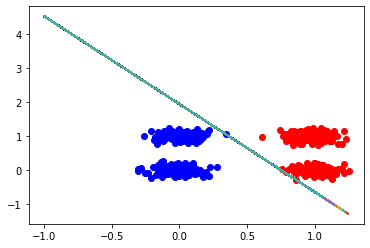

In [18]:
cont = 0
for i in X:
    plt.plot(i[1],i[2],'ro' if (Y[cont] == 1.0) else 'bo')
    cont = cont + 1
for i in range(len(X)):#np.linspace(np.amin(X),np.amax(X)):
    x = X[i]
    yi = (W[0]/W[2]) - (W[1]/W[2]) * x
    plt.plot(x,yi)

# Quinta configuraçao

In [19]:
vEpoca = []
vAjuste = [] 
for i in range (100):
    print("Rodada ", i + 1)
    (pred,W, epoca, qtdeAj) = train_perceptron(X, Y, -1, 1, 0.1)
    vEpoca.append(epoca)
    vAjuste.append(qtdeAj)
impressao(vEpoca, vAjuste)

Rodada  1
Epoch: 1 #################################
Vetor de pesos na época  1 : [-0.00355669 -0.000818    0.0342738 ]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 2 #################################
Vetor de pesos na época  2 : [-0.00355669  0.11274766  0.00682889]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 3 #################################
Vetor de pesos na época  3 : [-0.00355669  0.19164614  0.02578883]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 4 #################################
Vetor de pesos na época  4 : [-0.00355669  0.33876496  0.02623384]
quantidade de exemplos corretos:  597
quantidade de exemplos errados:  3

Epoch: 5 #################################
Vetor de pesos na época  5 : [0.09644331 0.39856106 0.04489492]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 6 #################################
Vetor de pesos na época  6 : [

quantidade de exemplos corretos:  600
quantidade de exemplos errados:  0

pesos final:  [ 0.33132856  1.11432818 -0.29080282]
quantidade de vezes que o peso foi ajustado:  9


Rodada  16
Epoch: 1 #################################
Vetor de pesos na época  1 : [-0.42285885 -0.17866987 -0.23751281]
quantidade de exemplos corretos:  591
quantidade de exemplos errados:  9

Epoch: 2 #################################
Vetor de pesos na época  2 : [-0.12285885  0.15728967 -0.13127622]
quantidade de exemplos corretos:  597
quantidade de exemplos errados:  3

Epoch: 3 #################################
Vetor de pesos na época  3 : [-0.02285885  0.24806184 -0.02481816]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 4 #################################
Vetor de pesos na época  4 : [ 0.07714115  0.24189903 -0.0123925 ]
quantidade de exemplos corretos:  600
quantidade de exemplos errados:  0

pesos final:  [ 0.07714115  0.24189903 -0.0123925 ]
quantidade de vezes que o

Vetor de pesos na época  1 : [ 0.63942771 -0.45582419 -0.88024825]
quantidade de exemplos corretos:  590
quantidade de exemplos errados:  10

Epoch: 2 #################################
Vetor de pesos na época  2 : [-0.36057229  0.55974115 -0.5720806 ]
quantidade de exemplos corretos:  592
quantidade de exemplos errados:  8

Epoch: 3 #################################
Vetor de pesos na época  3 : [ 0.03942771  0.70985972 -0.31540216]
quantidade de exemplos corretos:  597
quantidade de exemplos errados:  3

Epoch: 4 #################################
Vetor de pesos na época  4 : [ 0.13942771  0.76057431 -0.1954868 ]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 5 #################################
Vetor de pesos na época  5 : [ 0.23942771  0.74079522 -0.18847607]
quantidade de exemplos corretos:  600
quantidade de exemplos errados:  0

pesos final:  [ 0.23942771  0.74079522 -0.18847607]
quantidade de vezes que o peso foi ajustado:  22


Rodada  27
Epoch: 1

quantidade de exemplos corretos:  600
quantidade de exemplos errados:  0

pesos final:  [0.19559713 0.43278464 0.01973605]
quantidade de vezes que o peso foi ajustado:  24


Rodada  41
Epoch: 1 #################################
Vetor de pesos na época  1 : [ 0.10513535  0.22010273 -0.21963209]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 2 #################################
Vetor de pesos na época  2 : [ 0.00513535  0.30446103 -0.14598541]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 3 #################################
Vetor de pesos na época  3 : [ 0.00513535  0.38292487 -0.01964092]
quantidade de exemplos corretos:  597
quantidade de exemplos errados:  3

Epoch: 4 #################################
Vetor de pesos na época  4 : [ 0.10513535  0.42877875 -0.00067807]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 5 #################################
Vetor de pesos na época  5 : [ 0.205

quantidade de exemplos corretos:  593
quantidade de exemplos errados:  7

Epoch: 2 #################################
Vetor de pesos na época  2 : [-0.07157016  0.08664266  0.25263199]
quantidade de exemplos corretos:  595
quantidade de exemplos errados:  5

Epoch: 3 #################################
Vetor de pesos na época  3 : [0.02842984 0.25856228 0.1004734 ]
quantidade de exemplos corretos:  597
quantidade de exemplos errados:  3

Epoch: 4 #################################
Vetor de pesos na época  4 : [0.12842984 0.32027926 0.01391468]
quantidade de exemplos corretos:  600
quantidade de exemplos errados:  0

pesos final:  [0.12842984 0.32027926 0.01391468]
quantidade de vezes que o peso foi ajustado:  15


Rodada  57
Epoch: 1 #################################
Vetor de pesos na época  1 : [ 0.65163964  0.09897934 -0.22860554]
quantidade de exemplos corretos:  595
quantidade de exemplos errados:  5

Epoch: 2 #################################
Vetor de pesos na época  2 : [ 0.15163964 

quantidade de exemplos corretos:  582
quantidade de exemplos errados:  18

Epoch: 2 #################################
Vetor de pesos na época  2 : [0.03369365 0.25651486 0.42133744]
quantidade de exemplos corretos:  595
quantidade de exemplos errados:  5

Epoch: 3 #################################
Vetor de pesos na época  3 : [0.13369365 0.41406128 0.15152071]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 4 #################################
Vetor de pesos na época  4 : [0.23369365 0.39673421 0.05277729]
quantidade de exemplos corretos:  600
quantidade de exemplos errados:  0

pesos final:  [0.23369365 0.39673421 0.05277729]
quantidade de vezes que o peso foi ajustado:  24


Rodada  67
Epoch: 1 #################################
Vetor de pesos na época  1 : [-0.2419572   0.91520722 -0.54771839]
quantidade de exemplos corretos:  592
quantidade de exemplos errados:  8

Epoch: 2 #################################
Vetor de pesos na época  2 : [ 0.1580428   1

quantidade de exemplos corretos:  595
quantidade de exemplos errados:  5

Epoch: 3 #################################
Vetor de pesos na época  3 : [-0.01089565  0.22285413  0.08143993]
quantidade de exemplos corretos:  597
quantidade de exemplos errados:  3

Epoch: 4 #################################
Vetor de pesos na época  4 : [0.08910435 0.28442554 0.00165645]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 5 #################################
Vetor de pesos na época  5 : [ 0.08910435  0.32560283 -0.09850562]
quantidade de exemplos corretos:  600
quantidade de exemplos errados:  0

pesos final:  [ 0.08910435  0.32560283 -0.09850562]
quantidade de vezes que o peso foi ajustado:  30


Rodada  77
Epoch: 1 #################################
Vetor de pesos na época  1 : [ 0.94773945 -0.63116173 -0.66799491]
quantidade de exemplos corretos:  588
quantidade de exemplos errados:  12

Epoch: 2 #################################
Vetor de pesos na época  2 : [-0.25

quantidade de exemplos corretos:  595
quantidade de exemplos errados:  5

Epoch: 3 #################################
Vetor de pesos na época  3 : [ 0.15234801  0.88004664 -0.35777455]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 4 #################################
Vetor de pesos na época  4 : [ 0.15234801  0.93482785 -0.2327308 ]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 5 #################################
Vetor de pesos na época  5 : [ 0.25234801  0.91504876 -0.22572006]
quantidade de exemplos corretos:  600
quantidade de exemplos errados:  0

pesos final:  [ 0.25234801  0.91504876 -0.22572006]
quantidade de vezes que o peso foi ajustado:  14


Rodada  86
Epoch: 1 #################################
Vetor de pesos na época  1 : [ 0.42896813  0.15355478 -0.79821211]
quantidade de exemplos corretos:  594
quantidade de exemplos errados:  6

Epoch: 2 #################################
Vetor de pesos na época  2 : [-0.

quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 4 #################################
Vetor de pesos na época  4 : [0.19283519 0.44250987 0.03876244]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 5 #################################
Vetor de pesos na época  5 : [0.19283519 0.49452657 0.04529963]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 6 #################################
Vetor de pesos na época  6 : [0.19283519 0.53670484 0.04084791]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 7 #################################
Vetor de pesos na época  7 : [0.19283519 0.5634005  0.03352596]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 8 #################################
Vetor de pesos na época  8 : [0.19283519 0.59009617 0.02620401]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 9 ############

# Gráfico 5

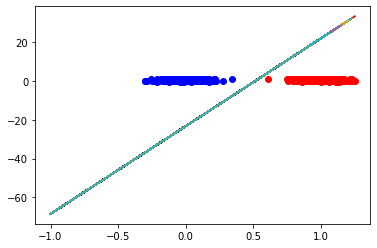

In [20]:
cont = 0
for i in X:
    plt.plot(i[1],i[2],'ro' if (Y[cont] == 1.0) else 'bo')
    cont = cont + 1
for i in range(len(X)):#np.linspace(np.amin(X),np.amax(X)):
    x = X[i]
    yi = (W[0]/W[2]) - (W[1]/W[2]) * x
    plt.plot(x,yi)

# Sexta configuração

In [21]:
vEpoca = []
vAjuste = [] 
for i in range (100):
    print("Rodada ", i + 1)
    (pred,W, epoca, qtdeAj) = train_perceptron(X, Y, -0.5, 0.5, 0.1)
    vEpoca.append(epoca)
    vAjuste.append(qtdeAj)
impressao(vEpoca, vAjuste)

Rodada  1
Epoch: 1 #################################
Vetor de pesos na época  1 : [-0.30134418 -0.04911765  0.36220566]
quantidade de exemplos corretos:  590
quantidade de exemplos errados:  10

Epoch: 2 #################################
Vetor de pesos na época  2 : [0.09865582 0.26730787 0.16494545]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 3 #################################
Vetor de pesos na época  3 : [0.09865582 0.33617832 0.0386245 ]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 4 #################################
Vetor de pesos na época  4 : [0.09865582 0.40026895 0.04731085]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 5 #################################
Vetor de pesos na época  5 : [0.19865582 0.37270025 0.03814415]
quantidade de exemplos corretos:  600
quantidade de exemplos errados:  0

pesos final:  [0.19865582 0.37270025 0.03814415]
quantidade de vezes que o peso f

quantidade de exemplos corretos:  597
quantidade de exemplos errados:  3

Epoch: 2 #################################
Vetor de pesos na época  2 : [-0.04866148  0.5020336  -0.12999697]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 3 #################################
Vetor de pesos na época  3 : [ 0.15133852  0.4760917  -0.11056058]
quantidade de exemplos corretos:  600
quantidade de exemplos errados:  0

pesos final:  [ 0.15133852  0.4760917  -0.11056058]
quantidade de vezes que o peso foi ajustado:  5


Rodada  13
Epoch: 1 #################################
Vetor de pesos na época  1 : [ 0.45423924  0.24184538 -0.49842138]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 2 #################################
Vetor de pesos na época  2 : [ 0.05423924  0.62472126 -0.3332158 ]
quantidade de exemplos corretos:  597
quantidade de exemplos errados:  3

Epoch: 3 #################################
Vetor de pesos na época  3 : [ 0.1

Vetor de pesos na época  3 : [0.18430456 0.4180429  0.03117292]
quantidade de exemplos corretos:  600
quantidade de exemplos errados:  0

pesos final:  [0.18430456 0.4180429  0.03117292]
quantidade de vezes que o peso foi ajustado:  2


Rodada  28
Epoch: 1 #################################
Vetor de pesos na época  1 : [ 0.25577953 -0.32486654 -0.07094749]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 2 #################################
Vetor de pesos na época  2 : [-0.14422047  0.07500798 -0.00783096]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 3 #################################
Vetor de pesos na época  3 : [0.05577953 0.08142186 0.02498042]
quantidade de exemplos corretos:  600
quantidade de exemplos errados:  0

pesos final:  [0.05577953 0.08142186 0.02498042]
quantidade de vezes que o peso foi ajustado:  6


Rodada  29
Epoch: 1 #################################
Vetor de pesos na época  1 : [-0.43188364 -0.11210

quantidade de vezes que o peso foi ajustado:  5


Rodada  41
Epoch: 1 #################################
Vetor de pesos na época  1 : [-0.42439393  0.05741982 -0.16551847]
quantidade de exemplos corretos:  594
quantidade de exemplos errados:  6

Epoch: 2 #################################
Vetor de pesos na época  2 : [-0.02439393  0.16750673 -0.11182658]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 3 #################################
Vetor de pesos na época  3 : [-0.02439393  0.24570222 -0.02575424]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 4 #################################
Vetor de pesos na época  4 : [ 0.07560607  0.23953941 -0.01332858]
quantidade de exemplos corretos:  600
quantidade de exemplos errados:  0

pesos final:  [ 0.07560607  0.23953941 -0.01332858]
quantidade de vezes que o peso foi ajustado:  9


Rodada  42
Epoch: 1 #################################
Vetor de pesos na época  1 : [-0.14724885 -0.48

Vetor de pesos na época  1 : [ 0.28858268 -0.18790135 -0.37552504]
quantidade de exemplos corretos:  595
quantidade de exemplos errados:  5

Epoch: 2 #################################
Vetor de pesos na época  2 : [-0.21141732  0.29846809 -0.20094062]
quantidade de exemplos corretos:  595
quantidade de exemplos errados:  5

Epoch: 3 #################################
Vetor de pesos na época  3 : [ 0.08858268  0.36383799 -0.06584974]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 4 #################################
Vetor de pesos na época  4 : [0.08858268 0.4032348  0.04778104]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 5 #################################
Vetor de pesos na época  5 : [0.18858268 0.38096253 0.03845218]
quantidade de exemplos corretos:  600
quantidade de exemplos errados:  0

pesos final:  [0.18858268 0.38096253 0.03845218]
quantidade de vezes que o peso foi ajustado:  13


Rodada  54
Epoch: 1 #########

Vetor de pesos na época  1 : [-0.18351355  0.41854186 -0.09495402]
quantidade de exemplos corretos:  597
quantidade de exemplos errados:  3

Epoch: 2 #################################
Vetor de pesos na época  2 : [ 0.11648645  0.42133054 -0.04953186]
quantidade de exemplos corretos:  600
quantidade de exemplos errados:  0

pesos final:  [ 0.11648645  0.42133054 -0.04953186]
quantidade de vezes que o peso foi ajustado:  3


Rodada  64
Epoch: 1 #################################
Vetor de pesos na época  1 : [ 0.05307391  0.10055193 -0.42210897]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 2 #################################
Vetor de pesos na época  2 : [-0.14692609  0.36406548 -0.21939477]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 3 #################################
Vetor de pesos na época  3 : [ 0.05307391  0.4528639  -0.05362258]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 4 #

quantidade de exemplos corretos:  592
quantidade de exemplos errados:  8

Epoch: 2 #################################
Vetor de pesos na época  2 : [-0.01445035  0.15270031  0.06940963]
quantidade de exemplos corretos:  597
quantidade de exemplos errados:  3

Epoch: 3 #################################
Vetor de pesos na época  3 : [ 0.08554965  0.24240996 -0.0419911 ]
quantidade de exemplos corretos:  600
quantidade de exemplos errados:  0

pesos final:  [ 0.08554965  0.24240996 -0.0419911 ]
quantidade de vezes que o peso foi ajustado:  11


Rodada  76
Epoch: 1 #################################
Vetor de pesos na época  1 : [-0.38403791  0.19516832 -0.05262194]
quantidade de exemplos corretos:  594
quantidade de exemplos errados:  6

Epoch: 2 #################################
Vetor de pesos na época  2 : [0.01596209 0.23971793 0.09505775]
quantidade de exemplos corretos:  597
quantidade de exemplos errados:  3

Epoch: 3 #################################
Vetor de pesos na época  3 : [0.1159

quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 3 #################################
Vetor de pesos na época  3 : [ 0.10807737  0.27273805 -0.02777859]
quantidade de exemplos corretos:  600
quantidade de exemplos errados:  0

pesos final:  [ 0.10807737  0.27273805 -0.02777859]
quantidade de vezes que o peso foi ajustado:  7


Rodada  89
Epoch: 1 #################################
Vetor de pesos na época  1 : [-0.23423127 -0.0785939   0.35181559]
quantidade de exemplos corretos:  591
quantidade de exemplos errados:  9

Epoch: 2 #################################
Vetor de pesos na época  2 : [0.06576873 0.2213354  0.15325254]
quantidade de exemplos corretos:  597
quantidade de exemplos errados:  3

Epoch: 3 #################################
Vetor de pesos na época  3 : [0.16576873 0.28963916 0.02025945]
quantidade de exemplos corretos:  600
quantidade de exemplos errados:  0

pesos final:  [0.16576873 0.28963916 0.02025945]
quantidade de vezes que o peso foi

# Gráfico 6

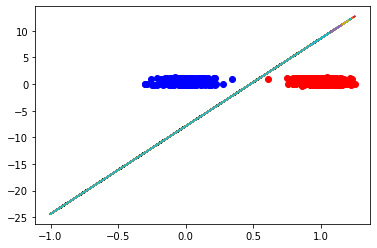

In [22]:
cont = 0
for i in X:
    plt.plot(i[1],i[2],'ro' if (Y[cont] == 1.0) else 'bo')
    cont = cont + 1
for i in range(len(X)):#np.linspace(np.amin(X),np.amax(X)):
    x = X[i]
    yi = (W[0]/W[2]) - (W[1]/W[2]) * x
    plt.plot(x,yi)

# Sétima configuração

In [ ]:
vEpoca = []
vAjuste = [] 
for i in range (100):
    print("Rodada ", i + 1)
    (pred,W, epoca, qtdeAj) = train_perceptron(X, Y, -100, 100, 0.01)
    vEpoca.append(epoca)
    vAjuste.append(qtdeAj)
impressao(vEpoca, vAjuste)

Rodada  1
Epoch: 1 #################################
Vetor de pesos na época  1 : [ 81.86288959  14.62544707 -70.15525864]
quantidade de exemplos corretos:  300
quantidade de exemplos errados:  300

Epoch: 2 #################################
Vetor de pesos na época  2 : [ 78.86288959  17.60699874 -68.64975252]
quantidade de exemplos corretos:  300
quantidade de exemplos errados:  300

Epoch: 3 #################################
Vetor de pesos na época  3 : [ 75.86288959  20.58855041 -67.1442464 ]
quantidade de exemplos corretos:  300
quantidade de exemplos errados:  300

Epoch: 4 #################################
Vetor de pesos na época  4 : [ 72.86288959  23.57010208 -65.63874028]
quantidade de exemplos corretos:  300
quantidade de exemplos errados:  300

Epoch: 5 #################################
Vetor de pesos na época  5 : [ 69.86288959  26.55165376 -64.13323416]
quantidade de exemplos corretos:  300
quantidade de exemplos errados:  300

Epoch: 6 #################################
Ve

Epoch: 59 #################################
Vetor de pesos na época  59 : [ 24.15288959  70.69280631 -29.47438745]
quantidade de exemplos corretos:  597
quantidade de exemplos errados:  3

Epoch: 60 #################################
Vetor de pesos na época  60 : [ 24.12288959  70.71408744 -29.4423216 ]
quantidade de exemplos corretos:  597
quantidade de exemplos errados:  3

Epoch: 61 #################################
Vetor de pesos na época  61 : [ 24.09288959  70.73536856 -29.41025574]
quantidade de exemplos corretos:  597
quantidade de exemplos errados:  3

Epoch: 62 #################################
Vetor de pesos na época  62 : [ 24.06288959  70.75664968 -29.37818989]
quantidade de exemplos corretos:  597
quantidade de exemplos errados:  3

Epoch: 63 #################################
Vetor de pesos na época  63 : [ 24.03288959  70.77793081 -29.34612403]
quantidade de exemplos corretos:  597
quantidade de exemplos errados:  3

Epoch: 64 #################################
Vetor de pe

Epoch: 106 #################################
Vetor de pesos na época  106 : [ 23.13288959  71.39241866 -28.37685775]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 107 #################################
Vetor de pesos na época  107 : [ 23.11288959  71.40599208 -28.35529357]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 108 #################################
Vetor de pesos na época  108 : [ 23.09288959  71.4195655  -28.3337294 ]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 109 #################################
Vetor de pesos na época  109 : [ 23.07288959  71.43313892 -28.31216522]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 110 #################################
Vetor de pesos na época  110 : [ 23.05288959  71.44671234 -28.29060105]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 111 #################################


quantidade de exemplos errados:  1

Epoch: 172 #################################
Vetor de pesos na época  172 : [ 21.85288959  72.25844023 -27.00083534]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 173 #################################
Vetor de pesos na época  173 : [ 21.84288959  72.26455762 -26.99107446]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 174 #################################
Vetor de pesos na época  174 : [ 21.83288959  72.270675   -26.98131359]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 175 #################################
Vetor de pesos na época  175 : [ 21.82288959  72.27679239 -26.97155271]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 176 #################################
Vetor de pesos na época  176 : [ 21.81288959  72.28290978 -26.96179184]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 17

Vetor de pesos na época  224 : [ 21.33288959  72.57654443 -26.49326987]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 225 #################################
Vetor de pesos na época  225 : [ 21.32288959  72.58266182 -26.483509  ]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 226 #################################
Vetor de pesos na época  226 : [ 21.31288959  72.5887792  -26.47374812]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 227 #################################
Vetor de pesos na época  227 : [ 21.30288959  72.59489659 -26.46398725]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 228 #################################
Vetor de pesos na época  228 : [ 21.29288959  72.60101398 -26.45422638]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 229 #################################
Vetor de pesos na época  229 : [ 21.28288959 

quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 278 #################################
Vetor de pesos na época  278 : [ 20.79288959  72.9068834  -25.96618266]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 279 #################################
Vetor de pesos na época  279 : [ 20.78288959  72.91300079 -25.95642179]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 280 #################################
Vetor de pesos na época  280 : [ 20.77288959  72.91911818 -25.94666091]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 281 #################################
Vetor de pesos na época  281 : [ 20.76288959  72.92523557 -25.93690004]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 282 #################################
Vetor de pesos na época  282 : [ 20.75288959  72.93135296 -25.92713916]
quantidade de exemplos corretos:  599
quantid

quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 324 #################################
Vetor de pesos na época  324 : [ 20.33288959  73.18828327 -25.51718245]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 325 #################################
Vetor de pesos na época  325 : [ 20.32288959  73.19440066 -25.50742157]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 326 #################################
Vetor de pesos na época  326 : [ 20.31288959  73.20051805 -25.4976607 ]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 327 #################################
Vetor de pesos na época  327 : [ 20.30288959  73.20663544 -25.48789982]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 328 #################################
Vetor de pesos na época  328 : [ 20.29288959  73.21275283 -25.47813895]
quantidade de exemplos corretos:  599
quantid

Vetor de pesos na época  28 : [-31.20781848  43.479691   -55.96984795]
quantidade de exemplos corretos:  449
quantidade de exemplos errados:  151

Epoch: 29 #################################
Vetor de pesos na época  29 : [-29.71781848  43.50469342 -55.95171667]
quantidade de exemplos corretos:  448
quantidade de exemplos errados:  152

Epoch: 30 #################################
Vetor de pesos na época  30 : [-28.23781848  43.5379773  -55.9219987 ]
quantidade de exemplos corretos:  446
quantidade de exemplos errados:  154

Epoch: 31 #################################
Vetor de pesos na época  31 : [-26.77781848  43.58584124 -55.87112798]
quantidade de exemplos corretos:  441
quantidade de exemplos errados:  159

Epoch: 32 #################################
Vetor de pesos na época  32 : [-25.36781848  43.6795408  -55.76132911]
quantidade de exemplos corretos:  434
quantidade de exemplos errados:  166

Epoch: 33 #################################
Vetor de pesos na época  33 : [-24.02781848  

quantidade de exemplos corretos:  546
quantidade de exemplos errados:  54

Epoch: 80 #################################
Vetor de pesos na época  80 : [  5.22218152  54.73419731 -38.47568042]
quantidade de exemplos corretos:  548
quantidade de exemplos errados:  52

Epoch: 81 #################################
Vetor de pesos na época  81 : [  5.40218152  54.83603583 -38.25425247]
quantidade de exemplos corretos:  549
quantidade de exemplos errados:  51

Epoch: 82 #################################
Vetor de pesos na época  82 : [  5.59218152  54.92839303 -38.04495831]
quantidade de exemplos corretos:  550
quantidade de exemplos errados:  50

Epoch: 83 #################################
Vetor de pesos na época  83 : [  5.77218152  55.02136318 -37.8363213 ]
quantidade de exemplos corretos:  552
quantidade de exemplos errados:  48

Epoch: 84 #################################
Vetor de pesos na época  84 : [  5.95218152  55.10501674 -37.64129555]
quantidade de exemplos corretos:  554
quantidade d

quantidade de exemplos corretos:  588
quantidade de exemplos errados:  12

Epoch: 149 #################################
Vetor de pesos na época  149 : [ 11.36218152  57.04895817 -31.69904789]
quantidade de exemplos corretos:  588
quantidade de exemplos errados:  12

Epoch: 150 #################################
Vetor de pesos na época  150 : [ 11.40218152  57.06250961 -31.64699349]
quantidade de exemplos corretos:  588
quantidade de exemplos errados:  12

Epoch: 151 #################################
Vetor de pesos na época  151 : [ 11.44218152  57.07606106 -31.59493909]
quantidade de exemplos corretos:  588
quantidade de exemplos errados:  12

Epoch: 152 #################################
Vetor de pesos na época  152 : [ 11.48218152  57.0896125  -31.54288469]
quantidade de exemplos corretos:  588
quantidade de exemplos errados:  12

Epoch: 153 #################################
Vetor de pesos na época  153 : [ 11.52218152  57.10316395 -31.49083029]
quantidade de exemplos corretos:  588
qu

quantidade de exemplos corretos:  593
quantidade de exemplos errados:  7

Epoch: 203 #################################
Vetor de pesos na época  203 : [ 13.53218152  57.55191368 -29.32170882]
quantidade de exemplos corretos:  593
quantidade de exemplos errados:  7

Epoch: 204 #################################
Vetor de pesos na época  204 : [ 13.56218152  57.55618417 -29.29193389]
quantidade de exemplos corretos:  593
quantidade de exemplos errados:  7

Epoch: 205 #################################
Vetor de pesos na época  205 : [ 13.59218152  57.56045466 -29.26215896]
quantidade de exemplos corretos:  593
quantidade de exemplos errados:  7

Epoch: 206 #################################
Vetor de pesos na época  206 : [ 13.62218152  57.56472515 -29.23238403]
quantidade de exemplos corretos:  593
quantidade de exemplos errados:  7

Epoch: 207 #################################
Vetor de pesos na época  207 : [ 13.65218152  57.56899564 -29.2026091 ]
quantidade de exemplos corretos:  593
quantid

quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 261 #################################
Vetor de pesos na época  261 : [ 14.82218152  57.87931591 -27.66440765]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 262 #################################
Vetor de pesos na época  262 : [ 14.82218152  57.88895633 -27.63930077]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 263 #################################
Vetor de pesos na época  263 : [ 14.82218152  57.89859674 -27.61419389]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 264 #################################
Vetor de pesos na época  264 : [ 14.82218152  57.90823716 -27.58908701]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 265 #################################
Vetor de pesos na época  265 : [ 14.82218152  57.91787758 -27.56398012]
quantidade de exemplos corretos:  596
quantid

quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 313 #################################
Vetor de pesos na época  313 : [ 14.82218152  58.38061762 -26.3588498 ]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 314 #################################
Vetor de pesos na época  314 : [ 14.82218152  58.39025804 -26.33374292]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 315 #################################
Vetor de pesos na época  315 : [ 14.82218152  58.39989846 -26.30863604]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 316 #################################
Vetor de pesos na época  316 : [ 14.82218152  58.40953888 -26.28352915]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 317 #################################
Vetor de pesos na época  317 : [ 14.82218152  58.41917929 -26.25842227]
quantidade de exemplos corretos:  596
quantid

Vetor de pesos na época  356 : [ 14.82218152  58.79515558 -25.27925388]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 357 #################################
Vetor de pesos na época  357 : [ 14.82218152  58.804796   -25.254147  ]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 358 #################################
Vetor de pesos na época  358 : [ 14.82218152  58.81443642 -25.22904012]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 359 #################################
Vetor de pesos na época  359 : [ 14.82218152  58.82407683 -25.20393324]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 360 #################################
Vetor de pesos na época  360 : [ 14.82218152  58.83371725 -25.17882636]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 361 #################################
Vetor de pesos na época  361 : [ 14.82218152 

Vetor de pesos na época  418 : [ 15.09218152  59.12313979 -24.20624201]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 419 #################################
Vetor de pesos na época  419 : [ 15.09218152  59.12707948 -24.19487893]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 420 #################################
Vetor de pesos na época  420 : [ 15.09218152  59.13101916 -24.18351585]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 421 #################################
Vetor de pesos na época  421 : [ 15.09218152  59.13495884 -24.17215278]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 422 #################################
Vetor de pesos na época  422 : [ 15.09218152  59.13889852 -24.1607897 ]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 423 #################################
Vetor de pesos na época  423 : [ 15.09218152 

quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 470 #################################
Vetor de pesos na época  470 : [ 15.09218152  59.3280032  -23.61536197]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 471 #################################
Vetor de pesos na época  471 : [ 15.09218152  59.33194288 -23.60399889]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 472 #################################
Vetor de pesos na época  472 : [ 15.09218152  59.33588256 -23.59263581]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 473 #################################
Vetor de pesos na época  473 : [ 15.09218152  59.33982224 -23.58127273]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 474 #################################
Vetor de pesos na época  474 : [ 15.09218152  59.34376192 -23.56990965]
quantidade de exemplos corretos:  598
quantid

quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 515 #################################
Vetor de pesos na época  515 : [ 15.09218152  59.50528884 -23.10402347]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 516 #################################
Vetor de pesos na época  516 : [ 15.09218152  59.50922852 -23.09266039]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 517 #################################
Vetor de pesos na época  517 : [ 15.09218152  59.5131682  -23.08129731]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 518 #################################
Vetor de pesos na época  518 : [ 15.09218152  59.51710788 -23.06993423]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 519 #################################
Vetor de pesos na época  519 : [ 15.09218152  59.52104756 -23.05857115]
quantidade de exemplos corretos:  598
quantid

Vetor de pesos na época  578 : [ 15.09218152  59.75348873 -22.38814957]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 579 #################################
Vetor de pesos na época  579 : [ 15.09218152  59.75742841 -22.37678649]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 580 #################################
Vetor de pesos na época  580 : [ 15.09218152  59.76136809 -22.36542341]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 581 #################################
Vetor de pesos na época  581 : [ 15.09218152  59.76530777 -22.35406033]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 582 #################################
Vetor de pesos na época  582 : [ 15.09218152  59.76924745 -22.34269725]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 583 #################################
Vetor de pesos na época  583 : [ 15.09218152 

quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 643 #################################
Vetor de pesos na época  643 : [ 15.29218152  59.88722022 -21.84476699]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 644 #################################
Vetor de pesos na época  644 : [ 15.30218152  59.88504251 -21.84316479]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 645 #################################
Vetor de pesos na época  645 : [ 15.31218152  59.8828648  -21.84156259]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 646 #################################
Vetor de pesos na época  646 : [ 15.31218152  59.88680448 -21.83019951]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 647 #################################
Vetor de pesos na época  647 : [ 15.32218152  59.88462678 -21.82859731]
quantidade de exemplos corretos:  598
quantid

quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 703 #################################
Vetor de pesos na época  703 : [ 15.64218152  59.90949247 -21.50461293]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 704 #################################
Vetor de pesos na época  704 : [ 15.65218152  59.90731477 -21.50301072]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 705 #################################
Vetor de pesos na época  705 : [ 15.65218152  59.91125445 -21.49164765]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 706 #################################
Vetor de pesos na época  706 : [ 15.66218152  59.90907674 -21.49004544]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 707 #################################
Vetor de pesos na época  707 : [ 15.67218152  59.90689903 -21.48844324]
quantidade de exemplos corretos:  598
quantid

Epoch: 747 #################################
Vetor de pesos na época  747 : [ 15.90218152  59.92378633 -21.25842024]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 748 #################################
Vetor de pesos na época  748 : [ 15.90218152  59.92772601 -21.24705716]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 749 #################################
Vetor de pesos na época  749 : [ 15.91218152  59.9255483  -21.24545496]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 750 #################################
Vetor de pesos na época  750 : [ 15.91218152  59.92948799 -21.23409188]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 751 #################################
Vetor de pesos na época  751 : [ 15.92218152  59.92731028 -21.23248967]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 752 #################################



Epoch: 803 #################################
Vetor de pesos na época  803 : [ 16.22218152  59.94865203 -20.93443586]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 804 #################################
Vetor de pesos na época  804 : [ 16.23218152  59.94647432 -20.93283365]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 805 #################################
Vetor de pesos na época  805 : [ 16.23218152  59.950414   -20.92147058]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 806 #################################
Vetor de pesos na época  806 : [ 16.24218152  59.94823629 -20.91986837]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 807 #################################
Vetor de pesos na época  807 : [ 16.25218152  59.94605859 -20.91826617]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 808 #################################

quantidade de exemplos corretos:  300
quantidade de exemplos errados:  300

Epoch: 17 #################################
Vetor de pesos na época  17 : [-36.68699515  81.46998218  45.48199315]
quantidade de exemplos corretos:  300
quantidade de exemplos errados:  300

Epoch: 18 #################################
Vetor de pesos na época  18 : [-33.68699515  81.46973525  43.96955534]
quantidade de exemplos corretos:  300
quantidade de exemplos errados:  300

Epoch: 19 #################################
Vetor de pesos na época  19 : [-30.68699515  81.46948831  42.45711752]
quantidade de exemplos corretos:  300
quantidade de exemplos errados:  300

Epoch: 20 #################################
Vetor de pesos na época  20 : [-27.68699515  81.46924138  40.94467971]
quantidade de exemplos corretos:  301
quantidade de exemplos errados:  299

Epoch: 21 #################################
Vetor de pesos na época  21 : [-24.69699515  81.46690169  39.42984738]
quantidade de exemplos corretos:  303
quantid

Epoch: 76 #################################
Vetor de pesos na época  76 : [21.48300485 79.36302301  6.91276544]
quantidade de exemplos corretos:  595
quantidade de exemplos errados:  5

Epoch: 77 #################################
Vetor de pesos na época  77 : [21.53300485 79.35044342  6.86754345]
quantidade de exemplos corretos:  595
quantidade de exemplos errados:  5

Epoch: 78 #################################
Vetor de pesos na época  78 : [21.58300485 79.33786382  6.82232146]
quantidade de exemplos corretos:  595
quantidade de exemplos errados:  5

Epoch: 79 #################################
Vetor de pesos na época  79 : [21.63300485 79.32528422  6.77709947]
quantidade de exemplos corretos:  595
quantidade de exemplos errados:  5

Epoch: 80 #################################
Vetor de pesos na época  80 : [21.68300485 79.31270462  6.73187747]
quantidade de exemplos corretos:  595
quantidade de exemplos errados:  5

Epoch: 81 #################################
Vetor de pesos na época  8

quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 132 #################################
Vetor de pesos na época  132 : [23.35300485 78.87789471  5.01384424]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 133 #################################
Vetor de pesos na época  133 : [23.36300485 78.87444689  5.00335117]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 134 #################################
Vetor de pesos na época  134 : [23.37300485 78.87099907  4.9928581 ]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 135 #################################
Vetor de pesos na época  135 : [23.38300485 78.86755125  4.98236503]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 136 #################################
Vetor de pesos na época  136 : [23.39300485 78.86410342  4.97187196]
quantidade de exemplos corretos:  599
quantidade de exemplos

quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 195 #################################
Vetor de pesos na época  195 : [23.98300485 78.66068194  4.35278086]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 196 #################################
Vetor de pesos na época  196 : [23.99300485 78.65723411  4.34228779]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 197 #################################
Vetor de pesos na época  197 : [24.00300485 78.65378629  4.33179472]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 198 #################################
Vetor de pesos na época  198 : [24.01300485 78.65033847  4.32130165]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 199 #################################
Vetor de pesos na época  199 : [24.02300485 78.64689065  4.31080858]
quantidade de exemplos corretos:  599
quantidade de exemplos

quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 260 #################################
Vetor de pesos na época  260 : [24.63300485 78.43657352  3.67073135]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 261 #################################
Vetor de pesos na época  261 : [24.64300485 78.43312569  3.66023828]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 262 #################################
Vetor de pesos na época  262 : [24.65300485 78.42967787  3.64974521]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 263 #################################
Vetor de pesos na época  263 : [24.66300485 78.42623005  3.63925214]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 264 #################################
Vetor de pesos na época  264 : [24.67300485 78.42278223  3.62875907]
quantidade de exemplos corretos:  599
quantidade de exemplos

quantidade de exemplos errados:  1

Epoch: 326 #################################
Vetor de pesos na época  326 : [25.29300485 78.20901727  2.97818877]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 327 #################################
Vetor de pesos na época  327 : [25.30300485 78.20556945  2.9676957 ]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 328 #################################
Vetor de pesos na época  328 : [25.31300485 78.20212163  2.95720263]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 329 #################################
Vetor de pesos na época  329 : [25.32300485 78.19867381  2.94670956]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 330 #################################
Vetor de pesos na época  330 : [25.33300485 78.19522599  2.93621649]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 331 #############

Vetor de pesos na época  388 : [25.91300485 77.99525232  2.32761846]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 389 #################################
Vetor de pesos na época  389 : [25.92300485 77.9918045   2.31712539]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 390 #################################
Vetor de pesos na época  390 : [25.93300485 77.98835668  2.30663232]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 391 #################################
Vetor de pesos na época  391 : [25.94300485 77.98490885  2.29613925]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 392 #################################
Vetor de pesos na época  392 : [25.95300485 77.98146103  2.28564618]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 393 #################################
Vetor de pesos na época  393 : [25.96300485 77.97801321  2.2

quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 442 #################################
Vetor de pesos na época  442 : [26.45300485 77.80906994  1.76099271]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 443 #################################
Vetor de pesos na época  443 : [26.46300485 77.80562212  1.75049964]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 444 #################################
Vetor de pesos na época  444 : [26.47300485 77.8021743   1.74000657]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 445 #################################
Vetor de pesos na época  445 : [26.48300485 77.79872647  1.7295135 ]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 446 #################################
Vetor de pesos na época  446 : [26.49300485 77.79527865  1.71902044]
quantidade de exemplos corretos:  599
quantidade de exemplos

quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 490 #################################
Vetor de pesos na época  490 : [26.93300485 77.64357449  1.25732538]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 491 #################################
Vetor de pesos na época  491 : [26.94300485 77.64012667  1.24683231]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 492 #################################
Vetor de pesos na época  492 : [26.95300485 77.63667885  1.23633924]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 493 #################################
Vetor de pesos na época  493 : [26.96300485 77.63323103  1.22584617]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 494 #################################
Vetor de pesos na época  494 : [26.97300485 77.6297832   1.2153531 ]
quantidade de exemplos corretos:  599
quantidade de exemplos

quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 538 #################################
Vetor de pesos na época  538 : [27.41300485 77.47807904  0.75365805]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 539 #################################
Vetor de pesos na época  539 : [27.42300485 77.47463122  0.74316498]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 540 #################################
Vetor de pesos na época  540 : [27.43300485 77.4711834   0.73267191]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 541 #################################
Vetor de pesos na época  541 : [27.44300485 77.46773558  0.72217884]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 542 #################################
Vetor de pesos na época  542 : [27.45300485 77.46428776  0.71168577]
quantidade de exemplos corretos:  599
quantidade de exemplos

Vetor de pesos na época  38 : [ 1.60168243 11.55835751 -7.25957181]
quantidade de exemplos corretos:  571
quantidade de exemplos errados:  29

Epoch: 39 #################################
Vetor de pesos na época  39 : [ 1.71168243 11.59858594 -7.14335657]
quantidade de exemplos corretos:  576
quantidade de exemplos errados:  24

Epoch: 40 #################################
Vetor de pesos na época  40 : [ 1.79168243 11.63417122 -7.0415862 ]
quantidade de exemplos corretos:  576
quantidade de exemplos errados:  24

Epoch: 41 #################################
Vetor de pesos na época  41 : [ 1.87168243 11.66975649 -6.93981584]
quantidade de exemplos corretos:  579
quantidade de exemplos errados:  21

Epoch: 42 #################################
Vetor de pesos na época  42 : [ 1.94168243 11.70014194 -6.84949578]
quantidade de exemplos corretos:  581
quantidade de exemplos errados:  19

Epoch: 43 #################################
Vetor de pesos na época  43 : [ 2.03168243 11.71439907 -6.7806155

quantidade de exemplos corretos:  597
quantidade de exemplos errados:  3

Epoch: 98 #################################
Vetor de pesos na época  98 : [ 3.06168243 12.17805622 -5.04043249]
quantidade de exemplos corretos:  597
quantidade de exemplos errados:  3

Epoch: 99 #################################
Vetor de pesos na época  99 : [ 3.07168243 12.1802406  -5.02712891]
quantidade de exemplos corretos:  597
quantidade de exemplos errados:  3

Epoch: 100 #################################
Vetor de pesos na época  100 : [ 3.08168243 12.18242499 -5.01382533]
quantidade de exemplos corretos:  597
quantidade de exemplos errados:  3

Epoch: 101 #################################
Vetor de pesos na época  101 : [ 3.09168243 12.18460938 -5.00052175]
quantidade de exemplos corretos:  597
quantidade de exemplos errados:  3

Epoch: 102 #################################
Vetor de pesos na época  102 : [ 3.10168243 12.18679376 -4.98721817]
quantidade de exemplos corretos:  598
quantidade de exemplos err

quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 167 #################################
Vetor de pesos na época  167 : [ 3.25168243 12.35111219 -4.39503123]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 168 #################################
Vetor de pesos na época  168 : [ 3.26168243 12.34893448 -4.39342903]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 169 #################################
Vetor de pesos na época  169 : [ 3.26168243 12.35287417 -4.38206595]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 170 #################################
Vetor de pesos na época  170 : [ 3.27168243 12.35069646 -4.38046375]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 171 #################################
Vetor de pesos na época  171 : [ 3.27168243 12.35463614 -4.36910067]
quantidade de exemplos corretos:  599
quantidade de exemplos

Vetor de pesos na época  24 : [-17.68441657 -22.33900473  16.29932039]
quantidade de exemplos corretos:  150
quantidade de exemplos errados:  450

Epoch: 25 #################################
Vetor de pesos na época  25 : [-16.18441657 -20.84007756  14.78327851]
quantidade de exemplos corretos:  150
quantidade de exemplos errados:  450

Epoch: 26 #################################
Vetor de pesos na época  26 : [-14.68441657 -19.34115039  13.26723662]
quantidade de exemplos corretos:  150
quantidade de exemplos errados:  450

Epoch: 27 #################################
Vetor de pesos na época  27 : [-13.18441657 -17.84222323  11.75119473]
quantidade de exemplos corretos:  149
quantidade de exemplos errados:  451

Epoch: 28 #################################
Vetor de pesos na época  28 : [-11.69441657 -16.33125696  10.24279635]
quantidade de exemplos corretos:  148
quantidade de exemplos errados:  452

Epoch: 29 #################################
Vetor de pesos na época  29 : [-10.21441657 -

Vetor de pesos na época  31 : [11.10418846 37.63567273  4.63904544]
quantidade de exemplos corretos:  595
quantidade de exemplos errados:  5

Epoch: 32 #################################
Vetor de pesos na época  32 : [11.15418846 37.62417234  4.58373039]
quantidade de exemplos corretos:  595
quantidade de exemplos errados:  5

Epoch: 33 #################################
Vetor de pesos na época  33 : [11.20418846 37.61267196  4.52841534]
quantidade de exemplos corretos:  595
quantidade de exemplos errados:  5

Epoch: 34 #################################
Vetor de pesos na época  34 : [11.25418846 37.60117157  4.47310029]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 35 #################################
Vetor de pesos na época  35 : [11.29418846 37.59134884  4.42879497]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 36 #################################
Vetor de pesos na época  36 : [11.33418846 37.58152611  4.38448965]
qu

Vetor de pesos na época  82 : [12.40418846 37.29207865  3.20301752]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 83 #################################
Vetor de pesos na época  83 : [12.41418846 37.28863083  3.19252445]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 84 #################################
Vetor de pesos na época  84 : [12.42418846 37.285183    3.18203138]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 85 #################################
Vetor de pesos na época  85 : [12.43418846 37.28173518  3.17153831]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 86 #################################
Vetor de pesos na época  86 : [12.44418846 37.27828736  3.16104524]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 87 #################################
Vetor de pesos na época  87 : [12.45418846 37.27483954  3.15055217]
qu

Vetor de pesos na época  150 : [13.08418846 37.05762676  2.4894888 ]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 151 #################################
Vetor de pesos na época  151 : [13.09418846 37.05417894  2.47899573]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 152 #################################
Vetor de pesos na época  152 : [13.10418846 37.05073112  2.46850266]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 153 #################################
Vetor de pesos na época  153 : [13.11418846 37.0472833   2.45800959]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 154 #################################
Vetor de pesos na época  154 : [13.12418846 37.04383548  2.44751652]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 155 #################################
Vetor de pesos na época  155 : [13.13418846 37.04038765  2.4

Vetor de pesos na época  201 : [13.59418846 36.88178785  1.95434226]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 202 #################################
Vetor de pesos na época  202 : [13.60418846 36.87834003  1.94384919]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 203 #################################
Vetor de pesos na época  203 : [13.61418846 36.8748922   1.93335612]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 204 #################################
Vetor de pesos na época  204 : [13.62418846 36.87144438  1.92286305]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 205 #################################
Vetor de pesos na época  205 : [13.63418846 36.86799656  1.91236998]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 206 #################################
Vetor de pesos na época  206 : [13.64418846 36.86454874  1.9

quantidade de exemplos corretos:  294
quantidade de exemplos errados:  306

Epoch: 9 #################################
Vetor de pesos na época  9 : [-50.96287986 -35.208676   -65.26018533]
quantidade de exemplos corretos:  298
quantidade de exemplos errados:  302

Epoch: 10 #################################
Vetor de pesos na época  10 : [-50.96287986 -33.69493737 -63.7505913 ]
quantidade de exemplos corretos:  298
quantidade de exemplos errados:  302

Epoch: 11 #################################
Vetor de pesos na época  11 : [-50.96287986 -32.18119873 -62.24099728]
quantidade de exemplos corretos:  297
quantidade de exemplos errados:  303

Epoch: 12 #################################
Vetor de pesos na época  12 : [-50.95287986 -30.66561291 -60.74015156]
quantidade de exemplos corretos:  295
quantidade de exemplos errados:  305

Epoch: 13 #################################
Vetor de pesos na época  13 : [-50.90287986 -29.15912833 -59.26684515]
quantidade de exemplos corretos:  293
quantidad

Vetor de pesos na época  63 : [ -9.11287986  15.57952507 -22.3322601 ]
quantidade de exemplos corretos:  403
quantidade de exemplos errados:  197

Epoch: 64 #################################
Vetor de pesos na época  64 : [ -8.08287986  16.02120628 -21.80682717]
quantidade de exemplos corretos:  404
quantidade de exemplos errados:  196

Epoch: 65 #################################
Vetor de pesos na época  65 : [ -7.08287986  16.46985322 -21.2658621 ]
quantidade de exemplos corretos:  403
quantidade de exemplos errados:  197

Epoch: 66 #################################
Vetor de pesos na época  66 : [ -6.09287986  16.92756151 -20.71455889]
quantidade de exemplos corretos:  406
quantidade de exemplos errados:  194

Epoch: 67 #################################
Vetor de pesos na época  67 : [ -5.11287986  17.3707321  -20.17267639]
quantidade de exemplos corretos:  414
quantidade de exemplos errados:  186

Epoch: 68 #################################
Vetor de pesos na época  68 : [ -4.19287986  

quantidade de exemplos corretos:  588
quantidade de exemplos errados:  12

Epoch: 116 #################################
Vetor de pesos na época  116 : [  4.61712014  21.76863522 -11.57970141]
quantidade de exemplos corretos:  588
quantidade de exemplos errados:  12

Epoch: 117 #################################
Vetor de pesos na época  117 : [  4.65712014  21.78218666 -11.527647  ]
quantidade de exemplos corretos:  589
quantidade de exemplos errados:  11

Epoch: 118 #################################
Vetor de pesos na época  118 : [  4.70712014  21.7880304  -11.48609428]
quantidade de exemplos corretos:  589
quantidade de exemplos errados:  11

Epoch: 119 #################################
Vetor de pesos na época  119 : [  4.75712014  21.79387414 -11.44454156]
quantidade de exemplos corretos:  590
quantidade de exemplos errados:  10

Epoch: 120 #################################
Vetor de pesos na época  120 : [  4.79712014  21.80169132 -11.40339554]
quantidade de exemplos corretos:  591
qu

Epoch: 188 #################################
Vetor de pesos na época  188 : [ 5.61712014 22.32464981 -9.54433186]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 189 #################################
Vetor de pesos na época  189 : [ 5.61712014 22.33429023 -9.51922498]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 190 #################################
Vetor de pesos na época  190 : [ 5.61712014 22.34393065 -9.4941181 ]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 191 #################################
Vetor de pesos na época  191 : [ 5.61712014 22.35357107 -9.46901121]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 192 #################################
Vetor de pesos na época  192 : [ 5.61712014 22.36321148 -9.44390433]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 193 #################################
Vetor de pesos 

quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 242 #################################
Vetor de pesos na época  242 : [ 5.71712014 22.55974479 -8.81511401]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 243 #################################
Vetor de pesos na época  243 : [ 5.71712014 22.56368447 -8.80375093]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 244 #################################
Vetor de pesos na época  244 : [ 5.71712014 22.56762416 -8.79238785]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 245 #################################
Vetor de pesos na época  245 : [ 5.71712014 22.57156384 -8.78102478]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 246 #################################
Vetor de pesos na época  246 : [ 5.71712014 22.57550352 -8.7696617 ]
quantidade de exemplos corretos:  598
quantidade de exemplos

quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 304 #################################
Vetor de pesos na época  304 : [ 5.84712014 22.72447896 -8.23749455]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 305 #################################
Vetor de pesos na época  305 : [ 5.85712014 22.72230125 -8.23589235]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 306 #################################
Vetor de pesos na época  306 : [ 5.85712014 22.72624093 -8.22452927]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 307 #################################
Vetor de pesos na época  307 : [ 5.86712014 22.72406322 -8.22292707]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 308 #################################
Vetor de pesos na época  308 : [ 5.86712014 22.7280029  -8.21156399]
quantidade de exemplos corretos:  599
quantidade de exemplos

Vetor de pesos na época  357 : [ 6.15712014 22.743643   -7.93783853]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 358 #################################
Vetor de pesos na época  358 : [ 6.15712014 22.74758268 -7.92647545]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 359 #################################
Vetor de pesos na época  359 : [ 6.16712014 22.74540497 -7.92487325]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 360 #################################
Vetor de pesos na época  360 : [ 6.17712014 22.74322727 -7.92327105]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 361 #################################
Vetor de pesos na época  361 : [ 6.17712014 22.74716695 -7.91190797]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 362 #################################
Vetor de pesos na época  362 : [ 6.18712014 22.74498924 -7.9

Vetor de pesos na época  41 : [62.31490046 73.49203127 49.60759922]
quantidade de exemplos corretos:  578
quantidade de exemplos errados:  22

Epoch: 42 #################################
Vetor de pesos na época  42 : [62.27490046 73.58591766 49.49809203]
quantidade de exemplos corretos:  578
quantidade de exemplos errados:  22

Epoch: 43 #################################
Vetor de pesos na época  43 : [62.23490046 73.67980404 49.38858484]
quantidade de exemplos corretos:  579
quantidade de exemplos errados:  21

Epoch: 44 #################################
Vetor de pesos na época  44 : [62.20490046 73.76444917 49.28023848]
quantidade de exemplos corretos:  581
quantidade de exemplos errados:  19

Epoch: 45 #################################
Vetor de pesos na época  45 : [62.17490046 73.84219529 49.1822156 ]
quantidade de exemplos corretos:  581
quantidade de exemplos errados:  19

Epoch: 46 #################################
Vetor de pesos na época  46 : [62.14490046 73.91994142 49.0841927

quantidade de exemplos corretos:  591
quantidade de exemplos errados:  9

Epoch: 103 #################################
Vetor de pesos na época  103 : [62.18490046 76.31181608 44.42317097]
quantidade de exemplos corretos:  591
quantidade de exemplos errados:  9

Epoch: 104 #################################
Vetor de pesos na época  104 : [62.19490046 76.33266522 44.36395723]
quantidade de exemplos corretos:  591
quantidade de exemplos errados:  9

Epoch: 105 #################################
Vetor de pesos na época  105 : [62.20490046 76.35351435 44.3047435 ]
quantidade de exemplos corretos:  591
quantidade de exemplos errados:  9

Epoch: 106 #################################
Vetor de pesos na época  106 : [62.21490046 76.37436348 44.24552977]
quantidade de exemplos corretos:  591
quantidade de exemplos errados:  9

Epoch: 107 #################################
Vetor de pesos na época  107 : [62.22490046 76.39521261 44.18631603]
quantidade de exemplos corretos:  592
quantidade de exemplos

Epoch: 168 #################################
Vetor de pesos na época  168 : [61.82490046 77.84510401 41.69825256]
quantidade de exemplos corretos:  593
quantidade de exemplos errados:  7

Epoch: 169 #################################
Vetor de pesos na época  169 : [61.81490046 77.86932736 41.66161348]
quantidade de exemplos corretos:  593
quantidade de exemplos errados:  7

Epoch: 170 #################################
Vetor de pesos na época  170 : [61.80490046 77.89355071 41.62497439]
quantidade de exemplos corretos:  593
quantidade de exemplos errados:  7

Epoch: 171 #################################
Vetor de pesos na época  171 : [61.79490046 77.91777407 41.58833531]
quantidade de exemplos corretos:  593
quantidade de exemplos errados:  7

Epoch: 172 #################################
Vetor de pesos na época  172 : [61.78490046 77.94199742 41.55169623]
quantidade de exemplos corretos:  593
quantidade de exemplos errados:  7

Epoch: 173 #################################
Vetor de pesos 

Epoch: 221 #################################
Vetor de pesos na época  221 : [61.57490046 78.91036998 39.755698  ]
quantidade de exemplos corretos:  594
quantidade de exemplos errados:  6

Epoch: 222 #################################
Vetor de pesos na época  222 : [61.57490046 78.92669097 39.7192155 ]
quantidade de exemplos corretos:  595
quantidade de exemplos errados:  5

Epoch: 223 #################################
Vetor de pesos na época  223 : [61.58490046 78.93544641 39.68225614]
quantidade de exemplos corretos:  595
quantidade de exemplos errados:  5

Epoch: 224 #################################
Vetor de pesos na época  224 : [61.59490046 78.94420185 39.64529678]
quantidade de exemplos corretos:  595
quantidade de exemplos errados:  5

Epoch: 225 #################################
Vetor de pesos na época  225 : [61.60490046 78.95295729 39.60833742]
quantidade de exemplos corretos:  594
quantidade de exemplos errados:  6

Epoch: 226 #################################
Vetor de pesos 

quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 270 #################################
Vetor de pesos na época  270 : [61.66490046 79.45154413 38.3471205 ]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 271 #################################
Vetor de pesos na época  271 : [61.66490046 79.46242328 38.32159105]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 272 #################################
Vetor de pesos na época  272 : [61.66490046 79.47330243 38.2960616 ]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 273 #################################
Vetor de pesos na época  273 : [61.66490046 79.48418158 38.27053215]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 274 #################################
Vetor de pesos na época  274 : [61.66490046 79.49506073 38.2450027 ]
quantidade de exemplos corretos:  596
quantidade de exemplos

quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 328 #################################
Vetor de pesos na época  328 : [61.65490046 80.02195301 37.0133364 ]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 329 #################################
Vetor de pesos na época  329 : [61.65490046 80.02712494 37.00008558]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 330 #################################
Vetor de pesos na época  330 : [61.65490046 80.03229687 36.98683476]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 331 #################################
Vetor de pesos na época  331 : [61.65490046 80.0374688  36.97358393]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 332 #################################
Vetor de pesos na época  332 : [61.65490046 80.04264073 36.96033311]
quantidade de exemplos corretos:  598
quantidade de exemplos

quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 376 #################################
Vetor de pesos na época  376 : [61.65490046 80.27020563 36.37729695]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 377 #################################
Vetor de pesos na época  377 : [61.65490046 80.27537756 36.36404613]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 378 #################################
Vetor de pesos na época  378 : [61.65490046 80.28054949 36.3507953 ]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 379 #################################
Vetor de pesos na época  379 : [61.65490046 80.28572141 36.33754448]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 380 #################################
Vetor de pesos na época  380 : [61.65490046 80.29089334 36.32429366]
quantidade de exemplos corretos:  598
quantidade de exemplos

quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 434 #################################
Vetor de pesos na época  434 : [61.65490046 80.57017754 35.60874928]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 435 #################################
Vetor de pesos na época  435 : [61.65490046 80.57534947 35.59549845]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 436 #################################
Vetor de pesos na época  436 : [61.65490046 80.5805214  35.58224763]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 437 #################################
Vetor de pesos na época  437 : [61.65490046 80.58569333 35.56899681]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 438 #################################
Vetor de pesos na época  438 : [61.65490046 80.59086526 35.55574599]
quantidade de exemplos corretos:  598
quantidade de exemplos

quantidade de exemplos errados:  2

Epoch: 481 #################################
Vetor de pesos na época  481 : [61.65490046 80.81325823 34.98596065]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 482 #################################
Vetor de pesos na época  482 : [61.65490046 80.81843016 34.97270982]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 483 #################################
Vetor de pesos na época  483 : [61.65490046 80.82360209 34.959459  ]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 484 #################################
Vetor de pesos na época  484 : [61.65490046 80.82877402 34.94620818]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 485 #################################
Vetor de pesos na época  485 : [61.65490046 80.83394595 34.93295736]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 486 #############

quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 531 #################################
Vetor de pesos na época  531 : [61.65490046 81.07185471 34.32341955]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 532 #################################
Vetor de pesos na época  532 : [61.65490046 81.07702664 34.31016873]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 533 #################################
Vetor de pesos na época  533 : [61.65490046 81.08219857 34.29691791]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 534 #################################
Vetor de pesos na época  534 : [61.65490046 81.0873705  34.28366708]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 535 #################################
Vetor de pesos na época  535 : [61.65490046 81.09254243 34.27041626]
quantidade de exemplos corretos:  598
quantidade de exemplos

quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 576 #################################
Vetor de pesos na época  576 : [61.65490046 81.30459154 33.72713256]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 577 #################################
Vetor de pesos na época  577 : [61.65490046 81.30976347 33.71388174]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 578 #################################
Vetor de pesos na época  578 : [61.65490046 81.3149354  33.70063092]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 579 #################################
Vetor de pesos na época  579 : [61.65490046 81.32010733 33.6873801 ]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 580 #################################
Vetor de pesos na época  580 : [61.65490046 81.32527926 33.67412928]
quantidade de exemplos corretos:  598
quantidade de exemplos

quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 630 #################################
Vetor de pesos na época  630 : [61.65490046 81.58387573 33.01158818]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 631 #################################
Vetor de pesos na época  631 : [61.65490046 81.58904766 32.99833736]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 632 #################################
Vetor de pesos na época  632 : [61.65490046 81.59421959 32.98508654]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 633 #################################
Vetor de pesos na época  633 : [61.65490046 81.59939152 32.97183571]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 634 #################################
Vetor de pesos na época  634 : [61.65490046 81.60456345 32.95858489]
quantidade de exemplos corretos:  598
quantidade de exemplos

quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 694 #################################
Vetor de pesos na época  694 : [61.69490046 81.88040022 32.17456659]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 695 #################################
Vetor de pesos na época  695 : [61.70490046 81.8769524  32.16407352]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 696 #################################
Vetor de pesos na época  696 : [61.70490046 81.88212433 32.1508227 ]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 697 #################################
Vetor de pesos na época  697 : [61.70490046 81.88729626 32.13757187]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 698 #################################
Vetor de pesos na época  698 : [61.71490046 81.88384844 32.1270788 ]
quantidade de exemplos corretos:  598
quantidade de exemplos


Epoch: 35 #################################
Vetor de pesos na época  35 : [-22.73560986  -4.2024786  -20.06587315]
quantidade de exemplos corretos:  251
quantidade de exemplos errados:  349

Epoch: 36 #################################
Vetor de pesos na época  36 : [-21.76560986  -2.93600848 -19.43823577]
quantidade de exemplos corretos:  268
quantidade de exemplos errados:  332

Epoch: 37 #################################
Vetor de pesos na época  37 : [-20.74560986  -1.77846138 -18.85127548]
quantidade de exemplos corretos:  293
quantidade de exemplos errados:  307

Epoch: 38 #################################
Vetor de pesos na época  38 : [-19.71560986  -0.75155703 -18.26647695]
quantidade de exemplos corretos:  317
quantidade de exemplos errados:  283

Epoch: 39 #################################
Vetor de pesos na época  39 : [-18.60560986   0.10639236 -17.75764221]
quantidade de exemplos corretos:  338
quantidade de exemplos errados:  262

Epoch: 40 #################################


quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 99 #################################
Vetor de pesos na época  99 : [ 2.59439014 10.25273633 -4.71979176]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 100 #################################
Vetor de pesos na época  100 : [ 2.59439014 10.26237675 -4.69468488]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 101 #################################
Vetor de pesos na época  101 : [ 2.59439014 10.27201717 -4.66957799]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 102 #################################
Vetor de pesos na época  102 : [ 2.59439014 10.28165759 -4.64447111]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 103 #################################
Vetor de pesos na época  103 : [ 2.59439014 10.291298   -4.61936423]
quantidade de exemplos corretos:  596
quantidade de exemplos e

Vetor de pesos na época  159 : [ 2.68439014 10.5457443  -3.84948964]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 160 #################################
Vetor de pesos na época  160 : [ 2.68439014 10.54968399 -3.83812656]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 161 #################################
Vetor de pesos na época  161 : [ 2.69439014 10.54750628 -3.83652436]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 162 #################################
Vetor de pesos na época  162 : [ 2.70439014 10.54532857 -3.83492216]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 163 #################################
Vetor de pesos na época  163 : [ 2.70439014 10.54926825 -3.82355908]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 164 #################################
Vetor de pesos na época  164 : [ 2.71439014 10.54709054 -3.8

quantidade de exemplos corretos:  273
quantidade de exemplos errados:  327

Epoch: 15 #################################
Vetor de pesos na época  15 : [77.98285048 -6.60119019 91.53996204]
quantidade de exemplos corretos:  279
quantidade de exemplos errados:  321

Epoch: 16 #################################
Vetor de pesos na época  16 : [77.53285048 -4.78227794 90.39781856]
quantidade de exemplos corretos:  283
quantidade de exemplos errados:  317

Epoch: 17 #################################
Vetor de pesos na época  17 : [77.10285048 -2.99538334 89.23691036]
quantidade de exemplos corretos:  290
quantidade de exemplos errados:  310

Epoch: 18 #################################
Vetor de pesos na época  18 : [76.74285048 -1.28007142 88.01333227]
quantidade de exemplos corretos:  295
quantidade de exemplos errados:  305

Epoch: 19 #################################
Vetor de pesos na época  19 : [76.39285048  0.40459224 86.78101016]
quantidade de exemplos corretos:  302
quantidade de exemplos

Vetor de pesos na época  67 : [53.61285048 58.81786864 46.40611465]
quantidade de exemplos corretos:  541
quantidade de exemplos errados:  59

Epoch: 68 #################################
Vetor de pesos na época  68 : [53.58285048 59.06441689 46.07811293]
quantidade de exemplos corretos:  547
quantidade de exemplos errados:  53

Epoch: 69 #################################
Vetor de pesos na época  69 : [53.53285048 59.29229601 45.79721891]
quantidade de exemplos corretos:  550
quantidade de exemplos errados:  50

Epoch: 70 #################################
Vetor de pesos na época  70 : [53.47285048 59.51339338 45.53685503]
quantidade de exemplos corretos:  551
quantidade de exemplos errados:  49

Epoch: 71 #################################
Vetor de pesos na época  71 : [53.42285048 59.72472543 45.27747096]
quantidade de exemplos corretos:  554
quantidade de exemplos errados:  46

Epoch: 72 #################################
Vetor de pesos na época  72 : [53.40285048 59.90818706 45.0193661

Vetor de pesos na época  114 : [52.39285048 63.66983712 39.89750526]
quantidade de exemplos corretos:  586
quantidade de exemplos errados:  14

Epoch: 115 #################################
Vetor de pesos na época  115 : [52.39285048 63.71340704 39.81370601]
quantidade de exemplos corretos:  586
quantidade de exemplos errados:  14

Epoch: 116 #################################
Vetor de pesos na época  116 : [52.39285048 63.75697697 39.72990677]
quantidade de exemplos corretos:  586
quantidade de exemplos errados:  14

Epoch: 117 #################################
Vetor de pesos na época  117 : [52.39285048 63.80054689 39.64610752]
quantidade de exemplos corretos:  586
quantidade de exemplos errados:  14

Epoch: 118 #################################
Vetor de pesos na época  118 : [52.39285048 63.84411682 39.56230827]
quantidade de exemplos corretos:  586
quantidade de exemplos errados:  14

Epoch: 119 #################################
Vetor de pesos na época  119 : [52.39285048 63.88768674

Epoch: 178 #################################
Vetor de pesos na época  178 : [52.55285048 65.42137867 36.07730506]
quantidade de exemplos corretos:  593
quantidade de exemplos errados:  7

Epoch: 179 #################################
Vetor de pesos na época  179 : [52.54285048 65.44560202 36.04066598]
quantidade de exemplos corretos:  593
quantidade de exemplos errados:  7

Epoch: 180 #################################
Vetor de pesos na época  180 : [52.53285048 65.46982537 36.0040269 ]
quantidade de exemplos corretos:  593
quantidade de exemplos errados:  7

Epoch: 181 #################################
Vetor de pesos na época  181 : [52.52285048 65.49404872 35.96738782]
quantidade de exemplos corretos:  593
quantidade de exemplos errados:  7

Epoch: 182 #################################
Vetor de pesos na época  182 : [52.51285048 65.51827207 35.93074874]
quantidade de exemplos corretos:  593
quantidade de exemplos errados:  7

Epoch: 183 #################################
Vetor de pesos 

quantidade de exemplos corretos:  594
quantidade de exemplos errados:  6

Epoch: 233 #################################
Vetor de pesos na época  233 : [52.07285048 66.69834644 34.06325166]
quantidade de exemplos corretos:  594
quantidade de exemplos errados:  6

Epoch: 234 #################################
Vetor de pesos na época  234 : [52.07285048 66.71466743 34.02676917]
quantidade de exemplos corretos:  595
quantidade de exemplos errados:  5

Epoch: 235 #################################
Vetor de pesos na época  235 : [52.08285048 66.72342287 33.9898098 ]
quantidade de exemplos corretos:  594
quantidade de exemplos errados:  6

Epoch: 236 #################################
Vetor de pesos na época  236 : [52.08285048 66.73974386 33.95332731]
quantidade de exemplos corretos:  595
quantidade de exemplos errados:  5

Epoch: 237 #################################
Vetor de pesos na época  237 : [52.09285048 66.7484993  33.91636794]
quantidade de exemplos corretos:  595
quantidade de exemplos

quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 278 #################################
Vetor de pesos na época  278 : [52.22285048 67.19958725 32.65535336]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 279 #################################
Vetor de pesos na época  279 : [52.22285048 67.2104664  32.62982391]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 280 #################################
Vetor de pesos na época  280 : [52.22285048 67.22134555 32.60429446]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 281 #################################
Vetor de pesos na época  281 : [52.22285048 67.2322247  32.57876501]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 282 #################################
Vetor de pesos na época  282 : [52.22285048 67.24310385 32.55323556]
quantidade de exemplos corretos:  596
quantidade de exemplos

quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 331 #################################
Vetor de pesos na época  331 : [52.20285048 67.75204129 31.38740383]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 332 #################################
Vetor de pesos na época  332 : [52.20285048 67.75721322 31.37415301]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 333 #################################
Vetor de pesos na época  333 : [52.20285048 67.76238515 31.36090219]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 334 #################################
Vetor de pesos na época  334 : [52.20285048 67.76755707 31.34765137]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 335 #################################
Vetor de pesos na época  335 : [52.20285048 67.772729   31.33440054]
quantidade de exemplos corretos:  598
quantidade de exemplos

Vetor de pesos na época  376 : [52.20285048 67.98477812 30.79111685]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 377 #################################
Vetor de pesos na época  377 : [52.20285048 67.98995005 30.77786602]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 378 #################################
Vetor de pesos na época  378 : [52.20285048 67.99512198 30.7646152 ]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 379 #################################
Vetor de pesos na época  379 : [52.20285048 68.00029391 30.75136438]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 380 #################################
Vetor de pesos na época  380 : [52.20285048 68.00546583 30.73811356]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 381 #################################
Vetor de pesos na época  381 : [52.20285048 68.01063776 30.7

quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 429 #################################
Vetor de pesos na época  429 : [52.20285048 68.25889038 30.08882328]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 430 #################################
Vetor de pesos na época  430 : [52.20285048 68.26406231 30.07557246]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 431 #################################
Vetor de pesos na época  431 : [52.20285048 68.26923424 30.06232164]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 432 #################################
Vetor de pesos na época  432 : [52.20285048 68.27440617 30.04907082]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 433 #################################
Vetor de pesos na época  433 : [52.20285048 68.2795781  30.03582   ]
quantidade de exemplos corretos:  598
quantidade de exemplos

quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 486 #################################
Vetor de pesos na época  486 : [52.20285048 68.55369037 29.33352643]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 487 #################################
Vetor de pesos na época  487 : [52.20285048 68.5588623  29.32027561]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 488 #################################
Vetor de pesos na época  488 : [52.20285048 68.56403423 29.30702479]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 489 #################################
Vetor de pesos na época  489 : [52.20285048 68.56920616 29.29377397]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 490 #################################
Vetor de pesos na época  490 : [52.20285048 68.57437809 29.28052315]
quantidade de exemplos corretos:  598
quantidade de exemplos

quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 559 #################################
Vetor de pesos na época  559 : [52.20285048 68.93124123 28.36621643]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 560 #################################
Vetor de pesos na época  560 : [52.20285048 68.93641316 28.35296561]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 561 #################################
Vetor de pesos na época  561 : [52.20285048 68.94158509 28.33971479]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 562 #################################
Vetor de pesos na época  562 : [52.20285048 68.94675701 28.32646397]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 563 #################################
Vetor de pesos na época  563 : [52.20285048 68.95192894 28.31321315]
quantidade de exemplos corretos:  598
quantidade de exemplos

quantidade de exemplos errados:  2

Epoch: 623 #################################
Vetor de pesos na época  623 : [52.20285048 69.26224472 27.51816383]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 624 #################################
Vetor de pesos na época  624 : [52.20285048 69.26741665 27.50491301]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 625 #################################
Vetor de pesos na época  625 : [52.20285048 69.27258858 27.49166219]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 626 #################################
Vetor de pesos na época  626 : [52.20285048 69.27776051 27.47841137]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 627 #################################
Vetor de pesos na época  627 : [52.20285048 69.28293244 27.46516054]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 628 #############

quantidade de exemplos corretos:  147
quantidade de exemplos errados:  453

Epoch: 15 #################################
Vetor de pesos na época  15 : [-44.5835291  -64.21148619  36.13144925]
quantidade de exemplos corretos:  147
quantidade de exemplos errados:  453

Epoch: 16 #################################
Vetor de pesos na época  16 : [-43.1135291  -62.67652058  34.64010434]
quantidade de exemplos corretos:  147
quantidade de exemplos errados:  453

Epoch: 17 #################################
Vetor de pesos na época  17 : [-41.6435291  -61.14155496  33.14875943]
quantidade de exemplos corretos:  146
quantidade de exemplos errados:  454

Epoch: 18 #################################
Vetor de pesos na época  18 : [-40.1835291  -59.59527617  31.66599079]
quantidade de exemplos corretos:  144
quantidade de exemplos errados:  456

Epoch: 19 #################################
Vetor de pesos na época  19 : [-38.7435291  -58.02669217  30.20037714]
quantidade de exemplos corretos:  142
quantid

quantidade de exemplos errados:  0

pesos final:  [ 0.1764709   0.61215225 -0.20273898]
quantidade de vezes que o peso foi ajustado:  23520


Rodada  12
Epoch: 1 #################################
Vetor de pesos na época  1 : [-78.57812084  68.53011282 -51.15060587]
quantidade de exemplos corretos:  300
quantidade de exemplos errados:  300

Epoch: 2 #################################
Vetor de pesos na época  2 : [-75.57812084  68.52986589 -52.66304369]
quantidade de exemplos corretos:  301
quantidade de exemplos errados:  299

Epoch: 3 #################################
Vetor de pesos na época  3 : [-72.58812084  68.52750433 -54.1638589 ]
quantidade de exemplos corretos:  305
quantidade de exemplos errados:  295

Epoch: 4 #################################
Vetor de pesos na época  4 : [-69.63812084  68.51907434 -55.61927991]
quantidade de exemplos corretos:  315
quantidade de exemplos errados:  285

Epoch: 5 #################################
Vetor de pesos na época  5 : [-66.78812084  68.5

quantidade de exemplos corretos:  498
quantidade de exemplos errados:  102

Epoch: 51 #################################
Vetor de pesos na época  51 : [ -1.72812084  70.00725779 -58.46653389]
quantidade de exemplos corretos:  499
quantidade de exemplos errados:  101

Epoch: 52 #################################
Vetor de pesos na época  52 : [ -1.17812084  70.16090601 -58.15910165]
quantidade de exemplos corretos:  502
quantidade de exemplos errados:  98

Epoch: 53 #################################
Vetor de pesos na época  53 : [ -0.67812084  70.31985327 -57.84445434]
quantidade de exemplos corretos:  504
quantidade de exemplos errados:  96

Epoch: 54 #################################
Vetor de pesos na época  54 : [ -0.19812084  70.47782295 -57.53090996]
quantidade de exemplos corretos:  509
quantidade de exemplos errados:  91

Epoch: 55 #################################
Vetor de pesos na época  55 : [  0.25187916  70.62710837 -57.22795116]
quantidade de exemplos corretos:  511
quantidade

quantidade de exemplos corretos:  570
quantidade de exemplos errados:  30

Epoch: 103 #################################
Vetor de pesos na época  103 : [ 10.83187916  74.88411092 -47.461436  ]
quantidade de exemplos corretos:  571
quantidade de exemplos errados:  29

Epoch: 104 #################################
Vetor de pesos na época  104 : [ 10.92187916  74.93348032 -47.33521237]
quantidade de exemplos corretos:  572
quantidade de exemplos errados:  28

Epoch: 105 #################################
Vetor de pesos na época  105 : [ 11.00187916  74.98355927 -47.21018327]
quantidade de exemplos corretos:  573
quantidade de exemplos errados:  27

Epoch: 106 #################################
Vetor de pesos na época  106 : [ 11.07187916  75.03430584 -47.08641966]
quantidade de exemplos corretos:  573
quantidade de exemplos errados:  27

Epoch: 107 #################################
Vetor de pesos na época  107 : [ 11.14187916  75.08505241 -46.96265605]
quantidade de exemplos corretos:  574
qu

quantidade de exemplos corretos:  587
quantidade de exemplos errados:  13

Epoch: 163 #################################
Vetor de pesos na época  163 : [ 14.89187916  76.2867945  -42.80977216]
quantidade de exemplos corretos:  587
quantidade de exemplos errados:  13

Epoch: 164 #################################
Vetor de pesos na época  164 : [ 14.94187916  76.29873804 -42.75705941]
quantidade de exemplos corretos:  587
quantidade de exemplos errados:  13

Epoch: 165 #################################
Vetor de pesos na época  165 : [ 14.99187916  76.31068159 -42.70434665]
quantidade de exemplos corretos:  587
quantidade de exemplos errados:  13

Epoch: 166 #################################
Vetor de pesos na época  166 : [ 15.04187916  76.32262514 -42.65163389]
quantidade de exemplos corretos:  587
quantidade de exemplos errados:  13

Epoch: 167 #################################
Vetor de pesos na época  167 : [ 15.09187916  76.33456868 -42.59892114]
quantidade de exemplos corretos:  588
qu

quantidade de exemplos corretos:  591
quantidade de exemplos errados:  9

Epoch: 213 #################################
Vetor de pesos na época  213 : [ 16.97187916  76.90875396 -40.28132054]
quantidade de exemplos corretos:  590
quantidade de exemplos errados:  10

Epoch: 214 #################################
Vetor de pesos na época  214 : [ 17.01187916  76.91599738 -40.24125953]
quantidade de exemplos corretos:  590
quantidade de exemplos errados:  10

Epoch: 215 #################################
Vetor de pesos na época  215 : [ 17.05187916  76.92324079 -40.20119852]
quantidade de exemplos corretos:  591
quantidade de exemplos errados:  9

Epoch: 216 #################################
Vetor de pesos na época  216 : [ 17.10187916  76.9227765  -40.17163918]
quantidade de exemplos corretos:  590
quantidade de exemplos errados:  10

Epoch: 217 #################################
Vetor de pesos na época  217 : [ 17.14187916  76.93001992 -40.13157817]
quantidade de exemplos corretos:  590
quan

quantidade de exemplos corretos:  593
quantidade de exemplos errados:  7

Epoch: 267 #################################
Vetor de pesos na época  267 : [ 18.85187916  77.15229565 -38.53064127]
quantidade de exemplos corretos:  593
quantidade de exemplos errados:  7

Epoch: 268 #################################
Vetor de pesos na época  268 : [ 18.88187916  77.15656614 -38.50086634]
quantidade de exemplos corretos:  593
quantidade de exemplos errados:  7

Epoch: 269 #################################
Vetor de pesos na época  269 : [ 18.91187916  77.16083663 -38.47109141]
quantidade de exemplos corretos:  593
quantidade de exemplos errados:  7

Epoch: 270 #################################
Vetor de pesos na época  270 : [ 18.94187916  77.16510712 -38.44131648]
quantidade de exemplos corretos:  593
quantidade de exemplos errados:  7

Epoch: 271 #################################
Vetor de pesos na época  271 : [ 18.97187916  77.16937761 -38.41154155]
quantidade de exemplos corretos:  593
quantid

quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 327 #################################
Vetor de pesos na época  327 : [ 19.84187916  77.55241359 -36.86970663]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 328 #################################
Vetor de pesos na época  328 : [ 19.84187916  77.56205401 -36.84459975]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 329 #################################
Vetor de pesos na época  329 : [ 19.84187916  77.57169443 -36.81949287]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 330 #################################
Vetor de pesos na época  330 : [ 19.84187916  77.58133484 -36.79438599]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 331 #################################
Vetor de pesos na época  331 : [ 19.84187916  77.59097526 -36.7692791 ]
quantidade de exemplos corretos:  596
quantid

Epoch: 390 #################################
Vetor de pesos na época  390 : [ 19.84187916  78.1597599  -35.28797308]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 391 #################################
Vetor de pesos na época  391 : [ 19.84187916  78.16940032 -35.2628662 ]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 392 #################################
Vetor de pesos na época  392 : [ 19.84187916  78.17904074 -35.23775932]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 393 #################################
Vetor de pesos na época  393 : [ 19.84187916  78.18868115 -35.21265243]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 394 #################################
Vetor de pesos na época  394 : [ 19.84187916  78.19832157 -35.18754555]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 395 #################################


quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 439 #################################
Vetor de pesos na época  439 : [ 19.84187916  78.63214036 -34.05773587]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 440 #################################
Vetor de pesos na época  440 : [ 19.84187916  78.64178078 -34.03262899]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 441 #################################
Vetor de pesos na época  441 : [ 19.84187916  78.6514212  -34.00752211]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 442 #################################
Vetor de pesos na época  442 : [ 19.84187916  78.66106162 -33.98241523]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 443 #################################
Vetor de pesos na época  443 : [ 19.84187916  78.67070203 -33.95730835]
quantidade de exemplos corretos:  596
quantid

quantidade de exemplos corretos:  597
quantidade de exemplos errados:  3

Epoch: 490 #################################
Vetor de pesos na época  490 : [ 19.96187916  79.03432929 -32.91892452]
quantidade de exemplos corretos:  597
quantidade de exemplos errados:  3

Epoch: 491 #################################
Vetor de pesos na época  491 : [ 19.97187916  79.03651368 -32.90562094]
quantidade de exemplos corretos:  597
quantidade de exemplos errados:  3

Epoch: 492 #################################
Vetor de pesos na época  492 : [ 19.98187916  79.03869806 -32.89231736]
quantidade de exemplos corretos:  597
quantidade de exemplos errados:  3

Epoch: 493 #################################
Vetor de pesos na época  493 : [ 19.99187916  79.04088245 -32.87901378]
quantidade de exemplos corretos:  597
quantidade de exemplos errados:  3

Epoch: 494 #################################
Vetor de pesos na época  494 : [ 20.00187916  79.04306684 -32.8657102 ]
quantidade de exemplos corretos:  597
quantid

quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 544 #################################
Vetor de pesos na época  544 : [ 20.20187916  79.20494499 -32.25874627]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 545 #################################
Vetor de pesos na época  545 : [ 20.20187916  79.20888467 -32.24738319]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 546 #################################
Vetor de pesos na época  546 : [ 20.20187916  79.21282436 -32.23602012]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 547 #################################
Vetor de pesos na época  547 : [ 20.20187916  79.21676404 -32.22465704]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 548 #################################
Vetor de pesos na época  548 : [ 20.20187916  79.22070372 -32.21329396]
quantidade de exemplos corretos:  598
quantid

quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 600 #################################
Vetor de pesos na época  600 : [ 20.20187916  79.42556712 -31.62241392]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 601 #################################
Vetor de pesos na época  601 : [ 20.20187916  79.4295068  -31.61105084]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 602 #################################
Vetor de pesos na época  602 : [ 20.20187916  79.43344648 -31.59968776]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 603 #################################
Vetor de pesos na época  603 : [ 20.20187916  79.43738616 -31.58832468]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 604 #################################
Vetor de pesos na época  604 : [ 20.20187916  79.44132584 -31.5769616 ]
quantidade de exemplos corretos:  598
quantid

quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 649 #################################
Vetor de pesos na época  649 : [ 20.20187916  79.61861148 -31.0656231 ]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 650 #################################
Vetor de pesos na época  650 : [ 20.20187916  79.62255116 -31.05426003]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 651 #################################
Vetor de pesos na época  651 : [ 20.20187916  79.62649084 -31.04289695]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 652 #################################
Vetor de pesos na época  652 : [ 20.20187916  79.63043053 -31.03153387]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 653 #################################
Vetor de pesos na época  653 : [ 20.20187916  79.63437021 -31.02017079]
quantidade de exemplos corretos:  598
quantid

quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 700 #################################
Vetor de pesos na época  700 : [ 20.20187916  79.81953521 -30.48610614]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 701 #################################
Vetor de pesos na época  701 : [ 20.20187916  79.82347489 -30.47474306]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 702 #################################
Vetor de pesos na época  702 : [ 20.20187916  79.82741457 -30.46337998]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 703 #################################
Vetor de pesos na época  703 : [ 20.20187916  79.83135425 -30.4520169 ]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 704 #################################
Vetor de pesos na época  704 : [ 20.20187916  79.83529393 -30.44065383]
quantidade de exemplos corretos:  598
quantid

quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 746 #################################
Vetor de pesos na época  746 : [ 20.20187916  80.00076053 -29.96340456]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 747 #################################
Vetor de pesos na época  747 : [ 20.20187916  80.00470021 -29.95204148]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 748 #################################
Vetor de pesos na época  748 : [ 20.20187916  80.00863989 -29.9406784 ]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 749 #################################
Vetor de pesos na época  749 : [ 20.20187916  80.01257957 -29.92931533]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 750 #################################
Vetor de pesos na época  750 : [ 20.20187916  80.01651925 -29.91795225]
quantidade de exemplos corretos:  598
quantid

Vetor de pesos na época  812 : [ 20.36187916  80.16290125 -29.36961541]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 813 #################################
Vetor de pesos na época  813 : [ 20.36187916  80.16684093 -29.35825234]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 814 #################################
Vetor de pesos na época  814 : [ 20.37187916  80.16466322 -29.35665013]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 815 #################################
Vetor de pesos na época  815 : [ 20.38187916  80.16248551 -29.35504793]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 816 #################################
Vetor de pesos na época  816 : [ 20.38187916  80.16642519 -29.34368485]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 817 #################################
Vetor de pesos na época  817 : [ 20.39187916 

Epoch: 873 #################################
Vetor de pesos na época  873 : [ 20.71187916  80.18911318 -29.01809827]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 874 #################################
Vetor de pesos na época  874 : [ 20.72187916  80.18693548 -29.01649607]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 875 #################################
Vetor de pesos na época  875 : [ 20.72187916  80.19087516 -29.00513299]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 876 #################################
Vetor de pesos na época  876 : [ 20.73187916  80.18869745 -29.00353078]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 877 #################################
Vetor de pesos na época  877 : [ 20.74187916  80.18651974 -29.00192858]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 878 #################################


quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 932 #################################
Vetor de pesos na época  932 : [ 21.06187916  80.20744576 -28.68930728]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 933 #################################
Vetor de pesos na época  933 : [ 21.06187916  80.21138544 -28.6779442 ]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 934 #################################
Vetor de pesos na época  934 : [ 21.07187916  80.20920773 -28.676342  ]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 935 #################################
Vetor de pesos na época  935 : [ 21.07187916  80.21314741 -28.66497892]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 936 #################################
Vetor de pesos na época  936 : [ 21.08187916  80.2109697  -28.66337672]
quantidade de exemplos corretos:  598
quantid

quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 991 #################################
Vetor de pesos na época  991 : [ 21.40187916  80.23189572 -28.35075542]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 992 #################################
Vetor de pesos na época  992 : [ 21.40187916  80.2358354  -28.33939234]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 993 #################################
Vetor de pesos na época  993 : [ 21.41187916  80.23365769 -28.33779013]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 994 #################################
Vetor de pesos na época  994 : [ 21.42187916  80.23147999 -28.33618793]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 995 #################################
Vetor de pesos na época  995 : [ 21.42187916  80.23541967 -28.32482485]
quantidade de exemplos corretos:  599
quantid

quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 1053 #################################
Vetor de pesos na época  1053 : [ 21.76187916  80.25592995 -27.99763607]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 1054 #################################
Vetor de pesos na época  1054 : [ 21.76187916  80.25986963 -27.98627299]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 1055 #################################
Vetor de pesos na época  1055 : [ 21.77187916  80.25769192 -27.98467079]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 1056 #################################
Vetor de pesos na época  1056 : [ 21.77187916  80.2616316  -27.97330771]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 1057 #################################
Vetor de pesos na época  1057 : [ 21.78187916  80.2594539  -27.97170551]
quantidade de exemplos corretos:  5

quantidade de exemplos corretos:  300
quantidade de exemplos errados:  300

Epoch: 18 #################################
Vetor de pesos na época  18 : [-40.00343455   5.51962426  49.99194411]
quantidade de exemplos corretos:  300
quantidade de exemplos errados:  300

Epoch: 19 #################################
Vetor de pesos na época  19 : [-37.00343455   5.51937733  48.47950629]
quantidade de exemplos corretos:  300
quantidade de exemplos errados:  300

Epoch: 20 #################################
Vetor de pesos na época  20 : [-34.00343455   5.5191304   46.96706848]
quantidade de exemplos corretos:  300
quantidade de exemplos errados:  300

Epoch: 21 #################################
Vetor de pesos na época  21 : [-31.00343455   5.51888346  45.45463066]
quantidade de exemplos corretos:  300
quantidade de exemplos errados:  300

Epoch: 22 #################################
Vetor de pesos na época  22 : [-28.00343455   5.51863653  43.94219285]
quantidade de exemplos corretos:  300
quantid

quantidade de exemplos corretos:  591
quantidade de exemplos errados:  9

Epoch: 64 #################################
Vetor de pesos na época  64 : [11.41656545 14.0496341   8.04448633]
quantidade de exemplos corretos:  592
quantidade de exemplos errados:  8

Epoch: 65 #################################
Vetor de pesos na época  65 : [11.41656545 14.07253684  7.99579584]
quantidade de exemplos corretos:  592
quantidade de exemplos errados:  8

Epoch: 66 #################################
Vetor de pesos na época  66 : [11.41656545 14.09543957  7.94710535]
quantidade de exemplos corretos:  592
quantidade de exemplos errados:  8

Epoch: 67 #################################
Vetor de pesos na época  67 : [11.41656545 14.1183423   7.89841487]
quantidade de exemplos corretos:  593
quantidade de exemplos errados:  7

Epoch: 68 #################################
Vetor de pesos na época  68 : [11.40656545 14.14256565  7.86177579]
quantidade de exemplos corretos:  593
quantidade de exemplos errados: 

Vetor de pesos na época  121 : [11.30656545 14.78810838  6.54334685]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 122 #################################
Vetor de pesos na época  122 : [11.30656545 14.79328031  6.53009603]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 123 #################################
Vetor de pesos na época  123 : [11.30656545 14.79845224  6.51684521]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 124 #################################
Vetor de pesos na época  124 : [11.30656545 14.80362417  6.50359439]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 125 #################################
Vetor de pesos na época  125 : [11.30656545 14.8087961   6.49034357]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 126 #################################
Vetor de pesos na época  126 : [11.30656545 14.81396803  6.4

quantidade de exemplos corretos:  600
quantidade de exemplos errados:  0

pesos final:  [11.33656545 15.03118946  5.86257737]
quantidade de vezes que o peso foi ajustado:  12546


Rodada  14
Epoch: 1 #################################
Vetor de pesos na época  1 : [ 11.11684436  74.81655894 -52.17591209]
quantidade de exemplos corretos:  556
quantidade de exemplos errados:  44

Epoch: 2 #################################
Vetor de pesos na época  2 : [ 11.05684436  74.99946719 -51.88181079]
quantidade de exemplos corretos:  555
quantidade de exemplos errados:  45

Epoch: 3 #################################
Vetor de pesos na época  3 : [ 11.00684436  75.18175916 -51.58646691]
quantidade de exemplos corretos:  559
quantidade de exemplos errados:  41

Epoch: 4 #################################
Vetor de pesos na época  4 : [ 10.99684436  75.3269666  -51.33667656]
quantidade de exemplos corretos:  560
quantidade de exemplos errados:  40

Epoch: 5 #################################
Vetor de pesos

quantidade de exemplos corretos:  587
quantidade de exemplos errados:  13

Epoch: 77 #################################
Vetor de pesos na época  77 : [ 15.20684436  78.2108117  -43.96727729]
quantidade de exemplos corretos:  587
quantidade de exemplos errados:  13

Epoch: 78 #################################
Vetor de pesos na época  78 : [ 15.25684436  78.22275524 -43.91456453]
quantidade de exemplos corretos:  587
quantidade de exemplos errados:  13

Epoch: 79 #################################
Vetor de pesos na época  79 : [ 15.30684436  78.23469879 -43.86185178]
quantidade de exemplos corretos:  587
quantidade de exemplos errados:  13

Epoch: 80 #################################
Vetor de pesos na época  80 : [ 15.35684436  78.24664234 -43.80913902]
quantidade de exemplos corretos:  587
quantidade de exemplos errados:  13

Epoch: 81 #################################
Vetor de pesos na época  81 : [ 15.40684436  78.25858588 -43.75642626]
quantidade de exemplos corretos:  587
quantidade d

quantidade de exemplos corretos:  590
quantidade de exemplos errados:  10

Epoch: 143 #################################
Vetor de pesos na época  143 : [ 17.96684436  78.93655085 -40.80470938]
quantidade de exemplos corretos:  592
quantidade de exemplos errados:  8

Epoch: 144 #################################
Vetor de pesos na época  144 : [ 18.00684436  78.93884343 -40.77423337]
quantidade de exemplos corretos:  592
quantidade de exemplos errados:  8

Epoch: 145 #################################
Vetor de pesos na época  145 : [ 18.04684436  78.94113601 -40.74375737]
quantidade de exemplos corretos:  592
quantidade de exemplos errados:  8

Epoch: 146 #################################
Vetor de pesos na época  146 : [ 18.08684436  78.94342859 -40.71328137]
quantidade de exemplos corretos:  591
quantidade de exemplos errados:  9

Epoch: 147 #################################
Vetor de pesos na época  147 : [ 18.11684436  78.95342888 -40.67230368]
quantidade de exemplos corretos:  592
quanti

quantidade de exemplos corretos:  594
quantidade de exemplos errados:  6

Epoch: 209 #################################
Vetor de pesos na época  209 : [ 19.96684436  79.22978079 -38.8112595 ]
quantidade de exemplos corretos:  594
quantidade de exemplos errados:  6

Epoch: 210 #################################
Vetor de pesos na época  210 : [ 19.98684436  79.23579719 -38.78302388]
quantidade de exemplos corretos:  594
quantidade de exemplos errados:  6

Epoch: 211 #################################
Vetor de pesos na época  211 : [ 20.00684436  79.24181359 -38.75478827]
quantidade de exemplos corretos:  594
quantidade de exemplos errados:  6

Epoch: 212 #################################
Vetor de pesos na época  212 : [ 20.02684436  79.24782999 -38.72655266]
quantidade de exemplos corretos:  594
quantidade de exemplos errados:  6

Epoch: 213 #################################
Vetor de pesos na época  213 : [ 20.04684436  79.2538464  -38.69831704]
quantidade de exemplos corretos:  594
quantid

quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 263 #################################
Vetor de pesos na época  263 : [ 20.34684436  79.68150702 -37.39604198]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 264 #################################
Vetor de pesos na época  264 : [ 20.34684436  79.69114744 -37.3709351 ]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 265 #################################
Vetor de pesos na época  265 : [ 20.34684436  79.70078785 -37.34582822]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 266 #################################
Vetor de pesos na época  266 : [ 20.34684436  79.71042827 -37.32072133]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 267 #################################
Vetor de pesos na época  267 : [ 20.34684436  79.72006869 -37.29561445]
quantidade de exemplos corretos:  596
quantid

quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 320 #################################
Vetor de pesos na época  320 : [ 20.34684436  80.23101082 -35.96494972]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 321 #################################
Vetor de pesos na época  321 : [ 20.34684436  80.24065124 -35.93984284]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 322 #################################
Vetor de pesos na época  322 : [ 20.34684436  80.25029166 -35.91473595]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 323 #################################
Vetor de pesos na época  323 : [ 20.34684436  80.25993208 -35.88962907]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 324 #################################
Vetor de pesos na época  324 : [ 20.34684436  80.26957249 -35.86452219]
quantidade de exemplos corretos:  596
quantid

quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 384 #################################
Vetor de pesos na época  384 : [ 20.34684436  80.84799755 -34.35810929]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 385 #################################
Vetor de pesos na época  385 : [ 20.34684436  80.85763797 -34.3330024 ]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 386 #################################
Vetor de pesos na época  386 : [ 20.34684436  80.86727839 -34.30789552]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 387 #################################
Vetor de pesos na época  387 : [ 20.34684436  80.8769188  -34.28278864]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 388 #################################
Vetor de pesos na época  388 : [ 20.34684436  80.88655922 -34.25768176]
quantidade de exemplos corretos:  596
quantid

quantidade de exemplos errados:  2

Epoch: 452 #################################
Vetor de pesos na época  452 : [ 20.71684436  81.15356322 -33.26623294]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 453 #################################
Vetor de pesos na época  453 : [ 20.71684436  81.1575029  -33.25486987]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 454 #################################
Vetor de pesos na época  454 : [ 20.71684436  81.16144258 -33.24350679]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 455 #################################
Vetor de pesos na época  455 : [ 20.71684436  81.16538226 -33.23214371]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 456 #################################
Vetor de pesos na época  456 : [ 20.71684436  81.16932194 -33.22078063]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 45

Epoch: 511 #################################
Vetor de pesos na época  511 : [ 20.71684436  81.38600439 -32.59581135]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 512 #################################
Vetor de pesos na época  512 : [ 20.71684436  81.38994407 -32.58444828]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 513 #################################
Vetor de pesos na época  513 : [ 20.71684436  81.39388375 -32.5730852 ]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 514 #################################
Vetor de pesos na época  514 : [ 20.71684436  81.39782343 -32.56172212]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 515 #################################
Vetor de pesos na época  515 : [ 20.71684436  81.40176312 -32.55035904]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 516 #################################


quantidade de exemplos errados:  2

Epoch: 577 #################################
Vetor de pesos na época  577 : [ 20.71684436  81.64602333 -31.84584822]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 578 #################################
Vetor de pesos na época  578 : [ 20.71684436  81.64996301 -31.83448514]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 579 #################################
Vetor de pesos na época  579 : [ 20.71684436  81.65390269 -31.82312207]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 580 #################################
Vetor de pesos na época  580 : [ 20.71684436  81.65784237 -31.81175899]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 581 #################################
Vetor de pesos na época  581 : [ 20.71684436  81.66178205 -31.80039591]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 58

quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 648 #################################
Vetor de pesos na época  648 : [ 20.71684436  81.92574067 -31.0390697 ]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 649 #################################
Vetor de pesos na época  649 : [ 20.71684436  81.92968035 -31.02770662]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 650 #################################
Vetor de pesos na época  650 : [ 20.71684436  81.93362003 -31.01634354]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 651 #################################
Vetor de pesos na época  651 : [ 20.71684436  81.93755971 -31.00498046]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 652 #################################
Vetor de pesos na época  652 : [ 20.71684436  81.94149939 -30.99361739]
quantidade de exemplos corretos:  598
quantid

quantidade de exemplos errados:  1

Epoch: 720 #################################
Vetor de pesos na época  720 : [ 20.74684436  82.19104552 -30.25021072]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 721 #################################
Vetor de pesos na época  721 : [ 20.74684436  82.19498521 -30.23884764]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 722 #################################
Vetor de pesos na época  722 : [ 20.75684436  82.1928075  -30.23724544]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 723 #################################
Vetor de pesos na época  723 : [ 20.75684436  82.19674718 -30.22588236]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 724 #################################
Vetor de pesos na época  724 : [ 20.76684436  82.19456947 -30.22428016]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 72

Vetor de pesos na época  790 : [ 21.14684436  82.22212765 -29.84523025]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 791 #################################
Vetor de pesos na época  791 : [ 21.15684436  82.21994994 -29.84362804]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 792 #################################
Vetor de pesos na época  792 : [ 21.16684436  82.21777223 -29.84202584]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 793 #################################
Vetor de pesos na época  793 : [ 21.16684436  82.22171191 -29.83066276]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 794 #################################
Vetor de pesos na época  794 : [ 21.17684436  82.2195342  -29.82906056]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 795 #################################
Vetor de pesos na época  795 : [ 21.17684436 

quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 837 #################################
Vetor de pesos na época  837 : [ 21.42684436  82.23600577 -29.58447007]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 838 #################################
Vetor de pesos na época  838 : [ 21.42684436  82.23994545 -29.57310699]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 839 #################################
Vetor de pesos na época  839 : [ 21.43684436  82.23776774 -29.57150479]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 840 #################################
Vetor de pesos na época  840 : [ 21.43684436  82.24170742 -29.56014171]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 841 #################################
Vetor de pesos na época  841 : [ 21.44684436  82.23952972 -29.55853951]
quantidade de exemplos corretos:  599
quantid

Epoch: 889 #################################
Vetor de pesos na época  889 : [ 21.72684436  82.25734752 -29.28641625]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 890 #################################
Vetor de pesos na época  890 : [ 21.72684436  82.2612872  -29.27505318]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 891 #################################
Vetor de pesos na época  891 : [ 21.73684436  82.25910949 -29.27345097]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 892 #################################
Vetor de pesos na época  892 : [ 21.74684436  82.25693179 -29.27184877]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 893 #################################
Vetor de pesos na época  893 : [ 21.74684436  82.26087147 -29.26048569]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 894 #################################


quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 937 #################################
Vetor de pesos na época  937 : [ 22.00684436  82.27516533 -29.014293  ]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 938 #################################
Vetor de pesos na época  938 : [ 22.00684436  82.27910501 -29.00292992]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 939 #################################
Vetor de pesos na época  939 : [ 22.01684436  82.2769273  -29.00132772]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 940 #################################
Vetor de pesos na época  940 : [ 22.01684436  82.28086698 -28.98996464]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 941 #################################
Vetor de pesos na época  941 : [ 22.02684436  82.27868927 -28.98836244]
quantidade de exemplos corretos:  599
quantid

quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 996 #################################
Vetor de pesos na época  996 : [ 22.34684436  82.29961529 -28.67574114]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 997 #################################
Vetor de pesos na época  997 : [ 22.34684436  82.30355497 -28.66437806]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 998 #################################
Vetor de pesos na época  998 : [ 22.35684436  82.30137726 -28.66277586]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 999 #################################
Vetor de pesos na época  999 : [ 22.36684436  82.29919955 -28.66117365]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 1000 #################################
Vetor de pesos na época  1000 : [ 22.36684436  82.30313924 -28.64981057]
quantidade de exemplos corretos:  599
quant

quantidade de exemplos corretos:  437
quantidade de exemplos errados:  163

Epoch: 29 #################################
Vetor de pesos na época  29 : [27.69690686 29.45918001 27.8886168 ]
quantidade de exemplos corretos:  463
quantidade de exemplos errados:  137

Epoch: 30 #################################
Vetor de pesos na época  30 : [27.90690686 29.9555676  27.01167976]
quantidade de exemplos corretos:  491
quantidade de exemplos errados:  109

Epoch: 31 #################################
Vetor de pesos na época  31 : [28.07690686 30.33435118 26.3042007 ]
quantidade de exemplos corretos:  507
quantidade de exemplos errados:  93

Epoch: 32 #################################
Vetor de pesos na época  32 : [28.20690686 30.65505377 25.70616627]
quantidade de exemplos corretos:  520
quantidade de exemplos errados:  80

Epoch: 33 #################################
Vetor de pesos na época  33 : [28.26690686 30.95155097 25.2141577 ]
quantidade de exemplos corretos:  533
quantidade de exemplos e

quantidade de exemplos corretos:  592
quantidade de exemplos errados:  8

Epoch: 78 #################################
Vetor de pesos na época  78 : [27.94690686 34.35082932 19.80670667]
quantidade de exemplos corretos:  592
quantidade de exemplos errados:  8

Epoch: 79 #################################
Vetor de pesos na época  79 : [27.94690686 34.37373205 19.75801619]
quantidade de exemplos corretos:  592
quantidade de exemplos errados:  8

Epoch: 80 #################################
Vetor de pesos na época  80 : [27.94690686 34.39663478 19.7093257 ]
quantidade de exemplos corretos:  592
quantidade de exemplos errados:  8

Epoch: 81 #################################
Vetor de pesos na época  81 : [27.94690686 34.41953752 19.66063521]
quantidade de exemplos corretos:  592
quantidade de exemplos errados:  8

Epoch: 82 #################################
Vetor de pesos na época  82 : [27.94690686 34.44244025 19.61194473]
quantidade de exemplos corretos:  592
quantidade de exemplos errados: 

quantidade de exemplos corretos:  595
quantidade de exemplos errados:  5

Epoch: 130 #################################
Vetor de pesos na época  130 : [27.66690686 35.48136982 17.79282675]
quantidade de exemplos corretos:  595
quantidade de exemplos errados:  5

Epoch: 131 #################################
Vetor de pesos na época  131 : [27.67690686 35.49012526 17.75586739]
quantidade de exemplos corretos:  594
quantidade de exemplos errados:  6

Epoch: 132 #################################
Vetor de pesos na época  132 : [27.67690686 35.50644625 17.7193849 ]
quantidade de exemplos corretos:  595
quantidade de exemplos errados:  5

Epoch: 133 #################################
Vetor de pesos na época  133 : [27.68690686 35.51520169 17.68242553]
quantidade de exemplos corretos:  595
quantidade de exemplos errados:  5

Epoch: 134 #################################
Vetor de pesos na época  134 : [27.69690686 35.52395713 17.64546617]
quantidade de exemplos corretos:  594
quantidade de exemplos

quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 195 #################################
Vetor de pesos na época  195 : [27.69690686 36.05605383 16.37190374]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 196 #################################
Vetor de pesos na época  196 : [27.69690686 36.06122576 16.35865292]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 197 #################################
Vetor de pesos na época  197 : [27.69690686 36.06639769 16.3454021 ]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 198 #################################
Vetor de pesos na época  198 : [27.69690686 36.07156962 16.33215128]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 199 #################################
Vetor de pesos na época  199 : [27.69690686 36.07674155 16.31890046]
quantidade de exemplos corretos:  598
quantidade de exemplos

quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 245 #################################
Vetor de pesos na época  245 : [27.69690686 36.31465031 15.70936265]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 246 #################################
Vetor de pesos na época  246 : [27.69690686 36.31982224 15.69611183]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 247 #################################
Vetor de pesos na época  247 : [27.69690686 36.32499417 15.682861  ]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 248 #################################
Vetor de pesos na época  248 : [27.69690686 36.3301661  15.66961018]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 249 #################################
Vetor de pesos na época  249 : [27.69690686 36.33533802 15.65635936]
quantidade de exemplos corretos:  598
quantidade de exemplos

quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 303 #################################
Vetor de pesos na época  303 : [27.69690686 36.61462222 14.94081498]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 304 #################################
Vetor de pesos na época  304 : [27.69690686 36.61979415 14.92756415]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 305 #################################
Vetor de pesos na época  305 : [27.69690686 36.62496608 14.91431333]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 306 #################################
Vetor de pesos na época  306 : [27.69690686 36.63013801 14.90106251]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 307 #################################
Vetor de pesos na época  307 : [27.69690686 36.63530994 14.88781169]
quantidade de exemplos corretos:  598
quantidade de exemplos

Epoch: 12 #################################
Vetor de pesos na época  12 : [  7.51348305  20.25664736 -58.29058625]
quantidade de exemplos corretos:  426
quantidade de exemplos errados:  174

Epoch: 13 #################################
Vetor de pesos na época  13 : [  6.21348305  21.74354823 -56.7435752 ]
quantidade de exemplos corretos:  421
quantidade de exemplos errados:  179

Epoch: 14 #################################
Vetor de pesos na época  14 : [  5.00348305  23.20601564 -55.19419629]
quantidade de exemplos corretos:  413
quantidade de exemplos errados:  187

Epoch: 15 #################################
Vetor de pesos na época  15 : [  3.87348305  24.66425331 -53.63843833]
quantidade de exemplos corretos:  406
quantidade de exemplos errados:  194

Epoch: 16 #################################
Vetor de pesos na época  16 : [  2.81348305  26.1211754  -52.07725553]
quantidade de exemplos corretos:  399
quantidade de exemplos errados:  201

Epoch: 17 #################################
V

quantidade de exemplos corretos:  571
quantidade de exemplos errados:  29

Epoch: 64 #################################
Vetor de pesos na época  64 : [  6.38348305  43.97810593 -27.70826417]
quantidade de exemplos corretos:  572
quantidade de exemplos errados:  28

Epoch: 65 #################################
Vetor de pesos na época  65 : [  6.46348305  44.02818488 -27.58323506]
quantidade de exemplos corretos:  574
quantidade de exemplos errados:  26

Epoch: 66 #################################
Vetor de pesos na época  66 : [  6.54348305  44.07040676 -27.4707224 ]
quantidade de exemplos corretos:  574
quantidade de exemplos errados:  26

Epoch: 67 #################################
Vetor de pesos na época  67 : [  6.62348305  44.11262863 -27.35820974]
quantidade de exemplos corretos:  575
quantidade de exemplos errados:  25

Epoch: 68 #################################
Vetor de pesos na época  68 : [  6.69348305  44.15633002 -27.24573447]
quantidade de exemplos corretos:  575
quantidade d

quantidade de exemplos corretos:  589
quantidade de exemplos errados:  11

Epoch: 124 #################################
Vetor de pesos na época  124 : [  9.78348305  45.0884618  -23.76189587]
quantidade de exemplos corretos:  589
quantidade de exemplos errados:  11

Epoch: 125 #################################
Vetor de pesos na época  125 : [  9.83348305  45.09430554 -23.72034315]
quantidade de exemplos corretos:  589
quantidade de exemplos errados:  11

Epoch: 126 #################################
Vetor de pesos na época  126 : [  9.88348305  45.10014928 -23.67879043]
quantidade de exemplos corretos:  590
quantidade de exemplos errados:  10

Epoch: 127 #################################
Vetor de pesos na época  127 : [  9.92348305  45.10796646 -23.63764441]
quantidade de exemplos corretos:  591
quantidade de exemplos errados:  9

Epoch: 128 #################################
Vetor de pesos na época  128 : [  9.97348305  45.10750217 -23.60808508]
quantidade de exemplos corretos:  590
qua

Vetor de pesos na época  179 : [ 11.54348305  45.35121068 -22.02562993]
quantidade de exemplos corretos:  594
quantidade de exemplos errados:  6

Epoch: 180 #################################
Vetor de pesos na época  180 : [ 11.56348305  45.35722708 -21.99739432]
quantidade de exemplos corretos:  594
quantidade de exemplos errados:  6

Epoch: 181 #################################
Vetor de pesos na época  181 : [ 11.58348305  45.36324348 -21.9691587 ]
quantidade de exemplos corretos:  594
quantidade de exemplos errados:  6

Epoch: 182 #################################
Vetor de pesos na época  182 : [ 11.60348305  45.36925988 -21.94092309]
quantidade de exemplos corretos:  594
quantidade de exemplos errados:  6

Epoch: 183 #################################
Vetor de pesos na época  183 : [ 11.62348305  45.37527628 -21.91268747]
quantidade de exemplos corretos:  595
quantidade de exemplos errados:  5

Epoch: 184 #################################
Vetor de pesos na época  184 : [ 11.63348305 

Epoch: 246 #################################
Vetor de pesos na época  246 : [ 11.63348305  45.98083475 -20.32933927]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 247 #################################
Vetor de pesos na época  247 : [ 11.63348305  45.99047516 -20.30423238]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 248 #################################
Vetor de pesos na época  248 : [ 11.63348305  46.00011558 -20.2791255 ]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 249 #################################
Vetor de pesos na época  249 : [ 11.63348305  46.009756   -20.25401862]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 250 #################################
Vetor de pesos na época  250 : [ 11.63348305  46.01939642 -20.22891174]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 251 #################################


quantidade de exemplos corretos:  597
quantidade de exemplos errados:  3

Epoch: 295 #################################
Vetor de pesos na época  295 : [ 11.74348305  46.37119887 -19.22893838]
quantidade de exemplos corretos:  597
quantidade de exemplos errados:  3

Epoch: 296 #################################
Vetor de pesos na época  296 : [ 11.75348305  46.37338325 -19.2156348 ]
quantidade de exemplos corretos:  597
quantidade de exemplos errados:  3

Epoch: 297 #################################
Vetor de pesos na época  297 : [ 11.76348305  46.37556764 -19.20233122]
quantidade de exemplos corretos:  597
quantidade de exemplos errados:  3

Epoch: 298 #################################
Vetor de pesos na época  298 : [ 11.77348305  46.37775203 -19.18902764]
quantidade de exemplos corretos:  597
quantidade de exemplos errados:  3

Epoch: 299 #################################
Vetor de pesos na época  299 : [ 11.78348305  46.37993641 -19.17572406]
quantidade de exemplos corretos:  597
quantid

quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 346 #################################
Vetor de pesos na época  346 : [ 11.84348305  46.55456965 -18.63001639]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 347 #################################
Vetor de pesos na época  347 : [ 11.84348305  46.55850933 -18.61865331]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 348 #################################
Vetor de pesos na época  348 : [ 11.84348305  46.56244901 -18.60729024]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 349 #################################
Vetor de pesos na época  349 : [ 11.84348305  46.56638869 -18.59592716]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 350 #################################
Vetor de pesos na época  350 : [ 11.84348305  46.57032837 -18.58456408]
quantidade de exemplos corretos:  598
quantid

quantidade de exemplos errados:  2

Epoch: 407 #################################
Vetor de pesos na época  407 : [ 11.84348305  46.79489018 -17.93686865]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 408 #################################
Vetor de pesos na época  408 : [ 11.84348305  46.79882986 -17.92550557]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 409 #################################
Vetor de pesos na época  409 : [ 11.84348305  46.80276954 -17.91414249]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 410 #################################
Vetor de pesos na época  410 : [ 11.84348305  46.80670922 -17.90277941]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 411 #################################
Vetor de pesos na época  411 : [ 11.84348305  46.8106489  -17.89141634]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 41

quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 480 #################################
Vetor de pesos na época  480 : [ 11.95348305  47.01519561 -17.21473359]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 481 #################################
Vetor de pesos na época  481 : [ 11.95348305  47.01913529 -17.20337051]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 482 #################################
Vetor de pesos na época  482 : [ 11.96348305  47.01695758 -17.2017683 ]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 483 #################################
Vetor de pesos na época  483 : [ 11.96348305  47.02089726 -17.19040523]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 484 #################################
Vetor de pesos na época  484 : [ 11.97348305  47.01871956 -17.18880302]
quantidade de exemplos corretos:  599
quantid

Epoch: 550 #################################
Vetor de pesos na época  550 : [ 12.35348305  47.04627773 -16.80975311]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 551 #################################
Vetor de pesos na época  551 : [ 12.36348305  47.04410002 -16.80815091]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 552 #################################
Vetor de pesos na época  552 : [ 12.36348305  47.0480397  -16.79678783]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 553 #################################
Vetor de pesos na época  553 : [ 12.37348305  47.045862   -16.79518563]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 554 #################################
Vetor de pesos na época  554 : [ 12.38348305  47.04368429 -16.79358342]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 555 #################################


quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 612 #################################
Vetor de pesos na época  612 : [ 12.71348305  47.07031196 -16.45663376]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 613 #################################
Vetor de pesos na época  613 : [ 12.72348305  47.06813425 -16.45503156]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 614 #################################
Vetor de pesos na época  614 : [ 12.72348305  47.07207393 -16.44366848]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 615 #################################
Vetor de pesos na época  615 : [ 12.73348305  47.06989623 -16.44206628]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 616 #################################
Vetor de pesos na época  616 : [ 12.74348305  47.06771852 -16.44046407]
quantidade de exemplos corretos:  598
quantid

quantidade de exemplos corretos:  499
quantidade de exemplos errados:  101

Epoch: 28 #################################
Vetor de pesos na época  28 : [ -2.18408969  80.83371543 -14.11079821]
quantidade de exemplos corretos:  505
quantidade de exemplos errados:  95

Epoch: 29 #################################
Vetor de pesos na época  29 : [ -1.23408969  80.76208372 -14.18503976]
quantidade de exemplos corretos:  520
quantidade de exemplos errados:  80

Epoch: 30 #################################
Vetor de pesos na época  30 : [ -0.43408969  80.69462318 -14.2231963 ]
quantidade de exemplos corretos:  525
quantidade de exemplos errados:  75

Epoch: 31 #################################
Vetor de pesos na época  31 : [  0.31591031  80.63025251 -14.24294355]
quantidade de exemplos corretos:  534
quantidade de exemplos errados:  66

Epoch: 32 #################################
Vetor de pesos na época  32 : [  0.97591031  80.5695635  -14.24398679]
quantidade de exemplos corretos:  539
quantidade 

quantidade de exemplos corretos:  590
quantidade de exemplos errados:  10

Epoch: 86 #################################
Vetor de pesos na época  86 : [ 13.31591031  78.69557872 -14.02050283]
quantidade de exemplos corretos:  590
quantidade de exemplos errados:  10

Epoch: 87 #################################
Vetor de pesos na época  87 : [ 13.41591031  78.67573245 -14.01237549]
quantidade de exemplos corretos:  590
quantidade de exemplos errados:  10

Epoch: 88 #################################
Vetor de pesos na época  88 : [ 13.51591031  78.65588618 -14.00424816]
quantidade de exemplos corretos:  590
quantidade de exemplos errados:  10

Epoch: 89 #################################
Vetor de pesos na época  89 : [ 13.61591031  78.6360399  -13.99612082]
quantidade de exemplos corretos:  591
quantidade de exemplos errados:  9

Epoch: 90 #################################
Vetor de pesos na época  90 : [ 13.70591031  78.61780153 -13.98865184]
quantidade de exemplos corretos:  591
quantidade de

quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 153 #################################
Vetor de pesos na época  153 : [ 17.01591031  77.91762691 -13.74043631]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 154 #################################
Vetor de pesos na época  154 : [ 17.03591031  77.91269233 -13.73975078]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 155 #################################
Vetor de pesos na época  155 : [ 17.05591031  77.90775775 -13.73906525]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 156 #################################
Vetor de pesos na época  156 : [ 17.07591031  77.90282317 -13.73837971]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 157 #################################
Vetor de pesos na época  157 : [ 17.09591031  77.89788859 -13.73769418]
quantidade de exemplos corretos:  598
quantid

quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 207 #################################
Vetor de pesos na época  207 : [ 18.09591031  77.65115968 -13.70341752]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 208 #################################
Vetor de pesos na época  208 : [ 18.11591031  77.6462251  -13.70273198]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 209 #################################
Vetor de pesos na época  209 : [ 18.13591031  77.64129053 -13.70204645]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 210 #################################
Vetor de pesos na época  210 : [ 18.15591031  77.63635595 -13.70136092]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 211 #################################
Vetor de pesos na época  211 : [ 18.17591031  77.63142137 -13.70067538]
quantidade de exemplos corretos:  598
quantid

Epoch: 274 #################################
Vetor de pesos na época  274 : [ 19.24591031  77.36191938 -13.68792865]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 275 #################################
Vetor de pesos na época  275 : [ 19.25591031  77.35916251 -13.68884532]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 276 #################################
Vetor de pesos na época  276 : [ 19.26591031  77.35640564 -13.68976199]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 277 #################################
Vetor de pesos na época  277 : [ 19.27591031  77.35364877 -13.69067866]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 278 #################################
Vetor de pesos na época  278 : [ 19.28591031  77.3508919  -13.69159533]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 279 #################################


quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 345 #################################
Vetor de pesos na época  345 : [ 19.95591031  77.16618157 -13.75301223]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 346 #################################
Vetor de pesos na época  346 : [ 19.96591031  77.1634247  -13.7539289 ]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 347 #################################
Vetor de pesos na época  347 : [ 19.97591031  77.16066783 -13.75484557]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 348 #################################
Vetor de pesos na época  348 : [ 19.98591031  77.15791096 -13.75576224]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 349 #################################
Vetor de pesos na época  349 : [ 19.99591031  77.15515409 -13.75667891]
quantidade de exemplos corretos:  599
quantid

quantidade de exemplos corretos:  570
quantidade de exemplos errados:  30

Epoch: 61 #################################
Vetor de pesos na época  61 : [  8.34615306  57.85250519 -36.67121704]
quantidade de exemplos corretos:  571
quantidade de exemplos errados:  29

Epoch: 62 #################################
Vetor de pesos na época  62 : [  8.43615306  57.90187459 -36.54499341]
quantidade de exemplos corretos:  572
quantidade de exemplos errados:  28

Epoch: 63 #################################
Vetor de pesos na época  63 : [  8.51615306  57.95195354 -36.41996431]
quantidade de exemplos corretos:  573
quantidade de exemplos errados:  27

Epoch: 64 #################################
Vetor de pesos na época  64 : [  8.58615306  58.00270011 -36.2962007 ]
quantidade de exemplos corretos:  574
quantidade de exemplos errados:  26

Epoch: 65 #################################
Vetor de pesos na época  65 : [  8.66615306  58.04492199 -36.18368804]
quantidade de exemplos corretos:  574
quantidade d

quantidade de exemplos corretos:  588
quantidade de exemplos errados:  12

Epoch: 123 #################################
Vetor de pesos na época  123 : [ 12.14615306  59.15116777 -32.24638687]
quantidade de exemplos corretos:  588
quantidade de exemplos errados:  12

Epoch: 124 #################################
Vetor de pesos na época  124 : [ 12.18615306  59.16471922 -32.19433247]
quantidade de exemplos corretos:  588
quantidade de exemplos errados:  12

Epoch: 125 #################################
Vetor de pesos na época  125 : [ 12.22615306  59.17827066 -32.14227807]
quantidade de exemplos corretos:  588
quantidade de exemplos errados:  12

Epoch: 126 #################################
Vetor de pesos na época  126 : [ 12.26615306  59.1918221  -32.09022366]
quantidade de exemplos corretos:  588
quantidade de exemplos errados:  12

Epoch: 127 #################################
Vetor de pesos na época  127 : [ 12.30615306  59.20537355 -32.03816926]
quantidade de exemplos corretos:  588
qu

quantidade de exemplos corretos:  593
quantidade de exemplos errados:  7

Epoch: 173 #################################
Vetor de pesos na época  173 : [ 14.12615306  59.53867109 -30.20858111]
quantidade de exemplos corretos:  593
quantidade de exemplos errados:  7

Epoch: 174 #################################
Vetor de pesos na época  174 : [ 14.15615306  59.54294158 -30.17880618]
quantidade de exemplos corretos:  593
quantidade de exemplos errados:  7

Epoch: 175 #################################
Vetor de pesos na época  175 : [ 14.18615306  59.54721207 -30.14903125]
quantidade de exemplos corretos:  593
quantidade de exemplos errados:  7

Epoch: 176 #################################
Vetor de pesos na época  176 : [ 14.21615306  59.55148256 -30.11925632]
quantidade de exemplos corretos:  593
quantidade de exemplos errados:  7

Epoch: 177 #################################
Vetor de pesos na época  177 : [ 14.24615306  59.55575305 -30.08948139]
quantidade de exemplos corretos:  593
quantid

quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 249 #################################
Vetor de pesos na época  249 : [ 15.32615306  60.05571062 -28.11336022]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 250 #################################
Vetor de pesos na época  250 : [ 15.32615306  60.06535104 -28.08825333]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 251 #################################
Vetor de pesos na época  251 : [ 15.32615306  60.07499146 -28.06314645]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 252 #################################
Vetor de pesos na época  252 : [ 15.32615306  60.08463187 -28.03803957]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 253 #################################
Vetor de pesos na época  253 : [ 15.32615306  60.09427229 -28.01293269]
quantidade de exemplos corretos:  596
quantid

quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 297 #################################
Vetor de pesos na época  297 : [ 15.32615306  60.51845067 -26.90822989]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 298 #################################
Vetor de pesos na época  298 : [ 15.32615306  60.52809108 -26.88312301]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 299 #################################
Vetor de pesos na época  299 : [ 15.32615306  60.5377315  -26.85801613]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 300 #################################
Vetor de pesos na época  300 : [ 15.32615306  60.54737192 -26.83290925]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 301 #################################
Vetor de pesos na época  301 : [ 15.32615306  60.55701234 -26.80780236]
quantidade de exemplos corretos:  596
quantid

quantidade de exemplos corretos:  597
quantidade de exemplos errados:  3

Epoch: 369 #################################
Vetor de pesos na época  369 : [ 15.50615306  61.07835218 -25.31299384]
quantidade de exemplos corretos:  597
quantidade de exemplos errados:  3

Epoch: 370 #################################
Vetor de pesos na época  370 : [ 15.51615306  61.08053656 -25.29969026]
quantidade de exemplos corretos:  597
quantidade de exemplos errados:  3

Epoch: 371 #################################
Vetor de pesos na época  371 : [ 15.52615306  61.08272095 -25.28638668]
quantidade de exemplos corretos:  597
quantidade de exemplos errados:  3

Epoch: 372 #################################
Vetor de pesos na época  372 : [ 15.53615306  61.08490534 -25.2730831 ]
quantidade de exemplos corretos:  597
quantidade de exemplos errados:  3

Epoch: 373 #################################
Vetor de pesos na época  373 : [ 15.54615306  61.08708972 -25.25977952]
quantidade de exemplos corretos:  597
quantid

Vetor de pesos na época  433 : [ 15.60615306  61.31293881 -24.56635184]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 434 #################################
Vetor de pesos na época  434 : [ 15.60615306  61.31687849 -24.55498876]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 435 #################################
Vetor de pesos na época  435 : [ 15.60615306  61.32081817 -24.54362568]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 436 #################################
Vetor de pesos na época  436 : [ 15.60615306  61.32475785 -24.5322626 ]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 437 #################################
Vetor de pesos na época  437 : [ 15.60615306  61.32869753 -24.52089953]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 438 #################################
Vetor de pesos na época  438 : [ 15.60615306 

quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 494 #################################
Vetor de pesos na época  494 : [ 15.60615306  61.55325934 -23.87320409]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 495 #################################
Vetor de pesos na época  495 : [ 15.60615306  61.55719902 -23.86184101]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 496 #################################
Vetor de pesos na época  496 : [ 15.60615306  61.5611387  -23.85047794]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 497 #################################
Vetor de pesos na época  497 : [ 15.60615306  61.56507838 -23.83911486]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 498 #################################
Vetor de pesos na época  498 : [ 15.60615306  61.56901806 -23.82775178]
quantidade de exemplos corretos:  598
quantid

quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 567 #################################
Vetor de pesos na época  567 : [ 15.60615306  61.84085604 -23.04369941]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 568 #################################
Vetor de pesos na época  568 : [ 15.60615306  61.84479572 -23.03233634]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 569 #################################
Vetor de pesos na época  569 : [ 15.60615306  61.8487354  -23.02097326]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 570 #################################
Vetor de pesos na época  570 : [ 15.60615306  61.85267508 -23.00961018]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 571 #################################
Vetor de pesos na época  571 : [ 15.60615306  61.85661476 -22.9982471 ]
quantidade de exemplos corretos:  598
quantid

quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 632 #################################
Vetor de pesos na época  632 : [ 15.86615306  61.9378832  -22.55888209]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 633 #################################
Vetor de pesos na época  633 : [ 15.86615306  61.94182288 -22.54751901]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 634 #################################
Vetor de pesos na época  634 : [ 15.87615306  61.93964517 -22.54591681]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 635 #################################
Vetor de pesos na época  635 : [ 15.87615306  61.94358485 -22.53455373]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 636 #################################
Vetor de pesos na época  636 : [ 15.88615306  61.94140714 -22.53295153]
quantidade de exemplos corretos:  599
quantid

quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 681 #################################
Vetor de pesos na época  681 : [ 16.14615306  61.95964068 -22.27539576]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 682 #################################
Vetor de pesos na época  682 : [ 16.15615306  61.95746297 -22.27379355]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 683 #################################
Vetor de pesos na época  683 : [ 16.15615306  61.96140266 -22.26243048]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 684 #################################
Vetor de pesos na época  684 : [ 16.16615306  61.95922495 -22.26082827]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 685 #################################
Vetor de pesos na época  685 : [ 16.16615306  61.96316463 -22.24946519]
quantidade de exemplos corretos:  599
quantid

quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 739 #################################
Vetor de pesos na época  739 : [ 16.48615306  61.98015096 -21.94820697]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 740 #################################
Vetor de pesos na época  740 : [ 16.48615306  61.98409065 -21.93684389]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 741 #################################
Vetor de pesos na época  741 : [ 16.49615306  61.98191294 -21.93524169]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 742 #################################
Vetor de pesos na época  742 : [ 16.50615306  61.97973523 -21.93363949]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 743 #################################
Vetor de pesos na época  743 : [ 16.50615306  61.98367491 -21.92227641]
quantidade de exemplos corretos:  599
quantid

quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 787 #################################
Vetor de pesos na época  787 : [ 16.76615306  61.99796877 -21.67608372]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 788 #################################
Vetor de pesos na época  788 : [ 16.76615306  62.00190845 -21.66472064]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 789 #################################
Vetor de pesos na época  789 : [ 16.77615306  61.99973074 -21.66311844]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 790 #################################
Vetor de pesos na época  790 : [ 16.77615306  62.00367042 -21.65175536]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 791 #################################
Vetor de pesos na época  791 : [ 16.78615306  62.00149272 -21.65015315]
quantidade de exemplos corretos:  599
quantid

Vetor de pesos na época  27 : [42.22816281 43.76523897 48.43266174]
quantidade de exemplos corretos:  398
quantidade de exemplos errados:  202

Epoch: 28 #################################
Vetor de pesos na época  28 : [42.74816281 44.44355927 47.07643204]
quantidade de exemplos corretos:  411
quantidade de exemplos errados:  189

Epoch: 29 #################################
Vetor de pesos na época  29 : [43.13816281 45.11215705 45.84717096]
quantidade de exemplos corretos:  428
quantidade de exemplos errados:  172

Epoch: 30 #################################
Vetor de pesos na época  30 : [43.47816281 45.717306   44.72771812]
quantidade de exemplos corretos:  440
quantidade de exemplos errados:  160

Epoch: 31 #################################
Vetor de pesos na época  31 : [43.71816281 46.30791299 43.72045839]
quantidade de exemplos corretos:  463
quantidade de exemplos errados:  137

Epoch: 32 #################################
Vetor de pesos na época  32 : [43.90816281 46.8137948  42.85

quantidade de exemplos corretos:  586
quantidade de exemplos errados:  14

Epoch: 83 #################################
Vetor de pesos na época  83 : [43.71816281 53.32076249 32.91896706]
quantidade de exemplos corretos:  586
quantidade de exemplos errados:  14

Epoch: 84 #################################
Vetor de pesos na época  84 : [43.71816281 53.36433242 32.83516781]
quantidade de exemplos corretos:  586
quantidade de exemplos errados:  14

Epoch: 85 #################################
Vetor de pesos na época  85 : [43.71816281 53.40790234 32.75136857]
quantidade de exemplos corretos:  586
quantidade de exemplos errados:  14

Epoch: 86 #################################
Vetor de pesos na época  86 : [43.71816281 53.45147227 32.66756932]
quantidade de exemplos corretos:  586
quantidade de exemplos errados:  14

Epoch: 87 #################################
Vetor de pesos na época  87 : [43.71816281 53.49504219 32.58377007]
quantidade de exemplos corretos:  586
quantidade de exemplos erra

Vetor de pesos na época  127 : [43.89816281 54.46998    30.28736767]
quantidade de exemplos corretos:  593
quantidade de exemplos errados:  7

Epoch: 128 #################################
Vetor de pesos na época  128 : [43.88816281 54.49420335 30.25072859]
quantidade de exemplos corretos:  593
quantidade de exemplos errados:  7

Epoch: 129 #################################
Vetor de pesos na época  129 : [43.87816281 54.5184267  30.21408951]
quantidade de exemplos corretos:  593
quantidade de exemplos errados:  7

Epoch: 130 #################################
Vetor de pesos na época  130 : [43.86816281 54.54265005 30.17745043]
quantidade de exemplos corretos:  593
quantidade de exemplos errados:  7

Epoch: 131 #################################
Vetor de pesos na época  131 : [43.85816281 54.5668734  30.14081135]
quantidade de exemplos corretos:  593
quantidade de exemplos errados:  7

Epoch: 132 #################################
Vetor de pesos na época  132 : [43.84816281 54.59109675 30.1

quantidade de exemplos corretos:  595
quantidade de exemplos errados:  5

Epoch: 180 #################################
Vetor de pesos na época  180 : [43.45816281 55.68303316 28.34627216]
quantidade de exemplos corretos:  594
quantidade de exemplos errados:  6

Epoch: 181 #################################
Vetor de pesos na época  181 : [43.45816281 55.69935414 28.30978966]
quantidade de exemplos corretos:  595
quantidade de exemplos errados:  5

Epoch: 182 #################################
Vetor de pesos na época  182 : [43.46816281 55.70810958 28.2728303 ]
quantidade de exemplos corretos:  595
quantidade de exemplos errados:  5

Epoch: 183 #################################
Vetor de pesos na época  183 : [43.47816281 55.71686502 28.23587094]
quantidade de exemplos corretos:  595
quantidade de exemplos errados:  5

Epoch: 184 #################################
Vetor de pesos na época  184 : [43.48816281 55.72562046 28.19891158]
quantidade de exemplos corretos:  594
quantidade de exemplos

quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 228 #################################
Vetor de pesos na época  228 : [43.56816281 56.21452257 26.92941124]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 229 #################################
Vetor de pesos na época  229 : [43.56816281 56.22540172 26.90388179]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 230 #################################
Vetor de pesos na época  230 : [43.56816281 56.23628087 26.87835234]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 231 #################################
Vetor de pesos na época  231 : [43.56816281 56.24716002 26.85282289]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 232 #################################
Vetor de pesos na época  232 : [43.56816281 56.25803917 26.82729344]
quantidade de exemplos corretos:  596
quantidade de exemplos

quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 294 #################################
Vetor de pesos na época  294 : [43.55816281 56.71216247 25.73519313]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 295 #################################
Vetor de pesos na época  295 : [43.55816281 56.7173344  25.72194231]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 296 #################################
Vetor de pesos na época  296 : [43.55816281 56.72250633 25.70869148]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 297 #################################
Vetor de pesos na época  297 : [43.55816281 56.72767826 25.69544066]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 298 #################################
Vetor de pesos na época  298 : [43.55816281 56.73285019 25.68218984]
quantidade de exemplos corretos:  598
quantidade de exemplos

quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 360 #################################
Vetor de pesos na época  360 : [43.55816281 57.05350982 24.86063888]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 361 #################################
Vetor de pesos na época  361 : [43.55816281 57.05868175 24.84738806]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 362 #################################
Vetor de pesos na época  362 : [43.55816281 57.06385368 24.83413724]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 363 #################################
Vetor de pesos na época  363 : [43.55816281 57.06902561 24.82088641]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 364 #################################
Vetor de pesos na época  364 : [43.55816281 57.07419754 24.80763559]
quantidade de exemplos corretos:  598
quantidade de exemplos

quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 405 #################################
Vetor de pesos na época  405 : [43.55816281 57.28624665 24.26435189]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 406 #################################
Vetor de pesos na época  406 : [43.55816281 57.29141858 24.25110107]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 407 #################################
Vetor de pesos na época  407 : [43.55816281 57.29659051 24.23785025]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 408 #################################
Vetor de pesos na época  408 : [43.55816281 57.30176244 24.22459943]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 409 #################################
Vetor de pesos na época  409 : [43.55816281 57.30693437 24.21134861]
quantidade de exemplos corretos:  598
quantidade de exemplos

Vetor de pesos na época  456 : [43.55816281 57.55001506 23.58855998]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 457 #################################
Vetor de pesos na época  457 : [43.55816281 57.55518699 23.57530915]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 458 #################################
Vetor de pesos na época  458 : [43.55816281 57.56035892 23.56205833]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 459 #################################
Vetor de pesos na época  459 : [43.55816281 57.56553085 23.54880751]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 460 #################################
Vetor de pesos na época  460 : [43.55816281 57.57070278 23.53555669]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 461 #################################
Vetor de pesos na época  461 : [43.55816281 57.57587471 23.5

quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 502 #################################
Vetor de pesos na época  502 : [43.55816281 57.78792382 22.97902217]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 503 #################################
Vetor de pesos na época  503 : [43.55816281 57.79309575 22.96577135]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 504 #################################
Vetor de pesos na época  504 : [43.55816281 57.79826768 22.95252052]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 505 #################################
Vetor de pesos na época  505 : [43.55816281 57.80343961 22.9392697 ]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 506 #################################
Vetor de pesos na época  506 : [43.55816281 57.80861154 22.92601888]
quantidade de exemplos corretos:  598
quantidade de exemplos

quantidade de exemplos corretos:  580
quantidade de exemplos errados:  20

Epoch: 42 #################################
Vetor de pesos na época  42 : [ 19.32482464 105.84070653 -63.61447368]
quantidade de exemplos corretos:  580
quantidade de exemplos errados:  20

Epoch: 43 #################################
Vetor de pesos na época  43 : [ 19.32482464 105.90009705 -63.49595775]
quantidade de exemplos corretos:  580
quantidade de exemplos errados:  20

Epoch: 44 #################################
Vetor de pesos na época  44 : [ 19.32482464 105.95948757 -63.37744182]
quantidade de exemplos corretos:  580
quantidade de exemplos errados:  20

Epoch: 45 #################################
Vetor de pesos na época  45 : [ 19.32482464 106.0188781  -63.25892588]
quantidade de exemplos corretos:  580
quantidade de exemplos errados:  20

Epoch: 46 #################################
Vetor de pesos na época  46 : [ 19.32482464 106.07826862 -63.14040995]
quantidade de exemplos corretos:  581
quantidade d

Epoch: 108 #################################
Vetor de pesos na época  108 : [ 21.86482464 107.39667488 -59.0488228 ]
quantidade de exemplos corretos:  588
quantidade de exemplos errados:  12

Epoch: 109 #################################
Vetor de pesos na época  109 : [ 21.90482464 107.41022633 -58.99676839]
quantidade de exemplos corretos:  588
quantidade de exemplos errados:  12

Epoch: 110 #################################
Vetor de pesos na época  110 : [ 21.94482464 107.42377777 -58.94471399]
quantidade de exemplos corretos:  588
quantidade de exemplos errados:  12

Epoch: 111 #################################
Vetor de pesos na época  111 : [ 21.98482464 107.43732921 -58.89265959]
quantidade de exemplos corretos:  588
quantidade de exemplos errados:  12

Epoch: 112 #################################
Vetor de pesos na época  112 : [ 22.02482464 107.45088066 -58.84060519]
quantidade de exemplos corretos:  588
quantidade de exemplos errados:  12

Epoch: 113 #############################

quantidade de exemplos errados:  8

Epoch: 180 #################################
Vetor de pesos na época  180 : [ 24.80482464 108.12970447 -55.73807089]
quantidade de exemplos corretos:  591
quantidade de exemplos errados:  9

Epoch: 181 #################################
Vetor de pesos na época  181 : [ 24.83482464 108.13970476 -55.69709321]
quantidade de exemplos corretos:  592
quantidade de exemplos errados:  8

Epoch: 182 #################################
Vetor de pesos na época  182 : [ 24.87482464 108.14199734 -55.66661721]
quantidade de exemplos corretos:  592
quantidade de exemplos errados:  8

Epoch: 183 #################################
Vetor de pesos na época  183 : [ 24.91482464 108.14428992 -55.6361412 ]
quantidade de exemplos corretos:  592
quantidade de exemplos errados:  8

Epoch: 184 #################################
Vetor de pesos na época  184 : [ 24.95482464 108.1465825  -55.6056652 ]
quantidade de exemplos corretos:  591
quantidade de exemplos errados:  9

Epoch: 18

quantidade de exemplos corretos:  593
quantidade de exemplos errados:  7

Epoch: 230 #################################
Vetor de pesos na época  230 : [ 26.40482464 108.34063929 -54.20870537]
quantidade de exemplos corretos:  593
quantidade de exemplos errados:  7

Epoch: 231 #################################
Vetor de pesos na época  231 : [ 26.43482464 108.34490978 -54.17893044]
quantidade de exemplos corretos:  593
quantidade de exemplos errados:  7

Epoch: 232 #################################
Vetor de pesos na época  232 : [ 26.46482464 108.34918027 -54.14915551]
quantidade de exemplos corretos:  593
quantidade de exemplos errados:  7

Epoch: 233 #################################
Vetor de pesos na época  233 : [ 26.49482464 108.35345076 -54.11938058]
quantidade de exemplos corretos:  593
quantidade de exemplos errados:  7

Epoch: 234 #################################
Vetor de pesos na época  234 : [ 26.52482464 108.35772125 -54.08960564]
quantidade de exemplos corretos:  593
quantid

Vetor de pesos na época  293 : [ 27.87482464 108.6832728  -52.39763625]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 294 #################################
Vetor de pesos na época  294 : [ 27.87482464 108.69291322 -52.37252936]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 295 #################################
Vetor de pesos na época  295 : [ 27.87482464 108.70255364 -52.34742248]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 296 #################################
Vetor de pesos na época  296 : [ 27.87482464 108.71219405 -52.3223156 ]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 297 #################################
Vetor de pesos na época  297 : [ 27.87482464 108.72183447 -52.29720872]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 298 #################################
Vetor de pesos na época  298 : [ 27.87482464 

quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 340 #################################
Vetor de pesos na época  340 : [ 27.87482464 109.13637243 -51.2176128 ]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 341 #################################
Vetor de pesos na época  341 : [ 27.87482464 109.14601285 -51.19250592]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 342 #################################
Vetor de pesos na época  342 : [ 27.87482464 109.15565326 -51.16739904]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 343 #################################
Vetor de pesos na época  343 : [ 27.87482464 109.16529368 -51.14229216]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 344 #################################
Vetor de pesos na época  344 : [ 27.87482464 109.1749341  -51.11718528]
quantidade de exemplos corretos:  596
quantid

quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 395 #################################
Vetor de pesos na época  395 : [ 27.87482464 109.6665954  -49.83673431]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 396 #################################
Vetor de pesos na época  396 : [ 27.87482464 109.67623582 -49.81162742]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 397 #################################
Vetor de pesos na época  397 : [ 27.87482464 109.68587623 -49.78652054]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 398 #################################
Vetor de pesos na época  398 : [ 27.87482464 109.69551665 -49.76141366]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 399 #################################
Vetor de pesos na época  399 : [ 27.87482464 109.70515707 -49.73630678]
quantidade de exemplos corretos:  596
quantid

quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 440 #################################
Vetor de pesos na época  440 : [ 27.87482464 110.10041419 -48.70692463]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 441 #################################
Vetor de pesos na época  441 : [ 27.87482464 110.11005461 -48.68181775]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 442 #################################
Vetor de pesos na época  442 : [ 27.87482464 110.11969503 -48.65671086]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 443 #################################
Vetor de pesos na época  443 : [ 27.87482464 110.12933544 -48.63160398]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 444 #################################
Vetor de pesos na época  444 : [ 27.87482464 110.13897586 -48.6064971 ]
quantidade de exemplos corretos:  596
quantid

Epoch: 487 #################################
Vetor de pesos na época  487 : [ 27.87482464 110.55351382 -47.52690118]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 488 #################################
Vetor de pesos na época  488 : [ 27.87482464 110.56315424 -47.5017943 ]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 489 #################################
Vetor de pesos na época  489 : [ 27.87482464 110.57279465 -47.47668742]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 490 #################################
Vetor de pesos na época  490 : [ 27.87482464 110.58243507 -47.45158054]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 491 #################################
Vetor de pesos na época  491 : [ 27.87482464 110.59207549 -47.42647366]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 492 #################################


quantidade de exemplos corretos:  597
quantidade de exemplos errados:  3

Epoch: 560 #################################
Vetor de pesos na época  560 : [ 28.17482464 111.03358337 -46.04819787]
quantidade de exemplos corretos:  597
quantidade de exemplos errados:  3

Epoch: 561 #################################
Vetor de pesos na época  561 : [ 28.18482464 111.03576776 -46.03489429]
quantidade de exemplos corretos:  597
quantidade de exemplos errados:  3

Epoch: 562 #################################
Vetor de pesos na época  562 : [ 28.19482464 111.03795215 -46.02159071]
quantidade de exemplos corretos:  597
quantidade de exemplos errados:  3

Epoch: 563 #################################
Vetor de pesos na época  563 : [ 28.20482464 111.04013653 -46.00828713]
quantidade de exemplos corretos:  597
quantidade de exemplos errados:  3

Epoch: 564 #################################
Vetor de pesos na época  564 : [ 28.21482464 111.04232092 -45.99498355]
quantidade de exemplos corretos:  597
quantid

Epoch: 613 #################################
Vetor de pesos na época  613 : [ 28.37482464 111.20728057 -45.4071447 ]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 614 #################################
Vetor de pesos na época  614 : [ 28.37482464 111.21122025 -45.39578163]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 615 #################################
Vetor de pesos na época  615 : [ 28.37482464 111.21515993 -45.38441855]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 616 #################################
Vetor de pesos na época  616 : [ 28.37482464 111.21909962 -45.37305547]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 617 #################################
Vetor de pesos na época  617 : [ 28.37482464 111.2230393  -45.36169239]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 618 #################################


quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 679 #################################
Vetor de pesos na época  679 : [ 28.37482464 111.46729951 -44.65718157]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 680 #################################
Vetor de pesos na época  680 : [ 28.37482464 111.47123919 -44.64581849]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 681 #################################
Vetor de pesos na época  681 : [ 28.37482464 111.47517887 -44.63445541]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 682 #################################
Vetor de pesos na época  682 : [ 28.37482464 111.47911855 -44.62309234]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 683 #################################
Vetor de pesos na época  683 : [ 28.37482464 111.48305823 -44.61172926]
quantidade de exemplos corretos:  598
quantid

quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 744 #################################
Vetor de pesos na época  744 : [ 28.37482464 111.72337877 -43.91858151]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 745 #################################
Vetor de pesos na época  745 : [ 28.37482464 111.72731845 -43.90721844]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 746 #################################
Vetor de pesos na época  746 : [ 28.37482464 111.73125813 -43.89585536]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 747 #################################
Vetor de pesos na época  747 : [ 28.37482464 111.73519781 -43.88449228]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 748 #################################
Vetor de pesos na época  748 : [ 28.37482464 111.73913749 -43.8731292 ]
quantidade de exemplos corretos:  598
quantid

Vetor de pesos na época  795 : [ 28.37482464 111.92430249 -43.33906455]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 796 #################################
Vetor de pesos na época  796 : [ 28.37482464 111.92824217 -43.32770147]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 797 #################################
Vetor de pesos na época  797 : [ 28.37482464 111.93218185 -43.31633839]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 798 #################################
Vetor de pesos na época  798 : [ 28.37482464 111.93612153 -43.30497531]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 799 #################################
Vetor de pesos na época  799 : [ 28.37482464 111.94006121 -43.29361224]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 800 #################################
Vetor de pesos na época  800 : [ 28.37482464 

quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 857 #################################
Vetor de pesos na época  857 : [ 28.37482464 112.1685627  -42.63455372]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 858 #################################
Vetor de pesos na época  858 : [ 28.37482464 112.17250238 -42.62319065]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 859 #################################
Vetor de pesos na época  859 : [ 28.37482464 112.17644206 -42.61182757]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 860 #################################
Vetor de pesos na época  860 : [ 28.37482464 112.18038174 -42.60046449]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 861 #################################
Vetor de pesos na época  861 : [ 28.37482464 112.18432142 -42.58910141]
quantidade de exemplos corretos:  598
quantid

quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 917 #################################
Vetor de pesos na época  917 : [ 28.37482464 112.40494355 -41.95276906]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 918 #################################
Vetor de pesos na época  918 : [ 28.37482464 112.40888323 -41.94140598]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 919 #################################
Vetor de pesos na época  919 : [ 28.37482464 112.41282291 -41.9300429 ]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 920 #################################
Vetor de pesos na época  920 : [ 28.37482464 112.4167626  -41.91867982]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 921 #################################
Vetor de pesos na época  921 : [ 28.37482464 112.42070228 -41.90731675]
quantidade de exemplos corretos:  598
quantid

quantidade de exemplos errados:  2

Epoch: 970 #################################
Vetor de pesos na época  970 : [ 28.43482464 112.57704231 -41.40909118]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 971 #################################
Vetor de pesos na época  971 : [ 28.44482464 112.5748646  -41.40748898]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 972 #################################
Vetor de pesos na época  972 : [ 28.44482464 112.57880428 -41.3961259 ]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 973 #################################
Vetor de pesos na época  973 : [ 28.45482464 112.57662657 -41.3945237 ]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 974 #################################
Vetor de pesos na época  974 : [ 28.45482464 112.58056625 -41.38316062]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 97

Vetor de pesos na época  1025 : [ 28.75482464 112.59796832 -41.09646988]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 1026 #################################
Vetor de pesos na época  1026 : [ 28.76482464 112.59579062 -41.09486768]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 1027 #################################
Vetor de pesos na época  1027 : [ 28.76482464 112.5997303  -41.0835046 ]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 1028 #################################
Vetor de pesos na época  1028 : [ 28.77482464 112.59755259 -41.08190239]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 1029 #################################
Vetor de pesos na época  1029 : [ 28.77482464 112.60149227 -41.07053932]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 1030 #################################
Vetor de pesos na época  1030 : [ 2

quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 1071 #################################
Vetor de pesos na época  1071 : [ 29.02482464 112.61402415 -40.83731191]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 1072 #################################
Vetor de pesos na época  1072 : [ 29.02482464 112.61796384 -40.82594883]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 1073 #################################
Vetor de pesos na época  1073 : [ 29.03482464 112.61578613 -40.82434663]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 1074 #################################
Vetor de pesos na época  1074 : [ 29.03482464 112.61972581 -40.81298355]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 1075 #################################
Vetor de pesos na época  1075 : [ 29.04482464 112.6175481  -40.81138134]
quantidade de exemplos corretos:  5

quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 1126 #################################
Vetor de pesos na época  1126 : [ 29.34482464 112.63495017 -40.52469061]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 1127 #################################
Vetor de pesos na época  1127 : [ 29.34482464 112.63888985 -40.51332753]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 1128 #################################
Vetor de pesos na época  1128 : [ 29.35482464 112.63671214 -40.51172532]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 1129 #################################
Vetor de pesos na época  1129 : [ 29.35482464 112.64065183 -40.50036225]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 1130 #################################
Vetor de pesos na época  1130 : [ 29.36482464 112.63847412 -40.49876004]
quantidade de exemplos corretos:  5

quantidade de exemplos errados:  2

Epoch: 1203 #################################
Vetor de pesos na época  1203 : [ 29.78482464 112.66914051 -40.07921208]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 1204 #################################
Vetor de pesos na época  1204 : [ 29.79482464 112.6669628  -40.07760988]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 1205 #################################
Vetor de pesos na época  1205 : [ 29.79482464 112.67090248 -40.0662468 ]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 1206 #################################
Vetor de pesos na época  1206 : [ 29.80482464 112.66872477 -40.0646446 ]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 1207 #################################
Vetor de pesos na época  1207 : [ 29.81482464 112.66654706 -40.0630424 ]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2


quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 1258 #################################
Vetor de pesos na época  1258 : [ 30.10482464 112.69006652 -39.76659078]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 1259 #################################
Vetor de pesos na época  1259 : [ 30.11482464 112.68788881 -39.76498858]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 1260 #################################
Vetor de pesos na época  1260 : [ 30.11482464 112.6918285  -39.7536255 ]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 1261 #################################
Vetor de pesos na época  1261 : [ 30.12482464 112.68965079 -39.7520233 ]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 1262 #################################
Vetor de pesos na época  1262 : [ 30.13482464 112.68747308 -39.75042109]
quantidade de exemplos corretos:  5

Epoch: 1304 #################################
Vetor de pesos na época  1304 : [ 30.37482464 112.70612235 -39.50743281]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 1305 #################################
Vetor de pesos na época  1305 : [ 30.37482464 112.71006203 -39.49606973]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 1306 #################################
Vetor de pesos na época  1306 : [ 30.38482464 112.70788433 -39.49446753]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 1307 #################################
Vetor de pesos na época  1307 : [ 30.39482464 112.70570662 -39.49286533]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 1308 #################################
Vetor de pesos na época  1308 : [ 30.39482464 112.7096463  -39.48150225]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 1309 #######################

Vetor de pesos na época  1359 : [ 30.69482464 112.72704837 -39.19481151]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 1360 #################################
Vetor de pesos na época  1360 : [ 30.69482464 112.73098805 -39.18344843]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 1361 #################################
Vetor de pesos na época  1361 : [ 30.70482464 112.72881034 -39.18184623]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 1362 #################################
Vetor de pesos na época  1362 : [ 30.71482464 112.72663264 -39.18024402]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 1363 #################################
Vetor de pesos na época  1363 : [ 30.71482464 112.73057232 -39.16888095]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 1364 #################################
Vetor de pesos na época  1364 : [ 3

quantidade de exemplos corretos:  349
quantidade de exemplos errados:  251

Epoch: 30 #################################
Vetor de pesos na época  30 : [-13.10966122   0.83653687 -12.83652563]
quantidade de exemplos corretos:  369
quantidade de exemplos errados:  231

Epoch: 31 #################################
Vetor de pesos na época  31 : [-12.03966122   1.44913246 -12.31115491]
quantidade de exemplos corretos:  385
quantidade de exemplos errados:  215

Epoch: 32 #################################
Vetor de pesos na época  32 : [-10.98966122   1.99037101 -11.7767769 ]
quantidade de exemplos corretos:  393
quantidade de exemplos errados:  207

Epoch: 33 #################################
Vetor de pesos na época  33 : [ -9.99966122   2.52078626 -11.19533386]
quantidade de exemplos corretos:  402
quantidade de exemplos errados:  198

Epoch: 34 #################################
Vetor de pesos na época  34 : [ -8.97966122   2.98867561 -10.65455991]
quantidade de exemplos corretos:  402
quantid

quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 81 #################################
Vetor de pesos na época  81 : [ 1.95033878  7.77256377 -3.3729997 ]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 82 #################################
Vetor de pesos na época  82 : [ 1.95033878  7.78220418 -3.34789282]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 83 #################################
Vetor de pesos na época  83 : [ 1.95033878  7.7918446  -3.32278594]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 84 #################################
Vetor de pesos na época  84 : [ 1.95033878  7.80148502 -3.29767906]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 85 #################################
Vetor de pesos na época  85 : [ 1.95033878  7.81112544 -3.27257217]
quantidade de exemplos corretos:  596
quantidade de exemplos errados: 

quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 143 #################################
Vetor de pesos na época  143 : [ 2.16033878  7.93431088 -2.75794271]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 144 #################################
Vetor de pesos na época  144 : [ 2.16033878  7.93825056 -2.74657964]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 145 #################################
Vetor de pesos na época  145 : [ 2.17033878  7.93607285 -2.74497743]
quantidade de exemplos corretos:  600
quantidade de exemplos errados:  0

pesos final:  [ 2.17033878  7.93607285 -2.74497743]
quantidade de vezes que o peso foi ajustado:  13902


Rodada  22
Epoch: 1 #################################
Vetor de pesos na época  1 : [-20.52446046 -72.00936994 -53.31925989]
quantidade de exemplos corretos:  152
quantidade de exemplos errados:  448

Epoch: 2 #################################
Vetor de peso

quantidade de exemplos corretos:  420
quantidade de exemplos errados:  180

Epoch: 54 #################################
Vetor de pesos na época  54 : [-1.79446046  8.75316475 -9.14229825]
quantidade de exemplos corretos:  450
quantidade de exemplos errados:  150

Epoch: 55 #################################
Vetor de pesos na época  55 : [-1.11446046  9.09124924 -8.64713641]
quantidade de exemplos corretos:  474
quantidade de exemplos errados:  126

Epoch: 56 #################################
Vetor de pesos na época  56 : [-0.53446046  9.3552173  -8.21825213]
quantidade de exemplos corretos:  496
quantidade de exemplos errados:  104

Epoch: 57 #################################
Vetor de pesos na época  57 : [-0.09446046  9.5719581  -7.83677139]
quantidade de exemplos corretos:  515
quantidade de exemplos errados:  85

Epoch: 58 #################################
Vetor de pesos na época  58 : [ 0.27553954  9.73128536 -7.52404132]
quantidade de exemplos corretos:  528
quantidade de exemplos 

Vetor de pesos na época  111 : [ 2.68553954 10.7077099  -4.58350586]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 112 #################################
Vetor de pesos na época  112 : [ 2.68553954 10.71735032 -4.55839898]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 113 #################################
Vetor de pesos na época  113 : [ 2.68553954 10.72699074 -4.5332921 ]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 114 #################################
Vetor de pesos na época  114 : [ 2.68553954 10.73663116 -4.50818522]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 115 #################################
Vetor de pesos na época  115 : [ 2.68553954 10.74627157 -4.48307834]
quantidade de exemplos corretos:  597
quantidade de exemplos errados:  3

Epoch: 116 #################################
Vetor de pesos na época  116 : [ 2.69553954 10.74845596 -4.4

quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 179 #################################
Vetor de pesos na época  179 : [ 2.87553954 10.90399124 -3.88279109]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 180 #################################
Vetor de pesos na época  180 : [ 2.87553954 10.90793092 -3.87142801]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 181 #################################
Vetor de pesos na época  181 : [ 2.88553954 10.90575321 -3.86982581]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 182 #################################
Vetor de pesos na época  182 : [ 2.88553954 10.90969289 -3.85846273]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 183 #################################
Vetor de pesos na época  183 : [ 2.89553954 10.90751518 -3.85686053]
quantidade de exemplos corretos:  599
quantidade de exemplos

Epoch: 42 #################################
Vetor de pesos na época  42 : [  8.35453647  57.35304744 -36.28894515]
quantidade de exemplos corretos:  572
quantidade de exemplos errados:  28

Epoch: 43 #################################
Vetor de pesos na época  43 : [  8.43453647  57.40312639 -36.16391604]
quantidade de exemplos corretos:  573
quantidade de exemplos errados:  27

Epoch: 44 #################################
Vetor de pesos na época  44 : [  8.50453647  57.45387296 -36.04015244]
quantidade de exemplos corretos:  573
quantidade de exemplos errados:  27

Epoch: 45 #################################
Vetor de pesos na época  45 : [  8.57453647  57.50461953 -35.91638883]
quantidade de exemplos corretos:  574
quantidade de exemplos errados:  26

Epoch: 46 #################################
Vetor de pesos na época  46 : [  8.65453647  57.5468414  -35.80387617]
quantidade de exemplos corretos:  575
quantidade de exemplos errados:  25

Epoch: 47 #################################
Vetor 

quantidade de exemplos corretos:  588
quantidade de exemplos errados:  12

Epoch: 99 #################################
Vetor de pesos na época  99 : [ 11.89453647  58.57037392 -32.16438922]
quantidade de exemplos corretos:  588
quantidade de exemplos errados:  12

Epoch: 100 #################################
Vetor de pesos na época  100 : [ 11.93453647  58.58392536 -32.11233482]
quantidade de exemplos corretos:  588
quantidade de exemplos errados:  12

Epoch: 101 #################################
Vetor de pesos na época  101 : [ 11.97453647  58.59747681 -32.06028042]
quantidade de exemplos corretos:  588
quantidade de exemplos errados:  12

Epoch: 102 #################################
Vetor de pesos na época  102 : [ 12.01453647  58.61102825 -32.00822601]
quantidade de exemplos corretos:  588
quantidade de exemplos errados:  12

Epoch: 103 #################################
Vetor de pesos na época  103 : [ 12.05453647  58.62457969 -31.95617161]
quantidade de exemplos corretos:  588
quan

quantidade de exemplos corretos:  593
quantidade de exemplos errados:  7

Epoch: 149 #################################
Vetor de pesos na época  149 : [ 13.89453647  58.9991576  -30.03804062]
quantidade de exemplos corretos:  593
quantidade de exemplos errados:  7

Epoch: 150 #################################
Vetor de pesos na época  150 : [ 13.92453647  59.00342809 -30.00826569]
quantidade de exemplos corretos:  593
quantidade de exemplos errados:  7

Epoch: 151 #################################
Vetor de pesos na época  151 : [ 13.95453647  59.00769858 -29.97849076]
quantidade de exemplos corretos:  593
quantidade de exemplos errados:  7

Epoch: 152 #################################
Vetor de pesos na época  152 : [ 13.98453647  59.01196907 -29.94871583]
quantidade de exemplos corretos:  593
quantidade de exemplos errados:  7

Epoch: 153 #################################
Vetor de pesos na época  153 : [ 14.01453647  59.01623956 -29.9189409 ]
quantidade de exemplos corretos:  593
quantid

quantidade de exemplos errados:  6

Epoch: 198 #################################
Vetor de pesos na época  198 : [ 15.17453647  59.24158392 -28.60831604]
quantidade de exemplos corretos:  594
quantidade de exemplos errados:  6

Epoch: 199 #################################
Vetor de pesos na época  199 : [ 15.19453647  59.24760032 -28.58008043]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 200 #################################
Vetor de pesos na época  200 : [ 15.19453647  59.25724074 -28.55497355]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 201 #################################
Vetor de pesos na época  201 : [ 15.19453647  59.26688115 -28.52986666]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 202 #################################
Vetor de pesos na época  202 : [ 15.19453647  59.27652157 -28.50475978]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 20

Vetor de pesos na época  242 : [ 15.19453647  59.66213828 -27.50048451]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 243 #################################
Vetor de pesos na época  243 : [ 15.19453647  59.67177869 -27.47537763]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 244 #################################
Vetor de pesos na época  244 : [ 15.19453647  59.68141911 -27.45027075]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 245 #################################
Vetor de pesos na época  245 : [ 15.19453647  59.69105953 -27.42516387]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 246 #################################
Vetor de pesos na época  246 : [ 15.19453647  59.70069995 -27.40005698]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 247 #################################
Vetor de pesos na época  247 : [ 15.19453647 

quantidade de exemplos errados:  4

Epoch: 296 #################################
Vetor de pesos na época  296 : [ 15.19453647  60.18272083 -26.1447129 ]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 297 #################################
Vetor de pesos na época  297 : [ 15.19453647  60.19236125 -26.11960601]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 298 #################################
Vetor de pesos na época  298 : [ 15.19453647  60.20200166 -26.09449913]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 299 #################################
Vetor de pesos na época  299 : [ 15.19453647  60.21164208 -26.06939225]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 300 #################################
Vetor de pesos na época  300 : [ 15.19453647  60.2212825  -26.04428537]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 30

quantidade de exemplos corretos:  597
quantidade de exemplos errados:  3

Epoch: 341 #################################
Vetor de pesos na época  341 : [ 15.31453647  60.52706725 -25.15654284]
quantidade de exemplos corretos:  597
quantidade de exemplos errados:  3

Epoch: 342 #################################
Vetor de pesos na época  342 : [ 15.32453647  60.52925164 -25.14323926]
quantidade de exemplos corretos:  597
quantidade de exemplos errados:  3

Epoch: 343 #################################
Vetor de pesos na época  343 : [ 15.33453647  60.53143602 -25.12993568]
quantidade de exemplos corretos:  597
quantidade de exemplos errados:  3

Epoch: 344 #################################
Vetor de pesos na época  344 : [ 15.34453647  60.53362041 -25.1166321 ]
quantidade de exemplos corretos:  597
quantidade de exemplos errados:  3

Epoch: 345 #################################
Vetor de pesos na época  345 : [ 15.35453647  60.53580479 -25.10332852]
quantidade de exemplos corretos:  597
quantid

quantidade de exemplos errados:  2

Epoch: 384 #################################
Vetor de pesos na época  384 : [ 15.46453647  60.67014411 -24.63882296]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 385 #################################
Vetor de pesos na época  385 : [ 15.46453647  60.67408379 -24.62745988]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 386 #################################
Vetor de pesos na época  386 : [ 15.46453647  60.67802347 -24.61609681]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 387 #################################
Vetor de pesos na época  387 : [ 15.46453647  60.68196315 -24.60473373]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 388 #################################
Vetor de pesos na época  388 : [ 15.46453647  60.68590283 -24.59337065]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 38

quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 440 #################################
Vetor de pesos na época  440 : [ 15.46453647  60.89076624 -24.00249061]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 441 #################################
Vetor de pesos na época  441 : [ 15.46453647  60.89470592 -23.99112753]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 442 #################################
Vetor de pesos na época  442 : [ 15.46453647  60.8986456  -23.97976445]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 443 #################################
Vetor de pesos na época  443 : [ 15.46453647  60.90258528 -23.96840137]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 444 #################################
Vetor de pesos na época  444 : [ 15.46453647  60.90652496 -23.95703829]
quantidade de exemplos corretos:  598
quantid

quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 485 #################################
Vetor de pesos na época  485 : [ 15.46453647  61.06805188 -23.4911521 ]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 486 #################################
Vetor de pesos na época  486 : [ 15.46453647  61.07199156 -23.47978903]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 487 #################################
Vetor de pesos na época  487 : [ 15.46453647  61.07593124 -23.46842595]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 488 #################################
Vetor de pesos na época  488 : [ 15.46453647  61.07987092 -23.45706287]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 489 #################################
Vetor de pesos na época  489 : [ 15.46453647  61.0838106  -23.44569979]
quantidade de exemplos corretos:  598
quantid

quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 530 #################################
Vetor de pesos na época  530 : [ 15.46453647  61.24533752 -22.9798136 ]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 531 #################################
Vetor de pesos na época  531 : [ 15.46453647  61.2492772  -22.96845053]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 532 #################################
Vetor de pesos na época  532 : [ 15.46453647  61.25321688 -22.95708745]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 533 #################################
Vetor de pesos na época  533 : [ 15.46453647  61.25715656 -22.94572437]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 534 #################################
Vetor de pesos na época  534 : [ 15.46453647  61.26109624 -22.93436129]
quantidade de exemplos corretos:  598
quantid

quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 610 #################################
Vetor de pesos na época  610 : [ 15.73453647  61.3953425  -22.33431099]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 611 #################################
Vetor de pesos na época  611 : [ 15.74453647  61.39316479 -22.33270878]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 612 #################################
Vetor de pesos na época  612 : [ 15.75453647  61.39098708 -22.33110658]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 613 #################################
Vetor de pesos na época  613 : [ 15.75453647  61.39492676 -22.3197435 ]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 614 #################################
Vetor de pesos na época  614 : [ 15.76453647  61.39274905 -22.3181413 ]
quantidade de exemplos corretos:  598
quantid

quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 654 #################################
Vetor de pesos na época  654 : [ 15.99453647  61.40963635 -22.0881183 ]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 655 #################################
Vetor de pesos na época  655 : [ 16.00453647  61.40745865 -22.08651609]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 656 #################################
Vetor de pesos na época  656 : [ 16.00453647  61.41139833 -22.07515301]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 657 #################################
Vetor de pesos na época  657 : [ 16.01453647  61.40922062 -22.07355081]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 658 #################################
Vetor de pesos na época  658 : [ 16.01453647  61.4131603  -22.06218773]
quantidade de exemplos corretos:  599
quantid

quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 715 #################################
Vetor de pesos na época  715 : [ 16.34453647  61.43584829 -21.73660115]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 716 #################################
Vetor de pesos na época  716 : [ 16.35453647  61.43367058 -21.73499895]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 717 #################################
Vetor de pesos na época  717 : [ 16.36453647  61.43149287 -21.73339674]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 718 #################################
Vetor de pesos na época  718 : [ 16.36453647  61.43543256 -21.72203367]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 719 #################################
Vetor de pesos na época  719 : [ 16.37453647  61.43325485 -21.72043146]
quantidade de exemplos corretos:  598
quantid

Vetor de pesos na época  780 : [ 16.72453647  61.45946678 -21.36891432]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 781 #################################
Vetor de pesos na época  781 : [ 16.73453647  61.45728908 -21.36731211]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 782 #################################
Vetor de pesos na época  782 : [ 16.73453647  61.46122876 -21.35594904]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 783 #################################
Vetor de pesos na época  783 : [ 16.74453647  61.45905105 -21.35434683]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 784 #################################
Vetor de pesos na época  784 : [ 16.74453647  61.46299073 -21.34298376]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 785 #################################
Vetor de pesos na época  785 : [ 16.75453647 

quantidade de exemplos corretos:  556
quantidade de exemplos errados:  44

Epoch: 59 #################################
Vetor de pesos na época  59 : [  9.61329081  82.09777906 -55.21816509]
quantidade de exemplos corretos:  556
quantidade de exemplos errados:  44

Epoch: 60 #################################
Vetor de pesos na época  60 : [  9.77329081  82.17278672 -55.03907097]
quantidade de exemplos corretos:  559
quantidade de exemplos errados:  41

Epoch: 61 #################################
Vetor de pesos na época  61 : [  9.92329081  82.24062584 -54.87243442]
quantidade de exemplos corretos:  560
quantidade de exemplos errados:  40

Epoch: 62 #################################
Vetor de pesos na época  62 : [ 10.06329081  82.30882747 -54.70705895]
quantidade de exemplos corretos:  560
quantidade de exemplos errados:  40

Epoch: 63 #################################
Vetor de pesos na época  63 : [ 10.20329081  82.37702911 -54.54168348]
quantidade de exemplos corretos:  561
quantidade d

quantidade de exemplos corretos:  586
quantidade de exemplos errados:  14

Epoch: 129 #################################
Vetor de pesos na época  129 : [ 15.65329081  84.45026584 -48.29961384]
quantidade de exemplos corretos:  586
quantidade de exemplos errados:  14

Epoch: 130 #################################
Vetor de pesos na época  130 : [ 15.71329081  84.46081532 -48.24593887]
quantidade de exemplos corretos:  586
quantidade de exemplos errados:  14

Epoch: 131 #################################
Vetor de pesos na época  131 : [ 15.77329081  84.4713648  -48.19226391]
quantidade de exemplos corretos:  586
quantidade de exemplos errados:  14

Epoch: 132 #################################
Vetor de pesos na época  132 : [ 15.83329081  84.48191427 -48.13858894]
quantidade de exemplos corretos:  586
quantidade de exemplos errados:  14

Epoch: 133 #################################
Vetor de pesos na época  133 : [ 15.89329081  84.49246375 -48.08491398]
quantidade de exemplos corretos:  586
qu

quantidade de exemplos errados:  12

Epoch: 194 #################################
Vetor de pesos na época  194 : [ 18.56329081  85.28383083 -44.89202248]
quantidade de exemplos corretos:  589
quantidade de exemplos errados:  11

Epoch: 195 #################################
Vetor de pesos na época  195 : [ 18.61329081  85.28967457 -44.85046976]
quantidade de exemplos corretos:  589
quantidade de exemplos errados:  11

Epoch: 196 #################################
Vetor de pesos na época  196 : [ 18.66329081  85.2955183  -44.80891704]
quantidade de exemplos corretos:  591
quantidade de exemplos errados:  9

Epoch: 197 #################################
Vetor de pesos na época  197 : [ 18.71329081  85.29505402 -44.7793577 ]
quantidade de exemplos corretos:  590
quantidade de exemplos errados:  10

Epoch: 198 #################################
Vetor de pesos na época  198 : [ 18.75329081  85.30287119 -44.73821169]
quantidade de exemplos corretos:  590
quantidade de exemplos errados:  10

Epoc

quantidade de exemplos corretos:  593
quantidade de exemplos errados:  7

Epoch: 255 #################################
Vetor de pesos na época  255 : [ 20.77329081  85.55845751 -42.87714998]
quantidade de exemplos corretos:  593
quantidade de exemplos errados:  7

Epoch: 256 #################################
Vetor de pesos na época  256 : [ 20.80329081  85.562728   -42.84737505]
quantidade de exemplos corretos:  593
quantidade de exemplos errados:  7

Epoch: 257 #################################
Vetor de pesos na época  257 : [ 20.83329081  85.56699849 -42.81760012]
quantidade de exemplos corretos:  593
quantidade de exemplos errados:  7

Epoch: 258 #################################
Vetor de pesos na época  258 : [ 20.86329081  85.57126898 -42.78782519]
quantidade de exemplos corretos:  593
quantidade de exemplos errados:  7

Epoch: 259 #################################
Vetor de pesos na época  259 : [ 20.89329081  85.57553947 -42.75805026]
quantidade de exemplos corretos:  593
quantid

quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 325 #################################
Vetor de pesos na época  325 : [ 22.01329081  86.01005185 -40.92623796]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 326 #################################
Vetor de pesos na época  326 : [ 22.01329081  86.01969227 -40.90113108]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 327 #################################
Vetor de pesos na época  327 : [ 22.01329081  86.02933268 -40.8760242 ]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 328 #################################
Vetor de pesos na época  328 : [ 22.01329081  86.0389731  -40.85091732]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 329 #################################
Vetor de pesos na época  329 : [ 22.01329081  86.04861352 -40.82581043]
quantidade de exemplos corretos:  596
quantid

quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 389 #################################
Vetor de pesos na época  389 : [ 22.01329081  86.62703858 -39.31939753]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 390 #################################
Vetor de pesos na época  390 : [ 22.01329081  86.63667899 -39.29429065]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 391 #################################
Vetor de pesos na época  391 : [ 22.01329081  86.64631941 -39.26918376]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 392 #################################
Vetor de pesos na época  392 : [ 22.01329081  86.65595983 -39.24407688]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 393 #################################
Vetor de pesos na época  393 : [ 22.01329081  86.66560025 -39.21897   ]
quantidade de exemplos corretos:  596
quantid

quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 446 #################################
Vetor de pesos na época  446 : [ 22.01329081  87.17654238 -37.88830527]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 447 #################################
Vetor de pesos na época  447 : [ 22.01329081  87.1861828  -37.86319839]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 448 #################################
Vetor de pesos na época  448 : [ 22.01329081  87.19582322 -37.8380915 ]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 449 #################################
Vetor de pesos na época  449 : [ 22.01329081  87.20546363 -37.81298462]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 450 #################################
Vetor de pesos na época  450 : [ 22.01329081  87.21510405 -37.78787774]
quantidade de exemplos corretos:  596
quantid

Epoch: 503 #################################
Vetor de pesos na época  503 : [ 22.10329081  87.6589419  -36.56344272]
quantidade de exemplos corretos:  597
quantidade de exemplos errados:  3

Epoch: 504 #################################
Vetor de pesos na época  504 : [ 22.11329081  87.66112629 -36.55013914]
quantidade de exemplos corretos:  597
quantidade de exemplos errados:  3

Epoch: 505 #################################
Vetor de pesos na época  505 : [ 22.12329081  87.66331068 -36.53683556]
quantidade de exemplos corretos:  597
quantidade de exemplos errados:  3

Epoch: 506 #################################
Vetor de pesos na época  506 : [ 22.13329081  87.66549506 -36.52353198]
quantidade de exemplos corretos:  597
quantidade de exemplos errados:  3

Epoch: 507 #################################
Vetor de pesos na época  507 : [ 22.14329081  87.66767945 -36.5102284 ]
quantidade de exemplos corretos:  597
quantidade de exemplos errados:  3

Epoch: 508 #################################


quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 574 #################################
Vetor de pesos na época  574 : [ 22.41329081  87.88424512 -35.69650863]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 575 #################################
Vetor de pesos na época  575 : [ 22.41329081  87.8881848  -35.68514556]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 576 #################################
Vetor de pesos na época  576 : [ 22.41329081  87.89212448 -35.67378248]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 577 #################################
Vetor de pesos na época  577 : [ 22.41329081  87.89606416 -35.6624194 ]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 578 #################################
Vetor de pesos na época  578 : [ 22.41329081  87.90000385 -35.65105632]
quantidade de exemplos corretos:  598
quantid

quantidade de exemplos errados:  2

Epoch: 643 #################################
Vetor de pesos na época  643 : [ 22.41329081  88.1560831  -34.91245627]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 644 #################################
Vetor de pesos na época  644 : [ 22.41329081  88.16002278 -34.90109319]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 645 #################################
Vetor de pesos na época  645 : [ 22.41329081  88.16396246 -34.88973011]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 646 #################################
Vetor de pesos na época  646 : [ 22.41329081  88.16790214 -34.87836703]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 647 #################################
Vetor de pesos na época  647 : [ 22.41329081  88.17184182 -34.86700395]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 64

Epoch: 704 #################################
Vetor de pesos na época  704 : [ 22.41329081  88.39640363 -34.21930852]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 705 #################################
Vetor de pesos na época  705 : [ 22.41329081  88.40034331 -34.20794544]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 706 #################################
Vetor de pesos na época  706 : [ 22.41329081  88.40428299 -34.19658237]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 707 #################################
Vetor de pesos na época  707 : [ 22.41329081  88.40822268 -34.18521929]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 708 #################################
Vetor de pesos na época  708 : [ 22.41329081  88.41216236 -34.17385621]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 709 #################################


quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 764 #################################
Vetor de pesos na época  764 : [ 22.41329081  88.63278448 -33.53752385]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 765 #################################
Vetor de pesos na época  765 : [ 22.41329081  88.63672417 -33.52616078]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 766 #################################
Vetor de pesos na época  766 : [ 22.41329081  88.64066385 -33.5147977 ]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 767 #################################
Vetor de pesos na época  767 : [ 22.41329081  88.64460353 -33.50343462]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 768 #################################
Vetor de pesos na época  768 : [ 22.41329081  88.64854321 -33.49207154]
quantidade de exemplos corretos:  598
quantid

quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 817 #################################
Vetor de pesos na época  817 : [ 22.41329081  88.84158757 -32.93528073]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 818 #################################
Vetor de pesos na época  818 : [ 22.41329081  88.84552725 -32.92391765]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 819 #################################
Vetor de pesos na época  819 : [ 22.41329081  88.84946693 -32.91255458]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 820 #################################
Vetor de pesos na época  820 : [ 22.41329081  88.85340661 -32.9011915 ]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 821 #################################
Vetor de pesos na época  821 : [ 22.41329081  88.85734629 -32.88982842]
quantidade de exemplos corretos:  598
quantid

quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 881 #################################
Vetor de pesos na época  881 : [ 22.68329081  88.92855766 -32.47158736]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 882 #################################
Vetor de pesos na época  882 : [ 22.69329081  88.92637995 -32.46998516]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 883 #################################
Vetor de pesos na época  883 : [ 22.70329081  88.92420224 -32.46838295]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 884 #################################
Vetor de pesos na época  884 : [ 22.70329081  88.92814192 -32.45701987]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 885 #################################
Vetor de pesos na época  885 : [ 22.71329081  88.92596421 -32.45541767]
quantidade de exemplos corretos:  598
quantid

quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 926 #################################
Vetor de pesos na época  926 : [ 22.95329081  88.94067381 -32.22379246]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 927 #################################
Vetor de pesos na época  927 : [ 22.95329081  88.94461349 -32.21242939]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 928 #################################
Vetor de pesos na época  928 : [ 22.96329081  88.94243578 -32.21082718]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 929 #################################
Vetor de pesos na época  929 : [ 22.96329081  88.94637546 -32.19946411]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 930 #################################
Vetor de pesos na época  930 : [ 22.97329081  88.94419775 -32.1978619 ]
quantidade de exemplos corretos:  598
quantid

quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 991 #################################
Vetor de pesos na época  991 : [ 23.32329081  88.97040969 -31.84634476]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 992 #################################
Vetor de pesos na época  992 : [ 23.33329081  88.96823198 -31.84474255]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 993 #################################
Vetor de pesos na época  993 : [ 23.33329081  88.97217166 -31.83337948]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 994 #################################
Vetor de pesos na época  994 : [ 23.34329081  88.96999395 -31.83177727]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 995 #################################
Vetor de pesos na época  995 : [ 23.35329081  88.96781625 -31.83017507]
quantidade de exemplos corretos:  598
quantid

quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 1052 #################################
Vetor de pesos na época  1052 : [ 23.68329081  88.99050424 -31.50458849]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 1053 #################################
Vetor de pesos na época  1053 : [ 23.68329081  88.99444392 -31.49322541]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 1054 #################################
Vetor de pesos na época  1054 : [ 23.69329081  88.99226621 -31.4916232 ]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 1055 #################################
Vetor de pesos na época  1055 : [ 23.69329081  88.99620589 -31.48026013]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 1056 #################################
Vetor de pesos na época  1056 : [ 23.70329081  88.99402818 -31.47865792]
quantidade de exemplos corretos:  5

Epoch: 1111 #################################
Vetor de pesos na época  1111 : [ 24.02329081  89.0149542  -31.16603662]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 1112 #################################
Vetor de pesos na época  1112 : [ 24.03329081  89.01277649 -31.16443442]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 1113 #################################
Vetor de pesos na época  1113 : [ 24.03329081  89.01671617 -31.15307134]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 1114 #################################
Vetor de pesos na época  1114 : [ 24.04329081  89.01453847 -31.15146914]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 1115 #################################
Vetor de pesos na época  1115 : [ 24.04329081  89.01847815 -31.14010606]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 1116 #######################

quantidade de exemplos corretos:  450
quantidade de exemplos errados:  150

Epoch: 4 #################################
Vetor de pesos na época  4 : [-34.13547342  79.83276019 -74.49841249]
quantidade de exemplos corretos:  450
quantidade de exemplos errados:  150

Epoch: 5 #################################
Vetor de pesos na época  5 : [-32.63547342  79.85030658 -74.49208451]
quantidade de exemplos corretos:  450
quantidade de exemplos errados:  150

Epoch: 6 #################################
Vetor de pesos na época  6 : [-31.13547342  79.86785296 -74.48575653]
quantidade de exemplos corretos:  450
quantidade de exemplos errados:  150

Epoch: 7 #################################
Vetor de pesos na época  7 : [-29.63547342  79.88539935 -74.47942855]
quantidade de exemplos corretos:  451
quantidade de exemplos errados:  149

Epoch: 8 #################################
Vetor de pesos na época  8 : [-28.16547342  79.90782687 -74.45629744]
quantidade de exemplos corretos:  451
quantidade de exe

quantidade de exemplos corretos:  541
quantidade de exemplos errados:  59

Epoch: 60 #################################
Vetor de pesos na época  60 : [  7.18452658  86.13514324 -62.08873153]
quantidade de exemplos corretos:  541
quantidade de exemplos errados:  59

Epoch: 61 #################################
Vetor de pesos na época  61 : [  7.41452658  86.24143259 -61.85452466]
quantidade de exemplos corretos:  544
quantidade de exemplos errados:  56

Epoch: 62 #################################
Vetor de pesos na época  62 : [  7.63452658  86.34029854 -61.63192293]
quantidade de exemplos corretos:  545
quantidade de exemplos errados:  55

Epoch: 63 #################################
Vetor de pesos na época  63 : [  7.84452658  86.44036868 -61.4088825 ]
quantidade de exemplos corretos:  545
quantidade de exemplos errados:  55

Epoch: 64 #################################
Vetor de pesos na época  64 : [  8.05452658  86.54043882 -61.18584207]
quantidade de exemplos corretos:  545
quantidade d

quantidade de exemplos corretos:  575
quantidade de exemplos errados:  25

Epoch: 106 #################################
Vetor de pesos na época  106 : [ 13.59452658  89.03860116 -54.9047586 ]
quantidade de exemplos corretos:  575
quantidade de exemplos errados:  25

Epoch: 107 #################################
Vetor de pesos na época  107 : [ 13.66452658  89.08230255 -54.79228333]
quantidade de exemplos corretos:  575
quantidade de exemplos errados:  25

Epoch: 108 #################################
Vetor de pesos na época  108 : [ 13.73452658  89.12600394 -54.67980806]
quantidade de exemplos corretos:  576
quantidade de exemplos errados:  24

Epoch: 109 #################################
Vetor de pesos na época  109 : [ 13.81452658  89.16158922 -54.57803769]
quantidade de exemplos corretos:  576
quantidade de exemplos errados:  24

Epoch: 110 #################################
Vetor de pesos na época  110 : [ 13.89452658  89.19717449 -54.47626733]
quantidade de exemplos corretos:  576
qu

quantidade de exemplos corretos:  586
quantidade de exemplos errados:  14

Epoch: 153 #################################
Vetor de pesos na época  153 : [ 16.83452658  90.06467544 -51.35920488]
quantidade de exemplos corretos:  586
quantidade de exemplos errados:  14

Epoch: 154 #################################
Vetor de pesos na época  154 : [ 16.89452658  90.07522492 -51.30552991]
quantidade de exemplos corretos:  586
quantidade de exemplos errados:  14

Epoch: 155 #################################
Vetor de pesos na época  155 : [ 16.95452658  90.0857744  -51.25185495]
quantidade de exemplos corretos:  586
quantidade de exemplos errados:  14

Epoch: 156 #################################
Vetor de pesos na época  156 : [ 17.01452658  90.09632388 -51.19817998]
quantidade de exemplos corretos:  586
quantidade de exemplos errados:  14

Epoch: 157 #################################
Vetor de pesos na época  157 : [ 17.07452658  90.10687336 -51.14450502]
quantidade de exemplos corretos:  586
qu

quantidade de exemplos corretos:  588
quantidade de exemplos errados:  12

Epoch: 205 #################################
Vetor de pesos na época  205 : [ 19.19452658  90.72646769 -48.63090352]
quantidade de exemplos corretos:  588
quantidade de exemplos errados:  12

Epoch: 206 #################################
Vetor de pesos na época  206 : [ 19.23452658  90.74001914 -48.57884912]
quantidade de exemplos corretos:  588
quantidade de exemplos errados:  12

Epoch: 207 #################################
Vetor de pesos na época  207 : [ 19.27452658  90.75357058 -48.52679471]
quantidade de exemplos corretos:  588
quantidade de exemplos errados:  12

Epoch: 208 #################################
Vetor de pesos na época  208 : [ 19.31452658  90.76712203 -48.47474031]
quantidade de exemplos corretos:  588
quantidade de exemplos errados:  12

Epoch: 209 #################################
Vetor de pesos na época  209 : [ 19.35452658  90.78067347 -48.42268591]
quantidade de exemplos corretos:  588
qu

quantidade de exemplos corretos:  593
quantidade de exemplos errados:  7

Epoch: 266 #################################
Vetor de pesos na época  266 : [ 21.58452658  91.13797306 -46.27285348]
quantidade de exemplos corretos:  593
quantidade de exemplos errados:  7

Epoch: 267 #################################
Vetor de pesos na época  267 : [ 21.61452658  91.14224355 -46.24307855]
quantidade de exemplos corretos:  593
quantidade de exemplos errados:  7

Epoch: 268 #################################
Vetor de pesos na época  268 : [ 21.64452658  91.14651404 -46.21330362]
quantidade de exemplos corretos:  593
quantidade de exemplos errados:  7

Epoch: 269 #################################
Vetor de pesos na época  269 : [ 21.67452658  91.15078453 -46.18352869]
quantidade de exemplos corretos:  593
quantidade de exemplos errados:  7

Epoch: 270 #################################
Vetor de pesos na época  270 : [ 21.70452658  91.15505502 -46.15375375]
quantidade de exemplos corretos:  593
quantid

quantidade de exemplos corretos:  594
quantidade de exemplos errados:  6

Epoch: 332 #################################
Vetor de pesos na época  332 : [ 23.32452658  91.46172727 -44.34465166]
quantidade de exemplos corretos:  594
quantidade de exemplos errados:  6

Epoch: 333 #################################
Vetor de pesos na época  333 : [ 23.34452658  91.46774367 -44.31641605]
quantidade de exemplos corretos:  594
quantidade de exemplos errados:  6

Epoch: 334 #################################
Vetor de pesos na época  334 : [ 23.36452658  91.47376007 -44.28818043]
quantidade de exemplos corretos:  594
quantidade de exemplos errados:  6

Epoch: 335 #################################
Vetor de pesos na época  335 : [ 23.38452658  91.47977647 -44.25994482]
quantidade de exemplos corretos:  594
quantidade de exemplos errados:  6

Epoch: 336 #################################
Vetor de pesos na época  336 : [ 23.40452658  91.48579287 -44.23170921]
quantidade de exemplos corretos:  594
quantid

quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 393 #################################
Vetor de pesos na época  393 : [ 23.47452658  92.02263678 -42.78961609]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 394 #################################
Vetor de pesos na época  394 : [ 23.47452658  92.03227719 -42.76450921]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 395 #################################
Vetor de pesos na época  395 : [ 23.47452658  92.04191761 -42.73940233]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 396 #################################
Vetor de pesos na época  396 : [ 23.47452658  92.05155803 -42.71429545]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 397 #################################
Vetor de pesos na época  397 : [ 23.47452658  92.06119845 -42.68918857]
quantidade de exemplos corretos:  596
quantid

Vetor de pesos na época  448 : [ 23.47452658  92.55285975 -41.4087376 ]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 449 #################################
Vetor de pesos na época  449 : [ 23.47452658  92.56250016 -41.38363071]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 450 #################################
Vetor de pesos na época  450 : [ 23.47452658  92.57214058 -41.35852383]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 451 #################################
Vetor de pesos na época  451 : [ 23.47452658  92.581781   -41.33341695]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 452 #################################
Vetor de pesos na época  452 : [ 23.47452658  92.59142142 -41.30831007]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 453 #################################
Vetor de pesos na época  453 : [ 23.47452658 

quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 493 #################################
Vetor de pesos na época  493 : [ 23.47452658  92.98667854 -40.27892792]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 494 #################################
Vetor de pesos na época  494 : [ 23.47452658  92.99631896 -40.25382103]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 495 #################################
Vetor de pesos na época  495 : [ 23.47452658  93.00595937 -40.22871415]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 496 #################################
Vetor de pesos na época  496 : [ 23.47452658  93.01559979 -40.20360727]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 497 #################################
Vetor de pesos na época  497 : [ 23.47452658  93.02524021 -40.17850039]
quantidade de exemplos corretos:  596
quantid

quantidade de exemplos corretos:  597
quantidade de exemplos errados:  3

Epoch: 545 #################################
Vetor de pesos na época  545 : [ 23.52452658  93.4507001  -39.03238657]
quantidade de exemplos corretos:  597
quantidade de exemplos errados:  3

Epoch: 546 #################################
Vetor de pesos na época  546 : [ 23.53452658  93.45288449 -39.01908299]
quantidade de exemplos corretos:  597
quantidade de exemplos errados:  3

Epoch: 547 #################################
Vetor de pesos na época  547 : [ 23.54452658  93.45506887 -39.00577941]
quantidade de exemplos corretos:  597
quantidade de exemplos errados:  3

Epoch: 548 #################################
Vetor de pesos na época  548 : [ 23.55452658  93.45725326 -38.99247583]
quantidade de exemplos corretos:  597
quantidade de exemplos errados:  3

Epoch: 549 #################################
Vetor de pesos na época  549 : [ 23.56452658  93.45943765 -38.97917225]
quantidade de exemplos corretos:  597
quantid

quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 595 #################################
Vetor de pesos na época  595 : [ 23.89452658  93.58273825 -38.3924341 ]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 596 #################################
Vetor de pesos na época  596 : [ 23.89452658  93.58667793 -38.38107103]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 597 #################################
Vetor de pesos na época  597 : [ 23.89452658  93.59061762 -38.36970795]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 598 #################################
Vetor de pesos na época  598 : [ 23.89452658  93.5945573  -38.35834487]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 599 #################################
Vetor de pesos na época  599 : [ 23.89452658  93.59849698 -38.34698179]
quantidade de exemplos corretos:  598
quantid

quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 670 #################################
Vetor de pesos na época  670 : [ 23.89452658  93.87821432 -37.54020327]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 671 #################################
Vetor de pesos na época  671 : [ 23.89452658  93.882154   -37.52884019]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 672 #################################
Vetor de pesos na época  672 : [ 23.89452658  93.88609368 -37.51747711]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 673 #################################
Vetor de pesos na época  673 : [ 23.89452658  93.89003336 -37.50611404]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 674 #################################
Vetor de pesos na época  674 : [ 23.89452658  93.89397304 -37.49475096]
quantidade de exemplos corretos:  598
quantid

quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 722 #################################
Vetor de pesos na época  722 : [ 23.89452658  94.08307772 -36.94932323]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 723 #################################
Vetor de pesos na época  723 : [ 23.89452658  94.0870174  -36.93796015]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 724 #################################
Vetor de pesos na época  724 : [ 23.89452658  94.09095708 -36.92659707]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 725 #################################
Vetor de pesos na época  725 : [ 23.89452658  94.09489676 -36.91523399]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 726 #################################
Vetor de pesos na época  726 : [ 23.89452658  94.09883645 -36.90387091]
quantidade de exemplos corretos:  598
quantid

quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 782 #################################
Vetor de pesos na época  782 : [ 23.89452658  94.31945857 -36.26753856]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 783 #################################
Vetor de pesos na época  783 : [ 23.89452658  94.32339825 -36.25617548]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 784 #################################
Vetor de pesos na época  784 : [ 23.89452658  94.32733794 -36.2448124 ]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 785 #################################
Vetor de pesos na época  785 : [ 23.89452658  94.33127762 -36.23344932]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 786 #################################
Vetor de pesos na época  786 : [ 23.89452658  94.3352173  -36.22208625]
quantidade de exemplos corretos:  598
quantid

quantidade de exemplos errados:  2

Epoch: 844 #################################
Vetor de pesos na época  844 : [ 23.89452658  94.56371879 -35.56302774]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 845 #################################
Vetor de pesos na época  845 : [ 23.89452658  94.56765847 -35.55166466]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 846 #################################
Vetor de pesos na época  846 : [ 23.89452658  94.57159815 -35.54030158]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 847 #################################
Vetor de pesos na época  847 : [ 23.89452658  94.57553783 -35.5289385 ]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 848 #################################
Vetor de pesos na época  848 : [ 23.89452658  94.57947751 -35.51757542]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 84

quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 892 #################################
Vetor de pesos na época  892 : [ 23.89452658  94.75282347 -35.0176    ]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 893 #################################
Vetor de pesos na época  893 : [ 23.89452658  94.75676315 -35.00623692]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 894 #################################
Vetor de pesos na época  894 : [ 23.89452658  94.76070283 -34.99487385]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 895 #################################
Vetor de pesos na época  895 : [ 23.89452658  94.76464251 -34.98351077]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 896 #################################
Vetor de pesos na época  896 : [ 23.89452658  94.76858219 -34.97214769]
quantidade de exemplos corretos:  598
quantid

Vetor de pesos na época  953 : [ 24.19452658  94.80962235 -34.61727849]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 954 #################################
Vetor de pesos na época  954 : [ 24.20452658  94.80744464 -34.61567628]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 955 #################################
Vetor de pesos na época  955 : [ 24.20452658  94.81138432 -34.6043132 ]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 956 #################################
Vetor de pesos na época  956 : [ 24.21452658  94.80920661 -34.602711  ]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 957 #################################
Vetor de pesos na época  957 : [ 24.21452658  94.81314629 -34.59134792]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 958 #################################
Vetor de pesos na época  958 : [ 24.22452658 

quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 1005 #################################
Vetor de pesos na época  1005 : [ 24.49452658  94.8309641  -34.31922467]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 1006 #################################
Vetor de pesos na época  1006 : [ 24.50452658  94.82878639 -34.31762247]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 1007 #################################
Vetor de pesos na época  1007 : [ 24.50452658  94.83272607 -34.30625939]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 1008 #################################
Vetor de pesos na época  1008 : [ 24.51452658  94.83054836 -34.30465718]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 1009 #################################
Vetor de pesos na época  1009 : [ 24.52452658  94.82837065 -34.30305498]
quantidade de exemplos corretos:  5

quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 1061 #################################
Vetor de pesos na época  1061 : [ 24.82452658  94.84971241 -34.00500116]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 1062 #################################
Vetor de pesos na época  1062 : [ 24.82452658  94.85365209 -33.99363809]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 1063 #################################
Vetor de pesos na época  1063 : [ 24.83452658  94.85147438 -33.99203588]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 1064 #################################
Vetor de pesos na época  1064 : [ 24.84452658  94.84929667 -33.99043368]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 1065 #################################
Vetor de pesos na época  1065 : [ 24.84452658  94.85323635 -33.9790706 ]
quantidade de exemplos corretos:  5

quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 1114 #################################
Vetor de pesos na época  1114 : [ 25.13452658  94.86887645 -33.70534514]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 1115 #################################
Vetor de pesos na época  1115 : [ 25.13452658  94.87281613 -33.69398207]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 1116 #################################
Vetor de pesos na época  1116 : [ 25.14452658  94.87063842 -33.69237986]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 1117 #################################
Vetor de pesos na época  1117 : [ 25.14452658  94.8745781  -33.68101679]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 1118 #################################
Vetor de pesos na época  1118 : [ 25.15452658  94.8724004  -33.67941458]
quantidade de exemplos corretos:  5

quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 1183 #################################
Vetor de pesos na época  1183 : [ 25.53452658  94.89601889 -33.31172775]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 1184 #################################
Vetor de pesos na época  1184 : [ 25.53452658  94.89995857 -33.30036467]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 1185 #################################
Vetor de pesos na época  1185 : [ 25.54452658  94.89778086 -33.29876247]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 1186 #################################
Vetor de pesos na época  1186 : [ 25.54452658  94.90172054 -33.28739939]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 1187 #################################
Vetor de pesos na época  1187 : [ 25.55452658  94.89954284 -33.28579719]
quantidade de exemplos corretos:  5

Epoch: 1230 #################################
Vetor de pesos na época  1230 : [ 25.80452658  94.9160144  -33.0412067 ]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 1231 #################################
Vetor de pesos na época  1231 : [ 25.80452658  94.91995408 -33.02984362]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 1232 #################################
Vetor de pesos na época  1232 : [ 25.81452658  94.91777638 -33.02824142]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 1233 #################################
Vetor de pesos na época  1233 : [ 25.82452658  94.91559867 -33.02663921]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 1234 #################################
Vetor de pesos na época  1234 : [ 25.82452658  94.91953835 -33.01527614]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 1235 #######################

Vetor de pesos na época  35 : [-15.29501976  70.1714598  -74.48559125]
quantidade de exemplos corretos:  426
quantidade de exemplos errados:  174

Epoch: 36 #################################
Vetor de pesos na época  36 : [-14.27501976  70.48582263 -74.06495482]
quantidade de exemplos corretos:  432
quantidade de exemplos errados:  168

Epoch: 37 #################################
Vetor de pesos na época  37 : [-13.31501976  70.79551591 -73.63748107]
quantidade de exemplos corretos:  437
quantidade de exemplos errados:  163

Epoch: 38 #################################
Vetor de pesos na época  38 : [-12.40501976  71.09984063 -73.20616033]
quantidade de exemplos corretos:  437
quantidade de exemplos errados:  163

Epoch: 39 #################################
Vetor de pesos na época  39 : [-11.53501976  71.42250636 -72.75038099]
quantidade de exemplos corretos:  444
quantidade de exemplos errados:  156

Epoch: 40 #################################
Vetor de pesos na época  40 : [-10.71501976  

quantidade de exemplos corretos:  560
quantidade de exemplos errados:  40

Epoch: 99 #################################
Vetor de pesos na época  99 : [  9.99498024  81.53036029 -54.1072146 ]
quantidade de exemplos corretos:  561
quantidade de exemplos errados:  39

Epoch: 100 #################################
Vetor de pesos na época  100 : [ 10.14498024  81.58961231 -53.95347261]
quantidade de exemplos corretos:  562
quantidade de exemplos errados:  38

Epoch: 101 #################################
Vetor de pesos na época  101 : [ 10.30498024  81.64021484 -53.81087742]
quantidade de exemplos corretos:  565
quantidade de exemplos errados:  35

Epoch: 102 #################################
Vetor de pesos na época  102 : [ 10.45498024  81.68412499 -53.68037776]
quantidade de exemplos corretos:  566
quantidade de exemplos errados:  34

Epoch: 103 #################################
Vetor de pesos na época  103 : [ 10.59498024  81.72880908 -53.55065503]
quantidade de exemplos corretos:  566
quan

Epoch: 167 #################################
Vetor de pesos na época  167 : [ 15.61498024  83.64843634 -47.70897078]
quantidade de exemplos corretos:  586
quantidade de exemplos errados:  14

Epoch: 168 #################################
Vetor de pesos na época  168 : [ 15.67498024  83.65898582 -47.65529581]
quantidade de exemplos corretos:  586
quantidade de exemplos errados:  14

Epoch: 169 #################################
Vetor de pesos na época  169 : [ 15.73498024  83.6695353  -47.60162085]
quantidade de exemplos corretos:  586
quantidade de exemplos errados:  14

Epoch: 170 #################################
Vetor de pesos na época  170 : [ 15.79498024  83.68008478 -47.54794588]
quantidade de exemplos corretos:  586
quantidade de exemplos errados:  14

Epoch: 171 #################################
Vetor de pesos na época  171 : [ 15.85498024  83.69063426 -47.49427092]
quantidade de exemplos corretos:  586
quantidade de exemplos errados:  14

Epoch: 172 #############################

quantidade de exemplos corretos:  588
quantidade de exemplos errados:  12

Epoch: 227 #################################
Vetor de pesos na época  227 : [ 18.28498024  84.42024804 -44.56489256]
quantidade de exemplos corretos:  588
quantidade de exemplos errados:  12

Epoch: 228 #################################
Vetor de pesos na época  228 : [ 18.32498024  84.43379948 -44.51283816]
quantidade de exemplos corretos:  589
quantidade de exemplos errados:  11

Epoch: 229 #################################
Vetor de pesos na época  229 : [ 18.37498024  84.43964322 -44.47128544]
quantidade de exemplos corretos:  589
quantidade de exemplos errados:  11

Epoch: 230 #################################
Vetor de pesos na época  230 : [ 18.42498024  84.44548696 -44.42973271]
quantidade de exemplos corretos:  589
quantidade de exemplos errados:  11

Epoch: 231 #################################
Vetor de pesos na época  231 : [ 18.47498024  84.4513307  -44.38817999]
quantidade de exemplos corretos:  590
qu

Epoch: 294 #################################
Vetor de pesos na época  294 : [ 20.70498024  84.73192563 -42.33622821]
quantidade de exemplos corretos:  593
quantidade de exemplos errados:  7

Epoch: 295 #################################
Vetor de pesos na época  295 : [ 20.73498024  84.73619612 -42.30645328]
quantidade de exemplos corretos:  593
quantidade de exemplos errados:  7

Epoch: 296 #################################
Vetor de pesos na época  296 : [ 20.76498024  84.74046661 -42.27667835]
quantidade de exemplos corretos:  593
quantidade de exemplos errados:  7

Epoch: 297 #################################
Vetor de pesos na época  297 : [ 20.79498024  84.74473711 -42.24690342]
quantidade de exemplos corretos:  593
quantidade de exemplos errados:  7

Epoch: 298 #################################
Vetor de pesos na época  298 : [ 20.82498024  84.7490076  -42.21712849]
quantidade de exemplos corretos:  593
quantidade de exemplos errados:  7

Epoch: 299 #################################


quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 353 #################################
Vetor de pesos na época  353 : [ 21.79498024  85.10432501 -40.68483213]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 354 #################################
Vetor de pesos na época  354 : [ 21.79498024  85.11396543 -40.65972525]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 355 #################################
Vetor de pesos na época  355 : [ 21.79498024  85.12360585 -40.63461837]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 356 #################################
Vetor de pesos na época  356 : [ 21.79498024  85.13324627 -40.60951148]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 357 #################################
Vetor de pesos na época  357 : [ 21.79498024  85.14288668 -40.5844046 ]
quantidade de exemplos corretos:  596
quantid

quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 416 #################################
Vetor de pesos na época  416 : [ 21.79498024  85.71167132 -39.10309858]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 417 #################################
Vetor de pesos na época  417 : [ 21.79498024  85.72131174 -39.0779917 ]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 418 #################################
Vetor de pesos na época  418 : [ 21.79498024  85.73095216 -39.05288481]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 419 #################################
Vetor de pesos na época  419 : [ 21.79498024  85.74059258 -39.02777793]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 420 #################################
Vetor de pesos na época  420 : [ 21.79498024  85.75023299 -39.00267105]
quantidade de exemplos corretos:  596
quantid

quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 469 #################################
Vetor de pesos na época  469 : [ 21.79498024  86.22261346 -37.77243384]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 470 #################################
Vetor de pesos na época  470 : [ 21.79498024  86.23225387 -37.74732696]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 471 #################################
Vetor de pesos na época  471 : [ 21.79498024  86.24189429 -37.72222008]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 472 #################################
Vetor de pesos na época  472 : [ 21.79498024  86.25153471 -37.6971132 ]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 473 #################################
Vetor de pesos na época  473 : [ 21.79498024  86.26117513 -37.67200632]
quantidade de exemplos corretos:  596
quantid

quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 512 #################################
Vetor de pesos na época  512 : [ 21.79498024  86.63715141 -36.69283793]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 513 #################################
Vetor de pesos na época  513 : [ 21.79498024  86.64679183 -36.66773105]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 514 #################################
Vetor de pesos na época  514 : [ 21.79498024  86.65643225 -36.64262417]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 515 #################################
Vetor de pesos na época  515 : [ 21.79498024  86.66607267 -36.61751728]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 516 #################################
Vetor de pesos na época  516 : [ 21.79498024  86.67571309 -36.5924104 ]
quantidade de exemplos corretos:  596
quantid

quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 567 #################################
Vetor de pesos na época  567 : [ 22.18498024  86.87088844 -35.78603201]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 568 #################################
Vetor de pesos na época  568 : [ 22.18498024  86.87482812 -35.77466893]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 569 #################################
Vetor de pesos na época  569 : [ 22.18498024  86.8787678  -35.76330585]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 570 #################################
Vetor de pesos na época  570 : [ 22.18498024  86.88270748 -35.75194277]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 571 #################################
Vetor de pesos na época  571 : [ 22.18498024  86.88664716 -35.74057969]
quantidade de exemplos corretos:  598
quantid

quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 626 #################################
Vetor de pesos na época  626 : [ 22.18498024  87.10332961 -35.11561042]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 627 #################################
Vetor de pesos na época  627 : [ 22.18498024  87.10726929 -35.10424734]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 628 #################################
Vetor de pesos na época  628 : [ 22.18498024  87.11120897 -35.09288426]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 629 #################################
Vetor de pesos na época  629 : [ 22.18498024  87.11514865 -35.08152118]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 630 #################################
Vetor de pesos na época  630 : [ 22.18498024  87.11908833 -35.07015811]
quantidade de exemplos corretos:  598
quantid

quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 679 #################################
Vetor de pesos na época  679 : [ 22.18498024  87.31213269 -34.51336729]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 680 #################################
Vetor de pesos na época  680 : [ 22.18498024  87.31607237 -34.50200422]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 681 #################################
Vetor de pesos na época  681 : [ 22.18498024  87.32001205 -34.49064114]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 682 #################################
Vetor de pesos na época  682 : [ 22.18498024  87.32395173 -34.47927806]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 683 #################################
Vetor de pesos na época  683 : [ 22.18498024  87.32789141 -34.46791498]
quantidade de exemplos corretos:  598
quantid

quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 734 #################################
Vetor de pesos na época  734 : [ 22.18498024  87.52881514 -33.88839802]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 735 #################################
Vetor de pesos na época  735 : [ 22.18498024  87.53275482 -33.87703494]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 736 #################################
Vetor de pesos na época  736 : [ 22.18498024  87.5366945  -33.86567186]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 737 #################################
Vetor de pesos na época  737 : [ 22.18498024  87.54063418 -33.85430878]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 738 #################################
Vetor de pesos na época  738 : [ 22.18498024  87.54457386 -33.8429457 ]
quantidade de exemplos corretos:  598
quantid

quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 804 #################################
Vetor de pesos na época  804 : [ 22.18498024  87.8045928  -33.09298257]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 805 #################################
Vetor de pesos na época  805 : [ 22.18498024  87.80853248 -33.08161949]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 806 #################################
Vetor de pesos na época  806 : [ 22.18498024  87.81247216 -33.07025642]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 807 #################################
Vetor de pesos na época  807 : [ 22.18498024  87.81641184 -33.05889334]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 808 #################################
Vetor de pesos na época  808 : [ 22.18498024  87.82035152 -33.04753026]
quantidade de exemplos corretos:  598
quantid

quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 856 #################################
Vetor de pesos na época  856 : [ 22.18498024  88.0094562  -32.50210253]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 857 #################################
Vetor de pesos na época  857 : [ 22.18498024  88.01339588 -32.49073945]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 858 #################################
Vetor de pesos na época  858 : [ 22.18498024  88.01733556 -32.47937637]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 859 #################################
Vetor de pesos na época  859 : [ 22.18498024  88.02127525 -32.46801329]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 860 #################################
Vetor de pesos na época  860 : [ 22.18498024  88.02521493 -32.45665022]
quantidade de exemplos corretos:  598
quantid

Vetor de pesos na época  903 : [ 22.42498024  88.04780388 -32.20229885]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 904 #################################
Vetor de pesos na época  904 : [ 22.42498024  88.05174356 -32.19093578]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 905 #################################
Vetor de pesos na época  905 : [ 22.43498024  88.04956585 -32.18933357]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 906 #################################
Vetor de pesos na época  906 : [ 22.43498024  88.05350553 -32.17797049]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 907 #################################
Vetor de pesos na época  907 : [ 22.44498024  88.05132783 -32.17636829]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 908 #################################
Vetor de pesos na época  908 : [ 22.45498024 

quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 970 #################################
Vetor de pesos na época  970 : [ 22.81498024  88.07318435 -31.82164674]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 971 #################################
Vetor de pesos na época  971 : [ 22.81498024  88.07712403 -31.81028366]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 972 #################################
Vetor de pesos na época  972 : [ 22.82498024  88.07494632 -31.80868146]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 973 #################################
Vetor de pesos na época  973 : [ 22.82498024  88.078886   -31.79731838]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 974 #################################
Vetor de pesos na época  974 : [ 22.83498024  88.07670829 -31.79571618]
quantidade de exemplos corretos:  598
quantid

quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 1034 #################################
Vetor de pesos na época  1034 : [ 23.18498024  88.09898055 -31.45556211]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 1035 #################################
Vetor de pesos na época  1035 : [ 23.18498024  88.10292023 -31.44419903]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 1036 #################################
Vetor de pesos na época  1036 : [ 23.19498024  88.10074252 -31.44259683]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 1037 #################################
Vetor de pesos na época  1037 : [ 23.19498024  88.1046822  -31.43123375]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 1038 #################################
Vetor de pesos na época  1038 : [ 23.20498024  88.1025045  -31.42963155]
quantidade de exemplos corretos:  5

Vetor de pesos na época  1095 : [ 23.53498024  88.12519249 -31.10404496]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 1096 #################################
Vetor de pesos na época  1096 : [ 23.54498024  88.12301478 -31.10244276]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 1097 #################################
Vetor de pesos na época  1097 : [ 23.54498024  88.12695446 -31.09107968]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 1098 #################################
Vetor de pesos na época  1098 : [ 23.55498024  88.12477675 -31.08947748]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 1099 #################################
Vetor de pesos na época  1099 : [ 23.55498024  88.12871643 -31.0781144 ]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 1100 #################################
Vetor de pesos na época  1100 : [ 2

quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 1163 #################################
Vetor de pesos na época  1163 : [ 23.93498024  88.14839525 -30.72179065]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 1164 #################################
Vetor de pesos na época  1164 : [ 23.93498024  88.15233493 -30.71042757]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 1165 #################################
Vetor de pesos na época  1165 : [ 23.94498024  88.15015722 -30.70882536]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 1166 #################################
Vetor de pesos na época  1166 : [ 23.94498024  88.1540969  -30.69746229]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 1167 #################################
Vetor de pesos na época  1167 : [ 23.95498024  88.15191919 -30.69586008]
quantidade de exemplos corretos:  5

Vetor de pesos na época  16 : [-23.30198831  55.83030277 -76.70171099]
quantidade de exemplos corretos:  384
quantidade de exemplos errados:  216

Epoch: 17 #################################
Vetor de pesos na época  17 : [-22.50198831  56.47689851 -75.95164906]
quantidade de exemplos corretos:  389
quantidade de exemplos errados:  211

Epoch: 18 #################################
Vetor de pesos na época  18 : [-21.65198831  57.07524422 -75.25199851]
quantidade de exemplos corretos:  390
quantidade de exemplos errados:  210

Epoch: 19 #################################
Vetor de pesos na época  19 : [-20.79198831  57.66372864 -74.56264735]
quantidade de exemplos corretos:  393
quantidade de exemplos errados:  207

Epoch: 20 #################################
Vetor de pesos na época  20 : [-19.90198831  58.22075545 -73.90559612]
quantidade de exemplos corretos:  397
quantidade de exemplos errados:  203

Epoch: 21 #################################
Vetor de pesos na época  21 : [-19.01198831  

quantidade de exemplos corretos:  541
quantidade de exemplos errados:  59

Epoch: 70 #################################
Vetor de pesos na época  70 : [  5.93801169  72.25882635 -52.3393529 ]
quantidade de exemplos corretos:  541
quantidade de exemplos errados:  59

Epoch: 71 #################################
Vetor de pesos na época  71 : [  6.16801169  72.3651157  -52.10514603]
quantidade de exemplos corretos:  543
quantidade de exemplos errados:  57

Epoch: 72 #################################
Vetor de pesos na época  72 : [  6.37801169  72.47197579 -51.8726169 ]
quantidade de exemplos corretos:  545
quantidade de exemplos errados:  55

Epoch: 73 #################################
Vetor de pesos na época  73 : [  6.58801169  72.57204593 -51.64957647]
quantidade de exemplos corretos:  545
quantidade de exemplos errados:  55

Epoch: 74 #################################
Vetor de pesos na época  74 : [  6.79801169  72.67211607 -51.42653604]
quantidade de exemplos corretos:  546
quantidade d

Vetor de pesos na época  132 : [ 13.23801169  75.38897776 -44.16737058]
quantidade de exemplos corretos:  584
quantidade de exemplos errados:  16

Epoch: 133 #################################
Vetor de pesos na época  133 : [ 13.29801169  75.40628897 -44.10205333]
quantidade de exemplos corretos:  584
quantidade de exemplos errados:  16

Epoch: 134 #################################
Vetor de pesos na época  134 : [ 13.35801169  75.42360018 -44.03673608]
quantidade de exemplos corretos:  584
quantidade de exemplos errados:  16

Epoch: 135 #################################
Vetor de pesos na época  135 : [ 13.41801169  75.4409114  -43.97141884]
quantidade de exemplos corretos:  585
quantidade de exemplos errados:  15

Epoch: 136 #################################
Vetor de pesos na época  136 : [ 13.46801169  75.45938467 -43.90715113]
quantidade de exemplos corretos:  585
quantidade de exemplos errados:  15

Epoch: 137 #################################
Vetor de pesos na época  137 : [ 13.5180

quantidade de exemplos corretos:  588
quantidade de exemplos errados:  12

Epoch: 176 #################################
Vetor de pesos na época  176 : [ 15.47801169  75.99053623 -41.70159283]
quantidade de exemplos corretos:  588
quantidade de exemplos errados:  12

Epoch: 177 #################################
Vetor de pesos na época  177 : [ 15.51801169  76.00408768 -41.64953843]
quantidade de exemplos corretos:  588
quantidade de exemplos errados:  12

Epoch: 178 #################################
Vetor de pesos na época  178 : [ 15.55801169  76.01763912 -41.59748403]
quantidade de exemplos corretos:  588
quantidade de exemplos errados:  12

Epoch: 179 #################################
Vetor de pesos na época  179 : [ 15.59801169  76.03119056 -41.54542962]
quantidade de exemplos corretos:  588
quantidade de exemplos errados:  12

Epoch: 180 #################################
Vetor de pesos na época  180 : [ 15.63801169  76.04474201 -41.49337522]
quantidade de exemplos corretos:  588
qu

quantidade de exemplos corretos:  590
quantidade de exemplos errados:  10

Epoch: 223 #################################
Vetor de pesos na época  223 : [ 17.42801169  76.47314547 -39.51935693]
quantidade de exemplos corretos:  592
quantidade de exemplos errados:  8

Epoch: 224 #################################
Vetor de pesos na época  224 : [ 17.46801169  76.47543805 -39.48888093]
quantidade de exemplos corretos:  592
quantidade de exemplos errados:  8

Epoch: 225 #################################
Vetor de pesos na época  225 : [ 17.50801169  76.47773063 -39.45840492]
quantidade de exemplos corretos:  591
quantidade de exemplos errados:  9

Epoch: 226 #################################
Vetor de pesos na época  226 : [ 17.53801169  76.48773091 -39.41742724]
quantidade de exemplos corretos:  592
quantidade de exemplos errados:  8

Epoch: 227 #################################
Vetor de pesos na época  227 : [ 17.57801169  76.4900235  -39.38695124]
quantidade de exemplos corretos:  592
quanti

quantidade de exemplos corretos:  593
quantidade de exemplos errados:  7

Epoch: 269 #################################
Vetor de pesos na época  269 : [ 18.90801169  76.66699832 -38.10909113]
quantidade de exemplos corretos:  593
quantidade de exemplos errados:  7

Epoch: 270 #################################
Vetor de pesos na época  270 : [ 18.93801169  76.67126881 -38.0793162 ]
quantidade de exemplos corretos:  593
quantidade de exemplos errados:  7

Epoch: 271 #################################
Vetor de pesos na época  271 : [ 18.96801169  76.6755393  -38.04954127]
quantidade de exemplos corretos:  593
quantidade de exemplos errados:  7

Epoch: 272 #################################
Vetor de pesos na época  272 : [ 18.99801169  76.67980979 -38.01976634]
quantidade de exemplos corretos:  593
quantidade de exemplos errados:  7

Epoch: 273 #################################
Vetor de pesos na época  273 : [ 19.02801169  76.68408028 -37.98999141]
quantidade de exemplos corretos:  593
quantid

quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 347 #################################
Vetor de pesos na época  347 : [ 19.71801169  77.27286335 -36.02424091]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 348 #################################
Vetor de pesos na época  348 : [ 19.71801169  77.28250376 -35.99913403]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 349 #################################
Vetor de pesos na época  349 : [ 19.71801169  77.29214418 -35.97402715]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 350 #################################
Vetor de pesos na época  350 : [ 19.71801169  77.3017846  -35.94892026]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 351 #################################
Vetor de pesos na época  351 : [ 19.71801169  77.31142502 -35.92381338]
quantidade de exemplos corretos:  596
quantid

quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 402 #################################
Vetor de pesos na época  402 : [ 19.71801169  77.80308632 -34.64336241]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 403 #################################
Vetor de pesos na época  403 : [ 19.71801169  77.81272673 -34.61825553]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 404 #################################
Vetor de pesos na época  404 : [ 19.71801169  77.82236715 -34.59314865]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 405 #################################
Vetor de pesos na época  405 : [ 19.71801169  77.83200757 -34.56804177]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 406 #################################
Vetor de pesos na época  406 : [ 19.71801169  77.84164799 -34.54293489]
quantidade de exemplos corretos:  596
quantid

quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 465 #################################
Vetor de pesos na época  465 : [ 19.71801169  78.41043263 -33.06162886]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 466 #################################
Vetor de pesos na época  466 : [ 19.71801169  78.42007304 -33.03652198]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 467 #################################
Vetor de pesos na época  467 : [ 19.71801169  78.42971346 -33.0114151 ]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 468 #################################
Vetor de pesos na época  468 : [ 19.71801169  78.43935388 -32.98630822]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 469 #################################
Vetor de pesos na época  469 : [ 19.71801169  78.4489943  -32.96120133]
quantidade de exemplos corretos:  596
quantid

quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 533 #################################
Vetor de pesos na época  533 : [ 20.06801169  78.66820225 -32.09732776]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 534 #################################
Vetor de pesos na época  534 : [ 20.06801169  78.67214193 -32.08596468]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 535 #################################
Vetor de pesos na época  535 : [ 20.06801169  78.67608162 -32.0746016 ]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 536 #################################
Vetor de pesos na época  536 : [ 20.06801169  78.6800213  -32.06323853]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 537 #################################
Vetor de pesos na época  537 : [ 20.06801169  78.68396098 -32.05187545]
quantidade de exemplos corretos:  598
quantid

quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 579 #################################
Vetor de pesos na época  579 : [ 20.06801169  78.84942757 -31.57462618]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 580 #################################
Vetor de pesos na época  580 : [ 20.06801169  78.85336725 -31.5632631 ]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 581 #################################
Vetor de pesos na época  581 : [ 20.06801169  78.85730693 -31.55190003]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 582 #################################
Vetor de pesos na época  582 : [ 20.06801169  78.86124662 -31.54053695]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 583 #################################
Vetor de pesos na época  583 : [ 20.06801169  78.8651863  -31.52917387]
quantidade de exemplos corretos:  598
quantid

quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 624 #################################
Vetor de pesos na época  624 : [ 20.06801169  79.02671321 -31.06328768]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 625 #################################
Vetor de pesos na época  625 : [ 20.06801169  79.03065289 -31.0519246 ]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 626 #################################
Vetor de pesos na época  626 : [ 20.06801169  79.03459257 -31.04056153]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 627 #################################
Vetor de pesos na época  627 : [ 20.06801169  79.03853225 -31.02919845]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 628 #################################
Vetor de pesos na época  628 : [ 20.06801169  79.04247193 -31.01783537]
quantidade de exemplos corretos:  598
quantid

quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 679 #################################
Vetor de pesos na época  679 : [ 20.06801169  79.24339566 -30.4383184 ]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 680 #################################
Vetor de pesos na época  680 : [ 20.06801169  79.24733534 -30.42695533]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 681 #################################
Vetor de pesos na época  681 : [ 20.06801169  79.25127502 -30.41559225]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 682 #################################
Vetor de pesos na época  682 : [ 20.06801169  79.2552147  -30.40422917]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 683 #################################
Vetor de pesos na época  683 : [ 20.06801169  79.25915438 -30.39286609]
quantidade de exemplos corretos:  598
quantid

quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 749 #################################
Vetor de pesos na época  749 : [ 20.06801169  79.51917332 -29.64290296]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 750 #################################
Vetor de pesos na época  750 : [ 20.06801169  79.523113   -29.63153988]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 751 #################################
Vetor de pesos na época  751 : [ 20.06801169  79.52705268 -29.6201768 ]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 752 #################################
Vetor de pesos na época  752 : [ 20.06801169  79.53099236 -29.60881373]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 753 #################################
Vetor de pesos na época  753 : [ 20.06801169  79.53493204 -29.59745065]
quantidade de exemplos corretos:  598
quantid

quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 811 #################################
Vetor de pesos na época  811 : [ 20.26801169  79.64108576 -29.13360962]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 812 #################################
Vetor de pesos na época  812 : [ 20.27801169  79.63890805 -29.13200742]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 813 #################################
Vetor de pesos na época  813 : [ 20.27801169  79.64284774 -29.12064434]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 814 #################################
Vetor de pesos na época  814 : [ 20.28801169  79.64067003 -29.11904214]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 815 #################################
Vetor de pesos na época  815 : [ 20.28801169  79.64460971 -29.10767906]
quantidade de exemplos corretos:  599
quantid

quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 855 #################################
Vetor de pesos na época  855 : [ 20.52801169  79.65537962 -28.88741693]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 856 #################################
Vetor de pesos na época  856 : [ 20.52801169  79.6593193  -28.87605385]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 857 #################################
Vetor de pesos na época  857 : [ 20.53801169  79.65714159 -28.87445165]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 858 #################################
Vetor de pesos na época  858 : [ 20.53801169  79.66108127 -28.86308857]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 859 #################################
Vetor de pesos na época  859 : [ 20.54801169  79.65890357 -28.86148637]
quantidade de exemplos corretos:  599
quantid

quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 913 #################################
Vetor de pesos na época  913 : [ 20.85801169  79.68200729 -28.55046727]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 914 #################################
Vetor de pesos na época  914 : [ 20.86801169  79.67982958 -28.54886507]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 915 #################################
Vetor de pesos na época  915 : [ 20.86801169  79.68376926 -28.53750199]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 916 #################################
Vetor de pesos na época  916 : [ 20.87801169  79.68159156 -28.53589979]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 917 #################################
Vetor de pesos na época  917 : [ 20.88801169  79.67941385 -28.53429758]
quantidade de exemplos corretos:  598
quantid

quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 970 #################################
Vetor de pesos na época  970 : [ 21.18801169  79.70469528 -28.22488069]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 971 #################################
Vetor de pesos na época  971 : [ 21.19801169  79.70251757 -28.22327848]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 972 #################################
Vetor de pesos na época  972 : [ 21.20801169  79.70033987 -28.22167628]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 973 #################################
Vetor de pesos na época  973 : [ 21.20801169  79.70427955 -28.2103132 ]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 974 #################################
Vetor de pesos na época  974 : [ 21.21801169  79.70210184 -28.208711  ]
quantidade de exemplos corretos:  598
quantid

quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 1039 #################################
Vetor de pesos na época  1039 : [ 21.58801169  79.73183772 -27.83126329]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 1040 #################################
Vetor de pesos na época  1040 : [ 21.59801169  79.72966001 -27.82966109]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 1041 #################################
Vetor de pesos na época  1041 : [ 21.60801169  79.72748231 -27.82805889]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 1042 #################################
Vetor de pesos na época  1042 : [ 21.60801169  79.73142199 -27.81669581]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 1043 #################################
Vetor de pesos na época  1043 : [ 21.61801169  79.72924428 -27.8150936 ]
quantidade de exemplos corretos:  5

quantidade de exemplos corretos:  300
quantidade de exemplos errados:  300

Epoch: 16 #################################
Vetor de pesos na época  16 : [-32.83092693  -6.65764877  16.40372389]
quantidade de exemplos corretos:  300
quantidade de exemplos errados:  300

Epoch: 17 #################################
Vetor de pesos na época  17 : [-29.83092693  -6.6578957   14.89128608]
quantidade de exemplos corretos:  300
quantidade de exemplos errados:  300

Epoch: 18 #################################
Vetor de pesos na época  18 : [-26.83092693  -6.65814264  13.37884826]
quantidade de exemplos corretos:  300
quantidade de exemplos errados:  300

Epoch: 19 #################################
Vetor de pesos na época  19 : [-23.83092693  -6.65838957  11.86641045]
quantidade de exemplos corretos:  300
quantidade de exemplos errados:  300

Epoch: 20 #################################
Vetor de pesos na época  20 : [-20.83092693  -6.6586365   10.35397263]
quantidade de exemplos corretos:  300
quantid

quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 35 #################################
Vetor de pesos na época  35 : [21.69958241 38.16342573 -7.09956095]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 36 #################################
Vetor de pesos na época  36 : [21.67958241 38.17699915 -7.07799678]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 37 #################################
Vetor de pesos na época  37 : [21.65958241 38.19057257 -7.0564326 ]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 38 #################################
Vetor de pesos na época  38 : [21.63958241 38.20414599 -7.03486842]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 39 #################################
Vetor de pesos na época  39 : [21.61958241 38.21771941 -7.01330425]
quantidade de exemplos corretos:  598
quantidade de exemplos errados: 

quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 103 #################################
Vetor de pesos na época  103 : [20.71958241 38.80308908 -6.08172245]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 104 #################################
Vetor de pesos na época  104 : [20.70958241 38.80920646 -6.07196157]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 105 #################################
Vetor de pesos na época  105 : [20.69958241 38.81532385 -6.0622007 ]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 106 #################################
Vetor de pesos na época  106 : [20.68958241 38.82144124 -6.05243982]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 107 #################################
Vetor de pesos na época  107 : [20.67958241 38.82755863 -6.04267895]
quantidade de exemplos corretos:  599
quantidade de exemplos

Vetor de pesos na época  170 : [20.04958241 39.2129541  -5.42774387]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 171 #################################
Vetor de pesos na época  171 : [20.03958241 39.21907149 -5.417983  ]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 172 #################################
Vetor de pesos na época  172 : [20.02958241 39.22518888 -5.40822212]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 173 #################################
Vetor de pesos na época  173 : [20.01958241 39.23130627 -5.39846125]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 174 #################################
Vetor de pesos na época  174 : [20.00958241 39.23742366 -5.38870037]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 175 #################################
Vetor de pesos na época  175 : [19.99958241 39.24354104 -5.3

quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 223 #################################
Vetor de pesos na época  223 : [19.51958241 39.53717569 -4.91041753]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 224 #################################
Vetor de pesos na época  224 : [19.50958241 39.54329308 -4.90065666]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 225 #################################
Vetor de pesos na época  225 : [19.49958241 39.54941047 -4.89089578]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 226 #################################
Vetor de pesos na época  226 : [19.48958241 39.55552785 -4.88113491]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 227 #################################
Vetor de pesos na época  227 : [19.47958241 39.56164524 -4.87137404]
quantidade de exemplos corretos:  599
quantidade de exemplos

quantidade de exemplos corretos:  576
quantidade de exemplos errados:  24

Epoch: 38 #################################
Vetor de pesos na época  38 : [36.98603313 43.24274727 29.8297744 ]
quantidade de exemplos corretos:  577
quantidade de exemplos errados:  23

Epoch: 39 #################################
Vetor de pesos na época  39 : [36.95603313 43.33563821 29.70916785]
quantidade de exemplos corretos:  577
quantidade de exemplos errados:  23

Epoch: 40 #################################
Vetor de pesos na época  40 : [36.92603313 43.42852916 29.5885613 ]
quantidade de exemplos corretos:  577
quantidade de exemplos errados:  23

Epoch: 41 #################################
Vetor de pesos na época  41 : [36.89603313 43.5214201  29.46795476]
quantidade de exemplos corretos:  577
quantidade de exemplos errados:  23

Epoch: 42 #################################
Vetor de pesos na época  42 : [36.86603313 43.61431105 29.34734821]
quantidade de exemplos corretos:  578
quantidade de exemplos erra

quantidade de exemplos corretos:  592
quantidade de exemplos errados:  8

Epoch: 92 #################################
Vetor de pesos na época  92 : [36.86603313 45.52775386 25.62420114]
quantidade de exemplos corretos:  592
quantidade de exemplos errados:  8

Epoch: 93 #################################
Vetor de pesos na época  93 : [36.86603313 45.55065659 25.57551066]
quantidade de exemplos corretos:  593
quantidade de exemplos errados:  7

Epoch: 94 #################################
Vetor de pesos na época  94 : [36.85603313 45.57487994 25.53887158]
quantidade de exemplos corretos:  593
quantidade de exemplos errados:  7

Epoch: 95 #################################
Vetor de pesos na época  95 : [36.84603313 45.59910329 25.5022325 ]
quantidade de exemplos corretos:  593
quantidade de exemplos errados:  7

Epoch: 96 #################################
Vetor de pesos na época  96 : [36.83603313 45.62332664 25.46559341]
quantidade de exemplos corretos:  593
quantidade de exemplos errados: 

quantidade de exemplos corretos:  595
quantidade de exemplos errados:  5

Epoch: 145 #################################
Vetor de pesos na época  145 : [36.45603313 46.72401849 23.67073394]
quantidade de exemplos corretos:  595
quantidade de exemplos errados:  5

Epoch: 146 #################################
Vetor de pesos na época  146 : [36.46603313 46.73277392 23.63377458]
quantidade de exemplos corretos:  594
quantidade de exemplos errados:  6

Epoch: 147 #################################
Vetor de pesos na época  147 : [36.46603313 46.74909491 23.59729208]
quantidade de exemplos corretos:  595
quantidade de exemplos errados:  5

Epoch: 148 #################################
Vetor de pesos na época  148 : [36.47603313 46.75785035 23.56033272]
quantidade de exemplos corretos:  595
quantidade de exemplos errados:  5

Epoch: 149 #################################
Vetor de pesos na época  149 : [36.48603313 46.76660579 23.52337336]
quantidade de exemplos corretos:  594
quantidade de exemplos

quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 199 #################################
Vetor de pesos na época  199 : [36.53603313 47.31627026 22.15689216]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 200 #################################
Vetor de pesos na época  200 : [36.53603313 47.32714941 22.13136271]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 201 #################################
Vetor de pesos na época  201 : [36.53603313 47.33802856 22.10583326]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 202 #################################
Vetor de pesos na época  202 : [36.53603313 47.34890771 22.08030381]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 203 #################################
Vetor de pesos na época  203 : [36.53603313 47.35978686 22.05477436]
quantidade de exemplos corretos:  596
quantidade de exemplos

quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 265 #################################
Vetor de pesos na época  265 : [36.52603313 47.69405853 21.22052523]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 266 #################################
Vetor de pesos na época  266 : [36.52603313 47.69923046 21.20727441]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 267 #################################
Vetor de pesos na época  267 : [36.52603313 47.70440239 21.19402359]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 268 #################################
Vetor de pesos na época  268 : [36.52603313 47.70957432 21.18077277]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 269 #################################
Vetor de pesos na época  269 : [36.52603313 47.71474625 21.16752195]
quantidade de exemplos corretos:  598
quantidade de exemplos

quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 336 #################################
Vetor de pesos na época  336 : [36.52603313 48.06126553 20.27971688]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 337 #################################
Vetor de pesos na época  337 : [36.52603313 48.06643746 20.26646606]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 338 #################################
Vetor de pesos na época  338 : [36.52603313 48.07160938 20.25321523]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 339 #################################
Vetor de pesos na época  339 : [36.52603313 48.07678131 20.23996441]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 340 #################################
Vetor de pesos na época  340 : [36.52603313 48.08195324 20.22671359]
quantidade de exemplos corretos:  598
quantidade de exemplos

quantidade de exemplos errados:  2

Epoch: 409 #################################
Vetor de pesos na época  409 : [36.52603313 48.43881638 19.31240688]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 410 #################################
Vetor de pesos na época  410 : [36.52603313 48.44398831 19.29915606]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 411 #################################
Vetor de pesos na época  411 : [36.52603313 48.44916024 19.28590523]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 412 #################################
Vetor de pesos na época  412 : [36.52603313 48.45433217 19.27265441]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 413 #################################
Vetor de pesos na época  413 : [36.52603313 48.4595041  19.25940359]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 414 #############

Vetor de pesos na época  27 : [27.8799188  33.67690394 19.05577258]
quantidade de exemplos corretos:  590
quantidade de exemplos errados:  10

Epoch: 28 #################################
Vetor de pesos na época  28 : [27.8399188  33.72695766 19.01688381]
quantidade de exemplos corretos:  590
quantidade de exemplos errados:  10

Epoch: 29 #################################
Vetor de pesos na época  29 : [27.7999188  33.77701137 18.97799505]
quantidade de exemplos corretos:  590
quantidade de exemplos errados:  10

Epoch: 30 #################################
Vetor de pesos na época  30 : [27.7599188  33.82706509 18.93910628]
quantidade de exemplos corretos:  591
quantidade de exemplos errados:  9

Epoch: 31 #################################
Vetor de pesos na época  31 : [27.7299188  33.86839603 18.90113377]
quantidade de exemplos corretos:  592
quantidade de exemplos errados:  8

Epoch: 32 #################################
Vetor de pesos na época  32 : [27.7099188  33.9011086  18.86392778]

quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 103 #################################
Vetor de pesos na época  103 : [27.2499188 35.2530264 16.6091793]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 104 #################################
Vetor de pesos na época  104 : [27.2499188  35.26390555 16.58364985]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 105 #################################
Vetor de pesos na época  105 : [27.2499188 35.2747847 16.5581204]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 106 #################################
Vetor de pesos na época  106 : [27.2499188  35.28566385 16.53259095]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 107 #################################
Vetor de pesos na época  107 : [27.2499188 35.296543  16.5070615]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:

quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 156 #################################
Vetor de pesos na época  156 : [27.2399188  35.57499403 15.8205158 ]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 157 #################################
Vetor de pesos na época  157 : [27.2399188  35.58016596 15.80726498]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 158 #################################
Vetor de pesos na época  158 : [27.2399188  35.58533789 15.79401416]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 159 #################################
Vetor de pesos na época  159 : [27.2399188  35.59050982 15.78076334]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 160 #################################
Vetor de pesos na época  160 : [27.2399188  35.59568174 15.76751252]
quantidade de exemplos corretos:  598
quantidade de exemplos

Vetor de pesos na época  224 : [27.2399188  35.92668524 14.91945991]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 225 #################################
Vetor de pesos na época  225 : [27.2399188  35.93185717 14.90620909]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 226 #################################
Vetor de pesos na época  226 : [27.2399188  35.9370291  14.89295827]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 227 #################################
Vetor de pesos na época  227 : [27.2399188  35.94220103 14.87970745]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 228 #################################
Vetor de pesos na época  228 : [27.2399188  35.94737295 14.86645663]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 229 #################################
Vetor de pesos na época  229 : [27.2399188  35.95254488 14.8

quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 281 #################################
Vetor de pesos na época  281 : [27.2799188  36.18700622 14.17519407]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 282 #################################
Vetor de pesos na época  282 : [27.2799188  36.19217815 14.16194325]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 283 #################################
Vetor de pesos na época  283 : [27.2899188  36.18873032 14.15145018]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 284 #################################
Vetor de pesos na época  284 : [27.2899188  36.19390225 14.13819936]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 285 #################################
Vetor de pesos na época  285 : [27.2899188  36.19907418 14.12494854]
quantidade de exemplos corretos:  599
quantidade de exemplos

quantidade de exemplos corretos:  594
quantidade de exemplos errados:  6

Epoch: 41 #################################
Vetor de pesos na época  41 : [1.67116101 2.16454776 1.05478146]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 42 #################################
Vetor de pesos na época  42 : [1.67116101 2.17542691 1.02925201]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 43 #################################
Vetor de pesos na época  43 : [1.67116101 2.18630606 1.00372256]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 44 #################################
Vetor de pesos na época  44 : [1.67116101 2.19147799 0.99047174]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 45 #################################
Vetor de pesos na época  45 : [1.67116101 2.19664992 0.97722091]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 46 #

quantidade de exemplos corretos:  591
quantidade de exemplos errados:  9

Epoch: 46 #################################
Vetor de pesos na época  46 : [35.53180066 45.99776358 26.76801744]
quantidade de exemplos corretos:  591
quantidade de exemplos errados:  9

Epoch: 47 #################################
Vetor de pesos na época  47 : [35.58180066 46.00003522 26.6861476 ]
quantidade de exemplos corretos:  591
quantidade de exemplos errados:  9

Epoch: 48 #################################
Vetor de pesos na época  48 : [35.63180066 46.00230687 26.60427776]
quantidade de exemplos corretos:  591
quantidade de exemplos errados:  9

Epoch: 49 #################################
Vetor de pesos na época  49 : [35.68180066 46.00457852 26.52240792]
quantidade de exemplos corretos:  591
quantidade de exemplos errados:  9

Epoch: 50 #################################
Vetor de pesos na época  50 : [35.73180066 46.00685017 26.44053808]
quantidade de exemplos corretos:  591
quantidade de exemplos errados: 

Vetor de pesos na época  90 : [36.34180066 46.52661701 24.35176049]
quantidade de exemplos corretos:  594
quantidade de exemplos errados:  6

Epoch: 91 #################################
Vetor de pesos na época  91 : [36.34180066 46.542938   24.315278  ]
quantidade de exemplos corretos:  595
quantidade de exemplos errados:  5

Epoch: 92 #################################
Vetor de pesos na época  92 : [36.35180066 46.55169344 24.27831864]
quantidade de exemplos corretos:  595
quantidade de exemplos errados:  5

Epoch: 93 #################################
Vetor de pesos na época  93 : [36.36180066 46.56044888 24.24135927]
quantidade de exemplos corretos:  594
quantidade de exemplos errados:  6

Epoch: 94 #################################
Vetor de pesos na época  94 : [36.36180066 46.57676987 24.20487678]
quantidade de exemplos corretos:  595
quantidade de exemplos errados:  5

Epoch: 95 #################################
Vetor de pesos na época  95 : [36.37180066 46.58552531 24.16791741]
qu

quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 136 #################################
Vetor de pesos na época  136 : [36.54180066 47.03900209 22.83927709]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 137 #################################
Vetor de pesos na época  137 : [36.54180066 47.04988124 22.81374764]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 138 #################################
Vetor de pesos na época  138 : [36.54180066 47.06076039 22.78821819]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 139 #################################
Vetor de pesos na época  139 : [36.54180066 47.07163954 22.76268874]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 140 #################################
Vetor de pesos na época  140 : [36.54180066 47.08251869 22.73715929]
quantidade de exemplos corretos:  596
quantidade de exemplos

Vetor de pesos na época  192 : [36.53180066 47.51916601 21.70389542]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 193 #################################
Vetor de pesos na época  193 : [36.53180066 47.52433794 21.6906446 ]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 194 #################################
Vetor de pesos na época  194 : [36.53180066 47.52950987 21.67739378]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 195 #################################
Vetor de pesos na época  195 : [36.53180066 47.5346818  21.66414296]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 196 #################################
Vetor de pesos na época  196 : [36.53180066 47.53985373 21.65089214]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 197 #################################
Vetor de pesos na época  197 : [36.53180066 47.54502566 21.6

quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 244 #################################
Vetor de pesos na época  244 : [36.53180066 47.78810635 21.01485268]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 245 #################################
Vetor de pesos na época  245 : [36.53180066 47.79327828 21.00160186]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 246 #################################
Vetor de pesos na época  246 : [36.53180066 47.79845021 20.98835104]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 247 #################################
Vetor de pesos na época  247 : [36.53180066 47.80362214 20.97510022]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 248 #################################
Vetor de pesos na época  248 : [36.53180066 47.80879407 20.9618494 ]
quantidade de exemplos corretos:  598
quantidade de exemplos

Vetor de pesos na época  293 : [36.53180066 48.0415309  20.36556241]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 294 #################################
Vetor de pesos na época  294 : [36.53180066 48.04670283 20.35231159]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 295 #################################
Vetor de pesos na época  295 : [36.53180066 48.05187476 20.33906077]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 296 #################################
Vetor de pesos na época  296 : [36.53180066 48.05704669 20.32580994]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 297 #################################
Vetor de pesos na época  297 : [36.53180066 48.06221862 20.31255912]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 298 #################################
Vetor de pesos na época  298 : [36.53180066 48.06739055 20.2

quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 347 #################################
Vetor de pesos na época  347 : [36.53180066 48.3208151  19.65001803]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 348 #################################
Vetor de pesos na época  348 : [36.53180066 48.32598703 19.6367672 ]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 349 #################################
Vetor de pesos na época  349 : [36.53180066 48.33115895 19.62351638]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 350 #################################
Vetor de pesos na época  350 : [36.53180066 48.33633088 19.61026556]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 351 #################################
Vetor de pesos na época  351 : [36.53180066 48.34150281 19.59701474]
quantidade de exemplos corretos:  598
quantidade de exemplos

quantidade de exemplos corretos:  236
quantidade de exemplos errados:  364

Epoch: 7 #################################
Vetor de pesos na época  7 : [-52.24240392  -7.40085073 -48.24456503]
quantidade de exemplos corretos:  248
quantidade de exemplos errados:  352

Epoch: 8 #################################
Vetor de pesos na época  8 : [-51.14240392  -6.1882393  -47.73978291]
quantidade de exemplos corretos:  253
quantidade de exemplos errados:  347

Epoch: 9 #################################
Vetor de pesos na época  9 : [-50.05240392  -4.99779562 -47.22236557]
quantidade de exemplos corretos:  264
quantidade de exemplos errados:  336

Epoch: 10 #################################
Vetor de pesos na época  10 : [-48.95240392  -3.86687264 -46.70977729]
quantidade de exemplos corretos:  278
quantidade de exemplos errados:  322

Epoch: 11 #################################
Vetor de pesos na época  11 : [-47.91240392  -2.77829085 -46.13340477]
quantidade de exemplos corretos:  292
quantidade de

Epoch: 85 #################################
Vetor de pesos na época  85 : [  4.13759608  25.04571311 -14.85725711]
quantidade de exemplos corretos:  580
quantidade de exemplos errados:  20

Epoch: 86 #################################
Vetor de pesos na época  86 : [  4.21759608  25.06843291 -14.77698495]
quantidade de exemplos corretos:  582
quantidade de exemplos errados:  18

Epoch: 87 #################################
Vetor de pesos na época  87 : [  4.29759608  25.08310108 -14.71025396]
quantidade de exemplos corretos:  582
quantidade de exemplos errados:  18

Epoch: 88 #################################
Vetor de pesos na época  88 : [  4.37759608  25.09776925 -14.64352297]
quantidade de exemplos corretos:  584
quantidade de exemplos errados:  16

Epoch: 89 #################################
Vetor de pesos na época  89 : [  4.43759608  25.11508046 -14.57820573]
quantidade de exemplos corretos:  585
quantidade de exemplos errados:  15

Epoch: 90 #################################
Vetor 


Epoch: 133 #################################
Vetor de pesos na época  133 : [  6.27759608  25.49494133 -12.6815351 ]
quantidade de exemplos corretos:  593
quantidade de exemplos errados:  7

Epoch: 134 #################################
Vetor de pesos na época  134 : [  6.30759608  25.49921182 -12.65176017]
quantidade de exemplos corretos:  593
quantidade de exemplos errados:  7

Epoch: 135 #################################
Vetor de pesos na época  135 : [  6.33759608  25.50348231 -12.62198524]
quantidade de exemplos corretos:  593
quantidade de exemplos errados:  7

Epoch: 136 #################################
Vetor de pesos na época  136 : [  6.36759608  25.5077528  -12.59221031]
quantidade de exemplos corretos:  594
quantidade de exemplos errados:  6

Epoch: 137 #################################
Vetor de pesos na época  137 : [  6.38759608  25.5137692  -12.5639747 ]
quantidade de exemplos corretos:  594
quantidade de exemplos errados:  6

Epoch: 138 #################################

Epoch: 198 #################################
Vetor de pesos na época  198 : [  6.54759608  26.07284254 -11.00742506]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 199 #################################
Vetor de pesos na época  199 : [  6.54759608  26.08248296 -10.98231817]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 200 #################################
Vetor de pesos na época  200 : [  6.54759608  26.09212337 -10.95721129]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 201 #################################
Vetor de pesos na época  201 : [  6.54759608  26.10176379 -10.93210441]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 202 #################################
Vetor de pesos na época  202 : [  6.54759608  26.11140421 -10.90699753]
quantidade de exemplos corretos:  597
quantidade de exemplos errados:  3

Epoch: 203 #################################


Vetor de pesos na época  257 : [  6.66759608  26.30702312 -10.25874222]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 258 #################################
Vetor de pesos na época  258 : [  6.66759608  26.31096281 -10.24737915]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 259 #################################
Vetor de pesos na época  259 : [  6.66759608  26.31490249 -10.23601607]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 260 #################################
Vetor de pesos na época  260 : [  6.66759608  26.31884217 -10.22465299]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 261 #################################
Vetor de pesos na época  261 : [  6.66759608  26.32278185 -10.21328991]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 262 #################################
Vetor de pesos na época  262 : [  6.66759608 

Epoch: 303 #################################
Vetor de pesos na época  303 : [ 6.67759608 26.48213106 -9.74580152]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 304 #################################
Vetor de pesos na época  304 : [ 6.68759608 26.47995335 -9.74419932]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 305 #################################
Vetor de pesos na época  305 : [ 6.68759608 26.48389303 -9.73283624]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 306 #################################
Vetor de pesos na época  306 : [ 6.69759608 26.48171532 -9.73123404]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 307 #################################
Vetor de pesos na época  307 : [ 6.69759608 26.485655   -9.71987096]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 308 #################################
Vetor de pesos 

quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 360 #################################
Vetor de pesos na época  360 : [ 7.00759608 26.50481905 -9.42021494]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 361 #################################
Vetor de pesos na época  361 : [ 7.01759608 26.50264134 -9.41861274]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 362 #################################
Vetor de pesos na época  362 : [ 7.01759608 26.50658102 -9.40724966]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 363 #################################
Vetor de pesos na época  363 : [ 7.02759608 26.50440331 -9.40564745]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 364 #################################
Vetor de pesos na época  364 : [ 7.02759608 26.50834299 -9.39428438]
quantidade de exemplos corretos:  599
quantidade de exemplos

quantidade de exemplos corretos:  300
quantidade de exemplos errados:  300

Epoch: 27 #################################
Vetor de pesos na época  27 : [ 2.91575337 -0.68301367  6.71634415]
quantidade de exemplos corretos:  300
quantidade de exemplos errados:  300

Epoch: 28 #################################
Vetor de pesos na época  28 : [2.91575337 0.79836711 5.19397428]
quantidade de exemplos corretos:  324
quantidade de exemplos errados:  276

Epoch: 29 #################################
Vetor de pesos na época  29 : [2.67575337 2.27336425 3.89712404]
quantidade de exemplos corretos:  428
quantidade de exemplos errados:  172

Epoch: 30 #################################
Vetor de pesos na época  30 : [2.63575337 3.09528295 3.00284327]
quantidade de exemplos corretos:  524
quantidade de exemplos errados:  76

Epoch: 31 #################################
Vetor de pesos na época  31 : [2.79575337 3.33340522 2.4935419 ]
quantidade de exemplos corretos:  572
quantidade de exemplos errados:  28

Vetor de pesos na época  14 : [-42.0288011   32.00085633 -30.87708013]
quantidade de exemplos corretos:  305
quantidade de exemplos errados:  295

Epoch: 15 #################################
Vetor de pesos na época  15 : [-39.0788011   31.99242635 -32.33250114]
quantidade de exemplos corretos:  321
quantidade de exemplos errados:  279

Epoch: 16 #################################
Vetor de pesos na época  16 : [-36.2888011   31.97189874 -33.61148837]
quantidade de exemplos corretos:  375
quantidade de exemplos errados:  225

Epoch: 17 #################################
Vetor de pesos na época  17 : [-34.0388011   31.93901669 -34.32826456]
quantidade de exemplos corretos:  411
quantidade de exemplos errados:  189

Epoch: 18 #################################
Vetor de pesos na época  18 : [-32.1488011   31.91896959 -34.68216559]
quantidade de exemplos corretos:  420
quantidade de exemplos errados:  180

Epoch: 19 #################################
Vetor de pesos na época  19 : [-30.3488011   

quantidade de exemplos errados:  27

Epoch: 73 #################################
Vetor de pesos na época  73 : [  5.6111989   38.1846935  -23.90171695]
quantidade de exemplos corretos:  574
quantidade de exemplos errados:  26

Epoch: 74 #################################
Vetor de pesos na época  74 : [  5.6911989   38.22691537 -23.78920429]
quantidade de exemplos corretos:  574
quantidade de exemplos errados:  26

Epoch: 75 #################################
Vetor de pesos na época  75 : [  5.7711989   38.26913724 -23.67669163]
quantidade de exemplos corretos:  575
quantidade de exemplos errados:  25

Epoch: 76 #################################
Vetor de pesos na época  76 : [  5.8411989   38.31283863 -23.56421636]
quantidade de exemplos corretos:  575
quantidade de exemplos errados:  25

Epoch: 77 #################################
Vetor de pesos na época  77 : [  5.9111989   38.35654002 -23.45174109]
quantidade de exemplos corretos:  576
quantidade de exemplos errados:  24

Epoch: 78 ###

quantidade de exemplos corretos:  588
quantidade de exemplos errados:  12

Epoch: 123 #################################
Vetor de pesos na época  123 : [  8.4411989   39.09278165 -20.64144886]
quantidade de exemplos corretos:  589
quantidade de exemplos errados:  11

Epoch: 124 #################################
Vetor de pesos na época  124 : [  8.4911989   39.09862539 -20.59989614]
quantidade de exemplos corretos:  589
quantidade de exemplos errados:  11

Epoch: 125 #################################
Vetor de pesos na época  125 : [  8.5411989   39.10446913 -20.55834342]
quantidade de exemplos corretos:  589
quantidade de exemplos errados:  11

Epoch: 126 #################################
Vetor de pesos na época  126 : [  8.5911989   39.11031287 -20.51679069]
quantidade de exemplos corretos:  590
quantidade de exemplos errados:  10

Epoch: 127 #################################
Vetor de pesos na época  127 : [  8.6311989   39.11813005 -20.47564468]
quantidade de exemplos corretos:  590
qu

quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 192 #################################
Vetor de pesos na época  192 : [ 10.0811989   39.51285932 -18.57014705]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 193 #################################
Vetor de pesos na época  193 : [ 10.0811989   39.52249974 -18.54504017]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 194 #################################
Vetor de pesos na época  194 : [ 10.0811989   39.53214016 -18.51993329]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 195 #################################
Vetor de pesos na época  195 : [ 10.0811989   39.54178058 -18.49482641]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 196 #################################
Vetor de pesos na época  196 : [ 10.0811989   39.55142099 -18.46971952]
quantidade de exemplos corretos:  596
quantid

quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 239 #################################
Vetor de pesos na época  239 : [ 10.0811989   39.96595895 -17.39012361]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 240 #################################
Vetor de pesos na época  240 : [ 10.0811989   39.97559937 -17.36501673]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 241 #################################
Vetor de pesos na época  241 : [ 10.0811989   39.98523979 -17.33990984]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 242 #################################
Vetor de pesos na época  242 : [ 10.0811989   39.9948802  -17.31480296]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 243 #################################
Vetor de pesos na época  243 : [ 10.0811989   40.00452062 -17.28969608]
quantidade de exemplos corretos:  596
quantid

Epoch: 311 #################################
Vetor de pesos na época  311 : [ 10.2711989   40.34738233 -16.21900497]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 312 #################################
Vetor de pesos na época  312 : [ 10.2711989   40.35132201 -16.2076419 ]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 313 #################################
Vetor de pesos na época  313 : [ 10.2711989   40.35526169 -16.19627882]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 314 #################################
Vetor de pesos na época  314 : [ 10.2711989   40.35920137 -16.18491574]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 315 #################################
Vetor de pesos na época  315 : [ 10.2711989   40.36314105 -16.17355266]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 316 #################################


Epoch: 366 #################################
Vetor de pesos na época  366 : [ 10.2711989   40.56406477 -15.5940357 ]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 367 #################################
Vetor de pesos na época  367 : [ 10.2711989   40.56800445 -15.58267262]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 368 #################################
Vetor de pesos na época  368 : [ 10.2711989   40.57194414 -15.57130954]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 369 #################################
Vetor de pesos na época  369 : [ 10.2711989   40.57588382 -15.55994646]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 370 #################################
Vetor de pesos na época  370 : [ 10.2711989   40.5798235  -15.54858338]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 371 #################################


quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 419 #################################
Vetor de pesos na época  419 : [ 10.2811989   40.76675047 -15.00155345]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 420 #################################
Vetor de pesos na época  420 : [ 10.2911989   40.76457276 -14.99995124]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 421 #################################
Vetor de pesos na época  421 : [ 10.2911989   40.76851244 -14.98858817]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 422 #################################
Vetor de pesos na época  422 : [ 10.3011989   40.76633474 -14.98698596]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 423 #################################
Vetor de pesos na época  423 : [ 10.3011989   40.77027442 -14.97562289]
quantidade de exemplos corretos:  599
quantid

quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 471 #################################
Vetor de pesos na época  471 : [ 10.5811989   40.78809222 -14.70349963]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 472 #################################
Vetor de pesos na época  472 : [ 10.5911989   40.78591451 -14.70189743]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 473 #################################
Vetor de pesos na época  473 : [ 10.5911989   40.78985419 -14.69053435]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 474 #################################
Vetor de pesos na época  474 : [ 10.6011989   40.78767649 -14.68893215]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 475 #################################
Vetor de pesos na época  475 : [ 10.6111989   40.78549878 -14.68732994]
quantidade de exemplos corretos:  598
quantid

quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 530 #################################
Vetor de pesos na época  530 : [ 10.9311989   40.8064248  -14.37470864]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 531 #################################
Vetor de pesos na época  531 : [ 10.9311989   40.81036448 -14.36334556]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 532 #################################
Vetor de pesos na época  532 : [ 10.9411989   40.80818677 -14.36174336]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 533 #################################
Vetor de pesos na época  533 : [ 10.9411989   40.81212645 -14.35038028]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 534 #################################
Vetor de pesos na época  534 : [ 10.9511989   40.80994874 -14.34877808]
quantidade de exemplos corretos:  598
quantid

quantidade de exemplos corretos:  447
quantidade de exemplos errados:  153

Epoch: 13 #################################
Vetor de pesos na época  13 : [12.86754743 36.97845882 34.01920655]
quantidade de exemplos corretos:  449
quantidade de exemplos errados:  151

Epoch: 14 #################################
Vetor de pesos na época  14 : [14.37754743 36.95790863 32.49952408]
quantidade de exemplos corretos:  450
quantidade de exemplos errados:  150

Epoch: 15 #################################
Vetor de pesos na época  15 : [15.87754743 36.94011531 30.98075828]
quantidade de exemplos corretos:  450
quantidade de exemplos errados:  150

Epoch: 16 #################################
Vetor de pesos na época  16 : [17.37754743 36.922322   29.46199249]
quantidade de exemplos corretos:  452
quantidade de exemplos errados:  148

Epoch: 17 #################################
Vetor de pesos na época  17 : [18.85754743 36.90031432 27.96109057]
quantidade de exemplos corretos:  456
quantidade de exemplos

Vetor de pesos na época  77 : [27.86754743 36.38058409 17.7219995 ]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 78 #################################
Vetor de pesos na época  78 : [27.88754743 36.38143471 17.68545967]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 79 #################################
Vetor de pesos na época  79 : [27.90754743 36.38228534 17.64891984]
quantidade de exemplos corretos:  597
quantidade de exemplos errados:  3

Epoch: 80 #################################
Vetor de pesos na época  80 : [27.91754743 36.38525967 17.62380993]
quantidade de exemplos corretos:  597
quantidade de exemplos errados:  3

Epoch: 81 #################################
Vetor de pesos na época  81 : [27.92754743 36.38823401 17.59870001]
quantidade de exemplos corretos:  597
quantidade de exemplos errados:  3

Epoch: 82 #################################
Vetor de pesos na época  82 : [27.93754743 36.39120834 17.57359009]
qu

quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 149 #################################
Vetor de pesos na época  149 : [28.13754743 36.72231184 16.38721   ]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 150 #################################
Vetor de pesos na época  150 : [28.13754743 36.72748377 16.37395917]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 151 #################################
Vetor de pesos na época  151 : [28.13754743 36.7326557  16.36070835]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 152 #################################
Vetor de pesos na época  152 : [28.13754743 36.73782763 16.34745753]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 153 #################################
Vetor de pesos na época  153 : [28.13754743 36.74299956 16.33420671]
quantidade de exemplos corretos:  598
quantidade de exemplos

Epoch: 210 #################################
Vetor de pesos na época  210 : [28.13754743 37.03779955 15.57890986]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 211 #################################
Vetor de pesos na época  211 : [28.13754743 37.04297148 15.56565904]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 212 #################################
Vetor de pesos na época  212 : [28.13754743 37.04814341 15.55240821]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 213 #################################
Vetor de pesos na época  213 : [28.13754743 37.05331533 15.53915739]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 214 #################################
Vetor de pesos na época  214 : [28.13754743 37.05848726 15.52590657]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 215 #################################
Vetor de pesos 

quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 266 #################################
Vetor de pesos na época  266 : [28.13754743 37.3274276  14.83686383]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 267 #################################
Vetor de pesos na época  267 : [28.13754743 37.33259953 14.82361301]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 268 #################################
Vetor de pesos na época  268 : [28.13754743 37.33777146 14.81036219]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 269 #################################
Vetor de pesos na época  269 : [28.13754743 37.34294339 14.79711137]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 270 #################################
Vetor de pesos na época  270 : [28.13754743 37.34811532 14.78386054]
quantidade de exemplos corretos:  598
quantidade de exemplos


Epoch: 31 #################################
Vetor de pesos na época  31 : [ 4.97805989 43.48328555 20.65807725]
quantidade de exemplos corretos:  431
quantidade de exemplos errados:  169

Epoch: 32 #################################
Vetor de pesos na época  32 : [ 6.66805989 43.43947435 19.12836011]
quantidade de exemplos corretos:  446
quantidade de exemplos errados:  154

Epoch: 33 #################################
Vetor de pesos na época  33 : [ 8.20805989 43.40653087 17.62257098]
quantidade de exemplos corretos:  453
quantidade de exemplos errados:  147

Epoch: 34 #################################
Vetor de pesos na época  34 : [ 9.67805989 43.37433439 16.14735943]
quantidade de exemplos corretos:  463
quantidade de exemplos errados:  137

Epoch: 35 #################################
Vetor de pesos na época  35 : [11.04805989 43.32844065 14.77144854]
quantidade de exemplos corretos:  483
quantidade de exemplos errados:  117

Epoch: 36 #################################
Vetor de pesos 

quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 104 #################################
Vetor de pesos na época  104 : [18.11805989 42.31593985  7.33226543]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 105 #################################
Vetor de pesos na época  105 : [18.12805989 42.31249203  7.32177236]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 106 #################################
Vetor de pesos na época  106 : [18.13805989 42.30904421  7.3112793 ]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 107 #################################
Vetor de pesos na época  107 : [18.14805989 42.30559639  7.30078623]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 108 #################################
Vetor de pesos na época  108 : [18.15805989 42.30214856  7.29029316]
quantidade de exemplos corretos:  599
quantidade de exemplos

quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 157 #################################
Vetor de pesos na época  157 : [18.64805989 42.13320529  6.77613275]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 158 #################################
Vetor de pesos na época  158 : [18.65805989 42.12975747  6.76563968]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 159 #################################
Vetor de pesos na época  159 : [18.66805989 42.12630965  6.75514662]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 160 #################################
Vetor de pesos na época  160 : [18.67805989 42.12286183  6.74465355]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 161 #################################
Vetor de pesos na época  161 : [18.68805989 42.11941401  6.73416048]
quantidade de exemplos corretos:  599
quantidade de exemplos

quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 210 #################################
Vetor de pesos na época  210 : [19.17805989 41.95047074  6.22000007]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 211 #################################
Vetor de pesos na época  211 : [19.18805989 41.94702291  6.209507  ]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 212 #################################
Vetor de pesos na época  212 : [19.19805989 41.94357509  6.19901394]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 213 #################################
Vetor de pesos na época  213 : [19.20805989 41.94012727  6.18852087]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 214 #################################
Vetor de pesos na época  214 : [19.21805989 41.93667945  6.1780278 ]
quantidade de exemplos corretos:  599
quantidade de exemplos

quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 254 #################################
Vetor de pesos na época  254 : [19.61805989 41.79876657  5.75830502]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 255 #################################
Vetor de pesos na época  255 : [19.62805989 41.79531875  5.74781195]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 256 #################################
Vetor de pesos na época  256 : [19.63805989 41.79187093  5.73731888]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 257 #################################
Vetor de pesos na época  257 : [19.64805989 41.78842311  5.72682581]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 258 #################################
Vetor de pesos na época  258 : [19.65805989 41.78497529  5.71633274]
quantidade de exemplos corretos:  599
quantidade de exemplos

quantidade de exemplos corretos:  166
quantidade de exemplos errados:  434

Epoch: 25 #################################
Vetor de pesos na época  25 : [-26.18420497  -8.56399455 -21.10840358]
quantidade de exemplos corretos:  183
quantidade de exemplos errados:  417

Epoch: 26 #################################
Vetor de pesos na época  26 : [-24.95420497  -7.09828221 -20.79763813]
quantidade de exemplos corretos:  211
quantidade de exemplos errados:  389

Epoch: 27 #################################
Vetor de pesos na época  27 : [-23.84420497  -5.69983396 -20.33871015]
quantidade de exemplos corretos:  229
quantidade de exemplos errados:  371

Epoch: 28 #################################
Vetor de pesos na época  28 : [-22.81420497  -4.35024175 -19.78392906]
quantidade de exemplos corretos:  243
quantidade de exemplos errados:  357

Epoch: 29 #################################
Vetor de pesos na época  29 : [-21.76420497  -3.08477252 -19.23822337]
quantidade de exemplos corretos:  265
quantid

Vetor de pesos na época  75 : [ 2.32579503 10.00954235 -5.11775616]
quantidade de exemplos corretos:  592
quantidade de exemplos errados:  8

Epoch: 76 #################################
Vetor de pesos na época  76 : [ 2.36579503 10.01183493 -5.08728016]
quantidade de exemplos corretos:  593
quantidade de exemplos errados:  7

Epoch: 77 #################################
Vetor de pesos na época  77 : [ 2.39579503 10.01610542 -5.05750523]
quantidade de exemplos corretos:  593
quantidade de exemplos errados:  7

Epoch: 78 #################################
Vetor de pesos na época  78 : [ 2.42579503 10.02037591 -5.0277303 ]
quantidade de exemplos corretos:  593
quantidade de exemplos errados:  7

Epoch: 79 #################################
Vetor de pesos na época  79 : [ 2.45579503 10.0246464  -4.99795537]
quantidade de exemplos corretos:  593
quantidade de exemplos errados:  7

Epoch: 80 #################################
Vetor de pesos na época  80 : [ 2.48579503 10.02891689 -4.96818044]
qu

Vetor de pesos na época  128 : [ 2.61579503 10.34866893 -4.02945256]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 129 #################################
Vetor de pesos na época  129 : [ 2.61579503 10.35260861 -4.01808948]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 130 #################################
Vetor de pesos na época  130 : [ 2.61579503 10.35654829 -4.0067264 ]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 131 #################################
Vetor de pesos na época  131 : [ 2.61579503 10.36048797 -3.99536332]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 132 #################################
Vetor de pesos na época  132 : [ 2.61579503 10.36442765 -3.98400025]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 133 #################################
Vetor de pesos na época  133 : [ 2.61579503 10.36836733 -3.9

Vetor de pesos na época  174 : [ 2.78579503 10.42589864 -3.67268584]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 175 #################################
Vetor de pesos na época  175 : [ 2.78579503 10.42983832 -3.66132276]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 176 #################################
Vetor de pesos na época  176 : [ 2.79579503 10.42766061 -3.65972056]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 177 #################################
Vetor de pesos na época  177 : [ 2.80579503 10.42548291 -3.65811836]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 178 #################################
Vetor de pesos na época  178 : [ 2.80579503 10.42942259 -3.64675528]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 179 #################################
Vetor de pesos na época  179 : [ 2.81579503 10.42724488 -3.6

Vetor de pesos na época  37 : [  7.35905968  54.7905612  -38.74387783]
quantidade de exemplos corretos:  553
quantidade de exemplos errados:  47

Epoch: 38 #################################
Vetor de pesos na época  38 : [  7.32905968  54.97070682 -38.44741691]
quantidade de exemplos corretos:  554
quantidade de exemplos errados:  46

Epoch: 39 #################################
Vetor de pesos na época  39 : [  7.32905968  55.13163072 -38.17275778]
quantidade de exemplos corretos:  558
quantidade de exemplos errados:  42

Epoch: 40 #################################
Vetor de pesos na época  40 : [  7.34905968  55.26584516 -37.93270494]
quantidade de exemplos corretos:  559
quantidade de exemplos errados:  41

Epoch: 41 #################################
Vetor de pesos na época  41 : [  7.37905968  55.39066993 -37.70434232]
quantidade de exemplos corretos:  560
quantidade de exemplos errados:  40

Epoch: 42 #################################
Vetor de pesos na época  42 : [  7.41905968  55.50

quantidade de exemplos corretos:  588
quantidade de exemplos errados:  12

Epoch: 109 #################################
Vetor de pesos na época  109 : [ 11.68905968  57.55888365 -31.60499944]
quantidade de exemplos corretos:  588
quantidade de exemplos errados:  12

Epoch: 110 #################################
Vetor de pesos na época  110 : [ 11.72905968  57.5724351  -31.55294504]
quantidade de exemplos corretos:  588
quantidade de exemplos errados:  12

Epoch: 111 #################################
Vetor de pesos na época  111 : [ 11.76905968  57.58598654 -31.50089063]
quantidade de exemplos corretos:  588
quantidade de exemplos errados:  12

Epoch: 112 #################################
Vetor de pesos na época  112 : [ 11.80905968  57.59953799 -31.44883623]
quantidade de exemplos corretos:  588
quantidade de exemplos errados:  12

Epoch: 113 #################################
Vetor de pesos na época  113 : [ 11.84905968  57.61308943 -31.39678183]
quantidade de exemplos corretos:  588
qu

quantidade de exemplos corretos:  593
quantidade de exemplos errados:  7

Epoch: 159 #################################
Vetor de pesos na época  159 : [ 13.68905968  57.98136377 -29.4909386 ]
quantidade de exemplos corretos:  593
quantidade de exemplos errados:  7

Epoch: 160 #################################
Vetor de pesos na época  160 : [ 13.71905968  57.98563426 -29.46116367]
quantidade de exemplos corretos:  593
quantidade de exemplos errados:  7

Epoch: 161 #################################
Vetor de pesos na época  161 : [ 13.74905968  57.98990475 -29.43138874]
quantidade de exemplos corretos:  593
quantidade de exemplos errados:  7

Epoch: 162 #################################
Vetor de pesos na época  162 : [ 13.77905968  57.99417524 -29.4016138 ]
quantidade de exemplos corretos:  593
quantidade de exemplos errados:  7

Epoch: 163 #################################
Vetor de pesos na época  163 : [ 13.80905968  57.99844573 -29.37183887]
quantidade de exemplos corretos:  593
quantid

quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 220 #################################
Vetor de pesos na época  220 : [ 14.92905968  58.34659094 -27.7661388 ]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 221 #################################
Vetor de pesos na época  221 : [ 14.92905968  58.35623136 -27.74103192]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 222 #################################
Vetor de pesos na época  222 : [ 14.92905968  58.36587178 -27.71592504]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 223 #################################
Vetor de pesos na época  223 : [ 14.92905968  58.3755122  -27.69081816]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 224 #################################
Vetor de pesos na época  224 : [ 14.92905968  58.38515261 -27.66571127]
quantidade de exemplos corretos:  596
quantid

quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 274 #################################
Vetor de pesos na época  274 : [ 14.92905968  58.86717349 -26.41036719]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 275 #################################
Vetor de pesos na época  275 : [ 14.92905968  58.87681391 -26.3852603 ]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 276 #################################
Vetor de pesos na época  276 : [ 14.92905968  58.88645433 -26.36015342]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 277 #################################
Vetor de pesos na época  277 : [ 14.92905968  58.89609475 -26.33504654]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 278 #################################
Vetor de pesos na época  278 : [ 14.92905968  58.90573516 -26.30993966]
quantidade de exemplos corretos:  596
quantid

Vetor de pesos na época  337 : [ 14.94905968  59.45960774 -24.85224024]
quantidade de exemplos corretos:  597
quantidade de exemplos errados:  3

Epoch: 338 #################################
Vetor de pesos na época  338 : [ 14.95905968  59.46179213 -24.83893666]
quantidade de exemplos corretos:  597
quantidade de exemplos errados:  3

Epoch: 339 #################################
Vetor de pesos na época  339 : [ 14.96905968  59.46397652 -24.82563308]
quantidade de exemplos corretos:  597
quantidade de exemplos errados:  3

Epoch: 340 #################################
Vetor de pesos na época  340 : [ 14.97905968  59.4661609  -24.8123295 ]
quantidade de exemplos corretos:  597
quantidade de exemplos errados:  3

Epoch: 341 #################################
Vetor de pesos na época  341 : [ 14.98905968  59.46834529 -24.79902592]
quantidade de exemplos corretos:  597
quantidade de exemplos errados:  3

Epoch: 342 #################################
Vetor de pesos na época  342 : [ 14.99905968 

quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 399 #################################
Vetor de pesos na época  399 : [ 15.19905968  59.6599856  -24.09921686]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 400 #################################
Vetor de pesos na época  400 : [ 15.19905968  59.66392528 -24.08785378]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 401 #################################
Vetor de pesos na época  401 : [ 15.19905968  59.66786496 -24.07649071]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 402 #################################
Vetor de pesos na época  402 : [ 15.19905968  59.67180464 -24.06512763]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 403 #################################
Vetor de pesos na época  403 : [ 15.19905968  59.67574432 -24.05376455]
quantidade de exemplos corretos:  598
quantid

Vetor de pesos na época  452 : [ 15.19905968  59.86878868 -23.49697374]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 453 #################################
Vetor de pesos na época  453 : [ 15.19905968  59.87272836 -23.48561066]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 454 #################################
Vetor de pesos na época  454 : [ 15.19905968  59.87666804 -23.47424758]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 455 #################################
Vetor de pesos na época  455 : [ 15.19905968  59.88060773 -23.46288451]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 456 #################################
Vetor de pesos na época  456 : [ 15.19905968  59.88454741 -23.45152143]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 457 #################################
Vetor de pesos na época  457 : [ 15.19905968 

quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 501 #################################
Vetor de pesos na época  501 : [ 15.19905968  60.06183304 -22.94018293]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 502 #################################
Vetor de pesos na época  502 : [ 15.19905968  60.06577273 -22.92881985]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 503 #################################
Vetor de pesos na época  503 : [ 15.19905968  60.06971241 -22.91745677]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 504 #################################
Vetor de pesos na época  504 : [ 15.19905968  60.07365209 -22.90609369]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 505 #################################
Vetor de pesos na época  505 : [ 15.19905968  60.07759177 -22.89473062]
quantidade de exemplos corretos:  598
quantid

quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 553 #################################
Vetor de pesos na época  553 : [ 15.19905968  60.26669645 -22.34930288]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 554 #################################
Vetor de pesos na época  554 : [ 15.19905968  60.27063613 -22.3379398 ]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 555 #################################
Vetor de pesos na época  555 : [ 15.19905968  60.27457581 -22.32657673]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 556 #################################
Vetor de pesos na época  556 : [ 15.19905968  60.27851549 -22.31521365]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 557 #################################
Vetor de pesos na época  557 : [ 15.19905968  60.28245517 -22.30385057]
quantidade de exemplos corretos:  598
quantid

quantidade de exemplos errados:  2

Epoch: 617 #################################
Vetor de pesos na época  617 : [ 15.49905968  60.33531437 -21.91489213]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 618 #################################
Vetor de pesos na época  618 : [ 15.50905968  60.33313666 -21.91328993]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 619 #################################
Vetor de pesos na época  619 : [ 15.51905968  60.33095896 -21.91168773]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 620 #################################
Vetor de pesos na época  620 : [ 15.51905968  60.33489864 -21.90032465]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 621 #################################
Vetor de pesos na época  621 : [ 15.52905968  60.33272093 -21.89872244]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 62

quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 680 #################################
Vetor de pesos na época  680 : [ 15.86905968  60.35717089 -21.56017058]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 681 #################################
Vetor de pesos na época  681 : [ 15.86905968  60.36111057 -21.5488075 ]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 682 #################################
Vetor de pesos na época  682 : [ 15.87905968  60.35893286 -21.5472053 ]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 683 #################################
Vetor de pesos na época  683 : [ 15.88905968  60.35675516 -21.5456031 ]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 684 #################################
Vetor de pesos na época  684 : [ 15.88905968  60.36069484 -21.53424002]
quantidade de exemplos corretos:  599
quantid

quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 725 #################################
Vetor de pesos na época  725 : [ 16.12905968  60.37540443 -21.30261481]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 726 #################################
Vetor de pesos na época  726 : [ 16.13905968  60.37322672 -21.30101261]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 727 #################################
Vetor de pesos na época  727 : [ 16.13905968  60.3771664  -21.28964953]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 728 #################################
Vetor de pesos na época  728 : [ 16.14905968  60.3749887  -21.28804733]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 729 #################################
Vetor de pesos na época  729 : [ 16.14905968  60.37892838 -21.27668425]
quantidade de exemplos corretos:  599
quantid

quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 785 #################################
Vetor de pesos na época  785 : [ 16.47905968  60.39767669 -20.96246074]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 786 #################################
Vetor de pesos na época  786 : [ 16.47905968  60.40161637 -20.95109767]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 787 #################################
Vetor de pesos na época  787 : [ 16.48905968  60.39943866 -20.94949546]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 788 #################################
Vetor de pesos na época  788 : [ 16.49905968  60.39726095 -20.94789326]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 789 #################################
Vetor de pesos na época  789 : [ 16.49905968  60.40120063 -20.93653018]
quantidade de exemplos corretos:  599
quantid

quantidade de exemplos corretos:  584
quantidade de exemplos errados:  16

Epoch: 47 #################################
Vetor de pesos na época  47 : [ 14.23130081  97.31742317 -44.44505914]
quantidade de exemplos corretos:  585
quantidade de exemplos errados:  15

Epoch: 48 #################################
Vetor de pesos na época  48 : [ 14.38130081  97.29089821 -44.43346892]
quantidade de exemplos corretos:  585
quantidade de exemplos errados:  15

Epoch: 49 #################################
Vetor de pesos na época  49 : [ 14.53130081  97.26437325 -44.4218787 ]
quantidade de exemplos corretos:  586
quantidade de exemplos errados:  14

Epoch: 50 #################################
Vetor de pesos na época  50 : [ 14.67130081  97.23932781 -44.41032587]
quantidade de exemplos corretos:  586
quantidade de exemplos errados:  14

Epoch: 51 #################################
Vetor de pesos na época  51 : [ 14.81130081  97.21428236 -44.39877304]
quantidade de exemplos corretos:  586
quantidade d

quantidade de exemplos corretos:  591
quantidade de exemplos errados:  9

Epoch: 142 #################################
Vetor de pesos na época  142 : [ 21.91130081  96.29826634 -42.52520809]
quantidade de exemplos corretos:  591
quantidade de exemplos errados:  9

Epoch: 143 #################################
Vetor de pesos na época  143 : [ 21.96130081  96.29780205 -42.49564876]
quantidade de exemplos corretos:  591
quantidade de exemplos errados:  9

Epoch: 144 #################################
Vetor de pesos na época  144 : [ 22.01130081  96.29733776 -42.46608942]
quantidade de exemplos corretos:  591
quantidade de exemplos errados:  9

Epoch: 145 #################################
Vetor de pesos na época  145 : [ 22.06130081  96.29687347 -42.43653009]
quantidade de exemplos corretos:  592
quantidade de exemplos errados:  8

Epoch: 146 #################################
Vetor de pesos na época  146 : [ 22.10130081  96.29838709 -42.40767183]
quantidade de exemplos corretos:  592
quantid

quantidade de exemplos corretos:  594
quantidade de exemplos errados:  6

Epoch: 187 #################################
Vetor de pesos na época  187 : [ 23.38130081  96.4505942  -41.2135869 ]
quantidade de exemplos corretos:  594
quantidade de exemplos errados:  6

Epoch: 188 #################################
Vetor de pesos na época  188 : [ 23.40130081  96.4566106  -41.18535129]
quantidade de exemplos corretos:  594
quantidade de exemplos errados:  6

Epoch: 189 #################################
Vetor de pesos na época  189 : [ 23.42130081  96.462627   -41.15711568]
quantidade de exemplos corretos:  594
quantidade de exemplos errados:  6

Epoch: 190 #################################
Vetor de pesos na época  190 : [ 23.44130081  96.4686434  -41.12888006]
quantidade de exemplos corretos:  594
quantidade de exemplos errados:  6

Epoch: 191 #################################
Vetor de pesos na época  191 : [ 23.46130081  96.4746598  -41.10064445]
quantidade de exemplos corretos:  594
quantid

quantidade de exemplos corretos:  597
quantidade de exemplos errados:  3

Epoch: 236 #################################
Vetor de pesos na época  236 : [ 24.15130081  96.58019271 -40.34428043]
quantidade de exemplos corretos:  597
quantidade de exemplos errados:  3

Epoch: 237 #################################
Vetor de pesos na época  237 : [ 24.16130081  96.5823771  -40.33097685]
quantidade de exemplos corretos:  597
quantidade de exemplos errados:  3

Epoch: 238 #################################
Vetor de pesos na época  238 : [ 24.17130081  96.58456149 -40.31767327]
quantidade de exemplos corretos:  597
quantidade de exemplos errados:  3

Epoch: 239 #################################
Vetor de pesos na época  239 : [ 24.18130081  96.58674587 -40.30436969]
quantidade de exemplos corretos:  597
quantidade de exemplos errados:  3

Epoch: 240 #################################
Vetor de pesos na época  240 : [ 24.19130081  96.58893026 -40.29106611]
quantidade de exemplos corretos:  597
quantid

quantidade de exemplos corretos:  597
quantidade de exemplos errados:  3

Epoch: 284 #################################
Vetor de pesos na época  284 : [ 24.63130081  96.68504327 -39.7057086 ]
quantidade de exemplos corretos:  597
quantidade de exemplos errados:  3

Epoch: 285 #################################
Vetor de pesos na época  285 : [ 24.64130081  96.68722765 -39.69240502]
quantidade de exemplos corretos:  597
quantidade de exemplos errados:  3

Epoch: 286 #################################
Vetor de pesos na época  286 : [ 24.65130081  96.68941204 -39.67910144]
quantidade de exemplos corretos:  597
quantidade de exemplos errados:  3

Epoch: 287 #################################
Vetor de pesos na época  287 : [ 24.66130081  96.69159643 -39.66579786]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 288 #################################
Vetor de pesos na época  288 : [ 24.66130081  96.69553611 -39.65443478]
quantidade de exemplos corretos:  598
quantid

Vetor de pesos na época  330 : [ 24.66130081  96.8610027  -39.17718551]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 331 #################################
Vetor de pesos na época  331 : [ 24.66130081  96.86494238 -39.16582243]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 332 #################################
Vetor de pesos na época  332 : [ 24.66130081  96.86888206 -39.15445936]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 333 #################################
Vetor de pesos na época  333 : [ 24.66130081  96.87282175 -39.14309628]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 334 #################################
Vetor de pesos na época  334 : [ 24.66130081  96.87676143 -39.1317332 ]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 335 #################################
Vetor de pesos na época  335 : [ 24.66130081 

Epoch: 389 #################################
Vetor de pesos na época  389 : [ 24.66130081  97.09344387 -38.50676392]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 390 #################################
Vetor de pesos na época  390 : [ 24.66130081  97.09738355 -38.49540084]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 391 #################################
Vetor de pesos na época  391 : [ 24.66130081  97.10132324 -38.48403777]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 392 #################################
Vetor de pesos na época  392 : [ 24.66130081  97.10526292 -38.47267469]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 393 #################################
Vetor de pesos na época  393 : [ 24.66130081  97.1092026  -38.46131161]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 394 #################################


Vetor de pesos na época  449 : [ 24.66130081  97.32982472 -37.82497926]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 450 #################################
Vetor de pesos na época  450 : [ 24.66130081  97.33376441 -37.81361618]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 451 #################################
Vetor de pesos na época  451 : [ 24.66130081  97.33770409 -37.8022531 ]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 452 #################################
Vetor de pesos na época  452 : [ 24.66130081  97.34164377 -37.79089002]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 453 #################################
Vetor de pesos na época  453 : [ 24.66130081  97.34558345 -37.77952694]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 454 #################################
Vetor de pesos na época  454 : [ 24.66130081 

quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 513 #################################
Vetor de pesos na época  513 : [ 24.66130081  97.5819643  -37.09774228]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 514 #################################
Vetor de pesos na época  514 : [ 24.66130081  97.58590398 -37.0863792 ]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 515 #################################
Vetor de pesos na época  515 : [ 24.66130081  97.58984366 -37.07501612]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 516 #################################
Vetor de pesos na época  516 : [ 24.66130081  97.59378334 -37.06365304]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 517 #################################
Vetor de pesos na época  517 : [ 24.66130081  97.59772302 -37.05228997]
quantidade de exemplos corretos:  598
quantid

Epoch: 575 #################################
Vetor de pesos na época  575 : [ 24.66130081  97.82622451 -36.39323145]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 576 #################################
Vetor de pesos na época  576 : [ 24.66130081  97.83016419 -36.38186838]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 577 #################################
Vetor de pesos na época  577 : [ 24.66130081  97.83410387 -36.3705053 ]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 578 #################################
Vetor de pesos na época  578 : [ 24.66130081  97.83804355 -36.35914222]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 579 #################################
Vetor de pesos na época  579 : [ 24.66130081  97.84198324 -36.34777914]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 580 #################################


quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 636 #################################
Vetor de pesos na época  636 : [ 24.86130081  97.94419728 -35.8953012 ]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 637 #################################
Vetor de pesos na época  637 : [ 24.87130081  97.94201957 -35.89369899]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 638 #################################
Vetor de pesos na época  638 : [ 24.87130081  97.94595925 -35.88233591]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 639 #################################
Vetor de pesos na época  639 : [ 24.88130081  97.94378154 -35.88073371]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 640 #################################
Vetor de pesos na época  640 : [ 24.89130081  97.94160383 -35.87913151]
quantidade de exemplos corretos:  598
quantid

Vetor de pesos na época  689 : [ 25.17130081  97.96336132 -35.59564518]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 690 #################################
Vetor de pesos na época  690 : [ 25.18130081  97.96118361 -35.59404297]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 691 #################################
Vetor de pesos na época  691 : [ 25.18130081  97.96512329 -35.58267989]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 692 #################################
Vetor de pesos na época  692 : [ 25.19130081  97.96294558 -35.58107769]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 693 #################################
Vetor de pesos na época  693 : [ 25.19130081  97.96688527 -35.56971461]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 694 #################################
Vetor de pesos na época  694 : [ 25.20130081 


Epoch: 755 #################################
Vetor de pesos na época  755 : [ 25.55130081  97.99091949 -35.21659526]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 756 #################################
Vetor de pesos na época  756 : [ 25.56130081  97.98874179 -35.21499306]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 757 #################################
Vetor de pesos na época  757 : [ 25.56130081  97.99268147 -35.20362998]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 758 #################################
Vetor de pesos na época  758 : [ 25.57130081  97.99050376 -35.20202778]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 759 #################################
Vetor de pesos na época  759 : [ 25.58130081  97.98832605 -35.20042558]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 760 #################################

quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 827 #################################
Vetor de pesos na época  827 : [ 25.97130081  98.0176462  -34.80841038]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 828 #################################
Vetor de pesos na época  828 : [ 25.98130081  98.01546849 -34.80680818]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 829 #################################
Vetor de pesos na época  829 : [ 25.98130081  98.01940817 -34.7954451 ]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 830 #################################
Vetor de pesos na época  830 : [ 25.99130081  98.01723047 -34.7938429 ]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 831 #################################
Vetor de pesos na época  831 : [ 25.99130081  98.02117015 -34.78247982]
quantidade de exemplos corretos:  599
quantid

Vetor de pesos na época  883 : [ 26.30130081  98.03639451 -34.49418688]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 884 #################################
Vetor de pesos na época  884 : [ 26.30130081  98.04033419 -34.4828238 ]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 885 #################################
Vetor de pesos na época  885 : [ 26.31130081  98.03815648 -34.4812216 ]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 886 #################################
Vetor de pesos na época  886 : [ 26.31130081  98.04209616 -34.46985852]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 887 #################################
Vetor de pesos na época  887 : [ 26.32130081  98.03991846 -34.46825632]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 888 #################################
Vetor de pesos na época  888 : [ 26.32130081 

quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 937 #################################
Vetor de pesos na época  937 : [ 26.61130081  98.05949823 -34.18316778]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 938 #################################
Vetor de pesos na época  938 : [ 26.61130081  98.06343791 -34.1718047 ]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 939 #################################
Vetor de pesos na época  939 : [ 26.62130081  98.06126021 -34.1702025 ]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 940 #################################
Vetor de pesos na época  940 : [ 26.63130081  98.0590825  -34.1686003 ]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 941 #################################
Vetor de pesos na época  941 : [ 26.63130081  98.06302218 -34.15723722]
quantidade de exemplos corretos:  599
quantid

quantidade de exemplos corretos:  162
quantidade de exemplos errados:  438

Epoch: 13 #################################
Vetor de pesos na época  13 : [-25.92311006 -13.29345599 -13.81126646]
quantidade de exemplos corretos:  160
quantidade de exemplos errados:  440

Epoch: 14 #################################
Vetor de pesos na época  14 : [-24.32311006 -11.89700518 -13.89814711]
quantidade de exemplos corretos:  156
quantidade de exemplos errados:  444

Epoch: 15 #################################
Vetor de pesos na época  15 : [-22.76311006 -10.4665616  -13.95287654]
quantidade de exemplos corretos:  154
quantidade de exemplos errados:  446

Epoch: 16 #################################
Vetor de pesos na época  16 : [-21.22311006  -9.01893239 -13.99009661]
quantidade de exemplos corretos:  156
quantidade de exemplos errados:  444

Epoch: 17 #################################
Vetor de pesos na época  17 : [-19.74311006  -7.54677756 -13.96417738]
quantidade de exemplos corretos:  165
quantid

quantidade de exemplos corretos:  597
quantidade de exemplos errados:  3

Epoch: 73 #################################
Vetor de pesos na época  73 : [ 1.66688994  6.65193273 -2.75409153]
quantidade de exemplos corretos:  597
quantidade de exemplos errados:  3

Epoch: 74 #################################
Vetor de pesos na época  74 : [ 1.67688994  6.65411711 -2.74078795]
quantidade de exemplos corretos:  597
quantidade de exemplos errados:  3

Epoch: 75 #################################
Vetor de pesos na época  75 : [ 1.68688994  6.6563015  -2.72748437]
quantidade de exemplos corretos:  597
quantidade de exemplos errados:  3

Epoch: 76 #################################
Vetor de pesos na época  76 : [ 1.69688994  6.65848589 -2.71418079]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 77 #################################
Vetor de pesos na época  77 : [ 1.69688994  6.66242557 -2.70281771]
quantidade de exemplos corretos:  598
quantidade de exemplos errados: 

quantidade de exemplos corretos:  368
quantidade de exemplos errados:  232

Epoch: 16 #################################
Vetor de pesos na época  16 : [63.32936577 17.52573328 63.2362601 ]
quantidade de exemplos corretos:  370
quantidade de exemplos errados:  230

Epoch: 17 #################################
Vetor de pesos na época  17 : [62.60936577 19.00450723 62.38723133]
quantidade de exemplos corretos:  373
quantidade de exemplos errados:  227

Epoch: 18 #################################
Vetor de pesos na época  18 : [61.87936577 20.474576   61.55135963]
quantidade de exemplos corretos:  374
quantidade de exemplos errados:  226

Epoch: 19 #################################
Vetor de pesos na época  19 : [61.13936577 21.94326763 60.72611146]
quantidade de exemplos corretos:  374
quantidade de exemplos errados:  226

Epoch: 20 #################################
Vetor de pesos na época  20 : [60.39936577 23.41195926 59.90086329]
quantidade de exemplos corretos:  374
quantidade de exemplos

quantidade de exemplos errados:  17

Epoch: 78 #################################
Vetor de pesos na época  78 : [46.33936577 55.64326193 36.17529297]
quantidade de exemplos corretos:  584
quantidade de exemplos errados:  16

Epoch: 79 #################################
Vetor de pesos na época  79 : [46.33936577 55.69455719 36.07936751]
quantidade de exemplos corretos:  584
quantidade de exemplos errados:  16

Epoch: 80 #################################
Vetor de pesos na época  80 : [46.33936577 55.74585245 35.98344204]
quantidade de exemplos corretos:  585
quantidade de exemplos errados:  15

Epoch: 81 #################################
Vetor de pesos na época  81 : [46.32936577 55.79868631 35.89801523]
quantidade de exemplos corretos:  585
quantidade de exemplos errados:  15

Epoch: 82 #################################
Vetor de pesos na época  82 : [46.31936577 55.85152018 35.81258842]
quantidade de exemplos corretos:  585
quantidade de exemplos errados:  15

Epoch: 83 ##################

Vetor de pesos na época  146 : [46.39936577 57.76684437 31.82650969]
quantidade de exemplos corretos:  593
quantidade de exemplos errados:  7

Epoch: 147 #################################
Vetor de pesos na época  147 : [46.38936577 57.79106772 31.78987061]
quantidade de exemplos corretos:  593
quantidade de exemplos errados:  7

Epoch: 148 #################################
Vetor de pesos na época  148 : [46.37936577 57.81529107 31.75323153]
quantidade de exemplos corretos:  593
quantidade de exemplos errados:  7

Epoch: 149 #################################
Vetor de pesos na época  149 : [46.36936577 57.83951442 31.71659244]
quantidade de exemplos corretos:  593
quantidade de exemplos errados:  7

Epoch: 150 #################################
Vetor de pesos na época  150 : [46.35936577 57.86373777 31.67995336]
quantidade de exemplos corretos:  593
quantidade de exemplos errados:  7

Epoch: 151 #################################
Vetor de pesos na época  151 : [46.34936577 57.88796112 31.6

quantidade de exemplos errados:  4

Epoch: 217 #################################
Vetor de pesos na época  217 : [46.09936577 59.15075849 29.25617916]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 218 #################################
Vetor de pesos na época  218 : [46.09936577 59.16163764 29.23064971]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 219 #################################
Vetor de pesos na época  219 : [46.09936577 59.17251679 29.20512026]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 220 #################################
Vetor de pesos na época  220 : [46.09936577 59.18339594 29.17959081]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 221 #################################
Vetor de pesos na época  221 : [46.09936577 59.19427509 29.15406136]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 222 #############

quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 269 #################################
Vetor de pesos na época  269 : [46.09936577 59.71647429 27.92864775]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 270 #################################
Vetor de pesos na época  270 : [46.09936577 59.72735344 27.9031183 ]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 271 #################################
Vetor de pesos na época  271 : [46.09936577 59.73823259 27.87758885]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 272 #################################
Vetor de pesos na época  272 : [46.09936577 59.74911174 27.8520594 ]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 273 #################################
Vetor de pesos na época  273 : [46.09936577 59.75999089 27.82652995]
quantidade de exemplos corretos:  596
quantidade de exemplos

quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 344 #################################
Vetor de pesos na época  344 : [46.08936577 60.14651715 26.86074481]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 345 #################################
Vetor de pesos na época  345 : [46.08936577 60.15168908 26.84749398]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 346 #################################
Vetor de pesos na época  346 : [46.08936577 60.15686101 26.83424316]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 347 #################################
Vetor de pesos na época  347 : [46.08936577 60.16203294 26.82099234]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 348 #################################
Vetor de pesos na época  348 : [46.08936577 60.16720487 26.80774152]
quantidade de exemplos corretos:  598
quantidade de exemplos

quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 398 #################################
Vetor de pesos na época  398 : [46.08936577 60.42580134 26.14520042]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 399 #################################
Vetor de pesos na época  399 : [46.08936577 60.43097327 26.1319496 ]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 400 #################################
Vetor de pesos na época  400 : [46.08936577 60.4361452  26.11869878]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 401 #################################
Vetor de pesos na época  401 : [46.08936577 60.44131713 26.10544796]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 402 #################################
Vetor de pesos na época  402 : [46.08936577 60.44648906 26.09219714]
quantidade de exemplos corretos:  598
quantidade de exemplos

Vetor de pesos na época  460 : [46.08936577 60.74646098 25.32364946]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 461 #################################
Vetor de pesos na época  461 : [46.08936577 60.75163291 25.31039864]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 462 #################################
Vetor de pesos na época  462 : [46.08936577 60.75680484 25.29714782]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 463 #################################
Vetor de pesos na época  463 : [46.08936577 60.76197677 25.283897  ]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 464 #################################
Vetor de pesos na época  464 : [46.08936577 60.7671487  25.27064618]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 465 #################################
Vetor de pesos na época  465 : [46.08936577 60.77232062 25.2


Epoch: 506 #################################
Vetor de pesos na época  506 : [46.08936577 60.98436974 24.71411166]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 507 #################################
Vetor de pesos na época  507 : [46.08936577 60.98954167 24.70086083]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 508 #################################
Vetor de pesos na época  508 : [46.08936577 60.9947136  24.68761001]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 509 #################################
Vetor de pesos na época  509 : [46.08936577 60.99988553 24.67435919]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 510 #################################
Vetor de pesos na época  510 : [46.08936577 61.00505746 24.66110837]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 511 #################################
Vetor de pesos

quantidade de exemplos corretos:  464
quantidade de exemplos errados:  136

Epoch: 2 #################################
Vetor de pesos na época  2 : [ 27.95149678  90.38583341 -76.10264946]
quantidade de exemplos corretos:  469
quantidade de exemplos errados:  131

Epoch: 3 #################################
Vetor de pesos na época  3 : [ 26.72149678  91.61020775 -74.7856417 ]
quantidade de exemplos corretos:  480
quantidade de exemplos errados:  120

Epoch: 4 #################################
Vetor de pesos na época  4 : [ 25.62149678  92.70119699 -73.58441105]
quantidade de exemplos corretos:  493
quantidade de exemplos errados:  107

Epoch: 5 #################################
Vetor de pesos na época  5 : [ 24.65149678  93.65857398 -72.5061883 ]
quantidade de exemplos corretos:  506
quantidade de exemplos errados:  94

Epoch: 6 #################################
Vetor de pesos na época  6 : [ 23.81149678  94.48003068 -71.5592201 ]
quantidade de exemplos corretos:  518
quantidade de exem

quantidade de exemplos corretos:  585
quantidade de exemplos errados:  15

Epoch: 63 #################################
Vetor de pesos na época  63 : [ 18.71149678 102.52211561 -59.28857913]
quantidade de exemplos corretos:  585
quantidade de exemplos errados:  15

Epoch: 64 #################################
Vetor de pesos na época  64 : [ 18.76149678 102.54058889 -59.22431142]
quantidade de exemplos corretos:  585
quantidade de exemplos errados:  15

Epoch: 65 #################################
Vetor de pesos na época  65 : [ 18.81149678 102.55906216 -59.16004372]
quantidade de exemplos corretos:  585
quantidade de exemplos errados:  15

Epoch: 66 #################################
Vetor de pesos na época  66 : [ 18.86149678 102.57753543 -59.09577601]
quantidade de exemplos corretos:  585
quantidade de exemplos errados:  15

Epoch: 67 #################################
Vetor de pesos na época  67 : [ 18.91149678 102.59600871 -59.03150831]
quantidade de exemplos corretos:  585
quantidade d

Vetor de pesos na época  114 : [ 21.16149678 103.22149458 -56.47636527]
quantidade de exemplos corretos:  588
quantidade de exemplos errados:  12

Epoch: 115 #################################
Vetor de pesos na época  115 : [ 21.20149678 103.23504603 -56.42431087]
quantidade de exemplos corretos:  588
quantidade de exemplos errados:  12

Epoch: 116 #################################
Vetor de pesos na época  116 : [ 21.24149678 103.24859747 -56.37225647]
quantidade de exemplos corretos:  588
quantidade de exemplos errados:  12

Epoch: 117 #################################
Vetor de pesos na época  117 : [ 21.28149678 103.26214891 -56.32020207]
quantidade de exemplos corretos:  588
quantidade de exemplos errados:  12

Epoch: 118 #################################
Vetor de pesos na época  118 : [ 21.32149678 103.27570036 -56.26814767]
quantidade de exemplos corretos:  588
quantidade de exemplos errados:  12

Epoch: 119 #################################
Vetor de pesos na época  119 : [ 21.3614

quantidade de exemplos corretos:  590
quantidade de exemplos errados:  10

Epoch: 159 #################################
Vetor de pesos na época  159 : [ 22.99149678 103.76403024 -54.24937597]
quantidade de exemplos corretos:  590
quantidade de exemplos errados:  10

Epoch: 160 #################################
Vetor de pesos na época  160 : [ 23.03149678 103.77127366 -54.20931495]
quantidade de exemplos corretos:  591
quantidade de exemplos errados:  9

Epoch: 161 #################################
Vetor de pesos na época  161 : [ 23.08149678 103.77080937 -54.17975562]
quantidade de exemplos corretos:  590
quantidade de exemplos errados:  10

Epoch: 162 #################################
Vetor de pesos na época  162 : [ 23.12149678 103.77805278 -54.13969461]
quantidade de exemplos corretos:  590
quantidade de exemplos errados:  10

Epoch: 163 #################################
Vetor de pesos na época  163 : [ 23.16149678 103.7852962  -54.0996336 ]
quantidade de exemplos corretos:  591
qua

quantidade de exemplos corretos:  593
quantidade de exemplos errados:  7

Epoch: 217 #################################
Vetor de pesos na época  217 : [ 25.06149678 104.01993123 -52.35713719]
quantidade de exemplos corretos:  593
quantidade de exemplos errados:  7

Epoch: 218 #################################
Vetor de pesos na época  218 : [ 25.09149678 104.02420172 -52.32736226]
quantidade de exemplos corretos:  593
quantidade de exemplos errados:  7

Epoch: 219 #################################
Vetor de pesos na época  219 : [ 25.12149678 104.02847221 -52.29758732]
quantidade de exemplos corretos:  593
quantidade de exemplos errados:  7

Epoch: 220 #################################
Vetor de pesos na época  220 : [ 25.15149678 104.0327427  -52.26781239]
quantidade de exemplos corretos:  593
quantidade de exemplos errados:  7

Epoch: 221 #################################
Vetor de pesos na época  221 : [ 25.18149678 104.03701319 -52.23803746]
quantidade de exemplos corretos:  593
quantid

Epoch: 288 #################################
Vetor de pesos na época  288 : [ 26.77149678 104.39681892 -50.30784338]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 289 #################################
Vetor de pesos na época  289 : [ 26.77149678 104.40645934 -50.28273649]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 290 #################################
Vetor de pesos na época  290 : [ 26.77149678 104.41609976 -50.25762961]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 291 #################################
Vetor de pesos na época  291 : [ 26.77149678 104.42574018 -50.23252273]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 292 #################################
Vetor de pesos na época  292 : [ 26.77149678 104.4353806  -50.20741585]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 293 #################################


quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 348 #################################
Vetor de pesos na época  348 : [ 26.77149678 104.97524398 -48.80143047]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 349 #################################
Vetor de pesos na época  349 : [ 26.77149678 104.9848844  -48.77632359]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 350 #################################
Vetor de pesos na época  350 : [ 26.77149678 104.99452482 -48.75121671]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 351 #################################
Vetor de pesos na época  351 : [ 26.77149678 105.00416523 -48.72610983]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 352 #################################
Vetor de pesos na época  352 : [ 26.77149678 105.01380565 -48.70100294]
quantidade de exemplos corretos:  596
quantid

quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 407 #################################
Vetor de pesos na época  407 : [ 26.77149678 105.54402862 -47.32012445]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 408 #################################
Vetor de pesos na época  408 : [ 26.77149678 105.55366904 -47.29501756]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 409 #################################
Vetor de pesos na época  409 : [ 26.77149678 105.56330946 -47.26991068]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 410 #################################
Vetor de pesos na época  410 : [ 26.77149678 105.57294987 -47.2448038 ]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 411 #################################
Vetor de pesos na época  411 : [ 26.77149678 105.58259029 -47.21969692]
quantidade de exemplos corretos:  596
quantid

quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 459 #################################
Vetor de pesos na época  459 : [ 26.77149678 106.04533034 -46.01456659]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 460 #################################
Vetor de pesos na época  460 : [ 26.77149678 106.05497076 -45.98945971]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 461 #################################
Vetor de pesos na época  461 : [ 26.77149678 106.06461117 -45.96435283]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 462 #################################
Vetor de pesos na época  462 : [ 26.77149678 106.07425159 -45.93924595]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 463 #################################
Vetor de pesos na época  463 : [ 26.77149678 106.08389201 -45.91413907]
quantidade de exemplos corretos:  596
quantid


Epoch: 523 #################################
Vetor de pesos na época  523 : [ 26.85149678 106.60266882 -44.50215258]
quantidade de exemplos corretos:  597
quantidade de exemplos errados:  3

Epoch: 524 #################################
Vetor de pesos na época  524 : [ 26.86149678 106.6048532  -44.488849  ]
quantidade de exemplos corretos:  597
quantidade de exemplos errados:  3

Epoch: 525 #################################
Vetor de pesos na época  525 : [ 26.87149678 106.60703759 -44.47554542]
quantidade de exemplos corretos:  597
quantidade de exemplos errados:  3

Epoch: 526 #################################
Vetor de pesos na época  526 : [ 26.88149678 106.60922198 -44.46224184]
quantidade de exemplos corretos:  597
quantidade de exemplos errados:  3

Epoch: 527 #################################
Vetor de pesos na época  527 : [ 26.89149678 106.61140636 -44.44893826]
quantidade de exemplos corretos:  597
quantidade de exemplos errados:  3

Epoch: 528 #################################

quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 580 #################################
Vetor de pesos na época  580 : [ 27.25149678 106.75701885 -43.77683706]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 581 #################################
Vetor de pesos na época  581 : [ 27.25149678 106.76095853 -43.76547398]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 582 #################################
Vetor de pesos na época  582 : [ 27.25149678 106.76489822 -43.7541109 ]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 583 #################################
Vetor de pesos na época  583 : [ 27.25149678 106.7688379  -43.74274782]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 584 #################################
Vetor de pesos na época  584 : [ 27.25149678 106.77277758 -43.73138474]
quantidade de exemplos corretos:  598
quantid

quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 642 #################################
Vetor de pesos na época  642 : [ 27.25149678 107.00127907 -43.07232623]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 643 #################################
Vetor de pesos na época  643 : [ 27.25149678 107.00521875 -43.06096316]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 644 #################################
Vetor de pesos na época  644 : [ 27.25149678 107.00915843 -43.04960008]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 645 #################################
Vetor de pesos na época  645 : [ 27.25149678 107.01309811 -43.038237  ]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 646 #################################
Vetor de pesos na época  646 : [ 27.25149678 107.01703779 -43.02687392]
quantidade de exemplos corretos:  598
quantid

Vetor de pesos na época  686 : [ 27.25149678 107.17462502 -42.57235081]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 687 #################################
Vetor de pesos na época  687 : [ 27.25149678 107.17856471 -42.56098773]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 688 #################################
Vetor de pesos na época  688 : [ 27.25149678 107.18250439 -42.54962465]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 689 #################################
Vetor de pesos na época  689 : [ 27.25149678 107.18644407 -42.53826158]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 690 #################################
Vetor de pesos na época  690 : [ 27.25149678 107.19038375 -42.5268985 ]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 691 #################################
Vetor de pesos na época  691 : [ 27.25149678 

quantidade de exemplos errados:  2

Epoch: 740 #################################
Vetor de pesos na época  740 : [ 27.25149678 107.38736779 -41.95874461]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 741 #################################
Vetor de pesos na época  741 : [ 27.25149678 107.39130747 -41.94738153]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 742 #################################
Vetor de pesos na época  742 : [ 27.25149678 107.39524715 -41.93601845]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 743 #################################
Vetor de pesos na época  743 : [ 27.25149678 107.39918683 -41.92465538]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 744 #################################
Vetor de pesos na época  744 : [ 27.25149678 107.40312651 -41.9132923 ]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 74

quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 784 #################################
Vetor de pesos na época  784 : [ 27.25149678 107.56071375 -41.45876919]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 785 #################################
Vetor de pesos na época  785 : [ 27.25149678 107.56465343 -41.44740611]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 786 #################################
Vetor de pesos na época  786 : [ 27.25149678 107.56859311 -41.43604303]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 787 #################################
Vetor de pesos na época  787 : [ 27.25149678 107.57253279 -41.42467995]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 788 #################################
Vetor de pesos na época  788 : [ 27.25149678 107.57647247 -41.41331688]
quantidade de exemplos corretos:  598
quantid

quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 835 #################################
Vetor de pesos na época  835 : [ 27.25149678 107.76163747 -40.87925222]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 836 #################################
Vetor de pesos na época  836 : [ 27.25149678 107.76557715 -40.86788914]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 837 #################################
Vetor de pesos na época  837 : [ 27.25149678 107.76951683 -40.85652607]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 838 #################################
Vetor de pesos na época  838 : [ 27.25149678 107.77345651 -40.84516299]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 839 #################################
Vetor de pesos na época  839 : [ 27.25149678 107.7773962  -40.83379991]
quantidade de exemplos corretos:  598
quantid

quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 893 #################################
Vetor de pesos na época  893 : [ 27.25149678 107.99013896 -40.22019371]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 894 #################################
Vetor de pesos na época  894 : [ 27.25149678 107.99407864 -40.20883063]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 895 #################################
Vetor de pesos na época  895 : [ 27.25149678 107.99801832 -40.19746755]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 896 #################################
Vetor de pesos na época  896 : [ 27.25149678 108.001958   -40.18610448]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 897 #################################
Vetor de pesos na época  897 : [ 27.25149678 108.00589768 -40.1747414 ]
quantidade de exemplos corretos:  598
quantid

quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 967 #################################
Vetor de pesos na época  967 : [ 27.48149678 108.14097541 -39.60382606]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 968 #################################
Vetor de pesos na época  968 : [ 27.49149678 108.1387977  -39.60222386]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 969 #################################
Vetor de pesos na época  969 : [ 27.49149678 108.14273738 -39.59086078]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 970 #################################
Vetor de pesos na época  970 : [ 27.50149678 108.14055968 -39.58925858]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 971 #################################
Vetor de pesos na época  971 : [ 27.50149678 108.14449936 -39.5778955 ]
quantidade de exemplos corretos:  599
quantid

quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 1024 #################################
Vetor de pesos na época  1024 : [ 27.81149678 108.1636634  -39.27823948]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 1025 #################################
Vetor de pesos na época  1025 : [ 27.82149678 108.16148569 -39.27663728]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 1026 #################################
Vetor de pesos na época  1026 : [ 27.82149678 108.16542537 -39.2652742 ]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 1027 #################################
Vetor de pesos na época  1027 : [ 27.83149678 108.16324767 -39.26367199]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 1028 #################################
Vetor de pesos na época  1028 : [ 27.84149678 108.16106996 -39.26206979]
quantidade de exemplos corretos:  5

quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 1101 #################################
Vetor de pesos na época  1101 : [ 28.26149678 108.19173635 -38.84252183]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 1102 #################################
Vetor de pesos na época  1102 : [ 28.27149678 108.18955864 -38.84091963]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 1103 #################################
Vetor de pesos na época  1103 : [ 28.27149678 108.19349832 -38.82955655]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 1104 #################################
Vetor de pesos na época  1104 : [ 28.28149678 108.19132061 -38.82795435]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 1105 #################################
Vetor de pesos na época  1105 : [ 28.28149678 108.19526029 -38.81659127]
quantidade de exemplos corretos:  5

Vetor de pesos na época  1160 : [ 28.60149678 108.21618631 -38.50396997]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 1161 #################################
Vetor de pesos na época  1161 : [ 28.61149678 108.2140086  -38.50236777]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 1162 #################################
Vetor de pesos na época  1162 : [ 28.61149678 108.21794828 -38.49100469]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 1163 #################################
Vetor de pesos na época  1163 : [ 28.62149678 108.21577057 -38.48940248]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 1164 #################################
Vetor de pesos na época  1164 : [ 28.62149678 108.21971025 -38.47803941]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 1165 #################################
Vetor de pesos na época  1165 : [ 2

quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 1219 #################################
Vetor de pesos na época  1219 : [ 28.94149678 108.24063627 -38.1654181 ]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 1220 #################################
Vetor de pesos na época  1220 : [ 28.95149678 108.23845856 -38.1638159 ]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 1221 #################################
Vetor de pesos na época  1221 : [ 28.96149678 108.23628086 -38.1622137 ]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 1222 #################################
Vetor de pesos na época  1222 : [ 28.96149678 108.24022054 -38.15085062]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 1223 #################################
Vetor de pesos na época  1223 : [ 28.97149678 108.23804283 -38.14924842]
quantidade de exemplos corretos:  5

quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 1271 #################################
Vetor de pesos na época  1271 : [ 29.25149678 108.25586063 -37.87712516]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 1272 #################################
Vetor de pesos na época  1272 : [ 29.25149678 108.25980031 -37.86576209]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 1273 #################################
Vetor de pesos na época  1273 : [ 29.26149678 108.25762261 -37.86415988]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 1274 #################################
Vetor de pesos na época  1274 : [ 29.26149678 108.26156229 -37.8527968 ]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 1275 #################################
Vetor de pesos na época  1275 : [ 29.27149678 108.25938458 -37.8511946 ]
quantidade de exemplos corretos:  5

Vetor de pesos na época  7 : [-68.58822481 -43.65374315 -43.84324786]
quantidade de exemplos corretos:  150
quantidade de exemplos errados:  450

Epoch: 8 #################################
Vetor de pesos na época  8 : [-67.08822481 -42.17161251 -43.84657548]
quantidade de exemplos corretos:  150
quantidade de exemplos errados:  450

Epoch: 9 #################################
Vetor de pesos na época  9 : [-65.58822481 -40.68948187 -43.8499031 ]
quantidade de exemplos corretos:  150
quantidade de exemplos errados:  450

Epoch: 10 #################################
Vetor de pesos na época  10 : [-64.08822481 -39.20735124 -43.85323072]
quantidade de exemplos corretos:  150
quantidade de exemplos errados:  450

Epoch: 11 #################################
Vetor de pesos na época  11 : [-62.58822481 -37.7252206  -43.85655835]
quantidade de exemplos corretos:  152
quantidade de exemplos errados:  448

Epoch: 12 #################################
Vetor de pesos na época  12 : [-61.10822481 -36.23

quantidade de exemplos corretos:  403
quantidade de exemplos errados:  197

Epoch: 62 #################################
Vetor de pesos na época  62 : [ -7.89822481  13.00240701 -18.78984892]
quantidade de exemplos corretos:  403
quantidade de exemplos errados:  197

Epoch: 63 #################################
Vetor de pesos na época  63 : [ -6.86822481  13.44408822 -18.264416  ]
quantidade de exemplos corretos:  405
quantidade de exemplos errados:  195

Epoch: 64 #################################
Vetor de pesos na época  64 : [ -5.85822481  13.88319454 -17.73398324]
quantidade de exemplos corretos:  404
quantidade de exemplos errados:  196

Epoch: 65 #################################
Vetor de pesos na época  65 : [ -4.85822481  14.33174605 -17.19360437]
quantidade de exemplos corretos:  408
quantidade de exemplos errados:  192

Epoch: 66 #################################
Vetor de pesos na época  66 : [ -3.89822481  14.77179732 -16.64989017]
quantidade de exemplos corretos:  419
quantid

quantidade de exemplos corretos:  593
quantidade de exemplos errados:  7

Epoch: 118 #################################
Vetor de pesos na época  118 : [ 4.34177519 18.31337315 -9.29208528]
quantidade de exemplos corretos:  593
quantidade de exemplos errados:  7

Epoch: 119 #################################
Vetor de pesos na época  119 : [ 4.37177519 18.31764364 -9.26231035]
quantidade de exemplos corretos:  593
quantidade de exemplos errados:  7

Epoch: 120 #################################
Vetor de pesos na época  120 : [ 4.40177519 18.32191413 -9.23253542]
quantidade de exemplos corretos:  593
quantidade de exemplos errados:  7

Epoch: 121 #################################
Vetor de pesos na época  121 : [ 4.43177519 18.32618463 -9.20276049]
quantidade de exemplos corretos:  593
quantidade de exemplos errados:  7

Epoch: 122 #################################
Vetor de pesos na época  122 : [ 4.46177519 18.33045512 -9.17298556]
quantidade de exemplos corretos:  593
quantidade de exemplos

Vetor de pesos na época  186 : [ 4.79177519 18.8143108  -7.68990547]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 187 #################################
Vetor de pesos na época  187 : [ 4.79177519 18.81825049 -7.67854239]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 188 #################################
Vetor de pesos na época  188 : [ 4.79177519 18.82219017 -7.66717931]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 189 #################################
Vetor de pesos na época  189 : [ 4.79177519 18.82612985 -7.65581623]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 190 #################################
Vetor de pesos na época  190 : [ 4.79177519 18.83006953 -7.64445316]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 191 #################################
Vetor de pesos na época  191 : [ 4.79177519 18.83400921 -7.6

Epoch: 247 #################################
Vetor de pesos na época  247 : [ 4.80177519 19.04851395 -7.0065186 ]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 248 #################################
Vetor de pesos na época  248 : [ 4.81177519 19.04633624 -7.00491639]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 249 #################################
Vetor de pesos na época  249 : [ 4.81177519 19.05027592 -6.99355332]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 250 #################################
Vetor de pesos na época  250 : [ 4.82177519 19.04809821 -6.99195111]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 251 #################################
Vetor de pesos na época  251 : [ 4.82177519 19.0520379  -6.98058803]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 252 #################################
Vetor de pesos 

quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 307 #################################
Vetor de pesos na época  307 : [ 5.15177519 19.0707862  -6.66636453]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 308 #################################
Vetor de pesos na época  308 : [ 5.15177519 19.07472588 -6.65500145]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 309 #################################
Vetor de pesos na época  309 : [ 5.16177519 19.07254818 -6.65339925]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 310 #################################
Vetor de pesos na época  310 : [ 5.17177519 19.07037047 -6.65179705]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 311 #################################
Vetor de pesos na época  311 : [ 5.17177519 19.07431015 -6.64043397]
quantidade de exemplos corretos:  599
quantidade de exemplos

quantidade de exemplos corretos:  594
quantidade de exemplos errados:  6

Epoch: 57 #################################
Vetor de pesos na época  57 : [4.05855731 5.21191278 2.65376777]
quantidade de exemplos corretos:  594
quantidade de exemplos errados:  6

Epoch: 58 #################################
Vetor de pesos na época  58 : [4.05855731 5.22823377 2.61728527]
quantidade de exemplos corretos:  595
quantidade de exemplos errados:  5

Epoch: 59 #################################
Vetor de pesos na época  59 : [4.06855731 5.23698921 2.58032591]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 60 #################################
Vetor de pesos na época  60 : [4.06855731 5.24786836 2.55479646]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 61 #################################
Vetor de pesos na época  61 : [4.06855731 5.25874751 2.52926701]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 62 #

quantidade de exemplos corretos:  261
quantidade de exemplos errados:  339

Epoch: 24 #################################
Vetor de pesos na época  24 : [ 16.60345442 -37.30642991  59.17932352]
quantidade de exemplos corretos:  265
quantidade de exemplos errados:  335

Epoch: 25 #################################
Vetor de pesos na época  25 : [ 16.29345442 -35.47250391  57.93741259]
quantidade de exemplos corretos:  272
quantidade de exemplos errados:  328

Epoch: 26 #################################
Vetor de pesos na época  26 : [ 16.05345442 -33.71309413  56.63021322]
quantidade de exemplos corretos:  275
quantidade de exemplos errados:  325

Epoch: 27 #################################
Vetor de pesos na época  27 : [ 15.84345442 -31.98532019  55.29577213]
quantidade de exemplos corretos:  279
quantidade de exemplos errados:  321

Epoch: 28 #################################
Vetor de pesos na época  28 : [ 15.67345442 -30.30062741  53.92496347]
quantidade de exemplos corretos:  280
quantid

Vetor de pesos na época  73 : [12.58345442 15.39845892  9.43588222]
quantidade de exemplos corretos:  586
quantidade de exemplos errados:  14

Epoch: 74 #################################
Vetor de pesos na época  74 : [12.58345442 15.44202885  9.35208297]
quantidade de exemplos corretos:  588
quantidade de exemplos errados:  12

Epoch: 75 #################################
Vetor de pesos na época  75 : [12.60345442 15.46849118  9.26961715]
quantidade de exemplos corretos:  590
quantidade de exemplos errados:  10

Epoch: 76 #################################
Vetor de pesos na época  76 : [12.62345442 15.48766265  9.19939369]
quantidade de exemplos corretos:  591
quantidade de exemplos errados:  9

Epoch: 77 #################################
Vetor de pesos na época  77 : [12.63345442 15.50851178  9.14017995]
quantidade de exemplos corretos:  591
quantidade de exemplos errados:  9

Epoch: 78 #################################
Vetor de pesos na época  78 : [12.64345442 15.52936092  9.08096622]

Vetor de pesos na época  139 : [12.55345442 16.37165503  7.32806686]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 140 #################################
Vetor de pesos na época  140 : [12.55345442 16.37682696  7.31481604]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 141 #################################
Vetor de pesos na época  141 : [12.55345442 16.38199889  7.30156522]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 142 #################################
Vetor de pesos na época  142 : [12.55345442 16.38717082  7.2883144 ]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 143 #################################
Vetor de pesos na época  143 : [12.55345442 16.39234275  7.27506358]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 144 #################################
Vetor de pesos na época  144 : [12.55345442 16.39751468  7.2

quantidade de exemplos corretos:  154
quantidade de exemplos errados:  446

Epoch: 6 #################################
Vetor de pesos na época  6 : [-26.06542416 -69.40877774  86.32996974]
quantidade de exemplos corretos:  155
quantidade de exemplos errados:  445

Epoch: 7 #################################
Vetor de pesos na época  7 : [-24.61542416 -67.90054764  84.80571709]
quantidade de exemplos corretos:  155
quantidade de exemplos errados:  445

Epoch: 8 #################################
Vetor de pesos na época  8 : [-23.16542416 -66.39231754  83.28146445]
quantidade de exemplos corretos:  155
quantidade de exemplos errados:  445

Epoch: 9 #################################
Vetor de pesos na época  9 : [-21.71542416 -64.88408745  81.75721181]
quantidade de exemplos corretos:  155
quantidade de exemplos errados:  445

Epoch: 10 #################################
Vetor de pesos na época  10 : [-20.26542416 -63.37585735  80.23295917]
quantidade de exemplos corretos:  155
quantidade de e

Epoch: 51 #################################
Vetor de pesos na época  51 : [ 5.96457584 -0.90857612 16.99288628]
quantidade de exemplos corretos:  300
quantidade de exemplos errados:  300

Epoch: 52 #################################
Vetor de pesos na época  52 : [ 5.96457584  0.57280466 15.47051641]
quantidade de exemplos corretos:  300
quantidade de exemplos errados:  300

Epoch: 53 #################################
Vetor de pesos na época  53 : [ 5.96457584  2.05418544 13.94814654]
quantidade de exemplos corretos:  300
quantidade de exemplos errados:  300

Epoch: 54 #################################
Vetor de pesos na época  54 : [ 5.96457584  3.53556622 12.42577667]
quantidade de exemplos corretos:  303
quantidade de exemplos errados:  297

Epoch: 55 #################################
Vetor de pesos na época  55 : [ 5.99457584  4.98647835 10.89825815]
quantidade de exemplos corretos:  319
quantidade de exemplos errados:  281

Epoch: 56 #################################
Vetor de pesos n

quantidade de exemplos errados:  2

Epoch: 114 #################################
Vetor de pesos na época  114 : [7.03457584 9.2286864  3.95393554]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 115 #################################
Vetor de pesos na época  115 : [7.03457584 9.23385833 3.94068472]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 116 #################################
Vetor de pesos na época  116 : [7.03457584 9.23903026 3.9274339 ]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 117 #################################
Vetor de pesos na época  117 : [7.03457584 9.24420219 3.91418308]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 118 #################################
Vetor de pesos na época  118 : [7.03457584 9.24937412 3.90093225]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 119 ############################

quantidade de exemplos corretos:  151
quantidade de exemplos errados:  449

Epoch: 33 #################################
Vetor de pesos na época  33 : [-28.00595212 -38.52580174  41.43917385]
quantidade de exemplos corretos:  151
quantidade de exemplos errados:  449

Epoch: 34 #################################
Vetor de pesos na época  34 : [-26.49595212 -37.03519492  39.92177551]
quantidade de exemplos corretos:  150
quantidade de exemplos errados:  450

Epoch: 35 #################################
Vetor de pesos na época  35 : [-24.99595212 -35.53626775  38.40573362]
quantidade de exemplos corretos:  150
quantidade de exemplos errados:  450

Epoch: 36 #################################
Vetor de pesos na época  36 : [-23.49595212 -34.03734058  36.88969173]
quantidade de exemplos corretos:  150
quantidade de exemplos errados:  450

Epoch: 37 #################################
Vetor de pesos na época  37 : [-21.99595212 -32.53841341  35.37364985]
quantidade de exemplos corretos:  150
quantid

quantidade de exemplos corretos:  424
quantidade de exemplos errados:  176

Epoch: 12 #################################
Vetor de pesos na época  12 : [-53.05160279  58.8216848  -96.92010177]
quantidade de exemplos corretos:  420
quantidade de exemplos errados:  180

Epoch: 13 #################################
Vetor de pesos na época  13 : [-51.85160279  59.10227436 -96.57761567]
quantidade de exemplos corretos:  418
quantidade de exemplos errados:  182

Epoch: 14 #################################
Vetor de pesos na época  14 : [-50.67160279  59.40248691 -96.21256438]
quantidade de exemplos corretos:  416
quantidade de exemplos errados:  184

Epoch: 15 #################################
Vetor de pesos na época  15 : [-49.51160279  59.72226299 -95.82501917]
quantidade de exemplos corretos:  415
quantidade de exemplos errados:  185

Epoch: 16 #################################
Vetor de pesos na época  16 : [-48.36160279  60.05185865 -95.42626036]
quantidade de exemplos corretos:  415
quantid

quantidade de exemplos corretos:  488
quantidade de exemplos errados:  112

Epoch: 69 #################################
Vetor de pesos na época  69 : [ -1.88160279  79.56479862 -69.67361055]
quantidade de exemplos corretos:  491
quantidade de exemplos errados:  109

Epoch: 70 #################################
Vetor de pesos na época  70 : [ -1.43160279  79.80168104 -69.26619153]
quantidade de exemplos corretos:  491
quantidade de exemplos errados:  109

Epoch: 71 #################################
Vetor de pesos na época  71 : [ -0.98160279  80.03856346 -68.85877251]
quantidade de exemplos corretos:  494
quantidade de exemplos errados:  106

Epoch: 72 #################################
Vetor de pesos na época  72 : [ -0.56160279  80.27389582 -68.45291804]
quantidade de exemplos corretos:  496
quantidade de exemplos errados:  104

Epoch: 73 #################################
Vetor de pesos na época  73 : [ -0.16160279  80.50769821 -68.04873005]
quantidade de exemplos corretos:  500
quantid

quantidade de exemplos corretos:  568
quantidade de exemplos errados:  32

Epoch: 123 #################################
Vetor de pesos na época  123 : [ 11.52839721  86.20519841 -56.03861663]
quantidade de exemplos corretos:  568
quantidade de exemplos errados:  32

Epoch: 124 #################################
Vetor de pesos na época  124 : [ 11.64839721  86.25180518 -55.9100334 ]
quantidade de exemplos corretos:  568
quantidade de exemplos errados:  32

Epoch: 125 #################################
Vetor de pesos na época  125 : [ 11.76839721  86.29841195 -55.78145017]
quantidade de exemplos corretos:  568
quantidade de exemplos errados:  32

Epoch: 126 #################################
Vetor de pesos na época  126 : [ 11.88839721  86.34501871 -55.65286694]
quantidade de exemplos corretos:  568
quantidade de exemplos errados:  32

Epoch: 127 #################################
Vetor de pesos na época  127 : [ 12.00839721  86.39162548 -55.52428371]
quantidade de exemplos corretos:  568
qu

quantidade de exemplos corretos:  584
quantidade de exemplos errados:  16

Epoch: 171 #################################
Vetor de pesos na época  171 : [ 15.55839721  87.83186779 -51.26552205]
quantidade de exemplos corretos:  584
quantidade de exemplos errados:  16

Epoch: 172 #################################
Vetor de pesos na época  172 : [ 15.61839721  87.84917901 -51.2002048 ]
quantidade de exemplos corretos:  585
quantidade de exemplos errados:  15

Epoch: 173 #################################
Vetor de pesos na época  173 : [ 15.66839721  87.86765228 -51.1359371 ]
quantidade de exemplos corretos:  585
quantidade de exemplos errados:  15

Epoch: 174 #################################
Vetor de pesos na época  174 : [ 15.71839721  87.88612555 -51.0716694 ]
quantidade de exemplos corretos:  585
quantidade de exemplos errados:  15

Epoch: 175 #################################
Vetor de pesos na época  175 : [ 15.76839721  87.90459883 -51.00740169]
quantidade de exemplos corretos:  585
qu

quantidade de exemplos corretos:  588
quantidade de exemplos errados:  12

Epoch: 217 #################################
Vetor de pesos na época  217 : [ 17.90839721  88.44892555 -48.7050862 ]
quantidade de exemplos corretos:  588
quantidade de exemplos errados:  12

Epoch: 218 #################################
Vetor de pesos na época  218 : [ 17.94839721  88.462477   -48.6530318 ]
quantidade de exemplos corretos:  588
quantidade de exemplos errados:  12

Epoch: 219 #################################
Vetor de pesos na época  219 : [ 17.98839721  88.47602844 -48.60097739]
quantidade de exemplos corretos:  588
quantidade de exemplos errados:  12

Epoch: 220 #################################
Vetor de pesos na época  220 : [ 18.02839721  88.48957988 -48.54892299]
quantidade de exemplos corretos:  588
quantidade de exemplos errados:  12

Epoch: 221 #################################
Vetor de pesos na época  221 : [ 18.06839721  88.50313133 -48.49686859]
quantidade de exemplos corretos:  588
qu

quantidade de exemplos corretos:  590
quantidade de exemplos errados:  10

Epoch: 261 #################################
Vetor de pesos na época  261 : [ 19.70839721  88.97651009 -46.52865958]
quantidade de exemplos corretos:  590
quantidade de exemplos errados:  10

Epoch: 262 #################################
Vetor de pesos na época  262 : [ 19.74839721  88.98375351 -46.48859857]
quantidade de exemplos corretos:  590
quantidade de exemplos errados:  10

Epoch: 263 #################################
Vetor de pesos na época  263 : [ 19.78839721  88.99099692 -46.44853756]
quantidade de exemplos corretos:  591
quantidade de exemplos errados:  9

Epoch: 264 #################################
Vetor de pesos na época  264 : [ 19.83839721  88.99053263 -46.41897822]
quantidade de exemplos corretos:  590
quantidade de exemplos errados:  10

Epoch: 265 #################################
Vetor de pesos na época  265 : [ 19.87839721  88.99777605 -46.37891721]
quantidade de exemplos corretos:  590
qua

quantidade de exemplos corretos:  593
quantidade de exemplos errados:  7

Epoch: 316 #################################
Vetor de pesos na época  316 : [ 21.63839721  89.22036645 -44.74680323]
quantidade de exemplos corretos:  593
quantidade de exemplos errados:  7

Epoch: 317 #################################
Vetor de pesos na época  317 : [ 21.66839721  89.22463694 -44.7170283 ]
quantidade de exemplos corretos:  593
quantidade de exemplos errados:  7

Epoch: 318 #################################
Vetor de pesos na época  318 : [ 21.69839721  89.22890743 -44.68725337]
quantidade de exemplos corretos:  593
quantidade de exemplos errados:  7

Epoch: 319 #################################
Vetor de pesos na época  319 : [ 21.72839721  89.23317792 -44.65747844]
quantidade de exemplos corretos:  593
quantidade de exemplos errados:  7

Epoch: 320 #################################
Vetor de pesos na época  320 : [ 21.75839721  89.23744841 -44.62770351]
quantidade de exemplos corretos:  593
quantid

Epoch: 378 #################################
Vetor de pesos na época  378 : [ 22.95839721  89.58047357 -42.98428143]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 379 #################################
Vetor de pesos na época  379 : [ 22.95839721  89.59011399 -42.95917455]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 380 #################################
Vetor de pesos na época  380 : [ 22.95839721  89.59975441 -42.93406767]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 381 #################################
Vetor de pesos na época  381 : [ 22.95839721  89.60939483 -42.90896079]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 382 #################################
Vetor de pesos na época  382 : [ 22.95839721  89.61903524 -42.8838539 ]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 383 #################################


quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 430 #################################
Vetor de pesos na época  430 : [ 22.95839721  90.08177529 -41.67872358]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 431 #################################
Vetor de pesos na época  431 : [ 22.95839721  90.09141571 -41.6536167 ]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 432 #################################
Vetor de pesos na época  432 : [ 22.95839721  90.10105612 -41.62850982]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 433 #################################
Vetor de pesos na época  433 : [ 22.95839721  90.11069654 -41.60340293]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 434 #################################
Vetor de pesos na época  434 : [ 22.95839721  90.12033696 -41.57829605]
quantidade de exemplos corretos:  596
quantid

quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 492 #################################
Vetor de pesos na época  492 : [ 22.95839721  90.67948118 -40.12209691]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 493 #################################
Vetor de pesos na época  493 : [ 22.95839721  90.6891216  -40.09699003]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 494 #################################
Vetor de pesos na época  494 : [ 22.95839721  90.69876202 -40.07188315]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 495 #################################
Vetor de pesos na época  495 : [ 22.95839721  90.70840243 -40.04677627]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 496 #################################
Vetor de pesos na época  496 : [ 22.95839721  90.71804285 -40.02166938]
quantidade de exemplos corretos:  596
quantid

Epoch: 553 #################################
Vetor de pesos na época  553 : [ 22.95839721  91.26754666 -38.59057712]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 554 #################################
Vetor de pesos na época  554 : [ 22.95839721  91.27718707 -38.56547024]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 555 #################################
Vetor de pesos na época  555 : [ 22.95839721  91.28682749 -38.54036336]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 556 #################################
Vetor de pesos na época  556 : [ 22.95839721  91.29646791 -38.51525648]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 557 #################################
Vetor de pesos na época  557 : [ 22.95839721  91.30610833 -38.4901496 ]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 558 #################################


quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 613 #################################
Vetor de pesos na época  613 : [ 23.36839721  91.50607002 -37.65056242]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 614 #################################
Vetor de pesos na época  614 : [ 23.36839721  91.5100097  -37.63919934]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 615 #################################
Vetor de pesos na época  615 : [ 23.36839721  91.51394938 -37.62783626]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 616 #################################
Vetor de pesos na época  616 : [ 23.36839721  91.51788906 -37.61647318]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 617 #################################
Vetor de pesos na época  617 : [ 23.36839721  91.52182874 -37.6051101 ]
quantidade de exemplos corretos:  598
quantid

Vetor de pesos na época  660 : [ 23.36839721  91.69123502 -37.11649776]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 661 #################################
Vetor de pesos na época  661 : [ 23.36839721  91.6951747  -37.10513468]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 662 #################################
Vetor de pesos na época  662 : [ 23.36839721  91.69911438 -37.0937716 ]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 663 #################################
Vetor de pesos na época  663 : [ 23.36839721  91.70305406 -37.08240853]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 664 #################################
Vetor de pesos na época  664 : [ 23.36839721  91.70699374 -37.07104545]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 665 #################################
Vetor de pesos na época  665 : [ 23.36839721 

quantidade de exemplos errados:  2

Epoch: 724 #################################
Vetor de pesos na época  724 : [ 23.36839721  91.94337459 -36.38926078]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 725 #################################
Vetor de pesos na época  725 : [ 23.36839721  91.94731428 -36.3778977 ]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 726 #################################
Vetor de pesos na época  726 : [ 23.36839721  91.95125396 -36.36653463]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 727 #################################
Vetor de pesos na época  727 : [ 23.36839721  91.95519364 -36.35517155]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 728 #################################
Vetor de pesos na época  728 : [ 23.36839721  91.95913332 -36.34380847]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 72

quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 790 #################################
Vetor de pesos na época  790 : [ 23.36839721  92.20339353 -35.63929765]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 791 #################################
Vetor de pesos na época  791 : [ 23.36839721  92.20733321 -35.62793457]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 792 #################################
Vetor de pesos na época  792 : [ 23.36839721  92.21127289 -35.61657149]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 793 #################################
Vetor de pesos na época  793 : [ 23.36839721  92.21521257 -35.60520841]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 794 #################################
Vetor de pesos na época  794 : [ 23.36839721  92.21915225 -35.59384534]
quantidade de exemplos corretos:  598
quantid

quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 847 #################################
Vetor de pesos na época  847 : [ 23.36839721  92.42795534 -34.99160221]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 848 #################################
Vetor de pesos na época  848 : [ 23.36839721  92.43189502 -34.98023914]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 849 #################################
Vetor de pesos na época  849 : [ 23.36839721  92.4358347  -34.96887606]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 850 #################################
Vetor de pesos na época  850 : [ 23.36839721  92.43977438 -34.95751298]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 851 #################################
Vetor de pesos na época  851 : [ 23.36839721  92.44371406 -34.9461499 ]
quantidade de exemplos corretos:  598
quantid

Vetor de pesos na época  891 : [ 23.36839721  92.6013013  -34.49162679]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 892 #################################
Vetor de pesos na época  892 : [ 23.36839721  92.60524098 -34.48026371]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 893 #################################
Vetor de pesos na época  893 : [ 23.36839721  92.60918066 -34.46890064]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 894 #################################
Vetor de pesos na época  894 : [ 23.36839721  92.61312034 -34.45753756]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 895 #################################
Vetor de pesos na época  895 : [ 23.36839721  92.61706002 -34.44617448]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 896 #################################
Vetor de pesos na época  896 : [ 23.36839721 

quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 956 #################################
Vetor de pesos na época  956 : [ 23.57839721  92.7289154  -33.9580051 ]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 957 #################################
Vetor de pesos na época  957 : [ 23.57839721  92.73285508 -33.94664202]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 958 #################################
Vetor de pesos na época  958 : [ 23.58839721  92.73067737 -33.94503981]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 959 #################################
Vetor de pesos na época  959 : [ 23.58839721  92.73461705 -33.93367674]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 960 #################################
Vetor de pesos na época  960 : [ 23.59839721  92.73243934 -33.93207453]
quantidade de exemplos corretos:  598
quantid

quantidade de exemplos errados:  2

Epoch: 1040 #################################
Vetor de pesos na época  1040 : [ 24.05839721  92.76621394 -33.47202853]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 1041 #################################
Vetor de pesos na época  1041 : [ 24.06839721  92.76403623 -33.47042632]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 1042 #################################
Vetor de pesos na época  1042 : [ 24.06839721  92.76797591 -33.45906325]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 1043 #################################
Vetor de pesos na época  1043 : [ 24.07839721  92.76579821 -33.45746104]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 1044 #################################
Vetor de pesos na época  1044 : [ 24.08839721  92.7636205  -33.45585884]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2


Epoch: 1102 #################################
Vetor de pesos na época  1102 : [ 24.41839721  92.79024817 -33.11890918]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 1103 #################################
Vetor de pesos na época  1103 : [ 24.42839721  92.78807046 -33.11730697]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 1104 #################################
Vetor de pesos na época  1104 : [ 24.42839721  92.79201014 -33.1059439 ]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 1105 #################################
Vetor de pesos na época  1105 : [ 24.43839721  92.78983244 -33.10434169]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 1106 #################################
Vetor de pesos na época  1106 : [ 24.44839721  92.78765473 -33.10273949]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 1107 #######################

Vetor de pesos na época  1174 : [ 24.83839721  92.81697488 -32.7107243 ]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 1175 #################################
Vetor de pesos na época  1175 : [ 24.84839721  92.81479717 -32.70912209]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 1176 #################################
Vetor de pesos na época  1176 : [ 24.84839721  92.81873685 -32.69775902]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 1177 #################################
Vetor de pesos na época  1177 : [ 24.85839721  92.81655914 -32.69615681]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 1178 #################################
Vetor de pesos na época  1178 : [ 24.85839721  92.82049882 -32.68479374]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 1179 #################################
Vetor de pesos na época  1179 : [ 2

Vetor de pesos na época  1237 : [ 25.20839721  92.8388314  -32.35600275]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 1238 #################################
Vetor de pesos na época  1238 : [ 25.20839721  92.84277108 -32.34463967]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 1239 #################################
Vetor de pesos na época  1239 : [ 25.21839721  92.84059337 -32.34303746]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 1240 #################################
Vetor de pesos na época  1240 : [ 25.21839721  92.84453305 -32.33167439]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 1241 #################################
Vetor de pesos na época  1241 : [ 25.22839721  92.84235534 -32.33007218]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 1242 #################################
Vetor de pesos na época  1242 : [ 2

quantidade de exemplos corretos:  440
quantidade de exemplos errados:  160

Epoch: 26 #################################
Vetor de pesos na época  26 : [  4.68597952  36.05439702 -38.00030963]
quantidade de exemplos corretos:  440
quantidade de exemplos errados:  160

Epoch: 27 #################################
Vetor de pesos na época  27 : [  3.78597952  37.23372666 -36.66878417]
quantidade de exemplos corretos:  461
quantidade de exemplos errados:  139

Epoch: 28 #################################
Vetor de pesos na época  28 : [  3.17597952  38.14459837 -35.57619133]
quantidade de exemplos corretos:  482
quantidade de exemplos errados:  118

Epoch: 29 #################################
Vetor de pesos na época  29 : [  2.81597952  38.81842717 -34.71423725]
quantidade de exemplos corretos:  496
quantidade de exemplos errados:  104

Epoch: 30 #################################
Vetor de pesos na época  30 : [  2.67597952  39.30942965 -34.03726202]
quantidade de exemplos corretos:  504
quantid

Vetor de pesos na época  87 : [  8.29597952  43.68655106 -24.73048215]
quantidade de exemplos corretos:  586
quantidade de exemplos errados:  14

Epoch: 88 #################################
Vetor de pesos na época  88 : [  8.35597952  43.69710054 -24.67680719]
quantidade de exemplos corretos:  586
quantidade de exemplos errados:  14

Epoch: 89 #################################
Vetor de pesos na época  89 : [  8.41597952  43.70765002 -24.62313222]
quantidade de exemplos corretos:  586
quantidade de exemplos errados:  14

Epoch: 90 #################################
Vetor de pesos na época  90 : [  8.47597952  43.7181995  -24.56945726]
quantidade de exemplos corretos:  587
quantidade de exemplos errados:  13

Epoch: 91 #################################
Vetor de pesos na época  91 : [  8.52597952  43.73014305 -24.5167445 ]
quantidade de exemplos corretos:  587
quantidade de exemplos errados:  13

Epoch: 92 #################################
Vetor de pesos na época  92 : [  8.57597952  43.74

quantidade de exemplos corretos:  592
quantidade de exemplos errados:  8

Epoch: 134 #################################
Vetor de pesos na época  134 : [ 10.30597952  44.14494552 -22.57482951]
quantidade de exemplos corretos:  592
quantidade de exemplos errados:  8

Epoch: 135 #################################
Vetor de pesos na época  135 : [ 10.34597952  44.1472381  -22.54435351]
quantidade de exemplos corretos:  593
quantidade de exemplos errados:  7

Epoch: 136 #################################
Vetor de pesos na época  136 : [ 10.37597952  44.15150859 -22.51457858]
quantidade de exemplos corretos:  593
quantidade de exemplos errados:  7

Epoch: 137 #################################
Vetor de pesos na época  137 : [ 10.40597952  44.15577908 -22.48480365]
quantidade de exemplos corretos:  593
quantidade de exemplos errados:  7

Epoch: 138 #################################
Vetor de pesos na época  138 : [ 10.43597952  44.16004957 -22.45502872]
quantidade de exemplos corretos:  593
quantid

quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 184 #################################
Vetor de pesos na época  184 : [ 11.36597952  44.43638005 -21.15515215]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 185 #################################
Vetor de pesos na época  185 : [ 11.36597952  44.44602047 -21.13004527]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 186 #################################
Vetor de pesos na época  186 : [ 11.36597952  44.45566089 -21.10493839]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 187 #################################
Vetor de pesos na época  187 : [ 11.36597952  44.4653013  -21.0798315 ]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 188 #################################
Vetor de pesos na época  188 : [ 11.36597952  44.47494172 -21.05472462]
quantidade de exemplos corretos:  596
quantid

quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 242 #################################
Vetor de pesos na época  242 : [ 11.36597952  44.99552427 -19.69895301]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 243 #################################
Vetor de pesos na época  243 : [ 11.36597952  45.00516469 -19.67384612]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 244 #################################
Vetor de pesos na época  244 : [ 11.36597952  45.01480511 -19.64873924]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 245 #################################
Vetor de pesos na época  245 : [ 11.36597952  45.02444553 -19.62363236]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 246 #################################
Vetor de pesos na época  246 : [ 11.36597952  45.03408594 -19.59852548]
quantidade de exemplos corretos:  596
quantid

Vetor de pesos na época  304 : [ 11.57597952  45.37394541 -18.54137752]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 305 #################################
Vetor de pesos na época  305 : [ 11.57597952  45.37788509 -18.53001444]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 306 #################################
Vetor de pesos na época  306 : [ 11.57597952  45.38182477 -18.51865136]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 307 #################################
Vetor de pesos na época  307 : [ 11.57597952  45.38576445 -18.50728829]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 308 #################################
Vetor de pesos na época  308 : [ 11.57597952  45.38970413 -18.49592521]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 309 #################################
Vetor de pesos na época  309 : [ 11.57597952 

quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 357 #################################
Vetor de pesos na época  357 : [ 11.57597952  45.58274849 -17.9391344 ]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 358 #################################
Vetor de pesos na época  358 : [ 11.57597952  45.58668817 -17.92777132]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 359 #################################
Vetor de pesos na época  359 : [ 11.57597952  45.59062786 -17.91640824]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 360 #################################
Vetor de pesos na época  360 : [ 11.57597952  45.59456754 -17.90504516]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 361 #################################
Vetor de pesos na época  361 : [ 11.57597952  45.59850722 -17.89368208]
quantidade de exemplos corretos:  598
quantid

Vetor de pesos na época  409 : [ 11.57597952  45.7876119  -17.34825435]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 410 #################################
Vetor de pesos na época  410 : [ 11.57597952  45.79155158 -17.33689127]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 411 #################################
Vetor de pesos na época  411 : [ 11.57597952  45.79549126 -17.3255282 ]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 412 #################################
Vetor de pesos na época  412 : [ 11.57597952  45.79943094 -17.31416512]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 413 #################################
Vetor de pesos na época  413 : [ 11.57597952  45.80337062 -17.30280204]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 414 #################################
Vetor de pesos na época  414 : [ 11.57597952 

quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 456 #################################
Vetor de pesos na época  456 : [ 11.62597952  45.94218996 -16.86299407]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 457 #################################
Vetor de pesos na época  457 : [ 11.63597952  45.94001225 -16.86139186]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 458 #################################
Vetor de pesos na época  458 : [ 11.63597952  45.94395193 -16.85002879]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 459 #################################
Vetor de pesos na época  459 : [ 11.64597952  45.94177422 -16.84842658]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 460 #################################
Vetor de pesos na época  460 : [ 11.65597952  45.93959651 -16.84682438]
quantidade de exemplos corretos:  598
quantid

quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 499 #################################
Vetor de pesos na época  499 : [ 11.87597952  45.95866152 -16.61840358]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 500 #################################
Vetor de pesos na época  500 : [ 11.88597952  45.95648381 -16.61680138]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 501 #################################
Vetor de pesos na época  501 : [ 11.88597952  45.96042349 -16.6054383 ]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 502 #################################
Vetor de pesos na época  502 : [ 11.89597952  45.95824579 -16.60383609]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 503 #################################
Vetor de pesos na época  503 : [ 11.90597952  45.95606808 -16.60223389]
quantidade de exemplos corretos:  598
quantid

quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 562 #################################
Vetor de pesos na época  562 : [ 12.24597952  45.98051804 -16.26368203]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 563 #################################
Vetor de pesos na época  563 : [ 12.24597952  45.98445772 -16.25231895]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 564 #################################
Vetor de pesos na época  564 : [ 12.25597952  45.98228002 -16.25071675]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 565 #################################
Vetor de pesos na época  565 : [ 12.26597952  45.98010231 -16.24911454]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 566 #################################
Vetor de pesos na época  566 : [ 12.26597952  45.98404199 -16.23775146]
quantidade de exemplos corretos:  599
quantid

quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 606 #################################
Vetor de pesos na época  606 : [ 12.49597952  46.00092929 -16.00772846]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 607 #################################
Vetor de pesos na época  607 : [ 12.50597952  45.99875158 -16.00612626]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 608 #################################
Vetor de pesos na época  608 : [ 12.51597952  45.99657387 -16.00452405]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 609 #################################
Vetor de pesos na época  609 : [ 12.51597952  46.00051355 -15.99316098]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 610 #################################
Vetor de pesos na época  610 : [ 12.52597952  45.99833585 -15.99155877]
quantidade de exemplos corretos:  598
quantid

quantidade de exemplos corretos:  312
quantidade de exemplos errados:  288

Epoch: 35 #################################
Vetor de pesos na época  35 : [ 4.96050064  3.67407528 41.64301719]
quantidade de exemplos corretos:  323
quantidade de exemplos errados:  277

Epoch: 36 #################################
Vetor de pesos na época  36 : [ 5.53050064  4.74530409 40.04625363]
quantidade de exemplos corretos:  329
quantidade de exemplos errados:  271

Epoch: 37 #################################
Vetor de pesos na época  37 : [ 6.12050064  5.77412357 38.45048407]
quantidade de exemplos corretos:  342
quantidade de exemplos errados:  258

Epoch: 38 #################################
Vetor de pesos na época  38 : [ 6.74050064  6.7243479  36.85934494]
quantidade de exemplos corretos:  349
quantidade de exemplos errados:  251

Epoch: 39 #################################
Vetor de pesos na época  39 : [ 7.35050064  7.64728194 35.27361147]
quantidade de exemplos corretos:  356
quantidade de exemplos

quantidade de exemplos corretos:  592
quantidade de exemplos errados:  8

Epoch: 83 #################################
Vetor de pesos na época  83 : [16.05050064 19.79077392 11.19839936]
quantidade de exemplos corretos:  592
quantidade de exemplos errados:  8

Epoch: 84 #################################
Vetor de pesos na época  84 : [16.05050064 19.81367665 11.14970888]
quantidade de exemplos corretos:  592
quantidade de exemplos errados:  8

Epoch: 85 #################################
Vetor de pesos na época  85 : [16.05050064 19.83657939 11.10101839]
quantidade de exemplos corretos:  593
quantidade de exemplos errados:  7

Epoch: 86 #################################
Vetor de pesos na época  86 : [16.04050064 19.86080274 11.06437931]
quantidade de exemplos corretos:  593
quantidade de exemplos errados:  7

Epoch: 87 #################################
Vetor de pesos na época  87 : [16.03050064 19.88502609 11.02774023]
quantidade de exemplos corretos:  593
quantidade de exemplos errados: 

quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 141 #################################
Vetor de pesos na época  141 : [15.90050064 20.6724082   9.45803033]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 142 #################################
Vetor de pesos na época  142 : [15.90050064 20.67758013  9.4447795 ]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 143 #################################
Vetor de pesos na época  143 : [15.90050064 20.68275206  9.43152868]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 144 #################################
Vetor de pesos na época  144 : [15.90050064 20.68792399  9.41827786]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 145 #################################
Vetor de pesos na época  145 : [15.90050064 20.69309591  9.40502704]
quantidade de exemplos corretos:  598
quantidade de exemplos

quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 205 #################################
Vetor de pesos na época  205 : [15.90050064 21.00341169  8.60997772]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 206 #################################
Vetor de pesos na época  206 : [15.90050064 21.00858362  8.5967269 ]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 207 #################################
Vetor de pesos na época  207 : [15.90050064 21.01375555  8.58347608]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 208 #################################
Vetor de pesos na época  208 : [15.90050064 21.01892748  8.57022526]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 209 #################################
Vetor de pesos na época  209 : [15.90050064 21.02409941  8.55697444]
quantidade de exemplos corretos:  598
quantidade de exemplos

quantidade de exemplos corretos:  180
quantidade de exemplos errados:  420

Epoch: 19 #################################
Vetor de pesos na época  19 : [-36.83369531 -40.85346217  46.14775513]
quantidade de exemplos corretos:  172
quantidade de exemplos errados:  428

Epoch: 20 #################################
Vetor de pesos na época  20 : [-35.11369531 -39.5540515   44.60835366]
quantidade de exemplos corretos:  169
quantidade de exemplos errados:  431

Epoch: 21 #################################
Vetor de pesos na época  21 : [-33.42369531 -38.22586799  43.07212418]
quantidade de exemplos corretos:  163
quantidade de exemplos errados:  437

Epoch: 22 #################################
Vetor de pesos na época  22 : [-31.79369531 -36.84433402  41.5390711 ]
quantidade de exemplos corretos:  161
quantidade de exemplos errados:  439

Epoch: 23 #################################
Vetor de pesos na época  23 : [-30.18369531 -35.44288719  40.00938412]
quantidade de exemplos corretos:  158
quantid

Vetor de pesos na época  5 : [  3.47923904 -23.34412287  29.8461397 ]
quantidade de exemplos corretos:  235
quantidade de exemplos errados:  365

Epoch: 6 #################################
Vetor de pesos na época  6 : [  3.50923904 -21.49904775  28.55320296]
quantidade de exemplos corretos:  242
quantidade de exemplos errados:  358

Epoch: 7 #################################
Vetor de pesos na época  7 : [  3.56923904 -19.71031445  27.21409413]
quantidade de exemplos corretos:  252
quantidade de exemplos errados:  348

Epoch: 8 #################################
Vetor de pesos na época  8 : [  3.68923904 -18.00784512  25.80415205]
quantidade de exemplos corretos:  261
quantidade de exemplos errados:  339

Epoch: 9 #################################
Vetor de pesos na época  9 : [  3.77923904 -16.33913287  24.37485154]
quantidade de exemplos corretos:  272
quantidade de exemplos errados:  328

Epoch: 10 #################################
Vetor de pesos na época  10 : [  3.83923904 -14.715874

quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 61 #################################
Vetor de pesos na época  61 : [3.91923904 5.18861143 2.11584501]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 62 #################################
Vetor de pesos na época  62 : [3.91923904 5.19378336 2.10259419]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 63 #################################
Vetor de pesos na época  63 : [3.91923904 5.19895528 2.08934337]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 64 #################################
Vetor de pesos na época  64 : [3.91923904 5.20412721 2.07609254]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 65 #################################
Vetor de pesos na época  65 : [3.91923904 5.20929914 2.06284172]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 66 #

quantidade de exemplos corretos:  182
quantidade de exemplos errados:  418

Epoch: 36 #################################
Vetor de pesos na época  36 : [ -0.62020962 -28.07641437  31.53320483]
quantidade de exemplos corretos:  194
quantidade de exemplos errados:  406

Epoch: 37 #################################
Vetor de pesos na época  37 : [ -0.14020962 -26.22587897  30.21475555]
quantidade de exemplos corretos:  199
quantidade de exemplos errados:  401

Epoch: 38 #################################
Vetor de pesos na época  38 : [  0.30979038 -24.38902845  28.88436115]
quantidade de exemplos corretos:  204
quantidade de exemplos errados:  396

Epoch: 39 #################################
Vetor de pesos na época  39 : [  0.76979038 -22.58472417  27.52608325]
quantidade de exemplos corretos:  215
quantidade de exemplos errados:  385

Epoch: 40 #################################
Vetor de pesos na época  40 : [  1.19979038 -20.82642812  26.13035942]
quantidade de exemplos corretos:  217
quantid

quantidade de exemplos corretos:  89
quantidade de exemplos errados:  511

Epoch: 8 #################################
Vetor de pesos na época  8 : [-56.47178578 -60.5911033    4.81076278]
quantidade de exemplos corretos:  99
quantidade de exemplos errados:  501

Epoch: 9 #################################
Vetor de pesos na época  9 : [-55.48178578 -58.49974157   3.99588003]
quantidade de exemplos corretos:  106
quantidade de exemplos errados:  494

Epoch: 10 #################################
Vetor de pesos na época  10 : [-54.42178578 -56.47220763   3.1795966 ]
quantidade de exemplos corretos:  113
quantidade de exemplos errados:  487

Epoch: 11 #################################
Vetor de pesos na época  11 : [-53.29178578 -54.50976916   2.36510568]
quantidade de exemplos corretos:  119
quantidade de exemplos errados:  481

Epoch: 12 #################################
Vetor de pesos na época  12 : [-52.10178578 -52.60324536   1.56430428]
quantidade de exemplos corretos:  122
quantidade de

Vetor de pesos na época  81 : [ 0.73821422  2.88993427 -1.03524801]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 82 #################################
Vetor de pesos na época  82 : [ 0.74821422  2.88775656 -1.03364581]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 83 #################################
Vetor de pesos na época  83 : [ 0.74821422  2.89169624 -1.02228273]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 84 #################################
Vetor de pesos na época  84 : [ 0.75821422  2.88951854 -1.02068052]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 85 #################################
Vetor de pesos na época  85 : [ 0.76821422  2.88734083 -1.01907832]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 86 #################################
Vetor de pesos na época  86 : [ 0.76821422  2.89128051 -1.00771524]
qu

quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 46 #################################
Vetor de pesos na época  46 : [40.35743153 85.2212586  23.6193234 ]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 47 #################################
Vetor de pesos na época  47 : [40.39743153 85.21143587 23.57501808]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 48 #################################
Vetor de pesos na época  48 : [40.43743153 85.20161314 23.53071276]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 49 #################################
Vetor de pesos na época  49 : [40.47743153 85.19179042 23.48640744]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 50 #################################
Vetor de pesos na época  50 : [40.51743153 85.18196769 23.44210211]
quantidade de exemplos corretos:  596
quantidade de exemplos errados: 

quantidade de exemplos corretos:  597
quantidade de exemplos errados:  3

Epoch: 104 #################################
Vetor de pesos na época  104 : [42.32743153 84.72341641 21.41792837]
quantidade de exemplos corretos:  597
quantidade de exemplos errados:  3

Epoch: 105 #################################
Vetor de pesos na época  105 : [42.35743153 84.71564729 21.38414629]
quantidade de exemplos corretos:  597
quantidade de exemplos errados:  3

Epoch: 106 #################################
Vetor de pesos na época  106 : [42.38743153 84.70787816 21.35036422]
quantidade de exemplos corretos:  597
quantidade de exemplos errados:  3

Epoch: 107 #################################
Vetor de pesos na época  107 : [42.41743153 84.70010903 21.31658214]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 108 #################################
Vetor de pesos na época  108 : [42.43743153 84.69446362 21.29422998]
quantidade de exemplos corretos:  598
quantidade de exemplos

quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 164 #################################
Vetor de pesos na época  164 : [43.29743153 84.43545777 20.35084526]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 165 #################################
Vetor de pesos na época  165 : [43.30743153 84.43200995 20.34035219]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 166 #################################
Vetor de pesos na época  166 : [43.31743153 84.42856213 20.32985912]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 167 #################################
Vetor de pesos na época  167 : [43.32743153 84.4251143  20.31936605]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 168 #################################
Vetor de pesos na época  168 : [43.33743153 84.42166648 20.30887298]
quantidade de exemplos corretos:  599
quantidade de exemplos

quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 230 #################################
Vetor de pesos na época  230 : [43.95743153 84.20790153 19.65830267]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 231 #################################
Vetor de pesos na época  231 : [43.96743153 84.20445371 19.64780961]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 232 #################################
Vetor de pesos na época  232 : [43.97743153 84.20100588 19.63731654]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 233 #################################
Vetor de pesos na época  233 : [43.98743153 84.19755806 19.62682347]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 234 #################################
Vetor de pesos na época  234 : [43.99743153 84.19411024 19.6163304 ]
quantidade de exemplos corretos:  599
quantidade de exemplos

quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 279 #################################
Vetor de pesos na época  279 : [44.44743153 84.03895826 19.14414227]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 280 #################################
Vetor de pesos na época  280 : [44.45743153 84.03551044 19.1336492 ]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 281 #################################
Vetor de pesos na época  281 : [44.46743153 84.03206261 19.12315613]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 282 #################################
Vetor de pesos na época  282 : [44.47743153 84.02861479 19.11266306]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 283 #################################
Vetor de pesos na época  283 : [44.48743153 84.02516697 19.10216999]
quantidade de exemplos corretos:  599
quantidade de exemplos

quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 328 #################################
Vetor de pesos na época  328 : [44.93743153 83.87001499 18.62998187]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 329 #################################
Vetor de pesos na época  329 : [44.94743153 83.86656717 18.6194888 ]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 330 #################################
Vetor de pesos na época  330 : [44.95743153 83.86311934 18.60899573]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 331 #################################
Vetor de pesos na época  331 : [44.96743153 83.85967152 18.59850266]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 332 #################################
Vetor de pesos na época  332 : [44.97743153 83.8562237  18.58800959]
quantidade de exemplos corretos:  599
quantidade de exemplos

quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 387 #################################
Vetor de pesos na época  387 : [45.52743153 83.6665935  18.01089077]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 388 #################################
Vetor de pesos na época  388 : [45.53743153 83.66314568 18.0003977 ]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 389 #################################
Vetor de pesos na época  389 : [45.54743153 83.65969785 17.98990464]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 390 #################################
Vetor de pesos na época  390 : [45.55743153 83.65625003 17.97941157]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 391 #################################
Vetor de pesos na época  391 : [45.56743153 83.65280221 17.9689185 ]
quantidade de exemplos corretos:  599
quantidade de exemplos

quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 448 #################################
Vetor de pesos na época  448 : [46.13743153 83.45627637 17.37081354]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 449 #################################
Vetor de pesos na época  449 : [46.14743153 83.45282854 17.36032047]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 450 #################################
Vetor de pesos na época  450 : [46.15743153 83.44938072 17.3498274 ]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 451 #################################
Vetor de pesos na época  451 : [46.16743153 83.4459329  17.33933433]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 452 #################################
Vetor de pesos na época  452 : [46.17743153 83.44248508 17.32884126]
quantidade de exemplos corretos:  599
quantidade de exemplos

Vetor de pesos na época  13 : [ 31.6028569   28.80369361 -50.92689105]
quantidade de exemplos corretos:  356
quantidade de exemplos errados:  244

Epoch: 14 #################################
Vetor de pesos na época  14 : [ 29.1628569   31.19750839 -49.37417587]
quantidade de exemplos corretos:  402
quantidade de exemplos errados:  198

Epoch: 15 #################################
Vetor de pesos na época  15 : [ 27.1828569   33.13548267 -47.82212653]
quantidade de exemplos corretos:  430
quantidade de exemplos errados:  170

Epoch: 16 #################################
Vetor de pesos na época  16 : [ 25.4828569   34.80184702 -46.28825285]
quantidade de exemplos corretos:  444
quantidade de exemplos errados:  156

Epoch: 17 #################################
Vetor de pesos na época  17 : [ 23.9228569   36.33829366 -44.76926455]
quantidade de exemplos corretos:  450
quantidade de exemplos errados:  150

Epoch: 18 #################################
Vetor de pesos na época  18 : [ 22.4228569   

quantidade de exemplos corretos:  588
quantidade de exemplos errados:  12

Epoch: 68 #################################
Vetor de pesos na época  68 : [ 10.8528569   50.88747508 -27.36671969]
quantidade de exemplos corretos:  588
quantidade de exemplos errados:  12

Epoch: 69 #################################
Vetor de pesos na época  69 : [ 10.8928569   50.90102652 -27.31466529]
quantidade de exemplos corretos:  588
quantidade de exemplos errados:  12

Epoch: 70 #################################
Vetor de pesos na época  70 : [ 10.9328569   50.91457797 -27.26261088]
quantidade de exemplos corretos:  588
quantidade de exemplos errados:  12

Epoch: 71 #################################
Vetor de pesos na época  71 : [ 10.9728569   50.92812941 -27.21055648]
quantidade de exemplos corretos:  588
quantidade de exemplos errados:  12

Epoch: 72 #################################
Vetor de pesos na época  72 : [ 11.0128569   50.94168085 -27.15850208]
quantidade de exemplos corretos:  588
quantidade d

quantidade de exemplos corretos:  593
quantidade de exemplos errados:  7

Epoch: 112 #################################
Vetor de pesos na época  112 : [ 12.4128569   51.20890554 -25.69071092]
quantidade de exemplos corretos:  593
quantidade de exemplos errados:  7

Epoch: 113 #################################
Vetor de pesos na época  113 : [ 12.4428569   51.21317603 -25.66093599]
quantidade de exemplos corretos:  593
quantidade de exemplos errados:  7

Epoch: 114 #################################
Vetor de pesos na época  114 : [ 12.4728569   51.21744652 -25.63116106]
quantidade de exemplos corretos:  593
quantidade de exemplos errados:  7

Epoch: 115 #################################
Vetor de pesos na época  115 : [ 12.5028569   51.22171701 -25.60138613]
quantidade de exemplos corretos:  593
quantidade de exemplos errados:  7

Epoch: 116 #################################
Vetor de pesos na época  116 : [ 12.5328569  51.2259875 -25.5716112]
quantidade de exemplos corretos:  593
quantidade

quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 184 #################################
Vetor de pesos na época  184 : [ 13.1728569   51.76622834 -23.76447431]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 185 #################################
Vetor de pesos na época  185 : [ 13.1728569   51.77586876 -23.73936743]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 186 #################################
Vetor de pesos na época  186 : [ 13.1728569   51.78550917 -23.71426054]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 187 #################################
Vetor de pesos na época  187 : [ 13.1728569   51.79514959 -23.68915366]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 188 #################################
Vetor de pesos na época  188 : [ 13.1728569   51.80479001 -23.66404678]
quantidade de exemplos corretos:  596
quantid

quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 239 #################################
Vetor de pesos na época  239 : [ 13.1728569   52.29645131 -22.38359581]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 240 #################################
Vetor de pesos na época  240 : [ 13.1728569   52.30609172 -22.35848893]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 241 #################################
Vetor de pesos na época  241 : [ 13.1728569   52.31573214 -22.33338205]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 242 #################################
Vetor de pesos na época  242 : [ 13.1728569   52.32537256 -22.30827516]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 243 #################################
Vetor de pesos na época  243 : [ 13.1728569   52.33501298 -22.28316828]
quantidade de exemplos corretos:  596
quantid

Vetor de pesos na época  295 : [ 13.4128569   52.5718589  -21.46704673]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 296 #################################
Vetor de pesos na época  296 : [ 13.4128569   52.57579858 -21.45568366]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 297 #################################
Vetor de pesos na época  297 : [ 13.4128569   52.57973826 -21.44432058]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 298 #################################
Vetor de pesos na época  298 : [ 13.4128569   52.58367794 -21.4329575 ]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 299 #################################
Vetor de pesos na época  299 : [ 13.4128569   52.58761762 -21.42159442]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 300 #################################
Vetor de pesos na época  300 : [ 13.4128569  

quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 346 #################################
Vetor de pesos na época  346 : [ 13.4128569   52.77278262 -20.88752977]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 347 #################################
Vetor de pesos na época  347 : [ 13.4128569   52.7767223  -20.87616669]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 348 #################################
Vetor de pesos na época  348 : [ 13.4128569   52.78066198 -20.86480361]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 349 #################################
Vetor de pesos na época  349 : [ 13.4128569   52.78460166 -20.85344053]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 350 #################################
Vetor de pesos na época  350 : [ 13.4128569   52.78854134 -20.84207746]
quantidade de exemplos corretos:  598
quantid

quantidade de exemplos errados:  2

Epoch: 397 #################################
Vetor de pesos na época  397 : [ 13.4128569   52.97370634 -20.3080128 ]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 398 #################################
Vetor de pesos na época  398 : [ 13.4128569   52.97764602 -20.29664972]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 399 #################################
Vetor de pesos na época  399 : [ 13.4128569   52.98158571 -20.28528664]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 400 #################################
Vetor de pesos na época  400 : [ 13.4128569   52.98552539 -20.27392357]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 401 #################################
Vetor de pesos na época  401 : [ 13.4128569   52.98946507 -20.26256049]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 40

quantidade de exemplos errados:  1

Epoch: 469 #################################
Vetor de pesos na época  469 : [ 13.4728569   53.22065903 -19.54843645]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 470 #################################
Vetor de pesos na época  470 : [ 13.4728569   53.22459872 -19.53707337]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 471 #################################
Vetor de pesos na época  471 : [ 13.4828569   53.22242101 -19.53547116]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 472 #################################
Vetor de pesos na época  472 : [ 13.4828569   53.22636069 -19.52410809]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 473 #################################
Vetor de pesos na época  473 : [ 13.4928569   53.22418298 -19.52250588]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 47

quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 531 #################################
Vetor de pesos na época  531 : [ 13.8328569   53.24469326 -19.1953171 ]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 532 #################################
Vetor de pesos na época  532 : [ 13.8328569   53.24863294 -19.18395402]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 533 #################################
Vetor de pesos na época  533 : [ 13.8428569   53.24645524 -19.18235182]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 534 #################################
Vetor de pesos na época  534 : [ 13.8428569   53.25039492 -19.17098874]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 535 #################################
Vetor de pesos na época  535 : [ 13.8528569   53.24821721 -19.16938653]
quantidade de exemplos corretos:  599
quantid

quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 578 #################################
Vetor de pesos na época  578 : [ 14.1028569   53.26468878 -18.92479605]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 579 #################################
Vetor de pesos na época  579 : [ 14.1028569   53.26862846 -18.91343297]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 580 #################################
Vetor de pesos na época  580 : [ 14.1128569   53.26645075 -18.91183077]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 581 #################################
Vetor de pesos na época  581 : [ 14.1228569   53.26427304 -18.91022856]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 582 #################################
Vetor de pesos na época  582 : [ 14.1228569   53.26821272 -18.89886548]
quantidade de exemplos corretos:  599
quantid

quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 627 #################################
Vetor de pesos na época  627 : [ 14.3828569   53.28644626 -18.64130972]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 628 #################################
Vetor de pesos na época  628 : [ 14.3928569   53.28426855 -18.63970751]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 629 #################################
Vetor de pesos na época  629 : [ 14.3928569   53.28820823 -18.62834443]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 630 #################################
Vetor de pesos na época  630 : [ 14.4028569   53.28603053 -18.62674223]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 631 #################################
Vetor de pesos na época  631 : [ 14.4128569   53.28385282 -18.62514003]
quantidade de exemplos corretos:  598
quantid

quantidade de exemplos corretos:  479
quantidade de exemplos errados:  121

Epoch: 20 #################################
Vetor de pesos na época  20 : [ 37.24892048  72.72359315 -41.07209546]
quantidade de exemplos corretos:  496
quantidade de exemplos errados:  104

Epoch: 21 #################################
Vetor de pesos na época  21 : [ 36.20892048  73.70432363 -39.99305308]
quantidade de exemplos corretos:  514
quantidade de exemplos errados:  86

Epoch: 22 #################################
Vetor de pesos na época  22 : [ 35.34892048  74.50100991 -39.09066624]
quantidade de exemplos corretos:  531
quantidade de exemplos errados:  69

Epoch: 23 #################################
Vetor de pesos na época  23 : [ 34.65892048  75.12656625 -38.36097707]
quantidade de exemplos corretos:  538
quantidade de exemplos errados:  62

Epoch: 24 #################################
Vetor de pesos na época  24 : [ 34.03892048  75.68479959 -37.6994859 ]
quantidade de exemplos corretos:  550
quantidade

quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 78 #################################
Vetor de pesos na época  78 : [ 28.33892048  80.30750582 -31.55008401]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 79 #################################
Vetor de pesos na época  79 : [ 28.31892048  80.32107924 -31.52851984]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 80 #################################
Vetor de pesos na época  80 : [ 28.29892048  80.33465265 -31.50695566]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 81 #################################
Vetor de pesos na época  81 : [ 28.27892048  80.34822607 -31.48539148]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 82 #################################
Vetor de pesos na época  82 : [ 28.25892048  80.36179949 -31.46382731]
quantidade de exemplos corretos:  598
quantidade de exe

Vetor de pesos na época  124 : [ 27.41892048  80.93188311 -30.55813191]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 125 #################################
Vetor de pesos na época  125 : [ 27.39892048  80.94545653 -30.53656774]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 126 #################################
Vetor de pesos na época  126 : [ 27.37892048  80.95902995 -30.51500356]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 127 #################################
Vetor de pesos na época  127 : [ 27.35892048  80.97260337 -30.49343938]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 128 #################################
Vetor de pesos na época  128 : [ 27.33892048  80.98617679 -30.47187521]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 129 #################################
Vetor de pesos na época  129 : [ 27.31892048 

quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 174 #################################
Vetor de pesos na época  174 : [ 26.41892048  81.61055409 -29.47992311]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 175 #################################
Vetor de pesos na época  175 : [ 26.39892048  81.62412751 -29.45835893]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 176 #################################
Vetor de pesos na época  176 : [ 26.37892048  81.63770093 -29.43679476]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 177 #################################
Vetor de pesos na época  177 : [ 26.35892048  81.65127435 -29.41523058]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 178 #################################
Vetor de pesos na época  178 : [ 26.33892048  81.66484777 -29.3936664 ]
quantidade de exemplos corretos:  598
quantid

quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 223 #################################
Vetor de pesos na época  223 : [ 25.85892048  81.96249834 -28.91901716]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 224 #################################
Vetor de pesos na época  224 : [ 25.84892048  81.96861573 -28.90925628]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 225 #################################
Vetor de pesos na época  225 : [ 25.83892048  81.97473312 -28.89949541]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 226 #################################
Vetor de pesos na época  226 : [ 25.82892048  81.98085051 -28.88973453]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 227 #################################
Vetor de pesos na época  227 : [ 25.81892048  81.98696789 -28.87997366]
quantidade de exemplos corretos:  599
quantid

quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 285 #################################
Vetor de pesos na época  285 : [ 25.23892048  82.34177642 -28.31384295]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 286 #################################
Vetor de pesos na época  286 : [ 25.22892048  82.34789381 -28.30408208]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 287 #################################
Vetor de pesos na época  287 : [ 25.21892048  82.3540112  -28.2943212 ]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 288 #################################
Vetor de pesos na época  288 : [ 25.20892048  82.36012859 -28.28456033]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 289 #################################
Vetor de pesos na época  289 : [ 25.19892048  82.36624598 -28.27479945]
quantidade de exemplos corretos:  599
quantid

quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 350 #################################
Vetor de pesos na época  350 : [ 24.58892048  82.73940667 -27.67938612]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 351 #################################
Vetor de pesos na época  351 : [ 24.57892048  82.74552406 -27.66962525]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 352 #################################
Vetor de pesos na época  352 : [ 24.56892048  82.75164145 -27.65986437]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 353 #################################
Vetor de pesos na época  353 : [ 24.55892048  82.75775884 -27.6501035 ]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 354 #################################
Vetor de pesos na época  354 : [ 24.54892048  82.76387623 -27.64034262]
quantidade de exemplos corretos:  599
quantid

quantidade de exemplos corretos:  456
quantidade de exemplos errados:  144

Epoch: 6 #################################
Vetor de pesos na época  6 : [-20.31163072  96.25910534 -50.19692393]
quantidade de exemplos corretos:  457
quantidade de exemplos errados:  143

Epoch: 7 #################################
Vetor de pesos na época  7 : [-18.88163072  96.26163398 -50.18267264]
quantidade de exemplos corretos:  459
quantidade de exemplos errados:  141

Epoch: 8 #################################
Vetor de pesos na época  8 : [-17.47163072  96.2601892  -50.16819301]
quantidade de exemplos corretos:  461
quantidade de exemplos errados:  139

Epoch: 9 #################################
Vetor de pesos na época  9 : [-16.08163072  96.25493696 -50.1539469 ]
quantidade de exemplos corretos:  465
quantidade de exemplos errados:  135

Epoch: 10 #################################
Vetor de pesos na época  10 : [-14.73163072  96.24454246 -50.13685563]
quantidade de exemplos corretos:  471
quantidade de e

quantidade de exemplos corretos:  573
quantidade de exemplos errados:  27

Epoch: 51 #################################
Vetor de pesos na época  51 : [ 11.01836928  94.5528829  -48.75178676]
quantidade de exemplos corretos:  575
quantidade de exemplos errados:  25

Epoch: 52 #################################
Vetor de pesos na época  52 : [ 11.24836928  94.52528075 -48.72079666]
quantidade de exemplos corretos:  575
quantidade de exemplos errados:  25

Epoch: 53 #################################
Vetor de pesos na época  53 : [ 11.47836928  94.4976786  -48.68980655]
quantidade de exemplos corretos:  575
quantidade de exemplos errados:  25

Epoch: 54 #################################
Vetor de pesos na época  54 : [ 11.70836928  94.47007645 -48.65881645]
quantidade de exemplos corretos:  576
quantidade de exemplos errados:  24

Epoch: 55 #################################
Vetor de pesos na época  55 : [ 11.92836928  94.44334047 -48.62853225]
quantidade de exemplos corretos:  578
quantidade d

quantidade de exemplos corretos:  588
quantidade de exemplos errados:  12

Epoch: 98 #################################
Vetor de pesos na época  98 : [ 17.17836928  93.92832872 -47.24566921]
quantidade de exemplos corretos:  588
quantidade de exemplos errados:  12

Epoch: 99 #################################
Vetor de pesos na época  99 : [ 17.25836928  93.92288902 -47.21408261]
quantidade de exemplos corretos:  588
quantidade de exemplos errados:  12

Epoch: 100 #################################
Vetor de pesos na época  100 : [ 17.33836928  93.91744933 -47.182496  ]
quantidade de exemplos corretos:  588
quantidade de exemplos errados:  12

Epoch: 101 #################################
Vetor de pesos na época  101 : [ 17.41836928  93.91200963 -47.1509094 ]
quantidade de exemplos corretos:  588
quantidade de exemplos errados:  12

Epoch: 102 #################################
Vetor de pesos na época  102 : [ 17.49836928  93.90656994 -47.11932279]
quantidade de exemplos corretos:  588
quanti

quantidade de exemplos corretos:  591
quantidade de exemplos errados:  9

Epoch: 149 #################################
Vetor de pesos na época  149 : [ 20.41836928  93.77671089 -45.70347596]
quantidade de exemplos corretos:  591
quantidade de exemplos errados:  9

Epoch: 150 #################################
Vetor de pesos na época  150 : [ 20.46836928  93.7762466  -45.67391663]
quantidade de exemplos corretos:  591
quantidade de exemplos errados:  9

Epoch: 151 #################################
Vetor de pesos na época  151 : [ 20.51836928  93.77578231 -45.6443573 ]
quantidade de exemplos corretos:  591
quantidade de exemplos errados:  9

Epoch: 152 #################################
Vetor de pesos na época  152 : [ 20.56836928  93.77531803 -45.61479796]
quantidade de exemplos corretos:  591
quantidade de exemplos errados:  9

Epoch: 153 #################################
Vetor de pesos na época  153 : [ 20.61836928  93.77485374 -45.58523863]
quantidade de exemplos corretos:  591
quantid

quantidade de exemplos corretos:  594
quantidade de exemplos errados:  6

Epoch: 222 #################################
Vetor de pesos na época  222 : [ 23.10836928  93.9698552  -43.53613418]
quantidade de exemplos corretos:  594
quantidade de exemplos errados:  6

Epoch: 223 #################################
Vetor de pesos na época  223 : [ 23.12836928  93.9758716  -43.50789857]
quantidade de exemplos corretos:  594
quantidade de exemplos errados:  6

Epoch: 224 #################################
Vetor de pesos na época  224 : [ 23.14836928  93.981888   -43.47966296]
quantidade de exemplos corretos:  594
quantidade de exemplos errados:  6

Epoch: 225 #################################
Vetor de pesos na época  225 : [ 23.16836928  93.9879044  -43.45142734]
quantidade de exemplos corretos:  594
quantidade de exemplos errados:  6

Epoch: 226 #################################
Vetor de pesos na época  226 : [ 23.18836928  93.9939208  -43.42319173]
quantidade de exemplos corretos:  594
quantid

quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 276 #################################
Vetor de pesos na época  276 : [ 23.72836928  94.3780449  -42.08347246]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 277 #################################
Vetor de pesos na época  277 : [ 23.72836928  94.38768532 -42.05836558]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 278 #################################
Vetor de pesos na época  278 : [ 23.72836928  94.39732573 -42.0332587 ]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 279 #################################
Vetor de pesos na época  279 : [ 23.72836928  94.40696615 -42.00815182]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 280 #################################
Vetor de pesos na época  280 : [ 23.72836928  94.41660657 -41.98304494]
quantidade de exemplos corretos:  596
quantid

quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 344 #################################
Vetor de pesos na época  344 : [ 23.72836928  95.0335933  -40.3762045 ]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 345 #################################
Vetor de pesos na época  345 : [ 23.72836928  95.04323371 -40.35109762]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 346 #################################
Vetor de pesos na época  346 : [ 23.72836928  95.05287413 -40.32599074]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 347 #################################
Vetor de pesos na época  347 : [ 23.72836928  95.06251455 -40.30088386]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 348 #################################
Vetor de pesos na época  348 : [ 23.72836928  95.07215497 -40.27577698]
quantidade de exemplos corretos:  596
quantid

Vetor de pesos na época  393 : [ 24.06836928  95.2524687  -39.54727956]
quantidade de exemplos corretos:  597
quantidade de exemplos errados:  3

Epoch: 394 #################################
Vetor de pesos na época  394 : [ 24.07836928  95.25465309 -39.53397598]
quantidade de exemplos corretos:  597
quantidade de exemplos errados:  3

Epoch: 395 #################################
Vetor de pesos na época  395 : [ 24.08836928  95.25683748 -39.5206724 ]
quantidade de exemplos corretos:  597
quantidade de exemplos errados:  3

Epoch: 396 #################################
Vetor de pesos na época  396 : [ 24.09836928  95.25902186 -39.50736882]
quantidade de exemplos corretos:  597
quantidade de exemplos errados:  3

Epoch: 397 #################################
Vetor de pesos na época  397 : [ 24.10836928  95.26120625 -39.49406524]
quantidade de exemplos corretos:  597
quantidade de exemplos errados:  3

Epoch: 398 #################################
Vetor de pesos na época  398 : [ 24.11836928 

quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 452 #################################
Vetor de pesos na época  452 : [ 24.32836928  95.43927222 -38.82640491]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 453 #################################
Vetor de pesos na época  453 : [ 24.32836928  95.4432119  -38.81504183]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 454 #################################
Vetor de pesos na época  454 : [ 24.32836928  95.44715158 -38.80367876]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 455 #################################
Vetor de pesos na época  455 : [ 24.32836928  95.45109127 -38.79231568]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 456 #################################
Vetor de pesos na época  456 : [ 24.32836928  95.45503095 -38.7809526 ]
quantidade de exemplos corretos:  598
quantid

quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 514 #################################
Vetor de pesos na época  514 : [ 24.32836928  95.68353244 -38.12189409]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 515 #################################
Vetor de pesos na época  515 : [ 24.32836928  95.68747212 -38.11053101]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 516 #################################
Vetor de pesos na época  516 : [ 24.32836928  95.6914118  -38.09916793]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 517 #################################
Vetor de pesos na época  517 : [ 24.32836928  95.69535148 -38.08780486]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 518 #################################
Vetor de pesos na época  518 : [ 24.32836928  95.69929116 -38.07644178]
quantidade de exemplos corretos:  598
quantid

quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 571 #################################
Vetor de pesos na época  571 : [ 24.32836928  95.90809424 -37.47419866]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 572 #################################
Vetor de pesos na época  572 : [ 24.32836928  95.91203393 -37.46283558]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 573 #################################
Vetor de pesos na época  573 : [ 24.32836928  95.91597361 -37.4514725 ]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 574 #################################
Vetor de pesos na época  574 : [ 24.32836928  95.91991329 -37.44010942]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 575 #################################
Vetor de pesos na época  575 : [ 24.32836928  95.92385297 -37.42874634]
quantidade de exemplos corretos:  598
quantid

quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 628 #################################
Vetor de pesos na época  628 : [ 24.32836928  96.13265605 -36.82650322]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 629 #################################
Vetor de pesos na época  629 : [ 24.32836928  96.13659573 -36.81514014]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 630 #################################
Vetor de pesos na época  630 : [ 24.32836928  96.14053541 -36.80377707]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 631 #################################
Vetor de pesos na época  631 : [ 24.32836928  96.1444751  -36.79241399]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 632 #################################
Vetor de pesos na época  632 : [ 24.32836928  96.14841478 -36.78105091]
quantidade de exemplos corretos:  598
quantid

quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 688 #################################
Vetor de pesos na época  688 : [ 24.32836928  96.3690369  -36.14471856]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 689 #################################
Vetor de pesos na época  689 : [ 24.32836928  96.37297659 -36.13335548]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 690 #################################
Vetor de pesos na época  690 : [ 24.32836928  96.37691627 -36.1219924 ]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 691 #################################
Vetor de pesos na época  691 : [ 24.32836928  96.38085595 -36.11062932]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 692 #################################
Vetor de pesos na época  692 : [ 24.32836928  96.38479563 -36.09926624]
quantidade de exemplos corretos:  598
quantid

quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 759 #################################
Vetor de pesos na época  759 : [ 24.45836928  96.5692282  -35.4648314 ]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 760 #################################
Vetor de pesos na época  760 : [ 24.45836928  96.57316788 -35.45346832]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 761 #################################
Vetor de pesos na época  761 : [ 24.46836928  96.57099017 -35.45186612]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 762 #################################
Vetor de pesos na época  762 : [ 24.46836928  96.57492985 -35.44050304]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 763 #################################
Vetor de pesos na época  763 : [ 24.47836928  96.57275214 -35.43890084]
quantidade de exemplos corretos:  598
quantid

quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 818 #################################
Vetor de pesos na época  818 : [ 24.79836928  96.59367816 -35.12627953]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 819 #################################
Vetor de pesos na época  819 : [ 24.79836928  96.59761784 -35.11491646]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 820 #################################
Vetor de pesos na época  820 : [ 24.80836928  96.59544013 -35.11331425]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 821 #################################
Vetor de pesos na época  821 : [ 24.80836928  96.59937981 -35.10195118]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 822 #################################
Vetor de pesos na época  822 : [ 24.81836928  96.5972021  -35.10034897]
quantidade de exemplos corretos:  599
quantid

Vetor de pesos na época  891 : [ 25.21836928  96.62434455 -34.70673158]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 892 #################################
Vetor de pesos na época  892 : [ 25.22836928  96.62216684 -34.70512937]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 893 #################################
Vetor de pesos na época  893 : [ 25.22836928  96.62610652 -34.69376629]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 894 #################################
Vetor de pesos na época  894 : [ 25.23836928  96.62392881 -34.69216409]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 895 #################################
Vetor de pesos na época  895 : [ 25.23836928  96.62786849 -34.68080101]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 896 #################################
Vetor de pesos na época  896 : [ 25.24836928 

Epoch: 944 #################################
Vetor de pesos na época  944 : [ 25.52836928  96.64350859 -34.40707556]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 945 #################################
Vetor de pesos na época  945 : [ 25.52836928  96.64744827 -34.39571248]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 946 #################################
Vetor de pesos na época  946 : [ 25.53836928  96.64527056 -34.39411028]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 947 #################################
Vetor de pesos na época  947 : [ 25.54836928  96.64309285 -34.39250807]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 948 #################################
Vetor de pesos na época  948 : [ 25.54836928  96.64703254 -34.38114499]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 949 #################################


quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 995 #################################
Vetor de pesos na época  995 : [ 25.81836928  96.66702805 -34.11062394]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 996 #################################
Vetor de pesos na época  996 : [ 25.82836928  96.66485034 -34.10902174]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 997 #################################
Vetor de pesos na época  997 : [ 25.83836928  96.66267263 -34.10741954]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 998 #################################
Vetor de pesos na época  998 : [ 25.83836928  96.66661231 -34.09605646]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 999 #################################
Vetor de pesos na época  999 : [ 25.84836928  96.66443461 -34.09445426]
quantidade de exemplos corretos:  598
quantid

quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 1047 #################################
Vetor de pesos na época  1047 : [ 26.12836928  96.68225241 -33.822331  ]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 1048 #################################
Vetor de pesos na época  1048 : [ 26.12836928  96.68619209 -33.81096792]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 1049 #################################
Vetor de pesos na época  1049 : [ 26.13836928  96.68401438 -33.80936572]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 1050 #################################
Vetor de pesos na época  1050 : [ 26.13836928  96.68795406 -33.79800264]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 1051 #################################
Vetor de pesos na época  1051 : [ 26.14836928  96.68577636 -33.79640044]
quantidade de exemplos corretos:  5

quantidade de exemplos corretos:  175
quantidade de exemplos errados:  425

Epoch: 4 #################################
Vetor de pesos na época  4 : [ 58.52748094 -32.97294643  69.14694294]
quantidade de exemplos corretos:  167
quantidade de exemplos errados:  433

Epoch: 5 #################################
Vetor de pesos na época  5 : [ 56.85748094 -29.9980049   69.27950223]
quantidade de exemplos corretos:  161
quantidade de exemplos errados:  439

Epoch: 6 #################################
Vetor de pesos na época  6 : [ 55.30748094 -27.05416026  69.29775974]
quantidade de exemplos corretos:  170
quantidade de exemplos errados:  430

Epoch: 7 #################################
Vetor de pesos na época  7 : [ 53.88748094 -24.21507054  69.17025812]
quantidade de exemplos corretos:  189
quantidade de exemplos errados:  411

Epoch: 8 #################################
Vetor de pesos na época  8 : [ 52.71748094 -21.58061045  68.77416879]
quantidade de exemplos corretos:  208
quantidade de exe

quantidade de exemplos corretos:  576
quantidade de exemplos errados:  24

Epoch: 62 #################################
Vetor de pesos na época  62 : [33.51748094 39.14116762 27.05694866]
quantidade de exemplos corretos:  577
quantidade de exemplos errados:  23

Epoch: 63 #################################
Vetor de pesos na época  63 : [33.48748094 39.23405857 26.93634211]
quantidade de exemplos corretos:  577
quantidade de exemplos errados:  23

Epoch: 64 #################################
Vetor de pesos na época  64 : [33.45748094 39.32694951 26.81573556]
quantidade de exemplos corretos:  577
quantidade de exemplos errados:  23

Epoch: 65 #################################
Vetor de pesos na época  65 : [33.42748094 39.41984046 26.69512902]
quantidade de exemplos corretos:  577
quantidade de exemplos errados:  23

Epoch: 66 #################################
Vetor de pesos na época  66 : [33.39748094 39.5127314  26.57452247]
quantidade de exemplos corretos:  578
quantidade de exemplos erra

quantidade de exemplos corretos:  593
quantidade de exemplos errados:  7

Epoch: 131 #################################
Vetor de pesos na época  131 : [33.20748094 41.71841086 22.47715332]
quantidade de exemplos corretos:  593
quantidade de exemplos errados:  7

Epoch: 132 #################################
Vetor de pesos na época  132 : [33.19748094 41.74263421 22.44051424]
quantidade de exemplos corretos:  593
quantidade de exemplos errados:  7

Epoch: 133 #################################
Vetor de pesos na época  133 : [33.18748094 41.76685757 22.40387516]
quantidade de exemplos corretos:  593
quantidade de exemplos errados:  7

Epoch: 134 #################################
Vetor de pesos na época  134 : [33.17748094 41.79108092 22.36723608]
quantidade de exemplos corretos:  593
quantidade de exemplos errados:  7

Epoch: 135 #################################
Vetor de pesos na época  135 : [33.16748094 41.81530427 22.330597  ]
quantidade de exemplos corretos:  593
quantidade de exemplos

quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 189 #################################
Vetor de pesos na época  189 : [33.09748094 42.65192739 20.56121946]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 190 #################################
Vetor de pesos na época  190 : [33.09748094 42.66280654 20.53569001]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 191 #################################
Vetor de pesos na época  191 : [33.09748094 42.67368569 20.51016056]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 192 #################################
Vetor de pesos na época  192 : [33.09748094 42.68456484 20.48463111]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 193 #################################
Vetor de pesos na época  193 : [33.09748094 42.69544399 20.45910166]
quantidade de exemplos corretos:  596
quantidade de exemplos

quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 233 #################################
Vetor de pesos na época  233 : [33.08748094 43.0243704  19.68307668]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 234 #################################
Vetor de pesos na época  234 : [33.08748094 43.02954233 19.66982586]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 235 #################################
Vetor de pesos na época  235 : [33.08748094 43.03471426 19.65657504]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 236 #################################
Vetor de pesos na época  236 : [33.08748094 43.03988619 19.64332422]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 237 #################################
Vetor de pesos na época  237 : [33.08748094 43.04505812 19.6300734 ]
quantidade de exemplos corretos:  598
quantidade de exemplos

quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 282 #################################
Vetor de pesos na época  282 : [33.08748094 43.27779495 19.03378641]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 283 #################################
Vetor de pesos na época  283 : [33.08748094 43.28296688 19.02053559]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 284 #################################
Vetor de pesos na época  284 : [33.08748094 43.28813881 19.00728477]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 285 #################################
Vetor de pesos na época  285 : [33.08748094 43.29331074 18.99403395]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 286 #################################
Vetor de pesos na época  286 : [33.08748094 43.29848267 18.98078312]
quantidade de exemplos corretos:  598
quantidade de exemplos

quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 333 #################################
Vetor de pesos na época  333 : [33.08748094 43.54156336 18.35799449]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 334 #################################
Vetor de pesos na época  334 : [33.08748094 43.54673529 18.34474367]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 335 #################################
Vetor de pesos na época  335 : [33.08748094 43.55190721 18.33149285]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 336 #################################
Vetor de pesos na época  336 : [33.08748094 43.55707914 18.31824203]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 337 #################################
Vetor de pesos na época  337 : [33.08748094 43.56225107 18.30499121]
quantidade de exemplos corretos:  598
quantidade de exemplos

quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 387 #################################
Vetor de pesos na época  387 : [33.08748094 43.82084755 17.64245011]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 388 #################################
Vetor de pesos na época  388 : [33.08748094 43.82601948 17.62919929]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 389 #################################
Vetor de pesos na época  389 : [33.08748094 43.83119141 17.61594847]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 390 #################################
Vetor de pesos na época  390 : [33.08748094 43.83636334 17.60269764]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 391 #################################
Vetor de pesos na época  391 : [33.08748094 43.84153527 17.58944682]
quantidade de exemplos corretos:  598
quantidade de exemplos

quantidade de exemplos corretos:  300
quantidade de exemplos errados:  300

Epoch: 15 #################################
Vetor de pesos na época  15 : [-32.34368344  22.86078375  52.7838859 ]
quantidade de exemplos corretos:  300
quantidade de exemplos errados:  300

Epoch: 16 #################################
Vetor de pesos na época  16 : [-29.34368344  22.86053681  51.27144809]
quantidade de exemplos corretos:  300
quantidade de exemplos errados:  300

Epoch: 17 #################################
Vetor de pesos na época  17 : [-26.34368344  22.86028988  49.75901027]
quantidade de exemplos corretos:  300
quantidade de exemplos errados:  300

Epoch: 18 #################################
Vetor de pesos na época  18 : [-23.34368344  22.86004295  48.24657246]
quantidade de exemplos corretos:  300
quantidade de exemplos errados:  300

Epoch: 19 #################################
Vetor de pesos na época  19 : [-20.34368344  22.85979602  46.73413464]
quantidade de exemplos corretos:  300
quantid

quantidade de exemplos corretos:  591
quantidade de exemplos errados:  9

Epoch: 64 #################################
Vetor de pesos na época  64 : [19.60631656 24.05535867 14.16570167]
quantidade de exemplos corretos:  591
quantidade de exemplos errados:  9

Epoch: 65 #################################
Vetor de pesos na época  65 : [19.61631656 24.07620781 14.10648794]
quantidade de exemplos corretos:  591
quantidade de exemplos errados:  9

Epoch: 66 #################################
Vetor de pesos na época  66 : [19.62631656 24.09705694 14.0472742 ]
quantidade de exemplos corretos:  591
quantidade de exemplos errados:  9

Epoch: 67 #################################
Vetor de pesos na época  67 : [19.63631656 24.11790607 13.98806047]
quantidade de exemplos corretos:  591
quantidade de exemplos errados:  9

Epoch: 68 #################################
Vetor de pesos na época  68 : [19.64631656 24.1387552  13.92884673]
quantidade de exemplos corretos:  592
quantidade de exemplos errados: 

quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 111 #################################
Vetor de pesos na época  111 : [19.46631656 25.00764924 12.3137248 ]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 112 #################################
Vetor de pesos na época  112 : [19.46631656 25.0185284  12.28819535]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 113 #################################
Vetor de pesos na época  113 : [19.46631656 25.02940755 12.2626659 ]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 114 #################################
Vetor de pesos na época  114 : [19.46631656 25.0402867  12.23713645]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 115 #################################
Vetor de pesos na época  115 : [19.46631656 25.05116585 12.211607  ]
quantidade de exemplos corretos:  596
quantidade de exemplos

quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 158 #################################
Vetor de pesos na época  158 : [19.46631656 25.38199601 11.40852772]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 159 #################################
Vetor de pesos na época  159 : [19.46631656 25.38716794 11.39527689]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 160 #################################
Vetor de pesos na época  160 : [19.46631656 25.39233987 11.38202607]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 161 #################################
Vetor de pesos na época  161 : [19.46631656 25.39751179 11.36877525]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 162 #################################
Vetor de pesos na época  162 : [19.46631656 25.40268372 11.35552443]
quantidade de exemplos corretos:  598
quantidade de exemplos

quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 222 #################################
Vetor de pesos na época  222 : [19.46631656 25.7129995  10.56047511]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 223 #################################
Vetor de pesos na época  223 : [19.46631656 25.71817143 10.54722429]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 224 #################################
Vetor de pesos na época  224 : [19.46631656 25.72334336 10.53397347]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 225 #################################
Vetor de pesos na época  225 : [19.46631656 25.72851529 10.52072265]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 226 #################################
Vetor de pesos na época  226 : [19.46631656 25.73368722 10.50747183]
quantidade de exemplos corretos:  598
quantidade de exemplos

quantidade de exemplos corretos:  296
quantidade de exemplos errados:  304

Epoch: 11 #################################
Vetor de pesos na época  11 : [-30.17117573 -14.47322937  70.735377  ]
quantidade de exemplos corretos:  294
quantidade de exemplos errados:  306

Epoch: 12 #################################
Vetor de pesos na época  12 : [-27.23117573 -14.41067833  69.20965612]
quantidade de exemplos corretos:  289
quantidade de exemplos errados:  311

Epoch: 13 #################################
Vetor de pesos na época  13 : [-24.34117573 -14.29608921  67.67648514]
quantidade de exemplos corretos:  281
quantidade de exemplos errados:  319

Epoch: 14 #################################
Vetor de pesos na época  14 : [-21.53117573 -14.09586013  66.13454684]
quantidade de exemplos corretos:  268
quantidade de exemplos errados:  332

Epoch: 15 #################################
Vetor de pesos na época  15 : [-18.85117573 -13.76430762  64.58126376]
quantidade de exemplos corretos:  253
quantid

quantidade de exemplos corretos:  575
quantidade de exemplos errados:  25

Epoch: 55 #################################
Vetor de pesos na época  55 : [14.89882427 17.48271886 12.04022876]
quantidade de exemplos corretos:  576
quantidade de exemplos errados:  24

Epoch: 56 #################################
Vetor de pesos na época  56 : [14.87882427 17.5738771  11.90974787]
quantidade de exemplos corretos:  577
quantidade de exemplos errados:  23

Epoch: 57 #################################
Vetor de pesos na época  57 : [14.84882427 17.66676805 11.78914133]
quantidade de exemplos corretos:  580
quantidade de exemplos errados:  20

Epoch: 58 #################################
Vetor de pesos na época  58 : [14.82882427 17.74328599 11.68034468]
quantidade de exemplos corretos:  583
quantidade de exemplos errados:  17

Epoch: 59 #################################
Vetor de pesos na época  59 : [14.81882427 17.80321158 11.58395881]
quantidade de exemplos corretos:  585
quantidade de exemplos erra

quantidade de exemplos corretos:  595
quantidade de exemplos errados:  5

Epoch: 101 #################################
Vetor de pesos na época  101 : [14.72882427 18.9031429   9.4449515 ]
quantidade de exemplos corretos:  595
quantidade de exemplos errados:  5

Epoch: 102 #################################
Vetor de pesos na época  102 : [14.73882427 18.91189834  9.40799214]
quantidade de exemplos corretos:  594
quantidade de exemplos errados:  6

Epoch: 103 #################################
Vetor de pesos na época  103 : [14.73882427 18.92821933  9.37150964]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 104 #################################
Vetor de pesos na época  104 : [14.73882427 18.93909848  9.34598019]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 105 #################################
Vetor de pesos na época  105 : [14.73882427 18.94997763  9.32045074]
quantidade de exemplos corretos:  596
quantidade de exemplos

quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 161 #################################
Vetor de pesos na época  161 : [14.74882427 19.33443084  8.35780894]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 162 #################################
Vetor de pesos na época  162 : [14.74882427 19.33960277  8.34455811]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 163 #################################
Vetor de pesos na época  163 : [14.74882427 19.3447747   8.33130729]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 164 #################################
Vetor de pesos na época  164 : [14.74882427 19.34994663  8.31805647]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 165 #################################
Vetor de pesos na época  165 : [14.74882427 19.35511856  8.30480565]
quantidade de exemplos corretos:  598
quantidade de exemplos

quantidade de exemplos corretos:  319
quantidade de exemplos errados:  281

Epoch: 10 #################################
Vetor de pesos na época  10 : [-7.53931397 63.67829622 49.53816446]
quantidade de exemplos corretos:  330
quantidade de exemplos errados:  270

Epoch: 11 #################################
Vetor de pesos na época  11 : [-4.83931397 63.64023903 47.99930796]
quantidade de exemplos corretos:  347
quantidade de exemplos errados:  253

Epoch: 12 #################################
Vetor de pesos na época  12 : [-2.30931397 63.58802093 46.45903295]
quantidade de exemplos corretos:  368
quantidade de exemplos errados:  232

Epoch: 13 #################################
Vetor de pesos na época  13 : [1.06860346e-02 6.35278311e+01 4.49150130e+01]
quantidade de exemplos corretos:  383
quantidade de exemplos errados:  217

Epoch: 14 #################################
Vetor de pesos na época  14 : [ 2.18068603 63.46846286 43.36774658]
quantidade de exemplos corretos:  402
quantidade de

Vetor de pesos na época  69 : [29.59068603 61.95591485 16.71291394]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 70 #################################
Vetor de pesos na época  70 : [29.63068603 61.94609212 16.66860862]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 71 #################################
Vetor de pesos na época  71 : [29.67068603 61.93626939 16.62430329]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 72 #################################
Vetor de pesos na época  72 : [29.71068603 61.92644667 16.57999797]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 73 #################################
Vetor de pesos na época  73 : [29.75068603 61.91662394 16.53569265]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 74 #################################
Vetor de pesos na época  74 : [29.79068603 61.90680121 16.49138733]
qu

quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 124 #################################
Vetor de pesos na época  124 : [31.14068603 61.55048097 14.9773589 ]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 125 #################################
Vetor de pesos na época  125 : [31.16068603 61.54483555 14.95500674]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 126 #################################
Vetor de pesos na época  126 : [31.18068603 61.53919013 14.93265458]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 127 #################################
Vetor de pesos na época  127 : [31.20068603 61.53354472 14.91030241]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 128 #################################
Vetor de pesos na época  128 : [31.22068603 61.5278993  14.88795025]
quantidade de exemplos corretos:  599
quantidade de exemplos

quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 187 #################################
Vetor de pesos na época  187 : [31.81068603 61.32447781 14.26885915]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 188 #################################
Vetor de pesos na época  188 : [31.82068603 61.32102999 14.25836608]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 189 #################################
Vetor de pesos na época  189 : [31.83068603 61.31758217 14.24787301]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 190 #################################
Vetor de pesos na época  190 : [31.84068603 61.31413435 14.23737994]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 191 #################################
Vetor de pesos na época  191 : [31.85068603 61.31068653 14.22688687]
quantidade de exemplos corretos:  599
quantidade de exemplos

Vetor de pesos na época  244 : [32.38068603 61.12795197 13.67075419]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 245 #################################
Vetor de pesos na época  245 : [32.39068603 61.12450415 13.66026112]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 246 #################################
Vetor de pesos na época  246 : [32.40068603 61.12105632 13.64976806]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 247 #################################
Vetor de pesos na época  247 : [32.41068603 61.1176085  13.63927499]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 248 #################################
Vetor de pesos na época  248 : [32.42068603 61.11416068 13.62878192]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 249 #################################
Vetor de pesos na época  249 : [32.43068603 61.11071286 13.6

quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 298 #################################
Vetor de pesos na época  298 : [32.92068603 60.94176959 13.10412845]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 299 #################################
Vetor de pesos na época  299 : [32.93068603 60.93832177 13.09363538]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 300 #################################
Vetor de pesos na época  300 : [32.94068603 60.93487394 13.08314231]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 301 #################################
Vetor de pesos na época  301 : [32.95068603 60.93142612 13.07264924]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 302 #################################
Vetor de pesos na época  302 : [32.96068603 60.9279783  13.06215617]
quantidade de exemplos corretos:  599
quantidade de exemplos

quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 358 #################################
Vetor de pesos na época  358 : [33.52068603 60.73490028 12.47454428]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 359 #################################
Vetor de pesos na época  359 : [33.53068603 60.73145246 12.46405121]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 360 #################################
Vetor de pesos na época  360 : [33.54068603 60.72800463 12.45355814]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 361 #################################
Vetor de pesos na época  361 : [33.55068603 60.72455681 12.44306507]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 362 #################################
Vetor de pesos na época  362 : [33.56068603 60.72110899 12.432572  ]
quantidade de exemplos corretos:  599
quantidade de exemplos

quantidade de exemplos errados:  140

Epoch: 24 #################################
Vetor de pesos na época  24 : [38.39330918 78.99150767 48.68852654]
quantidade de exemplos corretos:  465
quantidade de exemplos errados:  135

Epoch: 25 #################################
Vetor de pesos na época  25 : [39.74330918 78.95279762 47.3097766 ]
quantidade de exemplos corretos:  478
quantidade de exemplos errados:  122

Epoch: 26 #################################
Vetor de pesos na época  26 : [40.96330918 78.90366789 46.05666454]
quantidade de exemplos corretos:  490
quantidade de exemplos errados:  110

Epoch: 27 #################################
Vetor de pesos na época  27 : [42.06330918 78.85048418 44.91766525]
quantidade de exemplos corretos:  504
quantidade de exemplos errados:  96

Epoch: 28 #################################
Vetor de pesos na época  28 : [43.02330918 78.79022865 43.92132612]
quantidade de exemplos corretos:  512
quantidade de exemplos errados:  88

Epoch: 29 ##############

quantidade de exemplos corretos:  594
quantidade de exemplos errados:  6

Epoch: 72 #################################
Vetor de pesos na época  72 : [51.31330918 77.67493456 35.04964028]
quantidade de exemplos corretos:  594
quantidade de exemplos errados:  6

Epoch: 73 #################################
Vetor de pesos na época  73 : [51.37330918 77.66211355 34.98227382]
quantidade de exemplos corretos:  594
quantidade de exemplos errados:  6

Epoch: 74 #################################
Vetor de pesos na época  74 : [51.43330918 77.64929254 34.91490737]
quantidade de exemplos corretos:  595
quantidade de exemplos errados:  5

Epoch: 75 #################################
Vetor de pesos na época  75 : [51.48330918 77.63814919 34.85855064]
quantidade de exemplos corretos:  595
quantidade de exemplos errados:  5

Epoch: 76 #################################
Vetor de pesos na época  76 : [51.53330918 77.62700585 34.80219392]
quantidade de exemplos corretos:  595
quantidade de exemplos errados: 

quantidade de exemplos corretos:  597
quantidade de exemplos errados:  3

Epoch: 127 #################################
Vetor de pesos na época  127 : [53.23330918 77.20026704 32.89124395]
quantidade de exemplos corretos:  597
quantidade de exemplos errados:  3

Epoch: 128 #################################
Vetor de pesos na época  128 : [53.26330918 77.19249792 32.85746187]
quantidade de exemplos corretos:  597
quantidade de exemplos errados:  3

Epoch: 129 #################################
Vetor de pesos na época  129 : [53.29330918 77.18472879 32.8236798 ]
quantidade de exemplos corretos:  597
quantidade de exemplos errados:  3

Epoch: 130 #################################
Vetor de pesos na época  130 : [53.32330918 77.17695966 32.78989772]
quantidade de exemplos corretos:  597
quantidade de exemplos errados:  3

Epoch: 131 #################################
Vetor de pesos na época  131 : [53.35330918 77.16919054 32.75611565]
quantidade de exemplos corretos:  597
quantidade de exemplos

quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 189 #################################
Vetor de pesos na época  189 : [54.48330918 76.84886637 31.49827171]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 190 #################################
Vetor de pesos na época  190 : [54.49330918 76.84541855 31.48777864]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 191 #################################
Vetor de pesos na época  191 : [54.50330918 76.84197073 31.47728557]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 192 #################################
Vetor de pesos na época  192 : [54.51330918 76.83852291 31.4667925 ]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 193 #################################
Vetor de pesos na época  193 : [54.52330918 76.83507509 31.45629943]
quantidade de exemplos corretos:  599
quantidade de exemplos

quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 245 #################################
Vetor de pesos na época  245 : [55.04330918 76.65578835 30.91065982]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 246 #################################
Vetor de pesos na época  246 : [55.05330918 76.65234053 30.90016675]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 247 #################################
Vetor de pesos na época  247 : [55.06330918 76.64889271 30.88967368]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 248 #################################
Vetor de pesos na época  248 : [55.07330918 76.64544489 30.87918062]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 249 #################################
Vetor de pesos na época  249 : [55.08330918 76.64199706 30.86868755]
quantidade de exemplos corretos:  599
quantidade de exemplos

quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 298 #################################
Vetor de pesos na época  298 : [55.57330918 76.47305379 30.35452714]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 299 #################################
Vetor de pesos na época  299 : [55.58330918 76.46960597 30.34403407]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 300 #################################
Vetor de pesos na época  300 : [55.59330918 76.46615815 30.333541  ]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 301 #################################
Vetor de pesos na época  301 : [55.60330918 76.46271033 30.32304794]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 302 #################################
Vetor de pesos na época  302 : [55.61330918 76.45926251 30.31255487]
quantidade de exemplos corretos:  599
quantidade de exemplos

quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 353 #################################
Vetor de pesos na época  353 : [56.12330918 76.28342359 29.77740832]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 354 #################################
Vetor de pesos na época  354 : [56.13330918 76.27997577 29.76691526]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 355 #################################
Vetor de pesos na época  355 : [56.14330918 76.27652795 29.75642219]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 356 #################################
Vetor de pesos na época  356 : [56.15330918 76.27308013 29.74592912]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 357 #################################
Vetor de pesos na época  357 : [56.16330918 76.2696323  29.73543605]
quantidade de exemplos corretos:  599
quantidade de exemplos


Epoch: 412 #################################
Vetor de pesos na época  412 : [56.71330918 76.0800021  29.15831723]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 413 #################################
Vetor de pesos na época  413 : [56.72330918 76.07655428 29.14782416]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 414 #################################
Vetor de pesos na época  414 : [56.73330918 76.07310646 29.13733109]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 415 #################################
Vetor de pesos na época  415 : [56.74330918 76.06965864 29.12683802]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 416 #################################
Vetor de pesos na época  416 : [56.75330918 76.06621082 29.11634495]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 417 #################################
Vetor de pesos

quantidade de exemplos corretos:  587
quantidade de exemplos errados:  13

Epoch: 58 #################################
Vetor de pesos na época  58 : [71.53578266 86.6200219  52.16296328]
quantidade de exemplos corretos:  587
quantidade de exemplos errados:  13

Epoch: 59 #################################
Vetor de pesos na época  59 : [71.52578266 86.66502374 52.09049013]
quantidade de exemplos corretos:  587
quantidade de exemplos errados:  13

Epoch: 60 #################################
Vetor de pesos na época  60 : [71.51578266 86.71002558 52.01801699]
quantidade de exemplos corretos:  587
quantidade de exemplos errados:  13

Epoch: 61 #################################
Vetor de pesos na época  61 : [71.50578266 86.75502741 51.94554384]
quantidade de exemplos corretos:  587
quantidade de exemplos errados:  13

Epoch: 62 #################################
Vetor de pesos na época  62 : [71.49578266 86.80002925 51.8730707 ]
quantidade de exemplos corretos:  587
quantidade de exemplos erra

quantidade de exemplos corretos:  593
quantidade de exemplos errados:  7

Epoch: 119 #################################
Vetor de pesos na época  119 : [71.21578266 88.38224524 49.01928983]
quantidade de exemplos corretos:  593
quantidade de exemplos errados:  7

Epoch: 120 #################################
Vetor de pesos na época  120 : [71.20578266 88.40646859 48.98265075]
quantidade de exemplos corretos:  593
quantidade de exemplos errados:  7

Epoch: 121 #################################
Vetor de pesos na época  121 : [71.19578266 88.43069194 48.94601166]
quantidade de exemplos corretos:  593
quantidade de exemplos errados:  7

Epoch: 122 #################################
Vetor de pesos na época  122 : [71.18578266 88.45491529 48.90937258]
quantidade de exemplos corretos:  593
quantidade de exemplos errados:  7

Epoch: 123 #################################
Vetor de pesos na época  123 : [71.17578266 88.47913864 48.8727335 ]
quantidade de exemplos corretos:  593
quantidade de exemplos

quantidade de exemplos corretos:  593
quantidade de exemplos errados:  7

Epoch: 184 #################################
Vetor de pesos na época  184 : [70.56578266 89.95676305 46.63774953]
quantidade de exemplos corretos:  593
quantidade de exemplos errados:  7

Epoch: 185 #################################
Vetor de pesos na época  185 : [70.55578266 89.9809864  46.60111045]
quantidade de exemplos corretos:  593
quantidade de exemplos errados:  7

Epoch: 186 #################################
Vetor de pesos na época  186 : [70.54578266 90.00520975 46.56447137]
quantidade de exemplos corretos:  593
quantidade de exemplos errados:  7

Epoch: 187 #################################
Vetor de pesos na época  187 : [70.53578266 90.0294331  46.52783229]
quantidade de exemplos corretos:  593
quantidade de exemplos errados:  7

Epoch: 188 #################################
Vetor de pesos na época  188 : [70.52578266 90.05365645 46.4911932 ]
quantidade de exemplos corretos:  593
quantidade de exemplos

quantidade de exemplos corretos:  595
quantidade de exemplos errados:  5

Epoch: 229 #################################
Vetor de pesos na época  229 : [70.67578266 90.61068101 44.98572405]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 230 #################################
Vetor de pesos na época  230 : [70.67578266 90.62156016 44.9601946 ]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 231 #################################
Vetor de pesos na época  231 : [70.67578266 90.63243931 44.93466515]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 232 #################################
Vetor de pesos na época  232 : [70.67578266 90.64331846 44.9091357 ]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 233 #################################
Vetor de pesos na época  233 : [70.67578266 90.65419761 44.88360625]
quantidade de exemplos corretos:  596
quantidade de exemplos

Vetor de pesos na época  305 : [70.67578266 91.43749642 43.04548584]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 306 #################################
Vetor de pesos na época  306 : [70.67578266 91.44837557 43.01995639]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 307 #################################
Vetor de pesos na época  307 : [70.67578266 91.45925472 42.99442694]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 308 #################################
Vetor de pesos na época  308 : [70.67578266 91.47013387 42.96889749]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 309 #################################
Vetor de pesos na época  309 : [70.67578266 91.48101302 42.94336804]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 310 #################################
Vetor de pesos na época  310 : [70.67578266 91.49189217 42.9

quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 363 #################################
Vetor de pesos na época  363 : [70.65578266 91.85030071 42.06736242]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 364 #################################
Vetor de pesos na época  364 : [70.65578266 91.85547264 42.0541116 ]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 365 #################################
Vetor de pesos na época  365 : [70.65578266 91.86064457 42.04086077]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 366 #################################
Vetor de pesos na época  366 : [70.65578266 91.8658165  42.02760995]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 367 #################################
Vetor de pesos na época  367 : [70.65578266 91.87098843 42.01435913]
quantidade de exemplos corretos:  598
quantidade de exemplos

Epoch: 426 #################################
Vetor de pesos na época  426 : [70.65578266 92.17613227 41.23256064]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 427 #################################
Vetor de pesos na época  427 : [70.65578266 92.1813042  41.21930982]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 428 #################################
Vetor de pesos na época  428 : [70.65578266 92.18647613 41.20605899]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 429 #################################
Vetor de pesos na época  429 : [70.65578266 92.19164806 41.19280817]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 430 #################################
Vetor de pesos na época  430 : [70.65578266 92.19681999 41.17955735]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 431 #################################
Vetor de pesos 

quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 494 #################################
Vetor de pesos na época  494 : [70.65578266 92.52782348 40.33150475]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 495 #################################
Vetor de pesos na época  495 : [70.65578266 92.53299541 40.31825393]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 496 #################################
Vetor de pesos na época  496 : [70.65578266 92.53816734 40.3050031 ]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 497 #################################
Vetor de pesos na época  497 : [70.65578266 92.54333927 40.29175228]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 498 #################################
Vetor de pesos na época  498 : [70.65578266 92.5485112  40.27850146]
quantidade de exemplos corretos:  598
quantidade de exemplos

quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 538 #################################
Vetor de pesos na época  538 : [70.65578266 92.75538838 39.74846858]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 539 #################################
Vetor de pesos na época  539 : [70.65578266 92.76056031 39.73521776]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 540 #################################
Vetor de pesos na época  540 : [70.65578266 92.76573224 39.72196694]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 541 #################################
Vetor de pesos na época  541 : [70.65578266 92.77090417 39.70871612]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 542 #################################
Vetor de pesos na época  542 : [70.65578266 92.7760761  39.69546529]
quantidade de exemplos corretos:  598
quantidade de exemplos

Vetor de pesos na época  588 : [70.65578266 93.01398486 39.08592749]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 589 #################################
Vetor de pesos na época  589 : [70.65578266 93.01915679 39.07267666]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 590 #################################
Vetor de pesos na época  590 : [70.65578266 93.02432872 39.05942584]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 591 #################################
Vetor de pesos na época  591 : [70.65578266 93.02950065 39.04617502]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 592 #################################
Vetor de pesos na época  592 : [70.65578266 93.03467258 39.0329242 ]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 593 #################################
Vetor de pesos na época  593 : [70.65578266 93.03984451 39.0

quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 644 #################################
Vetor de pesos na época  644 : [70.65578266 93.30361291 38.34388146]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 645 #################################
Vetor de pesos na época  645 : [70.65578266 93.30878484 38.33063064]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 646 #################################
Vetor de pesos na época  646 : [70.65578266 93.31395677 38.31737982]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 647 #################################
Vetor de pesos na época  647 : [70.65578266 93.3191287  38.30412899]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 648 #################################
Vetor de pesos na época  648 : [70.65578266 93.32430063 38.29087817]
quantidade de exemplos corretos:  598
quantidade de exemplos

quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 699 #################################
Vetor de pesos na época  699 : [70.65578266 93.58806904 37.61508625]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 700 #################################
Vetor de pesos na época  700 : [70.65578266 93.59324097 37.60183543]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 701 #################################
Vetor de pesos na época  701 : [70.65578266 93.5984129  37.58858461]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 702 #################################
Vetor de pesos na época  702 : [70.65578266 93.60358483 37.57533379]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 703 #################################
Vetor de pesos na época  703 : [70.65578266 93.60875676 37.56208297]
quantidade de exemplos corretos:  598
quantidade de exemplos

quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 774 #################################
Vetor de pesos na época  774 : [70.78578266 93.86390699 36.65712539]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 775 #################################
Vetor de pesos na época  775 : [70.79578266 93.86045917 36.64663232]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 776 #################################
Vetor de pesos na época  776 : [70.79578266 93.8656311  36.6333815 ]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 777 #################################
Vetor de pesos na época  777 : [70.80578266 93.86218328 36.62288843]
quantidade de exemplos corretos:  600
quantidade de exemplos errados:  0

pesos final:  [70.80578266 93.86218328 36.62288843]
quantidade de vezes que o peso foi ajustado:  3944


Rodada  67
Epoch: 1 #################################
Vetor de pesos 

quantidade de exemplos corretos:  577
quantidade de exemplos errados:  23

Epoch: 57 #################################
Vetor de pesos na época  57 : [  4.17915859  25.4243497  -15.11663289]
quantidade de exemplos corretos:  580
quantidade de exemplos errados:  20

Epoch: 58 #################################
Vetor de pesos na época  58 : [  4.25915859  25.4470695  -15.03636073]
quantidade de exemplos corretos:  580
quantidade de exemplos errados:  20

Epoch: 59 #################################
Vetor de pesos na época  59 : [  4.33915859  25.46899228 -14.95743255]
quantidade de exemplos corretos:  582
quantidade de exemplos errados:  18

Epoch: 60 #################################
Vetor de pesos na época  60 : [  4.41915859  25.48366045 -14.89070156]
quantidade de exemplos corretos:  583
quantidade de exemplos errados:  17

Epoch: 61 #################################
Vetor de pesos na época  61 : [  4.48915859  25.49981836 -14.82436703]
quantidade de exemplos corretos:  584
quantidade d

quantidade de exemplos corretos:  594
quantidade de exemplos errados:  6

Epoch: 114 #################################
Vetor de pesos na época  114 : [  6.56915859  25.9354057  -12.64286594]
quantidade de exemplos corretos:  594
quantidade de exemplos errados:  6

Epoch: 115 #################################
Vetor de pesos na época  115 : [  6.58915859  25.9414221  -12.61463032]
quantidade de exemplos corretos:  594
quantidade de exemplos errados:  6

Epoch: 116 #################################
Vetor de pesos na época  116 : [  6.60915859  25.9474385  -12.58639471]
quantidade de exemplos corretos:  594
quantidade de exemplos errados:  6

Epoch: 117 #################################
Vetor de pesos na época  117 : [  6.62915859  25.9534549  -12.5581591 ]
quantidade de exemplos corretos:  594
quantidade de exemplos errados:  6

Epoch: 118 #################################
Vetor de pesos na época  118 : [  6.64915859  25.9594713  -12.52992348]
quantidade de exemplos corretos:  596
quantid

Vetor de pesos na época  173 : [  6.64915859  26.48969427 -11.14904498]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 174 #################################
Vetor de pesos na época  174 : [  6.64915859  26.49933469 -11.1239381 ]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 175 #################################
Vetor de pesos na época  175 : [  6.64915859  26.50897511 -11.09883122]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 176 #################################
Vetor de pesos na época  176 : [  6.64915859  26.51861552 -11.07372434]
quantidade de exemplos corretos:  597
quantidade de exemplos errados:  3

Epoch: 177 #################################
Vetor de pesos na época  177 : [  6.65915859  26.52079991 -11.06042076]
quantidade de exemplos corretos:  597
quantidade de exemplos errados:  3

Epoch: 178 #################################
Vetor de pesos na época  178 : [  6.66915859 

quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 225 #################################
Vetor de pesos na época  225 : [  6.76915859  26.69059636 -10.4936475 ]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 226 #################################
Vetor de pesos na época  226 : [  6.76915859  26.69453604 -10.48228442]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 227 #################################
Vetor de pesos na época  227 : [  6.76915859  26.69847572 -10.47092135]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 228 #################################
Vetor de pesos na época  228 : [  6.76915859  26.7024154  -10.45955827]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 229 #################################
Vetor de pesos na época  229 : [  6.76915859  26.70635508 -10.44819519]
quantidade de exemplos corretos:  598
quantid

Vetor de pesos na época  288 : [ 6.83915859 26.89597453 -9.84609972]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 289 #################################
Vetor de pesos na época  289 : [ 6.83915859 26.89991421 -9.83473664]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 290 #################################
Vetor de pesos na época  290 : [ 6.84915859 26.8977365  -9.83313444]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 291 #################################
Vetor de pesos na época  291 : [ 6.84915859 26.90167618 -9.82177136]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 292 #################################
Vetor de pesos na época  292 : [ 6.85915859 26.89949848 -9.82016916]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 293 #################################
Vetor de pesos na época  293 : [ 6.86915859 26.89732077 -9.8

quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 346 #################################
Vetor de pesos na época  346 : [ 7.16915859 26.9226022  -9.50915006]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 347 #################################
Vetor de pesos na época  347 : [ 7.17915859 26.92042449 -9.50754786]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 348 #################################
Vetor de pesos na época  348 : [ 7.17915859 26.92436417 -9.49618478]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 349 #################################
Vetor de pesos na época  349 : [ 7.18915859 26.92218647 -9.49458258]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 350 #################################
Vetor de pesos na época  350 : [ 7.19915859 26.92000876 -9.49298037]
quantidade de exemplos corretos:  598
quantidade de exemplos

quantidade de exemplos corretos:  300
quantidade de exemplos errados:  300

Epoch: 13 #################################
Vetor de pesos na época  13 : [-13.65219954  18.56723967  19.83039794]
quantidade de exemplos corretos:  300
quantidade de exemplos errados:  300

Epoch: 14 #################################
Vetor de pesos na época  14 : [-10.65219954  18.56699274  18.31796013]
quantidade de exemplos corretos:  300
quantidade de exemplos errados:  300

Epoch: 15 #################################
Vetor de pesos na época  15 : [-7.65219954 18.5667458  16.80552231]
quantidade de exemplos corretos:  301
quantidade de exemplos errados:  299

Epoch: 16 #################################
Vetor de pesos na época  16 : [-4.66219954 18.56440611 15.29068998]
quantidade de exemplos corretos:  308
quantidade de exemplos errados:  292

Epoch: 17 #################################
Vetor de pesos na época  17 : [-1.74219954 18.54780171 13.76879445]
quantidade de exemplos corretos:  348
quantidade de ex

quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 88 #################################
Vetor de pesos na época  88 : [ 9.38780046 17.79559687  3.86220878]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 89 #################################
Vetor de pesos na época  89 : [ 9.39780046 17.79214905  3.85171571]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 90 #################################
Vetor de pesos na época  90 : [ 9.40780046 17.78870123  3.84122264]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 91 #################################
Vetor de pesos na época  91 : [ 9.41780046 17.78525341  3.83072957]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 92 #################################
Vetor de pesos na época  92 : [ 9.42780046 17.78180558  3.8202365 ]
quantidade de exemplos corretos:  599
quantidade de exemplos errados: 

quantidade de exemplos corretos:  442
quantidade de exemplos errados:  158

Epoch: 14 #################################
Vetor de pesos na época  14 : [63.0845268  45.56022484 27.84335507]
quantidade de exemplos corretos:  447
quantidade de exemplos errados:  153

Epoch: 15 #################################
Vetor de pesos na época  15 : [61.5545268  47.08184475 27.86554091]
quantidade de exemplos corretos:  450
quantidade de exemplos errados:  150

Epoch: 16 #################################
Vetor de pesos na época  16 : [60.0545268  48.57494238 27.86979859]
quantidade de exemplos corretos:  452
quantidade de exemplos errados:  148

Epoch: 17 #################################
Vetor de pesos na época  17 : [58.5745268  50.04348568 27.8740406 ]
quantidade de exemplos corretos:  461
quantidade de exemplos errados:  139

Epoch: 18 #################################
Vetor de pesos na época  18 : [57.1845268  51.41454569 27.86494164]
quantidade de exemplos corretos:  479
quantidade de exemplos

quantidade de exemplos corretos:  595
quantidade de exemplos errados:  5

Epoch: 71 #################################
Vetor de pesos na época  71 : [48.1645268 59.6583851 27.1677498]
quantidade de exemplos corretos:  595
quantidade de exemplos errados:  5

Epoch: 72 #################################
Vetor de pesos na época  72 : [48.1345268  59.68692976 27.15439972]
quantidade de exemplos corretos:  595
quantidade de exemplos errados:  5

Epoch: 73 #################################
Vetor de pesos na época  73 : [48.1045268  59.71547442 27.14104965]
quantidade de exemplos corretos:  595
quantidade de exemplos errados:  5

Epoch: 74 #################################
Vetor de pesos na época  74 : [48.0745268  59.74401907 27.12769957]
quantidade de exemplos corretos:  595
quantidade de exemplos errados:  5

Epoch: 75 #################################
Vetor de pesos na época  75 : [48.0445268  59.77256373 27.1143495 ]
quantidade de exemplos corretos:  595
quantidade de exemplos errados:  5


Epoch: 129 #################################
Vetor de pesos na época  129 : [46.9845268  60.87850369 26.39022643]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 130 #################################
Vetor de pesos na época  130 : [46.9845268  60.88367562 26.37697561]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 131 #################################
Vetor de pesos na época  131 : [46.9845268  60.88884755 26.36372478]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 132 #################################
Vetor de pesos na época  132 : [46.9845268  60.89401948 26.35047396]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 133 #################################
Vetor de pesos na época  133 : [46.9845268  60.89919141 26.33722314]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 134 #################################
Vetor de pesos 

quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 188 #################################
Vetor de pesos na época  188 : [46.9845268  61.18364753 25.60842793]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 189 #################################
Vetor de pesos na época  189 : [46.9845268  61.18881946 25.59517711]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 190 #################################
Vetor de pesos na época  190 : [46.9845268  61.19399139 25.58192629]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 191 #################################
Vetor de pesos na época  191 : [46.9845268  61.19916332 25.56867547]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 192 #################################
Vetor de pesos na época  192 : [46.9845268  61.20433525 25.55542465]
quantidade de exemplos corretos:  598
quantidade de exemplos

quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 243 #################################
Vetor de pesos na época  243 : [46.9845268  61.46810366 24.87963273]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 244 #################################
Vetor de pesos na época  244 : [46.9845268  61.47327559 24.86638191]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 245 #################################
Vetor de pesos na época  245 : [46.9845268  61.47844752 24.85313109]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 246 #################################
Vetor de pesos na época  246 : [46.9845268  61.48361945 24.83988026]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 247 #################################
Vetor de pesos na época  247 : [46.9845268  61.48879138 24.82662944]
quantidade de exemplos corretos:  598
quantidade de exemplos

quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 296 #################################
Vetor de pesos na época  296 : [46.8345268  61.79393325 24.33473521]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 297 #################################
Vetor de pesos na época  297 : [46.8345268  61.79910518 24.32148439]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 298 #################################
Vetor de pesos na época  298 : [46.8245268  61.80772493 24.31872663]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 299 #################################
Vetor de pesos na época  299 : [46.8245268  61.81289686 24.30547581]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 300 #################################
Vetor de pesos na época  300 : [46.8145268  61.82151661 24.30271806]
quantidade de exemplos corretos:  598
quantidade de exemplos

quantidade de exemplos corretos:  582
quantidade de exemplos errados:  18

Epoch: 41 #################################
Vetor de pesos na época  41 : [  7.40922558  61.06974041 -10.11199752]
quantidade de exemplos corretos:  583
quantidade de exemplos errados:  17

Epoch: 42 #################################
Vetor de pesos na época  42 : [  7.57922558  61.03827029 -10.11096319]
quantidade de exemplos corretos:  583
quantidade de exemplos errados:  17

Epoch: 43 #################################
Vetor de pesos na época  43 : [  7.74922558  61.00680016 -10.10992885]
quantidade de exemplos corretos:  583
quantidade de exemplos errados:  17

Epoch: 44 #################################
Vetor de pesos na época  44 : [  7.91922558  60.97533004 -10.10889452]
quantidade de exemplos corretos:  583
quantidade de exemplos errados:  17

Epoch: 45 #################################
Vetor de pesos na época  45 : [  8.08922558  60.94385992 -10.10786018]
quantidade de exemplos corretos:  584
quantidade d

quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 102 #################################
Vetor de pesos na época  102 : [12.80922558 59.97651963 -9.93094074]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 103 #################################
Vetor de pesos na época  103 : [12.82922558 59.97158506 -9.9302552 ]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 104 #################################
Vetor de pesos na época  104 : [12.84922558 59.96665048 -9.92956967]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 105 #################################
Vetor de pesos na época  105 : [12.86922558 59.9617159  -9.92888414]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 106 #################################
Vetor de pesos na época  106 : [12.88922558 59.95678132 -9.9281986 ]
quantidade de exemplos corretos:  598
quantidade de exemplos

Vetor de pesos na época  158 : [13.92922558 59.70018325 -9.89255087]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 159 #################################
Vetor de pesos na época  159 : [13.94922558 59.69524867 -9.89186534]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 160 #################################
Vetor de pesos na época  160 : [13.96922558 59.6903141  -9.8911798 ]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 161 #################################
Vetor de pesos na época  161 : [13.98922558 59.68537952 -9.89049427]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 162 #################################
Vetor de pesos na época  162 : [14.00922558 59.68044494 -9.88980874]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 163 #################################
Vetor de pesos na época  163 : [14.02922558 59.67551036 -9.8

Vetor de pesos na época  226 : [14.91922558 59.44520711 -9.90521614]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 227 #################################
Vetor de pesos na época  227 : [14.92922558 59.44245024 -9.90613281]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 228 #################################
Vetor de pesos na época  228 : [14.93922558 59.43969337 -9.90704948]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 229 #################################
Vetor de pesos na época  229 : [14.94922558 59.4369365  -9.90796615]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 230 #################################
Vetor de pesos na época  230 : [14.95922558 59.43417963 -9.90888282]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 231 #################################
Vetor de pesos na época  231 : [14.96922558 59.43142276 -9.9

quantidade de exemplos corretos:  144
quantidade de exemplos errados:  456

Epoch: 4 #################################
Vetor de pesos na época  4 : [-30.60227031 -72.63611292  58.61502278]
quantidade de exemplos corretos:  143
quantidade de exemplos errados:  457

Epoch: 5 #################################
Vetor de pesos na época  5 : [-29.17227031 -71.05730813  57.15677441]
quantidade de exemplos corretos:  141
quantidade de exemplos errados:  459

Epoch: 6 #################################
Vetor de pesos na época  6 : [-27.76227031 -69.45680163  55.71553939]
quantidade de exemplos corretos:  140
quantidade de exemplos errados:  460

Epoch: 7 #################################
Vetor de pesos na época  7 : [-26.36227031 -67.84553916  54.28281573]
quantidade de exemplos corretos:  139
quantidade de exemplos errados:  461

Epoch: 8 #################################
Vetor de pesos na época  8 : [-24.97227031 -66.22302235  52.85943643]
quantidade de exemplos corretos:  134
quantidade de exe

quantidade de exemplos corretos:  576
quantidade de exemplos errados:  24

Epoch: 49 #################################
Vetor de pesos na época  49 : [2.12772969 2.63212513 1.70016662]
quantidade de exemplos corretos:  586
quantidade de exemplos errados:  14

Epoch: 50 #################################
Vetor de pesos na época  50 : [2.14772969 2.6661187  1.6061989 ]
quantidade de exemplos corretos:  591
quantidade de exemplos errados:  9

Epoch: 51 #################################
Vetor de pesos na época  51 : [2.15772969 2.68696783 1.54698516]
quantidade de exemplos corretos:  591
quantidade de exemplos errados:  9

Epoch: 52 #################################
Vetor de pesos na época  52 : [2.16772969 2.70781696 1.48777143]
quantidade de exemplos corretos:  593
quantidade de exemplos errados:  7

Epoch: 53 #################################
Vetor de pesos na época  53 : [2.15772969 2.73204031 1.45113235]
quantidade de exemplos corretos:  593
quantidade de exemplos errados:  7

Epoch: 54

Epoch: 39 #################################
Vetor de pesos na época  39 : [-54.58092278 -15.86830443 -50.76903214]
quantidade de exemplos corretos:  222
quantidade de exemplos errados:  378

Epoch: 40 #################################
Vetor de pesos na época  40 : [-53.76092278 -14.37590654 -50.02674128]
quantidade de exemplos corretos:  225
quantidade de exemplos errados:  375

Epoch: 41 #################################
Vetor de pesos na época  41 : [-52.91092278 -12.91459608 -49.30658251]
quantidade de exemplos corretos:  228
quantidade de exemplos errados:  372

Epoch: 42 #################################
Vetor de pesos na época  42 : [-52.07092278 -11.46756579 -48.57281897]
quantidade de exemplos corretos:  232
quantidade de exemplos errados:  368

Epoch: 43 #################################
Vetor de pesos na época  43 : [-51.21092278 -10.05360252 -47.85280331]
quantidade de exemplos corretos:  239
quantidade de exemplos errados:  361

Epoch: 44 #################################
V


Epoch: 87 #################################
Vetor de pesos na época  87 : [ -6.61092278  18.8387011  -22.91509414]
quantidade de exemplos corretos:  408
quantidade de exemplos errados:  192

Epoch: 88 #################################
Vetor de pesos na época  88 : [ -5.63092278  19.26933646 -22.3832089 ]
quantidade de exemplos corretos:  414
quantidade de exemplos errados:  186

Epoch: 89 #################################
Vetor de pesos na época  89 : [ -4.69092278  19.68334786 -21.85549291]
quantidade de exemplos corretos:  422
quantidade de exemplos errados:  178

Epoch: 90 #################################
Vetor de pesos na época  90 : [ -3.83092278  20.08940008 -21.32001414]
quantidade de exemplos corretos:  435
quantidade de exemplos errados:  165

Epoch: 91 #################################
Vetor de pesos na época  91 : [ -3.06092278  20.46786546 -20.79572225]
quantidade de exemplos corretos:  450
quantidade de exemplos errados:  150

Epoch: 92 #################################


quantidade de exemplos corretos:  588
quantidade de exemplos errados:  12

Epoch: 134 #################################
Vetor de pesos na época  134 : [  4.79907722  24.04228655 -13.27412535]
quantidade de exemplos corretos:  588
quantidade de exemplos errados:  12

Epoch: 135 #################################
Vetor de pesos na época  135 : [  4.83907722  24.055838   -13.22207095]
quantidade de exemplos corretos:  588
quantidade de exemplos errados:  12

Epoch: 136 #################################
Vetor de pesos na época  136 : [  4.87907722  24.06938944 -13.17001655]
quantidade de exemplos corretos:  588
quantidade de exemplos errados:  12

Epoch: 137 #################################
Vetor de pesos na época  137 : [  4.91907722  24.08294088 -13.11796215]
quantidade de exemplos corretos:  588
quantidade de exemplos errados:  12

Epoch: 138 #################################
Vetor de pesos na época  138 : [  4.95907722  24.09649233 -13.06590775]
quantidade de exemplos corretos:  588
qu

quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 186 #################################
Vetor de pesos na época  186 : [  6.22907722  24.42220253 -11.499456  ]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 187 #################################
Vetor de pesos na época  187 : [  6.22907722  24.43184295 -11.47434912]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 188 #################################
Vetor de pesos na época  188 : [  6.22907722  24.44148337 -11.44924224]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 189 #################################
Vetor de pesos na época  189 : [  6.22907722  24.45112378 -11.42413536]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 190 #################################
Vetor de pesos na época  190 : [  6.22907722  24.4607642  -11.39902848]
quantidade de exemplos corretos:  596
quantid

quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 256 #################################
Vetor de pesos na época  256 : [  6.34907722  24.92774908 -10.07602716]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 257 #################################
Vetor de pesos na época  257 : [  6.34907722  24.93168876 -10.06466408]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 258 #################################
Vetor de pesos na época  258 : [  6.34907722  24.93562844 -10.053301  ]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 259 #################################
Vetor de pesos na época  259 : [  6.34907722  24.93956812 -10.04193792]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 260 #################################
Vetor de pesos na época  260 : [  6.34907722  24.9435078  -10.03057485]
quantidade de exemplos corretos:  598
quantid

quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 313 #################################
Vetor de pesos na época  313 : [ 6.34907722 25.15231089 -9.42833172]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 314 #################################
Vetor de pesos na época  314 : [ 6.34907722 25.15625057 -9.41696865]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 315 #################################
Vetor de pesos na época  315 : [ 6.34907722 25.16019025 -9.40560557]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 316 #################################
Vetor de pesos na época  316 : [ 6.34907722 25.16412993 -9.39424249]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 317 #################################
Vetor de pesos na época  317 : [ 6.34907722 25.16806961 -9.38287941]
quantidade de exemplos corretos:  598
quantidade de exemplos

quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 378 #################################
Vetor de pesos na época  378 : [ 6.64907722 25.22486849 -8.9825579 ]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 379 #################################
Vetor de pesos na época  379 : [ 6.65907722 25.22269078 -8.98095569]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 380 #################################
Vetor de pesos na época  380 : [ 6.65907722 25.22663046 -8.96959261]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 381 #################################
Vetor de pesos na época  381 : [ 6.66907722 25.22445275 -8.96799041]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 382 #################################
Vetor de pesos na época  382 : [ 6.66907722 25.22839243 -8.95662733]
quantidade de exemplos corretos:  599
quantidade de exemplos

quantidade de exemplos corretos:  347
quantidade de exemplos errados:  253

Epoch: 18 #################################
Vetor de pesos na época  18 : [-47.9816845   38.65136633 -46.29955161]
quantidade de exemplos corretos:  387
quantidade de exemplos errados:  213

Epoch: 19 #################################
Vetor de pesos na época  19 : [-45.8516845   38.62333528 -46.8915761 ]
quantidade de exemplos corretos:  412
quantidade de exemplos errados:  188

Epoch: 20 #################################
Vetor de pesos na época  20 : [-43.9716845   38.60427895 -47.23528961]
quantidade de exemplos corretos:  419
quantidade de exemplos errados:  181

Epoch: 21 #################################
Vetor de pesos na época  21 : [-42.1616845   38.58883535 -47.51166474]
quantidade de exemplos corretos:  428
quantidade de exemplos errados:  172

Epoch: 22 #################################
Vetor de pesos na época  22 : [-40.4416845   38.58397489 -47.70094709]
quantidade de exemplos corretos:  440
quantid

quantidade de exemplos corretos:  545
quantidade de exemplos errados:  55

Epoch: 74 #################################
Vetor de pesos na época  74 : [  4.2583155   47.5790563  -33.86138817]
quantidade de exemplos corretos:  545
quantidade de exemplos errados:  55

Epoch: 75 #################################
Vetor de pesos na época  75 : [  4.4683155   47.67912644 -33.63834774]
quantidade de exemplos corretos:  547
quantidade de exemplos errados:  53

Epoch: 76 #################################
Vetor de pesos na época  76 : [  4.6583155   47.77970124 -33.41734081]
quantidade de exemplos corretos:  548
quantidade de exemplos errados:  52

Epoch: 77 #################################
Vetor de pesos na época  77 : [  4.8383155   47.88153976 -33.19591285]
quantidade de exemplos corretos:  550
quantidade de exemplos errados:  50

Epoch: 78 #################################
Vetor de pesos na época  78 : [  5.0183155   47.97450992 -32.98727585]
quantidade de exemplos corretos:  552
quantidade d

Vetor de pesos na época  130 : [  9.6383155   49.67392612 -27.92448181]
quantidade de exemplos corretos:  587
quantidade de exemplos errados:  13

Epoch: 131 #################################
Vetor de pesos na época  131 : [  9.6883155   49.68586967 -27.87176906]
quantidade de exemplos corretos:  587
quantidade de exemplos errados:  13

Epoch: 132 #################################
Vetor de pesos na época  132 : [  9.7383155   49.69781321 -27.8190563 ]
quantidade de exemplos corretos:  587
quantidade de exemplos errados:  13

Epoch: 133 #################################
Vetor de pesos na época  133 : [  9.7883155   49.70975676 -27.76634354]
quantidade de exemplos corretos:  587
quantidade de exemplos errados:  13

Epoch: 134 #################################
Vetor de pesos na época  134 : [  9.8383155   49.72170031 -27.71363079]
quantidade de exemplos corretos:  588
quantidade de exemplos errados:  12

Epoch: 135 #################################
Vetor de pesos na época  135 : [  9.8783

Epoch: 186 #################################
Vetor de pesos na época  186 : [ 11.9083155   50.18645105 -25.47109043]
quantidade de exemplos corretos:  593
quantidade de exemplos errados:  7

Epoch: 187 #################################
Vetor de pesos na época  187 : [ 11.9383155   50.19072154 -25.4413155 ]
quantidade de exemplos corretos:  593
quantidade de exemplos errados:  7

Epoch: 188 #################################
Vetor de pesos na época  188 : [ 11.9683155   50.19499203 -25.41154057]
quantidade de exemplos corretos:  593
quantidade de exemplos errados:  7

Epoch: 189 #################################
Vetor de pesos na época  189 : [ 11.9983155   50.19926252 -25.38176564]
quantidade de exemplos corretos:  593
quantidade de exemplos errados:  7

Epoch: 190 #################################
Vetor de pesos na época  190 : [ 12.0283155   50.20353301 -25.35199071]
quantidade de exemplos corretos:  593
quantidade de exemplos errados:  7

Epoch: 191 #################################


quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 253 #################################
Vetor de pesos na época  253 : [ 12.9183155   50.65082449 -23.63142918]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 254 #################################
Vetor de pesos na época  254 : [ 12.9183155   50.66046491 -23.6063223 ]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 255 #################################
Vetor de pesos na época  255 : [ 12.9183155   50.67010532 -23.58121542]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 256 #################################
Vetor de pesos na época  256 : [ 12.9183155   50.67974574 -23.55610853]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 257 #################################
Vetor de pesos na época  257 : [ 12.9183155   50.68938616 -23.53100165]
quantidade de exemplos corretos:  596
quantid

quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 319 #################################
Vetor de pesos na época  319 : [ 12.9183155   51.28709205 -21.97437498]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 320 #################################
Vetor de pesos na época  320 : [ 12.9183155   51.29673247 -21.9492681 ]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 321 #################################
Vetor de pesos na época  321 : [ 12.9183155   51.30637289 -21.92416122]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 322 #################################
Vetor de pesos na época  322 : [ 12.9183155   51.3160133  -21.89905434]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 323 #################################
Vetor de pesos na época  323 : [ 12.9183155   51.32565372 -21.87394746]
quantidade de exemplos corretos:  596
quantid

quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 385 #################################
Vetor de pesos na época  385 : [ 13.1483155   51.60935248 -20.93239183]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 386 #################################
Vetor de pesos na época  386 : [ 13.1483155   51.61329216 -20.92102875]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 387 #################################
Vetor de pesos na época  387 : [ 13.1483155   51.61723184 -20.90966567]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 388 #################################
Vetor de pesos na época  388 : [ 13.1483155   51.62117152 -20.89830259]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 389 #################################
Vetor de pesos na época  389 : [ 13.1483155   51.6251112  -20.88693952]
quantidade de exemplos corretos:  598
quantid

quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 462 #################################
Vetor de pesos na época  462 : [ 13.1483155   51.91270791 -20.05743484]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 463 #################################
Vetor de pesos na época  463 : [ 13.1483155   51.91664759 -20.04607176]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 464 #################################
Vetor de pesos na época  464 : [ 13.1483155   51.92058727 -20.03470868]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 465 #################################
Vetor de pesos na época  465 : [ 13.1483155   51.92452695 -20.0233456 ]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 466 #################################
Vetor de pesos na época  466 : [ 13.1483155   51.92846663 -20.01198253]
quantidade de exemplos corretos:  598
quantid

Epoch: 538 #################################
Vetor de pesos na época  538 : [ 13.1683155   52.19988887 -19.21336268]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 539 #################################
Vetor de pesos na época  539 : [ 13.1783155   52.19771117 -19.21176047]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 540 #################################
Vetor de pesos na época  540 : [ 13.1783155   52.20165085 -19.20039739]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 541 #################################
Vetor de pesos na época  541 : [ 13.1883155   52.19947314 -19.19879519]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 542 #################################
Vetor de pesos na época  542 : [ 13.1883155   52.20341282 -19.18743211]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 543 #################################


quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 606 #################################
Vetor de pesos na época  606 : [ 13.5583155   52.22920902 -18.82134748]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 607 #################################
Vetor de pesos na época  607 : [ 13.5683155   52.22703132 -18.81974528]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 608 #################################
Vetor de pesos na época  608 : [ 13.5783155   52.22485361 -18.81814308]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 609 #################################
Vetor de pesos na época  609 : [ 13.5783155   52.22879329 -18.80678   ]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 610 #################################
Vetor de pesos na época  610 : [ 13.5883155   52.22661558 -18.80517779]
quantidade de exemplos corretos:  598
quantid

quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 665 #################################
Vetor de pesos na época  665 : [ 13.9083155   52.2475416  -18.49255649]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 666 #################################
Vetor de pesos na época  666 : [ 13.9083155   52.25148128 -18.48119342]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 667 #################################
Vetor de pesos na época  667 : [ 13.9183155   52.24930357 -18.47959121]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 668 #################################
Vetor de pesos na época  668 : [ 13.9183155   52.25324325 -18.46822813]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 669 #################################
Vetor de pesos na época  669 : [ 13.9283155   52.25106554 -18.46662593]
quantidade de exemplos corretos:  599
quantid

quantidade de exemplos corretos:  314
quantidade de exemplos errados:  286

Epoch: 5 #################################
Vetor de pesos na época  5 : [62.23887866 50.61210844 87.23753882]
quantidade de exemplos corretos:  317
quantidade de exemplos errados:  283

Epoch: 6 #################################
Vetor de pesos na época  6 : [62.38887866 51.92286543 85.69872206]
quantidade de exemplos corretos:  321
quantidade de exemplos errados:  279

Epoch: 7 #################################
Vetor de pesos na época  7 : [62.57887866 53.18925365 84.15714878]
quantidade de exemplos corretos:  325
quantidade de exemplos errados:  275

Epoch: 8 #################################
Vetor de pesos na época  8 : [62.80887866 54.41047396 82.61400738]
quantidade de exemplos corretos:  327
quantidade de exemplos errados:  273

Epoch: 9 #################################
Vetor de pesos na época  9 : [63.01887866 55.62826623 81.08852485]
quantidade de exemplos corretos:  333
quantidade de exemplos errados: 

quantidade de exemplos corretos:  577
quantidade de exemplos errados:  23

Epoch: 63 #################################
Vetor de pesos na época  63 : [65.09887866 76.59626704 52.02517213]
quantidade de exemplos corretos:  577
quantidade de exemplos errados:  23

Epoch: 64 #################################
Vetor de pesos na época  64 : [65.06887866 76.68915798 51.90456558]
quantidade de exemplos corretos:  577
quantidade de exemplos errados:  23

Epoch: 65 #################################
Vetor de pesos na época  65 : [65.03887866 76.78204893 51.78395903]
quantidade de exemplos corretos:  577
quantidade de exemplos errados:  23

Epoch: 66 #################################
Vetor de pesos na época  66 : [65.00887866 76.87493987 51.66335248]
quantidade de exemplos corretos:  578
quantidade de exemplos errados:  22

Epoch: 67 #################################
Vetor de pesos na época  67 : [64.96887866 76.96882625 51.55384529]
quantidade de exemplos corretos:  579
quantidade de exemplos erra

quantidade de exemplos corretos:  591
quantidade de exemplos errados:  9

Epoch: 131 #################################
Vetor de pesos na época  131 : [64.94887866 79.72862557 46.29093054]
quantidade de exemplos corretos:  591
quantidade de exemplos errados:  9

Epoch: 132 #################################
Vetor de pesos na época  132 : [64.95887866 79.7494747  46.2317168 ]
quantidade de exemplos corretos:  591
quantidade de exemplos errados:  9

Epoch: 133 #################################
Vetor de pesos na época  133 : [64.96887866 79.77032383 46.17250307]
quantidade de exemplos corretos:  591
quantidade de exemplos errados:  9

Epoch: 134 #################################
Vetor de pesos na época  134 : [64.97887866 79.79117296 46.11328934]
quantidade de exemplos corretos:  592
quantidade de exemplos errados:  8

Epoch: 135 #################################
Vetor de pesos na época  135 : [64.97887866 79.81407569 46.06459885]
quantidade de exemplos corretos:  592
quantidade de exemplos

quantidade de exemplos corretos:  593
quantidade de exemplos errados:  7

Epoch: 189 #################################
Vetor de pesos na época  189 : [64.63887866 81.09572426 43.84506035]
quantidade de exemplos corretos:  593
quantidade de exemplos errados:  7

Epoch: 190 #################################
Vetor de pesos na época  190 : [64.62887866 81.11994761 43.80842127]
quantidade de exemplos corretos:  593
quantidade de exemplos errados:  7

Epoch: 191 #################################
Vetor de pesos na época  191 : [64.61887866 81.14417096 43.77178219]
quantidade de exemplos corretos:  593
quantidade de exemplos errados:  7

Epoch: 192 #################################
Vetor de pesos na época  192 : [64.60887866 81.16839431 43.73514311]
quantidade de exemplos corretos:  593
quantidade de exemplos errados:  7

Epoch: 193 #################################
Vetor de pesos na época  193 : [64.59887866 81.19261766 43.69850403]
quantidade de exemplos corretos:  593
quantidade de exemplos

Vetor de pesos na época  254 : [64.30887866 82.42039781 41.4628297 ]
quantidade de exemplos corretos:  595
quantidade de exemplos errados:  5

Epoch: 255 #################################
Vetor de pesos na época  255 : [64.31887866 82.42915324 41.42587034]
quantidade de exemplos corretos:  594
quantidade de exemplos errados:  6

Epoch: 256 #################################
Vetor de pesos na época  256 : [64.31887866 82.44547423 41.38938784]
quantidade de exemplos corretos:  595
quantidade de exemplos errados:  5

Epoch: 257 #################################
Vetor de pesos na época  257 : [64.32887866 82.45422967 41.35242848]
quantidade de exemplos corretos:  595
quantidade de exemplos errados:  5

Epoch: 258 #################################
Vetor de pesos na época  258 : [64.33887866 82.46298511 41.31546912]
quantidade de exemplos corretos:  594
quantidade de exemplos errados:  6

Epoch: 259 #################################
Vetor de pesos na época  259 : [64.33887866 82.4793061  41.2

Epoch: 312 #################################
Vetor de pesos na época  312 : [64.39887866 83.05404247 39.8354402 ]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 313 #################################
Vetor de pesos na época  313 : [64.39887866 83.06492162 39.80991075]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 314 #################################
Vetor de pesos na época  314 : [64.39887866 83.07580077 39.7843813 ]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 315 #################################
Vetor de pesos na época  315 : [64.39887866 83.08667992 39.75885185]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 316 #################################
Vetor de pesos na época  316 : [64.39887866 83.09755907 39.7333224 ]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 317 #################################
Vetor de pesos 

quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 390 #################################
Vetor de pesos na época  390 : [64.37887866 83.70155142 38.3098919 ]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 391 #################################
Vetor de pesos na época  391 : [64.37887866 83.70672335 38.29664108]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 392 #################################
Vetor de pesos na época  392 : [64.37887866 83.71189528 38.28339025]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 393 #################################
Vetor de pesos na época  393 : [64.37887866 83.71706721 38.27013943]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 394 #################################
Vetor de pesos na época  394 : [64.37887866 83.72223914 38.25688861]
quantidade de exemplos corretos:  598
quantidade de exemplos

quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 438 #################################
Vetor de pesos na época  438 : [64.37887866 83.94980404 37.67385245]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 439 #################################
Vetor de pesos na época  439 : [64.37887866 83.95497597 37.66060162]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 440 #################################
Vetor de pesos na época  440 : [64.37887866 83.9601479  37.6473508 ]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 441 #################################
Vetor de pesos na época  441 : [64.37887866 83.96531983 37.63409998]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 442 #################################
Vetor de pesos na época  442 : [64.37887866 83.97049176 37.62084916]
quantidade de exemplos corretos:  598
quantidade de exemplos

quantidade de exemplos errados:  2

Epoch: 483 #################################
Vetor de pesos na época  483 : [64.37887866 84.18254087 37.07756546]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 484 #################################
Vetor de pesos na época  484 : [64.37887866 84.1877128  37.06431464]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 485 #################################
Vetor de pesos na época  485 : [64.37887866 84.19288473 37.05106381]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 486 #################################
Vetor de pesos na época  486 : [64.37887866 84.19805666 37.03781299]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 487 #################################
Vetor de pesos na época  487 : [64.37887866 84.20322859 37.02456217]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 488 #############

Vetor de pesos na época  528 : [64.37887866 84.4152777  36.48127847]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 529 #################################
Vetor de pesos na época  529 : [64.37887866 84.42044963 36.46802765]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 530 #################################
Vetor de pesos na época  530 : [64.37887866 84.42562156 36.45477683]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 531 #################################
Vetor de pesos na época  531 : [64.37887866 84.43079349 36.44152601]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 532 #################################
Vetor de pesos na época  532 : [64.37887866 84.43596542 36.42827518]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 533 #################################
Vetor de pesos na época  533 : [64.37887866 84.44113735 36.4

quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 575 #################################
Vetor de pesos na época  575 : [64.37887866 84.65835839 35.85848984]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 576 #################################
Vetor de pesos na época  576 : [64.37887866 84.66353032 35.84523902]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 577 #################################
Vetor de pesos na época  577 : [64.37887866 84.66870225 35.8319882 ]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 578 #################################
Vetor de pesos na época  578 : [64.37887866 84.67387418 35.81873738]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 579 #################################
Vetor de pesos na época  579 : [64.37887866 84.67904611 35.80548655]
quantidade de exemplos corretos:  598
quantidade de exemplos

quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 623 #################################
Vetor de pesos na época  623 : [64.37887866 84.90661101 35.22245039]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 624 #################################
Vetor de pesos na época  624 : [64.37887866 84.91178294 35.20919957]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 625 #################################
Vetor de pesos na época  625 : [64.37887866 84.91695487 35.19594875]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 626 #################################
Vetor de pesos na época  626 : [64.37887866 84.9221268  35.18269792]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 627 #################################
Vetor de pesos na época  627 : [64.37887866 84.92729873 35.1694471 ]
quantidade de exemplos corretos:  598
quantidade de exemplos

quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 681 #################################
Vetor de pesos na época  681 : [64.37887866 85.20658293 34.45390272]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 682 #################################
Vetor de pesos na época  682 : [64.37887866 85.21175486 34.4406519 ]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 683 #################################
Vetor de pesos na época  683 : [64.37887866 85.21692679 34.42740107]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 684 #################################
Vetor de pesos na época  684 : [64.37887866 85.22209871 34.41415025]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 685 #################################
Vetor de pesos na época  685 : [64.37887866 85.22727064 34.40089943]
quantidade de exemplos corretos:  598
quantidade de exemplos

quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 743 #################################
Vetor de pesos na época  743 : [64.40887866 85.5013833  33.64062502]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 744 #################################
Vetor de pesos na época  744 : [64.41887866 85.49793548 33.63013195]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 745 #################################
Vetor de pesos na época  745 : [64.41887866 85.50310741 33.61688113]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 746 #################################
Vetor de pesos na época  746 : [64.42887866 85.49965959 33.60638806]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 747 #################################
Vetor de pesos na época  747 : [64.42887866 85.50483152 33.59313723]
quantidade de exemplos corretos:  598
quantidade de exemplos

quantidade de exemplos corretos:  148
quantidade de exemplos errados:  452

Epoch: 25 #################################
Vetor de pesos na época  25 : [-53.60047549 -47.07711067 -10.27657864]
quantidade de exemplos corretos:  147
quantidade de exemplos errados:  453

Epoch: 26 #################################
Vetor de pesos na época  26 : [-52.13047549 -45.50044937 -10.45596887]
quantidade de exemplos corretos:  149
quantidade de exemplos errados:  451

Epoch: 27 #################################
Vetor de pesos na época  27 : [-50.64047549 -43.94557254 -10.63494558]
quantidade de exemplos corretos:  150
quantidade de exemplos errados:  450

Epoch: 28 #################################
Vetor de pesos na época  28 : [-49.14047549 -42.4015226  -10.81411683]
quantidade de exemplos corretos:  147
quantidade de exemplos errados:  453

Epoch: 29 #################################
Vetor de pesos na época  29 : [-47.67047549 -40.83390939 -10.95452508]
quantidade de exemplos corretos:  146
quantid

Vetor de pesos na época  74 : [ 0.92952451  4.65026138 -2.51350088]
quantidade de exemplos corretos:  589
quantidade de exemplos errados:  11

Epoch: 75 #################################
Vetor de pesos na época  75 : [ 0.97952451  4.65610512 -2.47194816]
quantidade de exemplos corretos:  589
quantidade de exemplos errados:  11

Epoch: 76 #################################
Vetor de pesos na época  76 : [ 1.02952451  4.66194886 -2.43039544]
quantidade de exemplos corretos:  591
quantidade de exemplos errados:  9

Epoch: 77 #################################
Vetor de pesos na época  77 : [ 1.05952451  4.67252291 -2.38833275]
quantidade de exemplos corretos:  592
quantidade de exemplos errados:  8

Epoch: 78 #################################
Vetor de pesos na época  78 : [ 1.09952451  4.67481549 -2.35785675]
quantidade de exemplos corretos:  593
quantidade de exemplos errados:  7

Epoch: 79 #################################
Vetor de pesos na época  79 : [ 1.12952451  4.67908598 -2.32808181]


Epoch: 10 #################################
Vetor de pesos na época  10 : [58.13324827 76.81540075 53.74160316]
quantidade de exemplos corretos:  542
quantidade de exemplos errados:  58

Epoch: 11 #################################
Vetor de pesos na época  11 : [58.67324827 76.78175889 53.13948068]
quantidade de exemplos corretos:  550
quantidade de exemplos errados:  50

Epoch: 12 #################################
Vetor de pesos na época  12 : [59.13324827 76.75030812 52.62263366]
quantidade de exemplos corretos:  555
quantidade de exemplos errados:  45

Epoch: 13 #################################
Vetor de pesos na época  13 : [59.54324827 76.72026663 52.15981582]
quantidade de exemplos corretos:  559
quantidade de exemplos errados:  41

Epoch: 14 #################################
Vetor de pesos na época  14 : [59.89324827 76.70004332 51.75094029]
quantidade de exemplos corretos:  566
quantidade de exemplos errados:  34

Epoch: 15 #################################
Vetor de pesos na épo

quantidade de exemplos corretos:  589
quantidade de exemplos errados:  11

Epoch: 62 #################################
Vetor de pesos na época  62 : [63.01324827 77.33361206 46.08503232]
quantidade de exemplos corretos:  589
quantidade de exemplos errados:  11

Epoch: 63 #################################
Vetor de pesos na época  63 : [63.04324827 77.35135162 46.00348276]
quantidade de exemplos corretos:  589
quantidade de exemplos errados:  11

Epoch: 64 #################################
Vetor de pesos na época  64 : [63.07324827 77.36909118 45.92193319]
quantidade de exemplos corretos:  590
quantidade de exemplos errados:  10

Epoch: 65 #################################
Vetor de pesos na época  65 : [63.09324827 77.38826265 45.85170973]
quantidade de exemplos corretos:  590
quantidade de exemplos errados:  10

Epoch: 66 #################################
Vetor de pesos na época  66 : [63.11324827 77.40743412 45.78148627]
quantidade de exemplos corretos:  590
quantidade de exemplos erra

quantidade de exemplos corretos:  593
quantidade de exemplos errados:  7

Epoch: 107 #################################
Vetor de pesos na época  107 : [63.21324827 78.32226411 43.68813984]
quantidade de exemplos corretos:  593
quantidade de exemplos errados:  7

Epoch: 108 #################################
Vetor de pesos na época  108 : [63.20324827 78.34648746 43.65150076]
quantidade de exemplos corretos:  593
quantidade de exemplos errados:  7

Epoch: 109 #################################
Vetor de pesos na época  109 : [63.19324827 78.37071081 43.61486168]
quantidade de exemplos corretos:  593
quantidade de exemplos errados:  7

Epoch: 110 #################################
Vetor de pesos na época  110 : [63.18324827 78.39493416 43.57822259]
quantidade de exemplos corretos:  593
quantidade de exemplos errados:  7

Epoch: 111 #################################
Vetor de pesos na época  111 : [63.17324827 78.41915751 43.54158351]
quantidade de exemplos corretos:  593
quantidade de exemplos

quantidade de exemplos corretos:  593
quantidade de exemplos errados:  7

Epoch: 159 #################################
Vetor de pesos na época  159 : [62.69324827 79.58187836 41.7829076 ]
quantidade de exemplos corretos:  593
quantidade de exemplos errados:  7

Epoch: 160 #################################
Vetor de pesos na época  160 : [62.68324827 79.60610171 41.74626852]
quantidade de exemplos corretos:  593
quantidade de exemplos errados:  7

Epoch: 161 #################################
Vetor de pesos na época  161 : [62.67324827 79.63032506 41.70962944]
quantidade de exemplos corretos:  593
quantidade de exemplos errados:  7

Epoch: 162 #################################
Vetor de pesos na época  162 : [62.66324827 79.65454841 41.67299036]
quantidade de exemplos corretos:  593
quantidade de exemplos errados:  7

Epoch: 163 #################################
Vetor de pesos na época  163 : [62.65324827 79.67877176 41.63635128]
quantidade de exemplos corretos:  593
quantidade de exemplos

Epoch: 204 #################################
Vetor de pesos na época  204 : [62.67324827 80.33684296 40.13201377]
quantidade de exemplos corretos:  594
quantidade de exemplos errados:  6

Epoch: 205 #################################
Vetor de pesos na época  205 : [62.67324827 80.35316395 40.09553127]
quantidade de exemplos corretos:  595
quantidade de exemplos errados:  5

Epoch: 206 #################################
Vetor de pesos na época  206 : [62.68324827 80.36191939 40.05857191]
quantidade de exemplos corretos:  595
quantidade de exemplos errados:  5

Epoch: 207 #################################
Vetor de pesos na época  207 : [62.69324827 80.37067483 40.02161255]
quantidade de exemplos corretos:  594
quantidade de exemplos errados:  6

Epoch: 208 #################################
Vetor de pesos na época  208 : [62.69324827 80.38699582 39.98513005]
quantidade de exemplos corretos:  595
quantidade de exemplos errados:  5

Epoch: 209 #################################
Vetor de pesos 

Epoch: 249 #################################
Vetor de pesos na época  249 : [62.71324827 80.82879355 38.91556277]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 250 #################################
Vetor de pesos na época  250 : [62.71324827 80.8396727  38.89003332]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 251 #################################
Vetor de pesos na época  251 : [62.71324827 80.85055185 38.86450387]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 252 #################################
Vetor de pesos na época  252 : [62.71324827 80.861431   38.83897442]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 253 #################################
Vetor de pesos na época  253 : [62.71324827 80.87231015 38.81344497]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 254 #################################
Vetor de pesos 

quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 305 #################################
Vetor de pesos na época  305 : [62.69324827 81.38534894 37.63241803]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 306 #################################
Vetor de pesos na época  306 : [62.69324827 81.39052087 37.61916721]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 307 #################################
Vetor de pesos na época  307 : [62.69324827 81.3956928  37.60591639]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 308 #################################
Vetor de pesos na época  308 : [62.69324827 81.40086473 37.59266557]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 309 #################################
Vetor de pesos na época  309 : [62.69324827 81.40603666 37.57941475]
quantidade de exemplos corretos:  598
quantidade de exemplos

Vetor de pesos na época  369 : [62.69324827 81.71635243 36.78436543]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 370 #################################
Vetor de pesos na época  370 : [62.69324827 81.72152436 36.77111461]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 371 #################################
Vetor de pesos na época  371 : [62.69324827 81.72669629 36.75786379]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 372 #################################
Vetor de pesos na época  372 : [62.69324827 81.73186822 36.74461297]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 373 #################################
Vetor de pesos na época  373 : [62.69324827 81.73704015 36.73136214]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 374 #################################
Vetor de pesos na época  374 : [62.69324827 81.74221208 36.7

Epoch: 417 #################################
Vetor de pesos na época  417 : [62.69324827 81.96460505 36.14832598]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 418 #################################
Vetor de pesos na época  418 : [62.69324827 81.96977698 36.13507516]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 419 #################################
Vetor de pesos na época  419 : [62.69324827 81.97494891 36.12182434]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 420 #################################
Vetor de pesos na época  420 : [62.69324827 81.98012084 36.10857351]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 421 #################################
Vetor de pesos na época  421 : [62.69324827 81.98529277 36.09532269]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 422 #################################
Vetor de pesos 

quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 485 #################################
Vetor de pesos na época  485 : [62.69324827 82.31629626 35.24727009]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 486 #################################
Vetor de pesos na época  486 : [62.69324827 82.32146819 35.23401927]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 487 #################################
Vetor de pesos na época  487 : [62.69324827 82.32664012 35.22076845]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 488 #################################
Vetor de pesos na época  488 : [62.69324827 82.33181205 35.20751762]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 489 #################################
Vetor de pesos na época  489 : [62.69324827 82.33698398 35.1942668 ]
quantidade de exemplos corretos:  598
quantidade de exemplos

quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 551 #################################
Vetor de pesos na época  551 : [62.69324827 82.65764361 34.37271584]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 552 #################################
Vetor de pesos na época  552 : [62.69324827 82.66281554 34.35946502]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 553 #################################
Vetor de pesos na época  553 : [62.69324827 82.66798747 34.3462142 ]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 554 #################################
Vetor de pesos na época  554 : [62.69324827 82.6731594  34.33296338]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 555 #################################
Vetor de pesos na época  555 : [62.69324827 82.67833133 34.31971255]
quantidade de exemplos corretos:  598
quantidade de exemplos

quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 595 #################################
Vetor de pesos na época  595 : [62.69324827 82.88520851 33.78967968]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 596 #################################
Vetor de pesos na época  596 : [62.69324827 82.89038044 33.77642886]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 597 #################################
Vetor de pesos na época  597 : [62.69324827 82.89555237 33.76317803]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 598 #################################
Vetor de pesos na época  598 : [62.69324827 82.9007243  33.74992721]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 599 #################################
Vetor de pesos na época  599 : [62.69324827 82.90589623 33.73667639]
quantidade de exemplos corretos:  598
quantidade de exemplos

quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 645 #################################
Vetor de pesos na época  645 : [62.69324827 83.14380499 33.12713858]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 646 #################################
Vetor de pesos na época  646 : [62.69324827 83.14897692 33.11388776]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 647 #################################
Vetor de pesos na época  647 : [62.69324827 83.15414885 33.10063694]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 648 #################################
Vetor de pesos na época  648 : [62.69324827 83.15932078 33.08738612]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 649 #################################
Vetor de pesos na época  649 : [62.69324827 83.16449271 33.07413529]
quantidade de exemplos corretos:  598
quantidade de exemplos

quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 689 #################################
Vetor de pesos na época  689 : [62.79324827 83.28517238 32.57167994]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 690 #################################
Vetor de pesos na época  690 : [62.80324827 83.28172455 32.56118687]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 691 #################################
Vetor de pesos na época  691 : [62.80324827 83.28689648 32.54793605]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 692 #################################
Vetor de pesos na época  692 : [62.81324827 83.28344866 32.53744298]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 693 #################################
Vetor de pesos na época  693 : [62.81324827 83.28862059 32.52419216]
quantidade de exemplos corretos:  599
quantidade de exemplos

quantidade de exemplos corretos:  591
quantidade de exemplos errados:  9

Epoch: 42 #################################
Vetor de pesos na época  42 : [ 26.12784507  65.02886792 -25.69943319]
quantidade de exemplos corretos:  591
quantidade de exemplos errados:  9

Epoch: 43 #################################
Vetor de pesos na época  43 : [ 26.03784507  65.09874686 -25.60219063]
quantidade de exemplos corretos:  591
quantidade de exemplos errados:  9

Epoch: 44 #################################
Vetor de pesos na época  44 : [ 25.94784507  65.1686258  -25.50494808]
quantidade de exemplos corretos:  592
quantidade de exemplos errados:  8

Epoch: 45 #################################
Vetor de pesos na época  45 : [ 25.86784507  65.23004207 -25.41909741]
quantidade de exemplos corretos:  592
quantidade de exemplos errados:  8

Epoch: 46 #################################
Vetor de pesos na época  46 : [ 25.78784507  65.29145835 -25.33324674]
quantidade de exemplos corretos:  593
quantidade de exe

quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 91 #################################
Vetor de pesos na época  91 : [ 24.49784507  66.20744766 -23.95006115]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 92 #################################
Vetor de pesos na época  92 : [ 24.47784507  66.22102108 -23.92849697]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 93 #################################
Vetor de pesos na época  93 : [ 24.45784507  66.2345945  -23.9069328 ]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 94 #################################
Vetor de pesos na época  94 : [ 24.43784507  66.24816792 -23.88536862]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 95 #################################
Vetor de pesos na época  95 : [ 24.41784507  66.26174134 -23.86380445]
quantidade de exemplos corretos:  598
quantidade de exe

Vetor de pesos na época  139 : [ 23.53784507  66.8589718  -22.9149807 ]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 140 #################################
Vetor de pesos na época  140 : [ 23.51784507  66.87254522 -22.89341652]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 141 #################################
Vetor de pesos na época  141 : [ 23.49784507  66.88611864 -22.87185235]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 142 #################################
Vetor de pesos na época  142 : [ 23.47784507  66.89969206 -22.85028817]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 143 #################################
Vetor de pesos na época  143 : [ 23.45784507  66.91326548 -22.82872399]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 144 #################################
Vetor de pesos na época  144 : [ 23.43784507 

quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 183 #################################
Vetor de pesos na época  183 : [ 22.95784507  67.23252133 -22.320256  ]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 184 #################################
Vetor de pesos na época  184 : [ 22.94784507  67.23863872 -22.31049513]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 185 #################################
Vetor de pesos na época  185 : [ 22.93784507  67.24475611 -22.30073426]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 186 #################################
Vetor de pesos na época  186 : [ 22.92784507  67.25087349 -22.29097338]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 187 #################################
Vetor de pesos na época  187 : [ 22.91784507  67.25699088 -22.28121251]
quantidade de exemplos corretos:  599
quantid

quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 243 #################################
Vetor de pesos na época  243 : [ 22.35784507  67.59956464 -21.73460355]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 244 #################################
Vetor de pesos na época  244 : [ 22.34784507  67.60568202 -21.72484267]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 245 #################################
Vetor de pesos na época  245 : [ 22.33784507  67.61179941 -21.7150818 ]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 246 #################################
Vetor de pesos na época  246 : [ 22.32784507  67.6179168  -21.70532092]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 247 #################################
Vetor de pesos na época  247 : [ 22.31784507  67.62403419 -21.69556005]
quantidade de exemplos corretos:  599
quantid

quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 308 #################################
Vetor de pesos na época  308 : [ 21.70784507  67.99719488 -21.10014672]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 309 #################################
Vetor de pesos na época  309 : [ 21.69784507  68.00331227 -21.09038584]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 310 #################################
Vetor de pesos na época  310 : [ 21.68784507  68.00942966 -21.08062497]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 311 #################################
Vetor de pesos na época  311 : [ 21.67784507  68.01554705 -21.0708641 ]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 312 #################################
Vetor de pesos na época  312 : [ 21.66784507  68.02166444 -21.06110322]
quantidade de exemplos corretos:  599
quantid

quantidade de exemplos corretos:  256
quantidade de exemplos errados:  344

Epoch: 24 #################################
Vetor de pesos na época  24 : [ 2.07942005 -2.62878368 41.5690268 ]
quantidade de exemplos corretos:  269
quantidade de exemplos errados:  331

Epoch: 25 #################################
Vetor de pesos na época  25 : [ 2.66942005 -1.27346615 39.96960449]
quantidade de exemplos corretos:  282
quantidade de exemplos errados:  318

Epoch: 26 #################################
Vetor de pesos na época  26 : [ 3.16942005  0.0523228  38.37377797]
quantidade de exemplos corretos:  293
quantidade de exemplos errados:  307

Epoch: 27 #################################
Vetor de pesos na época  27 : [ 3.65942005  1.32288126 36.77756583]
quantidade de exemplos corretos:  302
quantidade de exemplos errados:  298

Epoch: 28 #################################
Vetor de pesos na época  28 : [ 4.11942005  2.56739662 35.18422781]
quantidade de exemplos corretos:  315
quantidade de exemplos

Vetor de pesos na época  77 : [13.29942005 16.70747759  9.00775024]
quantidade de exemplos corretos:  593
quantidade de exemplos errados:  7

Epoch: 78 #################################
Vetor de pesos na época  78 : [13.28942005 16.73170094  8.97111115]
quantidade de exemplos corretos:  593
quantidade de exemplos errados:  7

Epoch: 79 #################################
Vetor de pesos na época  79 : [13.27942005 16.75592429  8.93447207]
quantidade de exemplos corretos:  593
quantidade de exemplos errados:  7

Epoch: 80 #################################
Vetor de pesos na época  80 : [13.26942005 16.78014764  8.89783299]
quantidade de exemplos corretos:  593
quantidade de exemplos errados:  7

Epoch: 81 #################################
Vetor de pesos na época  81 : [13.25942005 16.80437099  8.86119391]
quantidade de exemplos corretos:  593
quantidade de exemplos errados:  7

Epoch: 82 #################################
Vetor de pesos na época  82 : [13.24942005 16.82859435  8.82455483]
qu

Vetor de pesos na época  133 : [13.25942005 17.31117481  7.67008491]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 134 #################################
Vetor de pesos na época  134 : [13.25942005 17.31634674  7.65683409]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 135 #################################
Vetor de pesos na época  135 : [13.25942005 17.32151867  7.64358327]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 136 #################################
Vetor de pesos na época  136 : [13.25942005 17.3266906   7.63033245]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 137 #################################
Vetor de pesos na época  137 : [13.25942005 17.33186253  7.61708162]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 138 #################################
Vetor de pesos na época  138 : [13.25942005 17.33703446  7.6

Vetor de pesos na época  1 : [-82.8147931    6.66436371  78.48020533]
quantidade de exemplos corretos:  300
quantidade de exemplos errados:  300

Epoch: 2 #################################
Vetor de pesos na época  2 : [-79.8147931    6.66411677  76.96776751]
quantidade de exemplos corretos:  300
quantidade de exemplos errados:  300

Epoch: 3 #################################
Vetor de pesos na época  3 : [-76.8147931    6.66386984  75.4553297 ]
quantidade de exemplos corretos:  300
quantidade de exemplos errados:  300

Epoch: 4 #################################
Vetor de pesos na época  4 : [-73.8147931    6.66362291  73.94289188]
quantidade de exemplos corretos:  300
quantidade de exemplos errados:  300

Epoch: 5 #################################
Vetor de pesos na época  5 : [-70.8147931    6.66337597  72.43045407]
quantidade de exemplos corretos:  300
quantidade de exemplos errados:  300

Epoch: 6 #################################
Vetor de pesos na época  6 : [-67.8147931    6.66312904

Vetor de pesos na época  46 : [14.0852069  15.72650289 12.32549466]
quantidade de exemplos corretos:  550
quantidade de exemplos errados:  50

Epoch: 47 #################################
Vetor de pesos na época  47 : [14.1052069  15.90688795 12.02517093]
quantidade de exemplos corretos:  558
quantidade de exemplos errados:  42

Epoch: 48 #################################
Vetor de pesos na época  48 : [14.0852069  16.07107438 11.79326927]
quantidade de exemplos corretos:  565
quantidade de exemplos errados:  35

Epoch: 49 #################################
Vetor de pesos na época  49 : [14.0552069  16.21179321 11.60509948]
quantidade de exemplos corretos:  572
quantidade de exemplos errados:  28

Epoch: 50 #################################
Vetor de pesos na época  50 : [14.0152069  16.32854377 11.46277915]
quantidade de exemplos corretos:  575
quantidade de exemplos errados:  25

Epoch: 51 #################################
Vetor de pesos na época  51 : [13.9852069  16.42887116 11.3315225

Epoch: 109 #################################
Vetor de pesos na época  109 : [13.8552069  17.9200543   8.47821666]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 110 #################################
Vetor de pesos na época  110 : [13.8552069  17.93093345  8.45268721]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 111 #################################
Vetor de pesos na época  111 : [13.8552069  17.9418126   8.42715776]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 112 #################################
Vetor de pesos na época  112 : [13.8552069  17.95269175  8.40162831]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 113 #################################
Vetor de pesos na época  113 : [13.8552069  17.9635709   8.37609886]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 114 #################################
Vetor de pesos 

quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 182 #################################
Vetor de pesos na época  182 : [13.8552069  18.32614126  7.44951352]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 183 #################################
Vetor de pesos na época  183 : [13.8552069  18.33131319  7.4362627 ]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 184 #################################
Vetor de pesos na época  184 : [13.8552069  18.33648512  7.42301187]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 185 #################################
Vetor de pesos na época  185 : [13.8552069  18.34165705  7.40976105]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 186 #################################
Vetor de pesos na época  186 : [13.8552069  18.34682897  7.39651023]
quantidade de exemplos corretos:  598
quantidade de exemplos

quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 28 #################################
Vetor de pesos na época  28 : [1.22722081 1.60871764 0.69727519]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 29 #################################
Vetor de pesos na época  29 : [1.22722081 1.61388957 0.68402437]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 30 #################################
Vetor de pesos na época  30 : [1.22722081 1.6190615  0.67077354]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 31 #################################
Vetor de pesos na época  31 : [1.22722081 1.62423343 0.65752272]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 32 #################################
Vetor de pesos na época  32 : [1.22722081 1.62940536 0.6442719 ]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 33 #

Vetor de pesos na época  40 : [  4.75637538 -13.39227272  23.93956987]
quantidade de exemplos corretos:  291
quantidade de exemplos errados:  309

Epoch: 41 #################################
Vetor de pesos na época  41 : [  4.78637538 -11.86921236  22.42910042]
quantidade de exemplos corretos:  293
quantidade de exemplos errados:  307

Epoch: 42 #################################
Vetor de pesos na época  42 : [  4.79637538 -10.34965516  20.92085468]
quantidade de exemplos corretos:  296
quantidade de exemplos errados:  304

Epoch: 43 #################################
Vetor de pesos na época  43 : [ 4.79637538 -8.84196616 19.40889258]
quantidade de exemplos corretos:  297
quantidade de exemplos errados:  303

Epoch: 44 #################################
Vetor de pesos na época  44 : [ 4.80637538 -7.34597138 17.88916639]
quantidade de exemplos corretos:  298
quantidade de exemplos errados:  302

Epoch: 45 #################################
Vetor de pesos na época  45 : [ 4.82637538 -5.86201

quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 88 #################################
Vetor de pesos na época  88 : [4.84637538 6.35082481 2.77171093]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 89 #################################
Vetor de pesos na época  89 : [4.84637538 6.35599674 2.75846011]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 90 #################################
Vetor de pesos na época  90 : [4.84637538 6.36116867 2.74520929]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 91 #################################
Vetor de pesos na época  91 : [4.84637538 6.3663406  2.73195847]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 92 #################################
Vetor de pesos na época  92 : [4.84637538 6.37151253 2.71870764]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 93 #

quantidade de exemplos corretos:  407
quantidade de exemplos errados:  193

Epoch: 27 #################################
Vetor de pesos na época  27 : [-33.80639173  43.02453305 -69.32743804]
quantidade de exemplos corretos:  407
quantidade de exemplos errados:  193

Epoch: 28 #################################
Vetor de pesos na época  28 : [-32.73639173  43.43111804 -68.8414567 ]
quantidade de exemplos corretos:  406
quantidade de exemplos errados:  194

Epoch: 29 #################################
Vetor de pesos na época  29 : [-31.67639173  43.84608264 -68.34552213]
quantidade de exemplos corretos:  406
quantidade de exemplos errados:  194

Epoch: 30 #################################
Vetor de pesos na época  30 : [-30.61639173  44.26104725 -67.84958755]
quantidade de exemplos corretos:  406
quantidade de exemplos errados:  194

Epoch: 31 #################################
Vetor de pesos na época  31 : [-29.55639173  44.67601186 -67.35365298]
quantidade de exemplos corretos:  406
quantid

quantidade de exemplos corretos:  517
quantidade de exemplos errados:  83

Epoch: 74 #################################
Vetor de pesos na época  74 : [  2.11360827  59.3836287  -46.90997447]
quantidade de exemplos corretos:  518
quantidade de exemplos errados:  82

Epoch: 75 #################################
Vetor de pesos na época  75 : [  2.43360827  59.55070994 -46.58847991]
quantidade de exemplos corretos:  519
quantidade de exemplos errados:  81

Epoch: 76 #################################
Vetor de pesos na época  76 : [  2.74360827  59.71726471 -46.26820201]
quantidade de exemplos corretos:  522
quantidade de exemplos errados:  78

Epoch: 77 #################################
Vetor de pesos na época  77 : [  3.04360827  59.8754412  -45.95949851]
quantidade de exemplos corretos:  528
quantidade de exemplos errados:  72

Epoch: 78 #################################
Vetor de pesos na época  78 : [  3.34360827  60.00721214 -45.68501573]
quantidade de exemplos corretos:  532
quantidade d

Vetor de pesos na época  126 : [ 10.25360827  63.23915645 -37.90802617]
quantidade de exemplos corretos:  577
quantidade de exemplos errados:  23

Epoch: 127 #################################
Vetor de pesos na época  127 : [ 10.34360827  63.2665936  -37.8171084 ]
quantidade de exemplos corretos:  579
quantidade de exemplos errados:  21

Epoch: 128 #################################
Vetor de pesos na época  128 : [ 10.43360827  63.28708617 -37.73776912]
quantidade de exemplos corretos:  579
quantidade de exemplos errados:  21

Epoch: 129 #################################
Vetor de pesos na época  129 : [ 10.52360827  63.30757874 -37.65842985]
quantidade de exemplos corretos:  581
quantidade de exemplos errados:  19

Epoch: 130 #################################
Vetor de pesos na época  130 : [ 10.61360827  63.32183587 -37.58954957]
quantidade de exemplos corretos:  581
quantidade de exemplos errados:  19

Epoch: 131 #################################
Vetor de pesos na época  131 : [ 10.7036

quantidade de exemplos corretos:  588
quantidade de exemplos errados:  12

Epoch: 174 #################################
Vetor de pesos na época  174 : [ 13.01360827  63.93696104 -35.05112707]
quantidade de exemplos corretos:  588
quantidade de exemplos errados:  12

Epoch: 175 #################################
Vetor de pesos na época  175 : [ 13.05360827  63.95051248 -34.99907267]
quantidade de exemplos corretos:  588
quantidade de exemplos errados:  12

Epoch: 176 #################################
Vetor de pesos na época  176 : [ 13.09360827  63.96406393 -34.94701827]
quantidade de exemplos corretos:  588
quantidade de exemplos errados:  12

Epoch: 177 #################################
Vetor de pesos na época  177 : [ 13.13360827  63.97761537 -34.89496387]
quantidade de exemplos corretos:  588
quantidade de exemplos errados:  12

Epoch: 178 #################################
Vetor de pesos na época  178 : [ 13.17360827  63.99116682 -34.84290946]
quantidade de exemplos corretos:  588
qu

Epoch: 224 #################################
Vetor de pesos na época  224 : [ 15.05360827  64.37326382 -32.89242852]
quantidade de exemplos corretos:  593
quantidade de exemplos errados:  7

Epoch: 225 #################################
Vetor de pesos na época  225 : [ 15.08360827  64.37753431 -32.86265359]
quantidade de exemplos corretos:  593
quantidade de exemplos errados:  7

Epoch: 226 #################################
Vetor de pesos na época  226 : [ 15.11360827  64.3818048  -32.83287866]
quantidade de exemplos corretos:  593
quantidade de exemplos errados:  7

Epoch: 227 #################################
Vetor de pesos na época  227 : [ 15.14360827  64.38607529 -32.80310373]
quantidade de exemplos corretos:  593
quantidade de exemplos errados:  7

Epoch: 228 #################################
Vetor de pesos na época  228 : [ 15.17360827  64.39034578 -32.7733288 ]
quantidade de exemplos corretos:  593
quantidade de exemplos errados:  7

Epoch: 229 #################################


quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 291 #################################
Vetor de pesos na época  291 : [ 16.58360827  64.74433819 -30.97177092]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 292 #################################
Vetor de pesos na época  292 : [ 16.58360827  64.75397861 -30.94666404]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 293 #################################
Vetor de pesos na época  293 : [ 16.58360827  64.76361903 -30.92155716]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 294 #################################
Vetor de pesos na época  294 : [ 16.58360827  64.77325945 -30.89645027]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 295 #################################
Vetor de pesos na época  295 : [ 16.58360827  64.78289986 -30.87134339]
quantidade de exemplos corretos:  596
quantid

quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 345 #################################
Vetor de pesos na época  345 : [ 16.58360827  65.26492074 -29.6159993 ]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 346 #################################
Vetor de pesos na época  346 : [ 16.58360827  65.27456116 -29.59089242]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 347 #################################
Vetor de pesos na época  347 : [ 16.58360827  65.28420158 -29.56578554]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 348 #################################
Vetor de pesos na época  348 : [ 16.58360827  65.293842   -29.54067866]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 349 #################################
Vetor de pesos na época  349 : [ 16.58360827  65.30348241 -29.51557178]
quantidade de exemplos corretos:  596
quantid

Vetor de pesos na época  409 : [ 16.58360827  65.88190747 -28.00915887]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 410 #################################
Vetor de pesos na época  410 : [ 16.58360827  65.89154789 -27.98405199]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 411 #################################
Vetor de pesos na época  411 : [ 16.58360827  65.90118831 -27.95894511]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 412 #################################
Vetor de pesos na época  412 : [ 16.58360827  65.91082872 -27.93383823]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 413 #################################
Vetor de pesos na época  413 : [ 16.58360827  65.92046914 -27.90873134]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 414 #################################
Vetor de pesos na época  414 : [ 16.58360827 

quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 456 #################################
Vetor de pesos na época  456 : [ 16.88360827  66.09992469 -27.21072209]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 457 #################################
Vetor de pesos na época  457 : [ 16.88360827  66.10386438 -27.19935901]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 458 #################################
Vetor de pesos na época  458 : [ 16.88360827  66.10780406 -27.18799594]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 459 #################################
Vetor de pesos na época  459 : [ 16.88360827  66.11174374 -27.17663286]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 460 #################################
Vetor de pesos na época  460 : [ 16.88360827  66.11568342 -27.16526978]
quantidade de exemplos corretos:  598
quantid

quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 501 #################################
Vetor de pesos na época  501 : [ 16.88360827  66.27721033 -26.69938359]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 502 #################################
Vetor de pesos na época  502 : [ 16.88360827  66.28115001 -26.68802051]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 503 #################################
Vetor de pesos na época  503 : [ 16.88360827  66.28508969 -26.67665744]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 504 #################################
Vetor de pesos na época  504 : [ 16.88360827  66.28902938 -26.66529436]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 505 #################################
Vetor de pesos na época  505 : [ 16.88360827  66.29296906 -26.65393128]
quantidade de exemplos corretos:  598
quantid

quantidade de exemplos errados:  2

Epoch: 552 #################################
Vetor de pesos na época  552 : [ 16.88360827  66.47813406 -26.11986662]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 553 #################################
Vetor de pesos na época  553 : [ 16.88360827  66.48207374 -26.10850355]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 554 #################################
Vetor de pesos na época  554 : [ 16.88360827  66.48601342 -26.09714047]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 555 #################################
Vetor de pesos na época  555 : [ 16.88360827  66.4899531  -26.08577739]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 556 #################################
Vetor de pesos na época  556 : [ 16.88360827  66.49389278 -26.07441431]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 55

Epoch: 600 #################################
Vetor de pesos na época  600 : [ 16.88360827  66.66723874 -25.57443889]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 601 #################################
Vetor de pesos na época  601 : [ 16.88360827  66.67117842 -25.56307581]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 602 #################################
Vetor de pesos na época  602 : [ 16.88360827  66.6751181  -25.55171273]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 603 #################################
Vetor de pesos na época  603 : [ 16.88360827  66.67905778 -25.54034966]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 604 #################################
Vetor de pesos na época  604 : [ 16.88360827  66.68299746 -25.52898658]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 605 #################################


quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 646 #################################
Vetor de pesos na época  646 : [ 16.88360827  66.84846406 -25.05173731]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 647 #################################
Vetor de pesos na época  647 : [ 16.88360827  66.85240374 -25.04037423]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 648 #################################
Vetor de pesos na época  648 : [ 16.88360827  66.85634342 -25.02901116]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 649 #################################
Vetor de pesos na época  649 : [ 16.88360827  66.8602831  -25.01764808]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 650 #################################
Vetor de pesos na época  650 : [ 16.88360827  66.86422278 -25.006285  ]
quantidade de exemplos corretos:  598
quantid

quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 709 #################################
Vetor de pesos na época  709 : [ 17.05360827  66.99266835 -24.50179827]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 710 #################################
Vetor de pesos na época  710 : [ 17.06360827  66.99049064 -24.50019607]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 711 #################################
Vetor de pesos na época  711 : [ 17.06360827  66.99443032 -24.48883299]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 712 #################################
Vetor de pesos na época  712 : [ 17.07360827  66.99225261 -24.48723079]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 713 #################################
Vetor de pesos na época  713 : [ 17.07360827  66.99619229 -24.47586771]
quantidade de exemplos corretos:  599
quantid

quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 770 #################################
Vetor de pesos na época  770 : [ 17.40360827  67.01888028 -24.15028113]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 771 #################################
Vetor de pesos na época  771 : [ 17.41360827  67.01670258 -24.14867893]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 772 #################################
Vetor de pesos na época  772 : [ 17.42360827  67.01452487 -24.14707672]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 773 #################################
Vetor de pesos na época  773 : [ 17.42360827  67.01846455 -24.13571364]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 774 #################################
Vetor de pesos na época  774 : [ 17.43360827  67.01628684 -24.13411144]
quantidade de exemplos corretos:  598
quantid

quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 823 #################################
Vetor de pesos na época  823 : [ 17.71360827  67.03804433 -23.85062511]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 824 #################################
Vetor de pesos na época  824 : [ 17.72360827  67.03586662 -23.84902291]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 825 #################################
Vetor de pesos na época  825 : [ 17.72360827  67.0398063  -23.83765983]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 826 #################################
Vetor de pesos na época  826 : [ 17.73360827  67.03762859 -23.83605762]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 827 #################################
Vetor de pesos na época  827 : [ 17.74360827  67.03545088 -23.83445542]
quantidade de exemplos corretos:  598
quantid

quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 877 #################################
Vetor de pesos na época  877 : [ 18.03360827  67.05503066 -23.54936689]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 878 #################################
Vetor de pesos na época  878 : [ 18.03360827  67.05897034 -23.53800381]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 879 #################################
Vetor de pesos na época  879 : [ 18.04360827  67.05679264 -23.53640161]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 880 #################################
Vetor de pesos na época  880 : [ 18.04360827  67.06073232 -23.52503853]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 881 #################################
Vetor de pesos na época  881 : [ 18.05360827  67.05855461 -23.52343632]
quantidade de exemplos corretos:  598
quantid

quantidade de exemplos corretos:  300
quantidade de exemplos errados:  300

Epoch: 5 #################################
Vetor de pesos na época  5 : [-69.14266608  49.62379133  69.79001408]
quantidade de exemplos corretos:  300
quantidade de exemplos errados:  300

Epoch: 6 #################################
Vetor de pesos na época  6 : [-66.14266608  49.6235444   68.27757626]
quantidade de exemplos corretos:  300
quantidade de exemplos errados:  300

Epoch: 7 #################################
Vetor de pesos na época  7 : [-63.14266608  49.62329747  66.76513845]
quantidade de exemplos corretos:  300
quantidade de exemplos errados:  300

Epoch: 8 #################################
Vetor de pesos na época  8 : [-60.14266608  49.62305053  65.25270063]
quantidade de exemplos corretos:  300
quantidade de exemplos errados:  300

Epoch: 9 #################################
Vetor de pesos na época  9 : [-57.14266608  49.6228036   63.74026282]
quantidade de exemplos corretos:  300
quantidade de exe

quantidade de exemplos corretos:  589
quantidade de exemplos errados:  11

Epoch: 52 #################################
Vetor de pesos na época  52 : [21.44733392 48.46873222 13.94897155]
quantidade de exemplos corretos:  590
quantidade de exemplos errados:  10

Epoch: 53 #################################
Vetor de pesos na época  53 : [21.54733392 48.44953081 13.83996136]
quantidade de exemplos corretos:  590
quantidade de exemplos errados:  10

Epoch: 54 #################################
Vetor de pesos na época  54 : [21.64733392 48.43032939 13.73095117]
quantidade de exemplos corretos:  590
quantidade de exemplos errados:  10

Epoch: 55 #################################
Vetor de pesos na época  55 : [21.74733392 48.41112797 13.62194098]
quantidade de exemplos corretos:  592
quantidade de exemplos errados:  8

Epoch: 56 #################################
Vetor de pesos na época  56 : [21.82733392 48.39514234 13.53337408]
quantidade de exemplos corretos:  593
quantidade de exemplos errad

quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 116 #################################
Vetor de pesos na época  116 : [23.85733392 47.89197852 11.26467521]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 117 #################################
Vetor de pesos na época  117 : [23.87733392 47.8863331  11.24232305]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 118 #################################
Vetor de pesos na época  118 : [23.88733392 47.88288528 11.23182998]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 119 #################################
Vetor de pesos na época  119 : [23.89733392 47.87943746 11.22133691]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 120 #################################
Vetor de pesos na época  120 : [23.90733392 47.87598963 11.21084384]
quantidade de exemplos corretos:  599
quantidade de exemplos

quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 163 #################################
Vetor de pesos na época  163 : [24.33733392 47.7277333  10.75964186]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 164 #################################
Vetor de pesos na época  164 : [24.34733392 47.72428547 10.74914879]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 165 #################################
Vetor de pesos na época  165 : [24.35733392 47.72083765 10.73865572]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 166 #################################
Vetor de pesos na época  166 : [24.36733392 47.71738983 10.72816265]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 167 #################################
Vetor de pesos na época  167 : [24.37733392 47.71394201 10.71766958]
quantidade de exemplos corretos:  599
quantidade de exemplos

quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 215 #################################
Vetor de pesos na época  215 : [24.85733392 47.54844656 10.21400225]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 216 #################################
Vetor de pesos na época  216 : [24.86733392 47.54499874 10.20350918]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 217 #################################
Vetor de pesos na época  217 : [24.87733392 47.54155092 10.19301611]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 218 #################################
Vetor de pesos na época  218 : [24.88733392 47.53810309 10.18252304]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 219 #################################
Vetor de pesos na época  219 : [24.89733392 47.53465527 10.17202997]
quantidade de exemplos corretos:  599
quantidade de exemplos

Vetor de pesos na época  263 : [25.33733392 47.38295111  9.71033491]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 264 #################################
Vetor de pesos na época  264 : [25.34733392 47.37950329  9.69984184]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 265 #################################
Vetor de pesos na época  265 : [25.35733392 47.37605547  9.68934877]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 266 #################################
Vetor de pesos na época  266 : [25.36733392 47.37260765  9.6788557 ]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 267 #################################
Vetor de pesos na época  267 : [25.37733392 47.36915982  9.66836263]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 268 #################################
Vetor de pesos na época  268 : [25.38733392 47.365712    9.6

quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 315 #################################
Vetor de pesos na época  315 : [25.85733392 47.20366437  9.1646953 ]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 316 #################################
Vetor de pesos na época  316 : [25.86733392 47.20021655  9.15420223]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 317 #################################
Vetor de pesos na época  317 : [25.87733392 47.19676873  9.14370916]
quantidade de exemplos corretos:  600
quantidade de exemplos errados:  0

pesos final:  [25.87733392 47.19676873  9.14370916]
quantidade de vezes que o peso foi ajustado:  10702


Rodada  84
Epoch: 1 #################################
Vetor de pesos na época  1 : [23.95934145 93.98565278 44.09493465]
quantidade de exemplos corretos:  452
quantidade de exemplos errados:  148

Epoch: 2 #################################
Vetor de pesos n

quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 74 #################################
Vetor de pesos na época  74 : [43.36934145 92.1879745  23.93171478]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 75 #################################
Vetor de pesos na época  75 : [43.40934145 92.17815177 23.88740945]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 76 #################################
Vetor de pesos na época  76 : [43.44934145 92.16832904 23.84310413]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 77 #################################
Vetor de pesos na época  77 : [43.48934145 92.15850631 23.79879881]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 78 #################################
Vetor de pesos na época  78 : [43.52934145 92.14868359 23.75449349]
quantidade de exemplos corretos:  596
quantidade de exemplos errados: 

quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 144 #################################
Vetor de pesos na época  144 : [45.33934145 91.67237484 21.72371835]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 145 #################################
Vetor de pesos na época  145 : [45.35934145 91.66672942 21.70136619]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 146 #################################
Vetor de pesos na época  146 : [45.37934145 91.66108401 21.67901403]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 147 #################################
Vetor de pesos na época  147 : [45.39934145 91.65543859 21.65666186]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 148 #################################
Vetor de pesos na época  148 : [45.41934145 91.64979318 21.6343097 ]
quantidade de exemplos corretos:  598
quantidade de exemplos

quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 190 #################################
Vetor de pesos na época  190 : [45.91934145 91.48740391 21.09872803]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 191 #################################
Vetor de pesos na época  191 : [45.92934145 91.48395608 21.08823496]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 192 #################################
Vetor de pesos na época  192 : [45.93934145 91.48050826 21.07774189]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 193 #################################
Vetor de pesos na época  193 : [45.94934145 91.47706044 21.06724882]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 194 #################################
Vetor de pesos na época  194 : [45.95934145 91.47361262 21.05675575]
quantidade de exemplos corretos:  599
quantidade de exemplos

quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 250 #################################
Vetor de pesos na época  250 : [46.51934145 91.2805346  20.46914386]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 251 #################################
Vetor de pesos na época  251 : [46.52934145 91.27708677 20.45865079]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 252 #################################
Vetor de pesos na época  252 : [46.53934145 91.27363895 20.44815772]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 253 #################################
Vetor de pesos na época  253 : [46.54934145 91.27019113 20.43766465]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 254 #################################
Vetor de pesos na época  254 : [46.55934145 91.26674331 20.42717158]
quantidade de exemplos corretos:  599
quantidade de exemplos

quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 298 #################################
Vetor de pesos na época  298 : [46.99934145 91.11503915 19.96547653]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 299 #################################
Vetor de pesos na época  299 : [47.00934145 91.11159133 19.95498346]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 300 #################################
Vetor de pesos na época  300 : [47.01934145 91.1081435  19.94449039]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 301 #################################
Vetor de pesos na época  301 : [47.02934145 91.10469568 19.93399732]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 302 #################################
Vetor de pesos na época  302 : [47.03934145 91.10124786 19.92350425]
quantidade de exemplos corretos:  599
quantidade de exemplos

quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 352 #################################
Vetor de pesos na época  352 : [47.53934145 90.92885677 19.39885078]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 353 #################################
Vetor de pesos na época  353 : [47.54934145 90.92540895 19.38835771]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 354 #################################
Vetor de pesos na época  354 : [47.55934145 90.92196112 19.37786464]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 355 #################################
Vetor de pesos na época  355 : [47.56934145 90.9185133  19.36737157]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 356 #################################
Vetor de pesos na época  356 : [47.57934145 90.91506548 19.3568785 ]
quantidade de exemplos corretos:  599
quantidade de exemplos

quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 405 #################################
Vetor de pesos na época  405 : [48.06934145 90.74612221 18.8427181 ]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 406 #################################
Vetor de pesos na época  406 : [48.07934145 90.74267439 18.83222503]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 407 #################################
Vetor de pesos na época  407 : [48.08934145 90.73922657 18.82173196]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 408 #################################
Vetor de pesos na época  408 : [48.09934145 90.73577874 18.81123889]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 409 #################################
Vetor de pesos na época  409 : [48.10934145 90.73233092 18.80074582]
quantidade de exemplos corretos:  599
quantidade de exemplos

Epoch: 459 #################################
Vetor de pesos na época  459 : [48.60934145 90.55993983 18.27609235]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 460 #################################
Vetor de pesos na época  460 : [48.61934145 90.55649201 18.26559928]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 461 #################################
Vetor de pesos na época  461 : [48.62934145 90.55304419 18.25510621]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 462 #################################
Vetor de pesos na época  462 : [48.63934145 90.54959636 18.24461314]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 463 #################################
Vetor de pesos na época  463 : [48.64934145 90.54614854 18.23412007]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 464 #################################
Vetor de pesos 

quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 507 #################################
Vetor de pesos na época  507 : [49.08934145 90.39444438 17.77242502]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 508 #################################
Vetor de pesos na época  508 : [49.09934145 90.39099656 17.76193195]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 509 #################################
Vetor de pesos na época  509 : [49.10934145 90.38754874 17.75143888]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 510 #################################
Vetor de pesos na época  510 : [49.11934145 90.38410092 17.74094581]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 511 #################################
Vetor de pesos na época  511 : [49.12934145 90.38065309 17.73045274]
quantidade de exemplos corretos:  599
quantidade de exemplos

quantidade de exemplos corretos:  190
quantidade de exemplos errados:  410

Epoch: 19 #################################
Vetor de pesos na época  19 : [-56.57816213 -42.69406703 -49.22551332]
quantidade de exemplos corretos:  196
quantidade de exemplos errados:  404

Epoch: 20 #################################
Vetor de pesos na época  20 : [-55.55816213 -41.16034203 -48.71485967]
quantidade de exemplos corretos:  199
quantidade de exemplos errados:  401

Epoch: 21 #################################
Vetor de pesos na época  21 : [-54.56816213 -39.62723153 -48.17106563]
quantidade de exemplos corretos:  200
quantidade de exemplos errados:  400

Epoch: 22 #################################
Vetor de pesos na época  22 : [-53.58816213 -38.09293449 -47.61756964]
quantidade de exemplos corretos:  203
quantidade de exemplos errados:  397

Epoch: 23 #################################
Vetor de pesos na época  23 : [-52.63816213 -36.55930524 -47.03113805]
quantidade de exemplos corretos:  205
quantid

quantidade de exemplos corretos:  402
quantidade de exemplos errados:  198

Epoch: 64 #################################
Vetor de pesos na época  64 : [-14.26816213   8.74470581 -20.92788626]
quantidade de exemplos corretos:  402
quantidade de exemplos errados:  198

Epoch: 65 #################################
Vetor de pesos na época  65 : [-13.24816213   9.20208911 -20.38818613]
quantidade de exemplos corretos:  402
quantidade de exemplos errados:  198

Epoch: 66 #################################
Vetor de pesos na época  66 : [-12.22816213   9.65947241 -19.848486  ]
quantidade de exemplos corretos:  402
quantidade de exemplos errados:  198

Epoch: 67 #################################
Vetor de pesos na época  67 : [-11.20816213  10.11500805 -19.31003071]
quantidade de exemplos corretos:  401
quantidade de exemplos errados:  199

Epoch: 68 #################################
Vetor de pesos na época  68 : [-10.19816213  10.57892331 -18.76162218]
quantidade de exemplos corretos:  401
quantid

quantidade de exemplos corretos:  593
quantidade de exemplos errados:  7

Epoch: 124 #################################
Vetor de pesos na época  124 : [ 4.02183787 16.7758753  -8.44538026]
quantidade de exemplos corretos:  593
quantidade de exemplos errados:  7

Epoch: 125 #################################
Vetor de pesos na época  125 : [ 4.05183787 16.78014579 -8.41560533]
quantidade de exemplos corretos:  593
quantidade de exemplos errados:  7

Epoch: 126 #################################
Vetor de pesos na época  126 : [ 4.08183787 16.78441629 -8.3858304 ]
quantidade de exemplos corretos:  593
quantidade de exemplos errados:  7

Epoch: 127 #################################
Vetor de pesos na época  127 : [ 4.11183787 16.78868678 -8.35605547]
quantidade de exemplos corretos:  593
quantidade de exemplos errados:  7

Epoch: 128 #################################
Vetor de pesos na época  128 : [ 4.14183787 16.79295727 -8.32628053]
quantidade de exemplos corretos:  593
quantidade de exemplos

quantidade de exemplos corretos:  597
quantidade de exemplos errados:  3

Epoch: 175 #################################
Vetor de pesos na época  175 : [ 4.33183787 17.19482886 -7.15668724]
quantidade de exemplos corretos:  597
quantidade de exemplos errados:  3

Epoch: 176 #################################
Vetor de pesos na época  176 : [ 4.34183787 17.19701325 -7.14338366]
quantidade de exemplos corretos:  597
quantidade de exemplos errados:  3

Epoch: 177 #################################
Vetor de pesos na época  177 : [ 4.35183787 17.19919763 -7.13008008]
quantidade de exemplos corretos:  597
quantidade de exemplos errados:  3

Epoch: 178 #################################
Vetor de pesos na época  178 : [ 4.36183787 17.20138202 -7.1167765 ]
quantidade de exemplos corretos:  597
quantidade de exemplos errados:  3

Epoch: 179 #################################
Vetor de pesos na época  179 : [ 4.37183787 17.20356641 -7.10347292]
quantidade de exemplos corretos:  597
quantidade de exemplos

quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 226 #################################
Vetor de pesos na época  226 : [ 4.39183787 17.38522082 -6.56552726]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 227 #################################
Vetor de pesos na época  227 : [ 4.39183787 17.3891605  -6.55416418]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 228 #################################
Vetor de pesos na época  228 : [ 4.39183787 17.39310018 -6.5428011 ]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 229 #################################
Vetor de pesos na época  229 : [ 4.39183787 17.39703986 -6.53143803]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 230 #################################
Vetor de pesos na época  230 : [ 4.39183787 17.40097954 -6.52007495]
quantidade de exemplos corretos:  598
quantidade de exemplos

Vetor de pesos na época  279 : [ 4.62183787 17.45332397 -6.18778425]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 280 #################################
Vetor de pesos na época  280 : [ 4.63183787 17.45114626 -6.18618204]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 281 #################################
Vetor de pesos na época  281 : [ 4.63183787 17.45508594 -6.17481896]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 282 #################################
Vetor de pesos na época  282 : [ 4.64183787 17.45290824 -6.17321676]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 283 #################################
Vetor de pesos na época  283 : [ 4.64183787 17.45684792 -6.16185368]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 284 #################################
Vetor de pesos na época  284 : [ 4.65183787 17.45467021 -6.1

quantidade de exemplos corretos:  595
quantidade de exemplos errados:  5

Epoch: 31 #################################
Vetor de pesos na época  31 : [45.38996258 56.49121332  2.44805847]
quantidade de exemplos corretos:  595
quantidade de exemplos errados:  5

Epoch: 32 #################################
Vetor de pesos na época  32 : [45.33996258 56.52815947  2.4695234 ]
quantidade de exemplos corretos:  595
quantidade de exemplos errados:  5

Epoch: 33 #################################
Vetor de pesos na época  33 : [45.28996258 56.56510562  2.49098832]
quantidade de exemplos corretos:  595
quantidade de exemplos errados:  5

Epoch: 34 #################################
Vetor de pesos na época  34 : [45.23996258 56.60205176  2.51245324]
quantidade de exemplos corretos:  595
quantidade de exemplos errados:  5

Epoch: 35 #################################
Vetor de pesos na época  35 : [45.18996258 56.63899791  2.53391816]
quantidade de exemplos corretos:  596
quantidade de exemplos errados: 

Epoch: 90 #################################
Vetor de pesos na época  90 : [43.91996258 57.52592179  3.09196521]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 91 #################################
Vetor de pesos na época  91 : [43.89996258 57.53960473  3.10220295]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 92 #################################
Vetor de pesos na época  92 : [43.87996258 57.55328767  3.11244069]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 93 #################################
Vetor de pesos na época  93 : [43.85996258 57.56697061  3.12267842]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 94 #################################
Vetor de pesos na época  94 : [43.83996258 57.58065355  3.13291616]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 95 #################################
Vetor de pesos na época  9

quantidade de exemplos errados:  1

Epoch: 150 #################################
Vetor de pesos na época  150 : [43.22996258 57.96105506  3.68190943]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 151 #################################
Vetor de pesos na época  151 : [43.21996258 57.96717245  3.69167031]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 152 #################################
Vetor de pesos na época  152 : [43.20996258 57.97328984  3.70143118]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 153 #################################
Vetor de pesos na época  153 : [43.19996258 57.97940723  3.71119206]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 154 #################################
Vetor de pesos na época  154 : [43.18996258 57.98552461  3.72095293]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 155 #############

quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 219 #################################
Vetor de pesos na época  219 : [42.53996258 58.38315486  4.35540976]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 220 #################################
Vetor de pesos na época  220 : [42.52996258 58.38927225  4.36517063]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 221 #################################
Vetor de pesos na época  221 : [42.51996258 58.39538964  4.37493151]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 222 #################################
Vetor de pesos na época  222 : [42.50996258 58.40150703  4.38469238]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 223 #################################
Vetor de pesos na época  223 : [42.49996258 58.40762442  4.39445326]
quantidade de exemplos corretos:  599
quantidade de exemplos

quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 285 #################################
Vetor de pesos na época  285 : [41.87996258 58.7869025   4.99962746]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 286 #################################
Vetor de pesos na época  286 : [41.86996258 58.79301989  5.00938833]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 287 #################################
Vetor de pesos na época  287 : [41.85996258 58.79913728  5.01914921]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 288 #################################
Vetor de pesos na época  288 : [41.84996258 58.80525467  5.02891008]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 289 #################################
Vetor de pesos na época  289 : [41.83996258 58.81137205  5.03867096]
quantidade de exemplos corretos:  599
quantidade de exemplos

quantidade de exemplos corretos:  303
quantidade de exemplos errados:  297

Epoch: 10 #################################
Vetor de pesos na época  10 : [-63.55645189  -1.05967127 -66.0009745 ]
quantidade de exemplos corretos:  307
quantidade de exemplos errados:  293

Epoch: 11 #################################
Vetor de pesos na época  11 : [-6.28264519e+01  3.53636817e-02 -6.51213204e+01]
quantidade de exemplos corretos:  314
quantidade de exemplos errados:  286

Epoch: 12 #################################
Vetor de pesos na época  12 : [-62.02645189   1.05745723 -64.3073876 ]
quantidade de exemplos corretos:  318
quantidade de exemplos errados:  282

Epoch: 13 #################################
Vetor de pesos na época  13 : [-61.20645189   2.04787577 -63.513177  ]
quantidade de exemplos corretos:  326
quantidade de exemplos errados:  274

Epoch: 14 #################################
Vetor de pesos na época  14 : [-60.30645189   2.95899446 -62.7976677 ]
quantidade de exemplos corretos:  33

Vetor de pesos na época  61 : [-12.62645189  27.50183109 -36.56185473]
quantidade de exemplos corretos:  404
quantidade de exemplos errados:  196

Epoch: 62 #################################
Vetor de pesos na época  62 : [-11.62645189  27.95091013 -36.01998751]
quantidade de exemplos corretos:  405
quantidade de exemplos errados:  195

Epoch: 63 #################################
Vetor de pesos na época  63 : [-10.61645189  28.38909053 -35.48972543]
quantidade de exemplos corretos:  404
quantidade de exemplos errados:  196

Epoch: 64 #################################
Vetor de pesos na época  64 : [ -9.61645189  28.83693665 -34.94893965]
quantidade de exemplos corretos:  408
quantidade de exemplos errados:  192

Epoch: 65 #################################
Vetor de pesos na época  65 : [ -8.63645189  29.26725045 -34.41703952]
quantidade de exemplos corretos:  411
quantidade de exemplos errados:  189

Epoch: 66 #################################
Vetor de pesos na época  66 : [ -7.68645189  

Vetor de pesos na época  108 : [  5.59354811  36.24470236 -22.13866442]
quantidade de exemplos corretos:  576
quantidade de exemplos errados:  24

Epoch: 109 #################################
Vetor de pesos na época  109 : [  5.67354811  36.28028764 -22.03689405]
quantidade de exemplos corretos:  576
quantidade de exemplos errados:  24

Epoch: 110 #################################
Vetor de pesos na época  110 : [  5.75354811  36.31587292 -21.93512369]
quantidade de exemplos corretos:  576
quantidade de exemplos errados:  24

Epoch: 111 #################################
Vetor de pesos na época  111 : [  5.83354811  36.35145819 -21.83335332]
quantidade de exemplos corretos:  577
quantidade de exemplos errados:  23

Epoch: 112 #################################
Vetor de pesos na época  112 : [  5.92354811  36.37889534 -21.74243555]
quantidade de exemplos corretos:  578
quantidade de exemplos errados:  22

Epoch: 113 #################################
Vetor de pesos na época  113 : [  6.0035

quantidade de exemplos corretos:  591
quantidade de exemplos errados:  9

Epoch: 159 #################################
Vetor de pesos na época  159 : [  8.32354811  36.97381244 -19.20473923]
quantidade de exemplos corretos:  590
quantidade de exemplos errados:  10

Epoch: 160 #################################
Vetor de pesos na época  160 : [  8.36354811  36.98105586 -19.16467822]
quantidade de exemplos corretos:  590
quantidade de exemplos errados:  10

Epoch: 161 #################################
Vetor de pesos na época  161 : [  8.40354811  36.98829927 -19.12461721]
quantidade de exemplos corretos:  592
quantidade de exemplos errados:  8

Epoch: 162 #################################
Vetor de pesos na época  162 : [  8.44354811  36.99059186 -19.0941412 ]
quantidade de exemplos corretos:  592
quantidade de exemplos errados:  8

Epoch: 163 #################################
Vetor de pesos na época  163 : [  8.48354811  36.99288444 -19.0636652 ]
quantidade de exemplos corretos:  592
quant


Epoch: 210 #################################
Vetor de pesos na época  210 : [  9.52354811  37.26427799 -17.71377405]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 211 #################################
Vetor de pesos na época  211 : [  9.52354811  37.27391841 -17.68866716]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 212 #################################
Vetor de pesos na época  212 : [  9.52354811  37.28355882 -17.66356028]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 213 #################################
Vetor de pesos na época  213 : [  9.52354811  37.29319924 -17.6384534 ]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 214 #################################
Vetor de pesos na época  214 : [  9.52354811  37.30283966 -17.61334652]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 215 #################################

Vetor de pesos na época  271 : [  9.52354811  37.85234346 -16.18225426]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 272 #################################
Vetor de pesos na época  272 : [  9.52354811  37.86198388 -16.15714738]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 273 #################################
Vetor de pesos na época  273 : [  9.52354811  37.8716243  -16.13204049]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 274 #################################
Vetor de pesos na época  274 : [  9.52354811  37.88126472 -16.10693361]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 275 #################################
Vetor de pesos na época  275 : [  9.52354811  37.89090514 -16.08182673]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 276 #################################
Vetor de pesos na época  276 : [  9.52354811 

quantidade de exemplos errados:  2

Epoch: 326 #################################
Vetor de pesos na época  326 : [  9.70354811  38.10583946 -15.35743029]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 327 #################################
Vetor de pesos na época  327 : [  9.70354811  38.10977914 -15.34606722]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 328 #################################
Vetor de pesos na época  328 : [  9.70354811  38.11371882 -15.33470414]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 329 #################################
Vetor de pesos na época  329 : [  9.70354811  38.1176585  -15.32334106]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 330 #################################
Vetor de pesos na época  330 : [  9.70354811  38.12159818 -15.31197798]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 33

quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 395 #################################
Vetor de pesos na época  395 : [  9.70354811  38.37767743 -14.57337793]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 396 #################################
Vetor de pesos na época  396 : [  9.70354811  38.38161712 -14.56201485]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 397 #################################
Vetor de pesos na época  397 : [  9.70354811  38.3855568  -14.55065177]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 398 #################################
Vetor de pesos na época  398 : [  9.70354811  38.38949648 -14.53928869]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 399 #################################
Vetor de pesos na época  399 : [  9.70354811  38.39343616 -14.52792561]
quantidade de exemplos corretos:  598
quantid

Vetor de pesos na época  443 : [  9.78354811  38.51784301 -14.10603719]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 444 #################################
Vetor de pesos na época  444 : [  9.79354811  38.5156653  -14.10443498]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 445 #################################
Vetor de pesos na época  445 : [  9.79354811  38.51960498 -14.09307191]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 446 #################################
Vetor de pesos na época  446 : [  9.80354811  38.51742727 -14.0914697 ]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 447 #################################
Vetor de pesos na época  447 : [  9.80354811  38.52136695 -14.08010662]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 448 #################################
Vetor de pesos na época  448 : [  9.81354811 

Vetor de pesos na época  503 : [ 10.13354811  38.54011526 -13.76588312]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 504 #################################
Vetor de pesos na época  504 : [ 10.13354811  38.54405494 -13.75452004]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 505 #################################
Vetor de pesos na época  505 : [ 10.14354811  38.54187724 -13.75291784]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 506 #################################
Vetor de pesos na época  506 : [ 10.15354811  38.53969953 -13.75131563]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 507 #################################
Vetor de pesos na época  507 : [ 10.15354811  38.54363921 -13.73995256]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 508 #################################
Vetor de pesos na época  508 : [ 10.16354811 

Vetor de pesos na época  560 : [ 10.46354811  38.56280325 -13.44029654]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 561 #################################
Vetor de pesos na época  561 : [ 10.46354811  38.56674293 -13.42893346]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 562 #################################
Vetor de pesos na época  562 : [ 10.47354811  38.56456523 -13.42733126]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 563 #################################
Vetor de pesos na época  563 : [ 10.48354811  38.56238752 -13.42572905]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 564 #################################
Vetor de pesos na época  564 : [ 10.48354811  38.5663272  -13.41436597]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 565 #################################
Vetor de pesos na época  565 : [ 10.49354811 

quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 38 #################################
Vetor de pesos na época  38 : [ 48.90110126  84.74743305 -15.5162913 ]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 39 #################################
Vetor de pesos na época  39 : [ 48.88110126  84.76100647 -15.49472713]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 40 #################################
Vetor de pesos na época  40 : [ 48.86110126  84.77457988 -15.47316295]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 41 #################################
Vetor de pesos na época  41 : [ 48.84110126  84.7881533  -15.45159878]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 42 #################################
Vetor de pesos na época  42 : [ 48.82110126  84.80172672 -15.4300346 ]
quantidade de exemplos corretos:  598
quantidade de exe

quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 91 #################################
Vetor de pesos na época  91 : [ 47.84110126  85.46682428 -14.37338997]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 92 #################################
Vetor de pesos na época  92 : [ 47.82110126  85.4803977  -14.3518258 ]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 93 #################################
Vetor de pesos na época  93 : [ 47.80110126  85.49397112 -14.33026162]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 94 #################################
Vetor de pesos na época  94 : [ 47.78110126  85.50754454 -14.30869744]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 95 #################################
Vetor de pesos na época  95 : [ 47.76110126  85.52111796 -14.28713327]
quantidade de exemplos corretos:  598
quantidade de exe

quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 145 #################################
Vetor de pesos na época  145 : [ 47.10110126  85.94628388 -13.61023673]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 146 #################################
Vetor de pesos na época  146 : [ 47.09110126  85.95240127 -13.60047585]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 147 #################################
Vetor de pesos na época  147 : [ 47.08110126  85.95851865 -13.59071498]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 148 #################################
Vetor de pesos na época  148 : [ 47.07110126  85.96463604 -13.5809541 ]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 149 #################################
Vetor de pesos na época  149 : [ 47.06110126  85.97075343 -13.57119323]
quantidade de exemplos corretos:  599
quantid

quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 207 #################################
Vetor de pesos na época  207 : [ 46.48110126  86.32556196 -13.00506252]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 208 #################################
Vetor de pesos na época  208 : [ 46.47110126  86.33167935 -12.99530165]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 209 #################################
Vetor de pesos na época  209 : [ 46.46110126  86.33779674 -12.98554077]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 210 #################################
Vetor de pesos na época  210 : [ 46.45110126  86.34391413 -12.9757799 ]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 211 #################################
Vetor de pesos na época  211 : [ 46.44110126  86.35003152 -12.96601902]
quantidade de exemplos corretos:  599
quantid

Epoch: 276 #################################
Vetor de pesos na época  276 : [ 45.79110126  86.74766176 -12.33156219]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 277 #################################
Vetor de pesos na época  277 : [ 45.78110126  86.75377915 -12.32180132]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 278 #################################
Vetor de pesos na época  278 : [ 45.77110126  86.75989654 -12.31204045]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 279 #################################
Vetor de pesos na época  279 : [ 45.76110126  86.76601393 -12.30227957]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 280 #################################
Vetor de pesos na época  280 : [ 45.75110126  86.77213132 -12.2925187 ]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 281 #################################


quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 339 #################################
Vetor de pesos na época  339 : [ 45.16110126  87.13305724 -11.71662711]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 340 #################################
Vetor de pesos na época  340 : [ 45.15110126  87.13917463 -11.70686624]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 341 #################################
Vetor de pesos na época  341 : [ 45.14110126  87.14529201 -11.69710537]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 342 #################################
Vetor de pesos na época  342 : [ 45.13110126  87.1514094  -11.68734449]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 343 #################################
Vetor de pesos na época  343 : [ 45.12110126  87.15752679 -11.67758362]
quantidade de exemplos corretos:  599
quantid

quantidade de exemplos errados:  1

Epoch: 397 #################################
Vetor de pesos na época  397 : [ 44.58110126  87.48786577 -11.15049641]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 398 #################################
Vetor de pesos na época  398 : [ 44.57110126  87.49398316 -11.14073553]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 399 #################################
Vetor de pesos na época  399 : [ 44.56110126  87.50010054 -11.13097466]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 400 #################################
Vetor de pesos na época  400 : [ 44.55110126  87.50621793 -11.12121378]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 401 #################################
Vetor de pesos na época  401 : [ 44.54110126  87.51233532 -11.11145291]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 40

quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 462 #################################
Vetor de pesos na época  462 : [ 43.93110126  87.88549602 -10.51603958]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 463 #################################
Vetor de pesos na época  463 : [ 43.92110126  87.8916134  -10.5062787 ]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 464 #################################
Vetor de pesos na época  464 : [ 43.91110126  87.89773079 -10.49651783]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 465 #################################
Vetor de pesos na época  465 : [ 43.90110126  87.90384818 -10.48675696]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 466 #################################
Vetor de pesos na época  466 : [ 43.89110126  87.90996557 -10.47699608]
quantidade de exemplos corretos:  599
quantid

quantidade de exemplos corretos:  452
quantidade de exemplos errados:  148

Epoch: 25 #################################
Vetor de pesos na época  25 : [ 25.30723172  34.44402298 -12.91273178]
quantidade de exemplos corretos:  493
quantidade de exemplos errados:  107

Epoch: 26 #################################
Vetor de pesos na época  26 : [ 24.23723172  35.45478684 -11.81217313]
quantidade de exemplos corretos:  528
quantidade de exemplos errados:  72

Epoch: 27 #################################
Vetor de pesos na época  27 : [ 23.51723172  36.1064038  -11.06164969]
quantidade de exemplos corretos:  553
quantidade de exemplos errados:  47

Epoch: 28 #################################
Vetor de pesos na época  28 : [ 23.04723172  36.5166551  -10.56508868]
quantidade de exemplos corretos:  567
quantidade de exemplos errados:  33

Epoch: 29 #################################
Vetor de pesos na época  29 : [ 22.71723172  36.79549542 -10.21746948]
quantidade de exemplos corretos:  574
quantidade

quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 85 #################################
Vetor de pesos na época  85 : [20.14723172 38.73306537 -7.47775594]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 86 #################################
Vetor de pesos na época  86 : [20.12723172 38.74663879 -7.45619177]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 87 #################################
Vetor de pesos na época  87 : [20.10723172 38.76021221 -7.43462759]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 88 #################################
Vetor de pesos na época  88 : [20.09723172 38.76632959 -7.42486672]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 89 #################################
Vetor de pesos na época  89 : [20.08723172 38.77244698 -7.41510584]
quantidade de exemplos corretos:  599
quantidade de exemplos errados: 

Vetor de pesos na época  141 : [19.56723172 39.09055118 -6.90754038]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 142 #################################
Vetor de pesos na época  142 : [19.55723172 39.09666857 -6.89777951]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 143 #################################
Vetor de pesos na época  143 : [19.54723172 39.10278596 -6.88801863]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 144 #################################
Vetor de pesos na época  144 : [19.53723172 39.10890335 -6.87825776]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 145 #################################
Vetor de pesos na época  145 : [19.52723172 39.11502074 -6.86849688]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 146 #################################
Vetor de pesos na época  146 : [19.51723172 39.12113812 -6.8

quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 198 #################################
Vetor de pesos na época  198 : [18.99723172 39.43924232 -6.35117055]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 199 #################################
Vetor de pesos na época  199 : [18.98723172 39.44535971 -6.34140967]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 200 #################################
Vetor de pesos na época  200 : [18.97723172 39.4514771  -6.3316488 ]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 201 #################################
Vetor de pesos na época  201 : [18.96723172 39.45759449 -6.32188792]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 202 #################################
Vetor de pesos na época  202 : [18.95723172 39.46371188 -6.31212705]
quantidade de exemplos corretos:  599
quantidade de exemplos

quantidade de exemplos corretos:  300
quantidade de exemplos errados:  300

Epoch: 9 #################################
Vetor de pesos na época  9 : [ 59.37317969  13.04471342 -76.26843487]
quantidade de exemplos corretos:  300
quantidade de exemplos errados:  300

Epoch: 10 #################################
Vetor de pesos na época  10 : [ 56.37317969  16.02626509 -74.76292875]
quantidade de exemplos corretos:  300
quantidade de exemplos errados:  300

Epoch: 11 #################################
Vetor de pesos na época  11 : [ 53.37317969  19.00781676 -73.25742263]
quantidade de exemplos corretos:  300
quantidade de exemplos errados:  300

Epoch: 12 #################################
Vetor de pesos na época  12 : [ 50.37317969  21.98936843 -71.7519165 ]
quantidade de exemplos corretos:  300
quantidade de exemplos errados:  300

Epoch: 13 #################################
Vetor de pesos na época  13 : [ 47.37317969  24.9709201  -70.24641038]
quantidade de exemplos corretos:  300
quantidad

quantidade de exemplos corretos:  587
quantidade de exemplos errados:  13

Epoch: 84 #################################
Vetor de pesos na época  84 : [ 12.35317969  62.51720947 -34.92476321]
quantidade de exemplos corretos:  588
quantidade de exemplos errados:  12

Epoch: 85 #################################
Vetor de pesos na época  85 : [ 12.39317969  62.53076091 -34.87270881]
quantidade de exemplos corretos:  588
quantidade de exemplos errados:  12

Epoch: 86 #################################
Vetor de pesos na época  86 : [ 12.43317969  62.54431235 -34.82065441]
quantidade de exemplos corretos:  588
quantidade de exemplos errados:  12

Epoch: 87 #################################
Vetor de pesos na época  87 : [ 12.47317969  62.5578638  -34.7686    ]
quantidade de exemplos corretos:  588
quantidade de exemplos errados:  12

Epoch: 88 #################################
Vetor de pesos na época  88 : [ 12.51317969  62.57141524 -34.7165456 ]
quantidade de exemplos corretos:  588
quantidade d

Vetor de pesos na época  144 : [ 14.77317969  63.10387279 -32.22589666]
quantidade de exemplos corretos:  593
quantidade de exemplos errados:  7

Epoch: 145 #################################
Vetor de pesos na época  145 : [ 14.80317969  63.10814329 -32.19612173]
quantidade de exemplos corretos:  593
quantidade de exemplos errados:  7

Epoch: 146 #################################
Vetor de pesos na época  146 : [ 14.83317969  63.11241378 -32.1663468 ]
quantidade de exemplos corretos:  593
quantidade de exemplos errados:  7

Epoch: 147 #################################
Vetor de pesos na época  147 : [ 14.86317969  63.11668427 -32.13657186]
quantidade de exemplos corretos:  593
quantidade de exemplos errados:  7

Epoch: 148 #################################
Vetor de pesos na época  148 : [ 14.89317969  63.12095476 -32.10679693]
quantidade de exemplos corretos:  593
quantidade de exemplos errados:  7

Epoch: 149 #################################
Vetor de pesos na época  149 : [ 14.92317969 

quantidade de exemplos corretos:  594
quantidade de exemplos errados:  6

Epoch: 192 #################################
Vetor de pesos na época  192 : [ 16.08317969  63.33155317 -30.8167111 ]
quantidade de exemplos corretos:  594
quantidade de exemplos errados:  6

Epoch: 193 #################################
Vetor de pesos na época  193 : [ 16.10317969  63.33756957 -30.78847549]
quantidade de exemplos corretos:  594
quantidade de exemplos errados:  6

Epoch: 194 #################################
Vetor de pesos na época  194 : [ 16.12317969  63.34358597 -30.76023988]
quantidade de exemplos corretos:  594
quantidade de exemplos errados:  6

Epoch: 195 #################################
Vetor de pesos na época  195 : [ 16.14317969  63.34960237 -30.73200426]
quantidade de exemplos corretos:  594
quantidade de exemplos errados:  6

Epoch: 196 #################################
Vetor de pesos na época  196 : [ 16.16317969  63.35561877 -30.70376865]
quantidade de exemplos corretos:  594
quantid

quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 263 #################################
Vetor de pesos na época  263 : [ 16.25317969  63.98524283 -29.00747799]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 264 #################################
Vetor de pesos na época  264 : [ 16.25317969  63.99488325 -28.98237111]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 265 #################################
Vetor de pesos na época  265 : [ 16.25317969  64.00452367 -28.95726422]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 266 #################################
Vetor de pesos na época  266 : [ 16.25317969  64.01416409 -28.93215734]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 267 #################################
Vetor de pesos na época  267 : [ 16.25317969  64.0238045  -28.90705046]
quantidade de exemplos corretos:  596
quantid

quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 323 #################################
Vetor de pesos na época  323 : [ 16.25317969  64.56366789 -27.50106508]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 324 #################################
Vetor de pesos na época  324 : [ 16.25317969  64.57330831 -27.4759582 ]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 325 #################################
Vetor de pesos na época  325 : [ 16.25317969  64.58294872 -27.45085132]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 326 #################################
Vetor de pesos na época  326 : [ 16.25317969  64.59258914 -27.42574444]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 327 #################################
Vetor de pesos na época  327 : [ 16.25317969  64.60222956 -27.40063755]
quantidade de exemplos corretos:  596
quantid

Epoch: 379 #################################
Vetor de pesos na época  379 : [ 16.54317969  64.83029901 -26.57481349]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 380 #################################
Vetor de pesos na época  380 : [ 16.54317969  64.83423869 -26.56345042]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 381 #################################
Vetor de pesos na época  381 : [ 16.54317969  64.83817837 -26.55208734]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 382 #################################
Vetor de pesos na época  382 : [ 16.54317969  64.84211805 -26.54072426]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 383 #################################
Vetor de pesos na época  383 : [ 16.54317969  64.84605773 -26.52936118]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 384 #################################


quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 439 #################################
Vetor de pesos na época  439 : [ 16.54317969  65.06667986 -25.89302883]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 440 #################################
Vetor de pesos na época  440 : [ 16.54317969  65.07061954 -25.88166575]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 441 #################################
Vetor de pesos na época  441 : [ 16.54317969  65.07455922 -25.87030267]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 442 #################################
Vetor de pesos na época  442 : [ 16.54317969  65.0784989  -25.85893959]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 443 #################################
Vetor de pesos na época  443 : [ 16.54317969  65.08243858 -25.84757652]
quantidade de exemplos corretos:  598
quantid

quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 494 #################################
Vetor de pesos na época  494 : [ 16.54317969  65.28336231 -25.26805955]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 495 #################################
Vetor de pesos na época  495 : [ 16.54317969  65.28730199 -25.25669647]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 496 #################################
Vetor de pesos na época  496 : [ 16.54317969  65.29124167 -25.24533339]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 497 #################################
Vetor de pesos na época  497 : [ 16.54317969  65.29518135 -25.23397032]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 498 #################################
Vetor de pesos na época  498 : [ 16.54317969  65.29912103 -25.22260724]
quantidade de exemplos corretos:  598
quantid

quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 547 #################################
Vetor de pesos na época  547 : [ 16.54317969  65.49216539 -24.66581643]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 548 #################################
Vetor de pesos na época  548 : [ 16.54317969  65.49610507 -24.65445335]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 549 #################################
Vetor de pesos na época  549 : [ 16.54317969  65.50004475 -24.64309027]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 550 #################################
Vetor de pesos na época  550 : [ 16.54317969  65.50398443 -24.63172719]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 551 #################################
Vetor de pesos na época  551 : [ 16.54317969  65.50792411 -24.62036412]
quantidade de exemplos corretos:  598
quantid

quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 598 #################################
Vetor de pesos na época  598 : [ 16.59317969  65.66250217 -24.13510383]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 599 #################################
Vetor de pesos na época  599 : [ 16.60317969  65.66032446 -24.13350163]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 600 #################################
Vetor de pesos na época  600 : [ 16.60317969  65.66426415 -24.12213855]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 601 #################################
Vetor de pesos na época  601 : [ 16.61317969  65.66208644 -24.12053635]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 602 #################################
Vetor de pesos na época  602 : [ 16.62317969  65.65990873 -24.11893414]
quantidade de exemplos corretos:  598
quantid

Vetor de pesos na época  664 : [ 16.98317969  65.68394296 -23.76581479]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 665 #################################
Vetor de pesos na época  665 : [ 16.98317969  65.68788264 -23.75445172]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 666 #################################
Vetor de pesos na época  666 : [ 16.99317969  65.68570493 -23.75284951]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 667 #################################
Vetor de pesos na época  667 : [ 16.99317969  65.68964461 -23.74148644]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 668 #################################
Vetor de pesos na época  668 : [ 17.00317969  65.68746691 -23.73988423]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 669 #################################
Vetor de pesos na época  669 : [ 17.00317969 

quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 732 #################################
Vetor de pesos na época  732 : [ 17.37317969  65.71326311 -23.3737996 ]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 733 #################################
Vetor de pesos na época  733 : [ 17.38317969  65.7110854  -23.3721974 ]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 734 #################################
Vetor de pesos na época  734 : [ 17.38317969  65.71502508 -23.36083432]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 735 #################################
Vetor de pesos na época  735 : [ 17.39317969  65.71284737 -23.35923212]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 736 #################################
Vetor de pesos na época  736 : [ 17.39317969  65.71678705 -23.34786904]
quantidade de exemplos corretos:  599
quantid

quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 790 #################################
Vetor de pesos na época  790 : [ 17.71317969  65.73377339 -23.04661082]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 791 #################################
Vetor de pesos na época  791 : [ 17.71317969  65.73771307 -23.03524774]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 792 #################################
Vetor de pesos na época  792 : [ 17.72317969  65.73553536 -23.03364553]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 793 #################################
Vetor de pesos na época  793 : [ 17.72317969  65.73947504 -23.02228246]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 794 #################################
Vetor de pesos na época  794 : [ 17.73317969  65.73729734 -23.02068025]
quantidade de exemplos corretos:  599
quantid

quantidade de exemplos corretos:  303
quantidade de exemplos errados:  297

Epoch: 10 #################################
Vetor de pesos na época  10 : [24.47296032  0.34590785 27.57129672]
quantidade de exemplos corretos:  321
quantidade de exemplos errados:  279

Epoch: 11 #################################
Vetor de pesos na época  11 : [24.04296032  1.94007114 26.41750433]
quantidade de exemplos corretos:  335
quantidade de exemplos errados:  265

Epoch: 12 #################################
Vetor de pesos na época  12 : [23.57296032  3.48068549 25.30765277]
quantidade de exemplos corretos:  343
quantidade de exemplos errados:  257

Epoch: 13 #################################
Vetor de pesos na época  13 : [23.08296032  4.98927478 24.223682  ]
quantidade de exemplos corretos:  356
quantidade de exemplos errados:  244

Epoch: 14 #################################
Vetor de pesos na época  14 : [22.52296032  6.468869   23.21628468]
quantidade de exemplos corretos:  367
quantidade de exemplos

quantidade de exemplos errados:  7

Epoch: 72 #################################
Vetor de pesos na época  72 : [16.70296032 21.19740885 11.13057982]
quantidade de exemplos corretos:  593
quantidade de exemplos errados:  7

Epoch: 73 #################################
Vetor de pesos na época  73 : [16.69296032 21.2216322  11.09394074]
quantidade de exemplos corretos:  593
quantidade de exemplos errados:  7

Epoch: 74 #################################
Vetor de pesos na época  74 : [16.68296032 21.24585555 11.05730165]
quantidade de exemplos corretos:  593
quantidade de exemplos errados:  7

Epoch: 75 #################################
Vetor de pesos na época  75 : [16.67296032 21.2700789  11.02066257]
quantidade de exemplos corretos:  593
quantidade de exemplos errados:  7

Epoch: 76 #################################
Vetor de pesos na época  76 : [16.66296032 21.29430226 10.98402349]
quantidade de exemplos corretos:  593
quantidade de exemplos errados:  7

Epoch: 77 ########################

quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 132 #################################
Vetor de pesos na época  132 : [16.70296032 21.79071511  9.73788638]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 133 #################################
Vetor de pesos na época  133 : [16.70296032 21.79588704  9.72463556]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 134 #################################
Vetor de pesos na época  134 : [16.70296032 21.80105897  9.71138473]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 135 #################################
Vetor de pesos na época  135 : [16.70296032 21.8062309   9.69813391]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 136 #################################
Vetor de pesos na época  136 : [16.70296032 21.81140283  9.68488309]
quantidade de exemplos corretos:  598
quantidade de exemplos

quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 192 #################################
Vetor de pesos na época  192 : [16.70296032 22.10103088  8.94283706]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 193 #################################
Vetor de pesos na época  193 : [16.70296032 22.10620281  8.92958624]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 194 #################################
Vetor de pesos na época  194 : [16.70296032 22.11137474  8.91633542]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 195 #################################
Vetor de pesos na época  195 : [16.70296032 22.11654667  8.9030846 ]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 196 #################################
Vetor de pesos na época  196 : [16.70296032 22.1217186   8.88983378]
quantidade de exemplos corretos:  598
quantidade de exemplos

quantidade de exemplos corretos:  429
quantidade de exemplos errados:  171

Epoch: 28 #################################
Vetor de pesos na época  28 : [ -5.57313241  32.80099645 -34.45222043]
quantidade de exemplos corretos:  437
quantidade de exemplos errados:  163

Epoch: 29 #################################
Vetor de pesos na época  29 : [ -4.84313241  33.18562748 -33.91531449]
quantidade de exemplos corretos:  447
quantidade de exemplos errados:  153

Epoch: 30 #################################
Vetor de pesos na época  30 : [ -4.15313241  33.53339122 -33.40899975]
quantidade de exemplos corretos:  455
quantidade de exemplos errados:  145

Epoch: 31 #################################
Vetor de pesos na época  31 : [ -3.50313241  33.85796108 -32.92144224]
quantidade de exemplos corretos:  463
quantidade de exemplos errados:  137

Epoch: 32 #################################
Vetor de pesos na época  32 : [ -2.91313241  34.17002563 -32.44069986]
quantidade de exemplos corretos:  472
quantid

quantidade de exemplos corretos:  587
quantidade de exemplos errados:  13

Epoch: 94 #################################
Vetor de pesos na época  94 : [  7.58686759  39.008135   -21.87836806]
quantidade de exemplos corretos:  587
quantidade de exemplos errados:  13

Epoch: 95 #################################
Vetor de pesos na época  95 : [  7.63686759  39.02007855 -21.8256553 ]
quantidade de exemplos corretos:  587
quantidade de exemplos errados:  13

Epoch: 96 #################################
Vetor de pesos na época  96 : [  7.68686759  39.03202209 -21.77294255]
quantidade de exemplos corretos:  588
quantidade de exemplos errados:  12

Epoch: 97 #################################
Vetor de pesos na época  97 : [  7.72686759  39.04557354 -21.72088815]
quantidade de exemplos corretos:  588
quantidade de exemplos errados:  12

Epoch: 98 #################################
Vetor de pesos na época  98 : [  7.76686759  39.05912498 -21.66883374]
quantidade de exemplos corretos:  588
quantidade d

quantidade de exemplos corretos:  593
quantidade de exemplos errados:  7

Epoch: 138 #################################
Vetor de pesos na época  138 : [  9.35686759  39.39696594 -19.98271763]
quantidade de exemplos corretos:  593
quantidade de exemplos errados:  7

Epoch: 139 #################################
Vetor de pesos na época  139 : [  9.38686759  39.40123643 -19.9529427 ]
quantidade de exemplos corretos:  593
quantidade de exemplos errados:  7

Epoch: 140 #################################
Vetor de pesos na época  140 : [  9.41686759  39.40550692 -19.92316777]
quantidade de exemplos corretos:  593
quantidade de exemplos errados:  7

Epoch: 141 #################################
Vetor de pesos na época  141 : [  9.44686759  39.40977741 -19.89339284]
quantidade de exemplos corretos:  593
quantidade de exemplos errados:  7

Epoch: 142 #################################
Vetor de pesos na época  142 : [  9.47686759  39.4140479  -19.86361791]
quantidade de exemplos corretos:  593
quantid

quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 184 #################################
Vetor de pesos na época  184 : [ 10.13686759  39.70023631 -18.70615606]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 185 #################################
Vetor de pesos na época  185 : [ 10.13686759  39.70987673 -18.68104918]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 186 #################################
Vetor de pesos na época  186 : [ 10.13686759  39.71951715 -18.6559423 ]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 187 #################################
Vetor de pesos na época  187 : [ 10.13686759  39.72915757 -18.63083542]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 188 #################################
Vetor de pesos na época  188 : [ 10.13686759  39.73879799 -18.60572854]
quantidade de exemplos corretos:  596
quantid

quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 232 #################################
Vetor de pesos na época  232 : [ 10.13686759  40.16297636 -17.50102574]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 233 #################################
Vetor de pesos na época  233 : [ 10.13686759  40.17261678 -17.47591886]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 234 #################################
Vetor de pesos na época  234 : [ 10.13686759  40.1822572  -17.45081198]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 235 #################################
Vetor de pesos na época  235 : [ 10.13686759  40.19189761 -17.42570509]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 236 #################################
Vetor de pesos na época  236 : [ 10.13686759  40.20153803 -17.40059821]
quantidade de exemplos corretos:  596
quantid

quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 278 #################################
Vetor de pesos na época  278 : [ 10.32686759  40.44766877 -16.61160333]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 279 #################################
Vetor de pesos na época  279 : [ 10.32686759  40.45160845 -16.60024025]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 280 #################################
Vetor de pesos na época  280 : [ 10.32686759  40.45554813 -16.58887717]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 281 #################################
Vetor de pesos na época  281 : [ 10.32686759  40.45948781 -16.57751409]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 282 #################################
Vetor de pesos na época  282 : [ 10.32686759  40.46342749 -16.56615101]
quantidade de exemplos corretos:  598
quantid

quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 332 #################################
Vetor de pesos na época  332 : [ 10.32686759  40.66041154 -15.99799712]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 333 #################################
Vetor de pesos na época  333 : [ 10.32686759  40.66435122 -15.98663405]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 334 #################################
Vetor de pesos na época  334 : [ 10.32686759  40.6682909  -15.97527097]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 335 #################################
Vetor de pesos na época  335 : [ 10.32686759  40.67223058 -15.96390789]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 336 #################################
Vetor de pesos na época  336 : [ 10.32686759  40.67617026 -15.95254481]
quantidade de exemplos corretos:  598
quantid

quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 379 #################################
Vetor de pesos na época  379 : [ 10.32686759  40.84557654 -15.46393247]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 380 #################################
Vetor de pesos na época  380 : [ 10.32686759  40.84951622 -15.45256939]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 381 #################################
Vetor de pesos na época  381 : [ 10.32686759  40.8534559  -15.44120631]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 382 #################################
Vetor de pesos na época  382 : [ 10.32686759  40.85739558 -15.42984324]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 383 #################################
Vetor de pesos na época  383 : [ 10.32686759  40.86133526 -15.41848016]
quantidade de exemplos corretos:  598
quantid

quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 447 #################################
Vetor de pesos na época  447 : [ 10.52686759  40.99112707 -14.88646067]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 448 #################################
Vetor de pesos na época  448 : [ 10.53686759  40.98894936 -14.88485846]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 449 #################################
Vetor de pesos na época  449 : [ 10.53686759  40.99288904 -14.87349538]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 450 #################################
Vetor de pesos na época  450 : [ 10.54686759  40.99071133 -14.87189318]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 451 #################################
Vetor de pesos na época  451 : [ 10.55686759  40.98853362 -14.87029098]
quantidade de exemplos corretos:  598
quantid

# Gráfico 7

In [ ]:
cont = 0
for i in X:
    plt.plot(i[1],i[2],'ro' if (Y[cont] == 1.0) else 'bo')
    cont = cont + 1
for i in range(len(X)):#np.linspace(np.amin(X),np.amax(X)):
    x = X[i]
    yi = (W[0]/W[2]) - (W[1]/W[2]) * x
    plt.plot(x,yi)

# Oitava configuração

In [ ]:
vEpoca = []
vAjuste = [] 
for i in range (100):
    print("Rodada ", i + 1)
    (pred,W, epoca, qtdeAj) = train_perceptron(X, Y, -1, 1, 0.01)
    vEpoca.append(epoca)
    vAjuste.append(qtdeAj)
impressao(vEpoca, vAjuste)

# Gráfico 8

In [ ]:
cont = 0
for i in X:
    plt.plot(i[1],i[2],'ro' if (Y[cont] == 1.0) else 'bo')
    cont = cont + 1
for i in range(len(X)):#np.linspace(np.amin(X),np.amax(X)):
    x = X[i]
    yi = (W[0]/W[2]) - (W[1]/W[2]) * x
    plt.plot(x,yi)

# Nona configuração

In [ ]:
vEpoca = []
vAjuste = [] 
for i in range (100):
    (pred,W, epoca, qtdeAj) = train_perceptron(X, Y, -0.5, 0.5, 0.01)
    vEpoca.append(epoca)
    vAjuste.append(qtdeAj)
impressao(vEpoca, vAjuste)

# Gráfico 9

In [ ]:
cont = 0
for i in X:
    plt.plot(i[1],i[2],'ro' if (Y[cont] == 1.0) else 'bo')
    cont = cont + 1
for i in range(len(X)):#np.linspace(np.amin(X),np.amax(X)):
    x = X[i]
    yi = (W[0]/W[2]) - (W[1]/W[2]) * x
    plt.plot(x,yi)

# Parte III – Validação Holdout em Problema Não-Linearmente Separável

In [ ]:
#Lendo Arquivo
a = np.fromfile("dataHoldout.txt")
X = np.array_split(a, 800)

#Inserindo viéis
Y = []
for i in range(len(X)):
    X[i] = np.insert(X[i],0, -1)
    
#Pegando as saídas esperadas    
for i in range(len(X)):
    Y.append(X[i][3])
    X[i] = np.delete(X[i],[3])



# Visualizando fronteira de decisão

In [ ]:
vEpoca = []
vAjuste = [] 
for i in range (100):
    (pred,W, epoca, qtdeAj) = train_perceptron(X, Y, -0.5, 0.5, 0.01)



In [ ]:
import matplotlib.pyplot as plt
cont = 0
for i in X:
    plt.plot(i[1],i[2],'ro' if (Y[cont] == 1.0) else 'bo')
    cont = cont + 1
for i in range(len(X)):#np.linspace(np.amin(X),np.amax(X)):
    x = X[i]
    yi = (W[0]/W[2]) - (W[1]/W[2]) * x
    plt.plot(x,yi)